Detailed notebook describing the sequencial training of the literature pretrained ML after incorporating the experimental batches

# Import the basic libraries

In [ ]:
!pip install --user colour-science
!pip install rdkit-pypi
!pip install colormath
!pip install colour

In [ ]:
!pip install colour
from colour import Color

In [ ]:
import numpy as np
x = np.arange(350, 800,1)
x

array([350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362,
       363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375,
       376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388,
       389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401,
       402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414,
       415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427,
       428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440,
       441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453,
       454, 455, 456, 457, 458, 459, 460, 461, 462, 463, 464, 465, 466,
       467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 477, 478, 479,
       480, 481, 482, 483, 484, 485, 486, 487, 488, 489, 490, 491, 492,
       493, 494, 495, 496, 497, 498, 499, 500, 501, 502, 503, 504, 505,
       506, 507, 508, 509, 510, 511, 512, 513, 514, 515, 516, 517, 518,
       519, 520, 521, 522, 523, 524, 525, 526, 527, 528, 529, 53

In [ ]:
import colour
data_sample = {
328.62: 	1.1349,
292.78: 	0.0756,
287.05: 	0.0136,
281.45: 	0.0247,
273.54: 	0.0311,
257.86: 	0.0679,
257.09: 	0.1932,
255.65: 	0.0598,
254.65: 	0.0353,
254.04: 	0.0549,
253.29: 	0.0561,
251.49: 	0.0168,
250.62: 	0.0321,
249.66: 	0.0112,
244.27: 	0.0017,

}
sd = colour.SpectralDistribution(data_sample, name='Sample')
print(repr(sd))

SpectralDistribution([[  2.44270000e+02,   1.70000000e-03],
                      [  2.49660000e+02,   1.12000000e-02],
                      [  2.50620000e+02,   3.21000000e-02],
                      [  2.51490000e+02,   1.68000000e-02],
                      [  2.53290000e+02,   5.61000000e-02],
                      [  2.54040000e+02,   5.49000000e-02],
                      [  2.54650000e+02,   3.53000000e-02],
                      [  2.55650000e+02,   5.98000000e-02],
                      [  2.57090000e+02,   1.93200000e-01],
                      [  2.57860000e+02,   6.79000000e-02],
                      [  2.73540000e+02,   3.11000000e-02],
                      [  2.81450000e+02,   2.47000000e-02],
                      [  2.87050000e+02,   1.36000000e-02],
                      [  2.92780000e+02,   7.56000000e-02],
                      [  3.28620000e+02,   1.13490000e+00]],
                     CubicSplineInterpolator,
                     {},
                     Extrapo

/root/.local/lib/python3.10/site-packages/colour/utilities/verbose.py:265: ColourWarning: "vaab/colour" was detected in "sys.path", please define a "COLOUR_SCIENCE__COLOUR__IMPORT_VAAB_COLOUR=True" environment variable to import its objects into "colour" namespace!
  warn(*args, **kwargs)  # noqa: B028


In [ ]:
import pandas as pd
import numpy as np
from numpy import array, linspace ; from numpy.random import randint
from matplotlib.pyplot import hist, xticks, show, yticks,savefig
from matplotlib.pyplot import figure
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import itertools
from rdkit import Chem
from rdkit.Chem import AllChem
# importing necessary libraries
from sklearn import datasets
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from scipy import stats
# from colour import Color
import ast
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
# from colour import Color

# ML for electrochromics

In [ ]:
database_data = electrochromics[electrochromics['monomer_A '] != 'A4']
experimental_points = electrochromics[electrochromics['monomer_A '] == 'A4']

In [ ]:
database_data = pd.read_csv('/content/electrochromics_literature_only.csv')

In [ ]:
database_data = database_data[database_data.num_monomers	!= 1].reset_index()

In [ ]:
database_data.shape

(99, 19)

In [ ]:
L=database_data['L* (Colored State)'].values #.dropna().values
a_=database_data['a* (Colored State)'].values #.dropna().values
b_=database_data['b*(Colored State)'].values #.dropna().values

In [ ]:
len(b_)

90

In [ ]:
exp_L = experimental_points['L* (Colored State)']#.dropna().values
exp_batches_a = experimental_points['a* (Colored State)']#.dropna().values
exp_batches_b = experimental_points['b*(Colored State)']#.dropna().values

In [ ]:
from colormath.color_objects import LabColor, XYZColor, sRGBColor
from colormath.color_conversions import convert_color

y_pred = list(zip(exp_L,exp_batches_a,exp_batches_b))
color_list_exp = []

for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)
  try:
    c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
    color_list_exp.append(str(c))
  except:
    pass

In [ ]:
from colormath.color_objects import LabColor, XYZColor, sRGBColor
from colormath.color_conversions import convert_color

y_pred = list(zip(L,a_,b_))
color_list = []

for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)
  try:
    c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
    color_list.append(str(c))
  except:
    color_list.append(0)

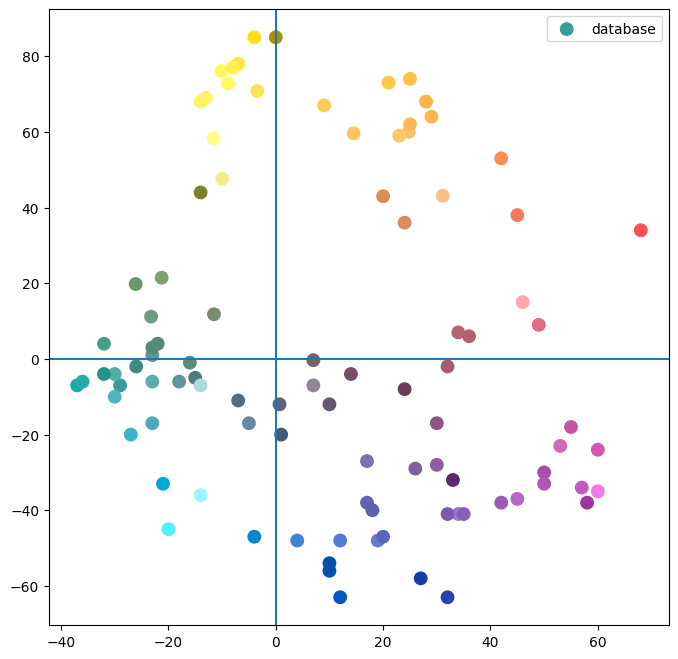

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
ax.axvline(x=0)
ax.axhline(y=0)
ax.scatter(a_,b_, c=color_list, s=80, label='database')
# ax.scatter(exp_batches_a, exp_batches_b, c=color_list_exp, marker='^', edgecolors='black', s=80, label='experimental batches')
plt.legend()

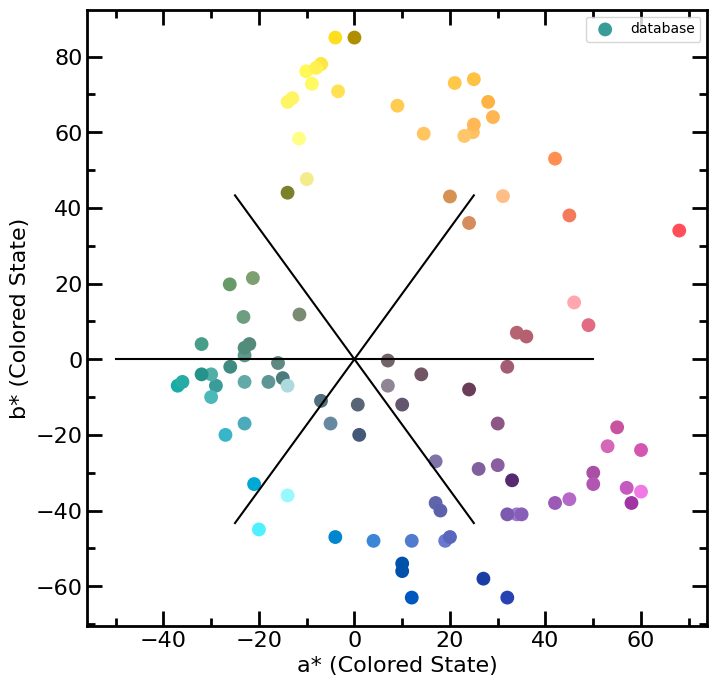

In [ ]:
from matplotlib import rc
import seaborn as sns
import matplotlib.font_manager
from scipy import stats
from matplotlib import rcParams


plt.rcParams['axes.facecolor'] = 'white'


plt.style.use('default')
import matplotlib.font_manager
rcParams["font.weight"] = "normal"
rcParams["axes.labelweight"] = "normal"
#rcParams['font.family'] = 'sans-serif'
#rcParams["font.sans-serif"] = "Helvetica"
rcParams["axes.labelsize"] = "medium"
rcParams["axes.labelweight"]= "normal"
rcParams["xtick.labelsize"] = "medium"
rcParams["ytick.labelsize"] = "medium"
rcParams['axes.facecolor'] = 'white'
rcParams['axes.grid']=False

fig, ax = plt.subplots(figsize=(8,8))
rcParams["axes.edgecolor"] = "0.15"
rcParams["axes.linewidth"]  = 1.25

plt.grid(False)

#plt.xlim(0, 1.0)
#plt.ylim(0, 1.0)
plt.xlabel('a* (Colored State)', fontsize=16)
plt.ylabel('b* (Colored State)', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.rcParams['axes.spines.top'] = True
plt.rcParams['axes.spines.bottom'] = True
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.right'] = True

ax.xaxis.label.set_color('black')
ax.tick_params(axis='x', colors='black')
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['top'].set_linewidth(2)
ax.spines['left'].set_linewidth(2)
ax.spines['bottom'].set_linewidth(2)
ax.spines['right'].set_linewidth(2)
ax.spines['left'].set_color('black')
ax.spines['right'].set_color('black')
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')
#ax.axis(aspect='equal')
ax.set(adjustable='box')#, aspect='equal')
ax.grid(False)
ax.set_facecolor('xkcd:white')
ax.axis('on')

major_ticks_x = np.arange(-80, 90, 20)
minor_ticks_x = np.arange(-80, 90, 10)
major_ticks_y = np.arange(-80, 90, 20)
minor_ticks_y = np.arange(-870, 90, 10)
ax.set_xticks(major_ticks_x)
ax.set_xticks(minor_ticks_x, minor=True)
ax.set_yticks(major_ticks_y)
ax.set_yticks(minor_ticks_y, minor=True)



# Calculate line end points for lines starting from origin at given angles
def calculate_end_points(angle_degrees, length=50):
    angle_radians = np.radians(angle_degrees)
    x_end = length * np.cos(angle_radians)
    y_end = length * np.sin(angle_radians)
    return x_end, y_end

# List of angles for lines
angles = [60, 120, 180, 240, 300, 360]

# Add lines to scatter plot
for angle in angles:
    x_end, y_end = calculate_end_points(angle)
    ax.plot([0, x_end], [0, y_end], color='black')#, label=f'{angle} degrees')

#plt.xlim(0, 1)
#plt.ylim(0, 1)
#plt.gca().set_aspect('equal', adjustable='box')

ax.scatter(a_,b_, c=color_list, s=80, label='database')
# ax.scatter(exp_batches_a, exp_batches_b, c=color_list_exp, marker='^', edgecolors='black', s=80, label='experimental batches')

ax.tick_params(axis = 'both', which='both', width=2)
ax.tick_params(axis = 'both', which='major', length=11)
ax.tick_params(axis = 'both', which='minor', length=6, color='black')
ax.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction="in")
plt.legend()
plt.savefig('color_regions.svg')

In [ ]:
import numpy as np

# Function to calculate the angle in degrees from the origin
def angle_from_origin(x, y):
    radians = np.arctan2(y, x)
    degrees = np.degrees(radians)
    return degrees % 360

# # Sample points
# a_ = [10, -20, 30, -40, 50, -60]  # x-coordinates
# b_ = [50, 40, -30, -20, 10, -5]   # y-coordinates

# Angles defining partitions
partition_angles = [60, 120, 180, 240, 300, 360]

# Calculate angles for each point and determine partitions
points_partition = []
for x, y in zip(a_, b_):
    point_angle = angle_from_origin(x, y)
    partition = None
    for i, angle in enumerate(partition_angles):
        if point_angle <= angle:
            partition = i
            break
    points_partition.append(partition)

# points_partition now contains the index of the partition each point belongs to
# Index 0 corresponds to the partition before 60 degrees, index 1 before 120 degrees, and so on.

print(points_partition)


[3, 3, 3, 5, 0, 3, 4, 5, 4, 3, 3, 3, 3, 3, 3, 0, 3, 4, 5, 5, 1, 4, 3, 3, None, 2, 2, 2, None, 3, 1, 1, 1, 1, 1, 1, 1, 0, 4, 4, 4, 5, 5, 5, 5, 4, 4, 5, 1, 5, 5, 5, 1, 1, 1, 4, 4, 4, 4, 0, 0, 1, 1, 1, 1, 5, 3, 2, 1, 0, 5, 5, 5, 5, 4, 4, 5, 5, 5, 1, 1, 1, 1, 1, 3, 4, 2, 2, 2, 2]


In [ ]:
len(points_partition)

90

In [ ]:
database_data['color_partition'] = points_partition

In [ ]:
import pandas as pd
import numpy as np

# Function to select two points with different 'num_monomers' within a partition
def select_diverse_points(df):
    if df['num_monomers'].nunique() > 1:
        # Select one point with 'num_monomers' = 2 and another with 'num_monomers' = 3
        point_2 = df[df['num_monomers'] == 2].sample(2,  random_state=0)
        point_3 = df[df['num_monomers'] == 3].sample(1,   random_state=0)
        return pd.concat([point_2, point_3])
    else:
        return pd.DataFrame()  # Return empty DataFrame if condition is not met

# List to store selected points from all partitions
selected_points_list = []

for i in set(database_data.color_partition.values):
    # Filter the DataFrame for the current partition
    df_partition = database_data[database_data.color_partition == i]

    # Select diverse points from the current partition
    selected_points = select_diverse_points(df_partition)
    if not selected_points.empty:
        selected_points_list.append(selected_points)

# Concatenate all selected points into a single DataFrame
selected_points_df = pd.concat(selected_points_list)

# Display or process the selected points
# print(selected_points_df)

In [ ]:
selected_points_df

,index,monomer_A,smiles1,percentage_1,monomer_B,smiles2,percentage_2,monomer_C,smiles3,percentage_3,ratios,num_monomers,color,L* (Colored State),a* (Colored State),b*(Colored State),Citation,Link,Year,color_partition
0,40,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,67.0,phenylene,C1=CC(=CC=C1C)C,33.0,0,0,0.0,67_33,2,yellow,85.60,31.100,43.10,"Macromolecules, 47, 5462-5469 (2014)",DOI: 10.1021/ma501080u,2014,0.0
1,4,"3,4-bis(2-ethylhexyloxy)thiophene (DOT-(OEtHx)2)",Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,86.0,"2,1,3-benzothiadiazole (BTD",Cc1ccc(C)c2nsnc12,14.0,0,0,0.0,86_14,2,black,52.00,34.000,7.00,"Nature Materials, 2008, 7, 795–799",DOI:10.1038/nmat2272,2008,0.0
2,76,"3,4-dioctylthiophene (DAT)",Cc1sc(C)c(CCCCCCCC)c1CCCCCCCC,40.0,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,40.0,biEDOT,Cc3sc(c2sc(C)c1OCCOc12)c4OCCOc34,20.0,40_40_20,3,red,51.00,36.000,6.00,"Chem. Mater.,31, 17, 6841-6849 (2019)",DOI: 10.1021/acs.chemmater.9b01294,2019,0.0
3,68,"3,4-dioctylthiophene (DAT)",Cc1sc(C)c(CCCCCCCC)c1CCCCCCCC,50.0,"3,4-(1,3-dimethylpropylene)dioxythiophene (DMP)",Cc1sc(C)c2OC(C)CC(C)Oc12,50.0,0,0,0.0,50_50,2,orange,87.00,23.000,59.00,"Macromolecules, 51(22), 9250-9258 (2018)",DOI: 10.1021/acs.macromol.8b01789,2018,1.0
4,33,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,50.0,phenylene,C1=CC(=CC=C1C)C,50.0,0,0,0.0,50_50,2,yellow,97.40,-8.910,72.80,"Macromolecules, 47, 5462-5469 (2014)",DOI: 10.1021/ma501080u,2014,1.0
5,75,"3,4-dioctylthiophene (DAT)",Cc1sc(C)c(CCCCCCCC)c1CCCCCCCC,50.0,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,25.0,biEDOT,Cc3sc(c2sc(C)c1OCCOc12)c4OCCOc34,25.0,50_25_25,3,orange,66.00,20.000,43.00,"Chem. Mater.,31, 17, 6841-6849 (2019)",DOI: 10.1021/acs.chemmater.9b01293,2019,1.0
6,74,"3,4-bis(2-ethylhexyloxy)thiophene (DOT-(OEtHx)2)",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,80.0,"2,1,3-benzothiadiazole (BTD)",Cc1ccc(C)c2nsnc12,20.0,0,0,0.0,80_20,2,green,60.00,-32.000,4.00,"Adv. Optical Mater. 6, 1800594, (2018)",DOI: 10.1002/adom.201800594,2018,2.0
7,29,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,80.0,"2,1,3-benzothiadiazole (BTD)",Cc1ccc(C)c2nsnc12,20.0,0,0,0.0,80_20,2,green,59.00,-23.000,1.00,"Chem. Mater., 24, 255-268 (2012)",DOI: 10.1021/cm202117d,2012,2.0
8,98,"3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...",Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,50.0,"2,1,3-benzothiadiazole (BTD)",Cc1ccc(C)c2nsnc12,25.0,"2,7-fluorene",Cc1ccc3c(c1)Cc2cc(C)ccc23,25.0,50_25_25,3,green,60.99,-23.229,11.17,"\tPolym. Chem., 2018, 9, 5262-5267",https://pubs.rsc.org/en/content/articlelanding...,2018,2.0
9,13,"3,4-propylenedioxythiophene (ProDOT)",Cc1sc(C)c2OCC(CCOCC(CC)CCCC)(CCOCC(CC)CCCCC)COc12,67.0,"2,1,3-benzothiadiazole (BTD)",Cc1ccc(C)c2nsnc12,33.0,0,0,0.0,67_33,2,blue,68.00,-27.000,-20.00,"Adv. Mater.2010,22,724–728",DOI: 10.1002/adma.200902917,2010,3.0


In [ ]:
# Ensure the data has unique indices (if you haven't already done so)
database_data.reset_index(drop=True, inplace=True)
selected_points_df.reset_index(drop=True, inplace=True)

# Remove the selected points from the original database_data DataFrame
# by dropping rows that have indices present in selected_points_df
updated_database_data = database_data.drop(selected_points_df.index)

# Verify the result
print(updated_database_data)


    index                                         monomer_A   \
18     21  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
19     22  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
20     23                                          phenylene   
21     24                   3,4-di(2-ethylhexyloxy)thiophene   
22     25                           3,4-di(methoxy)thiophene   
..    ...                                                ...   
85     94  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
86     95  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
87     96  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
88     97  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   
89     98  3,3-Bis-(2-ethyl-hexyloxymethyl)-3,4-dihydro-2...   

                                           smiles1  percentage_1  \
18  *c1sc(*)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          75.0   
19  *c1sc(*)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          76.0   
20                         

# ML

In [ ]:
# electrochromics = pd.read_csv('/content/electrochromics_literature_only.csv')
electrochromics = pd.read_csv('/content/literature_only_dataset_with_abs.csv')#_corrected.csv')
# electrochromics = selected_points_df

electrochromics['smiles_A'] = electrochromics['smiles_A'].str.replace('*', 'C')
electrochromics['smiles_B'] = electrochromics['smiles_B'].str.replace('*', 'C')
electrochromics['smiles_C'] = electrochromics['smiles_C'].str.replace('*', 'C')

df=electrochromics#[electrochromics.num_monomers !=1]
df = df[['smiles_A', 'Percentage of A %', 'smiles_B' , 'Percentage of B %', 'smiles_C', 'Percentage of C %', 'L* (Colored State)', 'a* (Colored State)', 'b*(Colored State)', 'wavelength', 'intensity']]
df['Percentage of A %'] = df['Percentage of A %']/100
df['Percentage of B %'] = df['Percentage of B %']/100
df['Percentage of C %'] = df['Percentage of C %']/100
df_external = df.dropna(axis=0)
df_external

<ipython-input-3-613b73035fa1>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Percentage of A %'] = df['Percentage of A %']/100
<ipython-input-3-613b73035fa1>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Percentage of B %'] = df['Percentage of B %']/100
<ipython-input-3-613b73035fa1>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

,smiles_A,Percentage of A %,smiles_B,Percentage of B %,smiles_C,Percentage of C %,L* (Colored State),a* (Colored State),b*(Colored State),wavelength,intensity
0,Cc1sc(C)c2OCC(COCCCCCCCC)(COCCCCCCCC)COc12,0.670,Cc4ccc(c2ccc(c1ccc(C)s1)c3nsnc23)s4,0.330,0,0.000,59.00,-29.000,-7.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.217252981089, 0.217252981089, 0.217252981089..."
1,Cc1sc(C)c2OCC(COCCCCCCCC)(COCCCCCCCC)COc12,0.670,Cc5sc(c3ccc(c2sc(C)c1OCCOc12)c4nsnc34)c6OCCOc56,0.330,0,0.000,66.00,-30.000,-4.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.0803381452932, 0.0803381452932, 0.0803381452..."
2,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.670,Cc1ccc(C)c2nsnc12,0.330,0,0.000,64.00,-37.000,-7.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.36196319, 0.36196319, 0.36196319, 0.36196319..."
3,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.800,Cc1ccc(C)c2nsnc12,0.200,0,0.000,57.00,7.000,-7.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.382716049, 0.382716049, 0.382716049, 0.38271..."
4,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.860,Cc1ccc(C)c2nsnc12,0.140,0,0.000,52.00,34.000,7.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.634146341, 0.634146341, 0.634146341, 0.63414..."
...,...,...,...,...,...,...,...,...,...,...,...
79,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.700,Cc1ccc(C)c2nsnc12,0.150,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.150,94.00,-14.000,-36.00,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.485426704424, 0.485426704424, 0.485426704424..."
80,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.675,Cc1ccc(C)c2nsnc12,0.150,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.175,55.88,-11.510,11.81,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.482028416365, 0.481519064672, 0.481814067659..."
81,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.625,Cc1ccc(C)c2nsnc12,0.175,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.200,62.41,-21.260,21.45,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.456441874123, 0.461365382218, 0.467085400343..."
82,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.575,Cc1ccc(C)c2nsnc12,0.200,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.225,58.67,-26.100,19.78,"350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356....","0.530368484283, 0.53589768457, 0.542808329361,..."


In [ ]:
external_val_lab_scaled = df_external.intensity#.tolist()
# import ast
# ast.literal_eval(external_val_lab_scaled[i] for i in range(df_external.shape[0]))
external_val_lab_scaled.values[0]

'0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.21858296147, 0.219912941851, 0.221242923266, 0.222572903647, 0.224211182078, 0.226073155025, 0.227935127972, 0.22979710092, 0.2316590749, 0.233535685959, 0.235475240897, 0.237414795835, 0.239354351806, 0.241293906744, 0.243233462715, 0.245173017654, 0.247112572592, 0.249052128563, 0.251647263256, 0.25475055219, 0.257853841124, 0.260957129025, 0.264060417959, 0.267342152394, 0.271479870284, 0.275617588174, 0.279755306064, 0.283893023954, 0.287698944306, 0.290802232207, 0.293905521141, 0.297008810075, 0.300112097976, 0.30321538691, 0.306318674811, 0.309642232716, 0.313004128631, 0.316366024546, 0.319727920461, 0.323089816376, 0.326451712291, 0.330242529665, 0.334725057207, 0.339207584749, 0.343690113324, 0.348172640866, 0.353570634042, 0.359777210877, 0.365983787712, 0.37196033649, 0.37739109135, 0.382821847243,

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, find_peaks_cwt
import os

from scipy.signal import savgol_filter

def apply_savgol_filter(y, window_size, poly_order):
    """
    Apply a Savitzky-Golay filter to a 1D array.

    Parameters:
    y (array_like): The input signal.
    window_size (int): The size of the moving window. Must be odd.
    poly_order (int): The order of the polynomial used to fit the samples.

    Returns:
    numpy.ndarray: The smoothed signal.
    """
    return savgol_filter(y, window_size, poly_order)

0
451
451


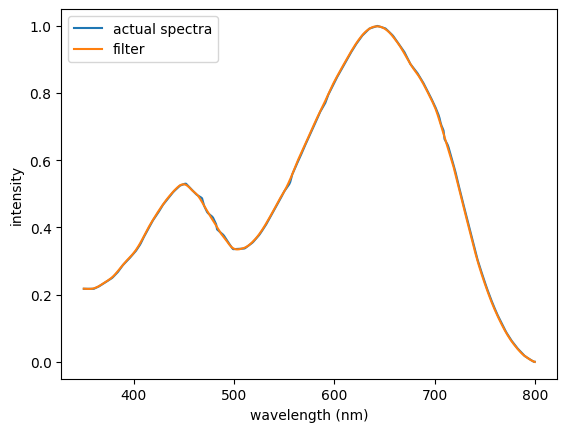

1
451
451


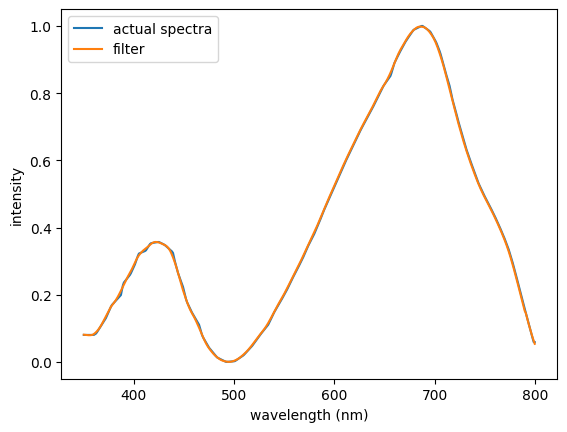

2
451
451


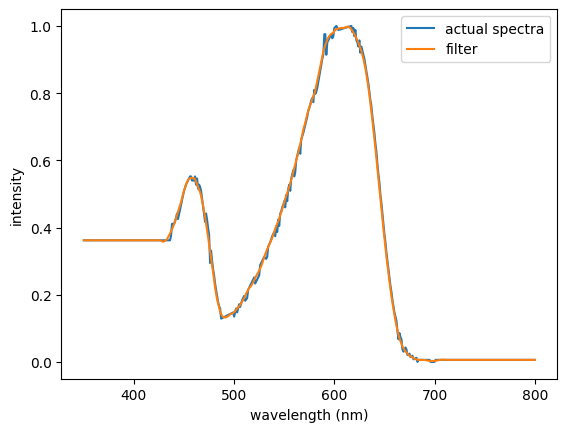

3
451
451


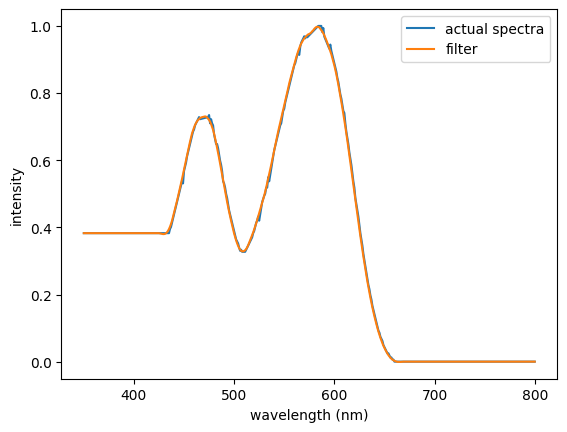

4
451
451


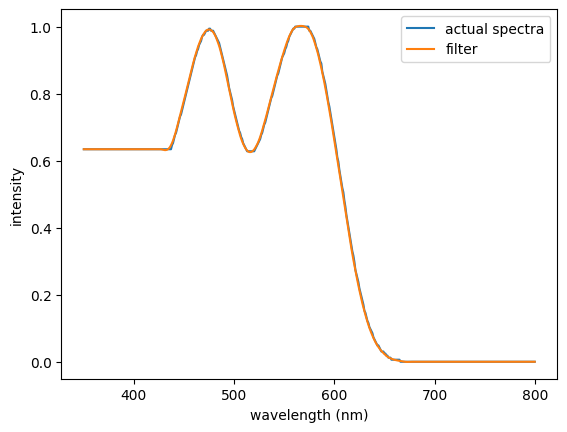

5
451
451


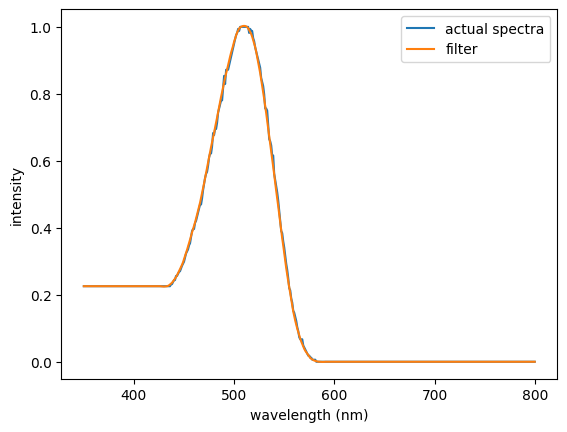

6
451
451


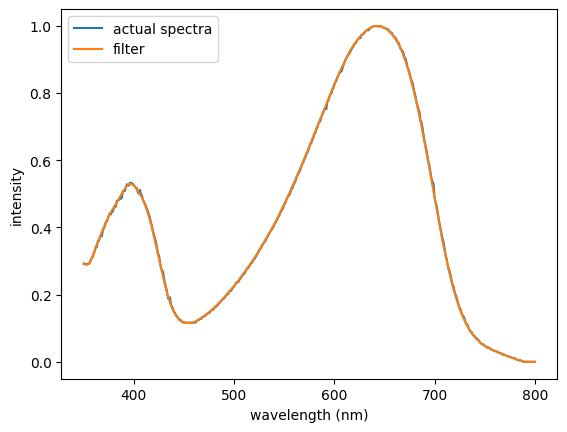

7
451
451


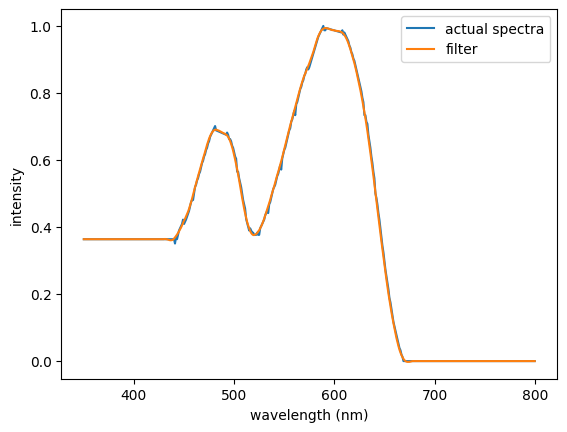

8
451
451


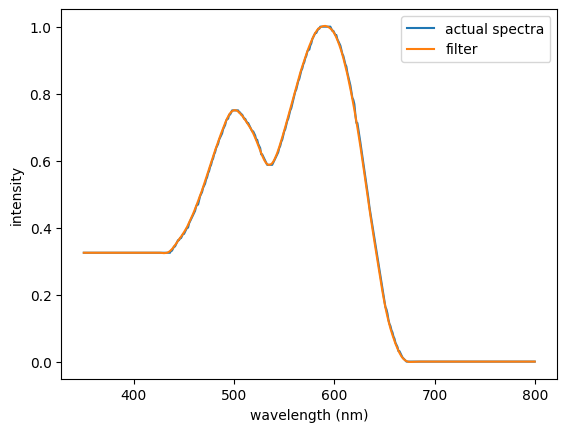

9
451
451


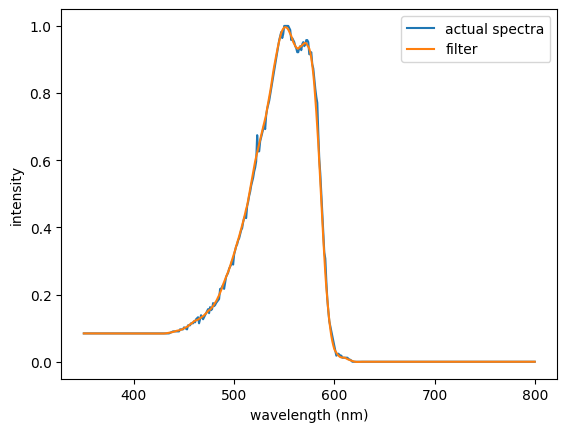

10
451
451


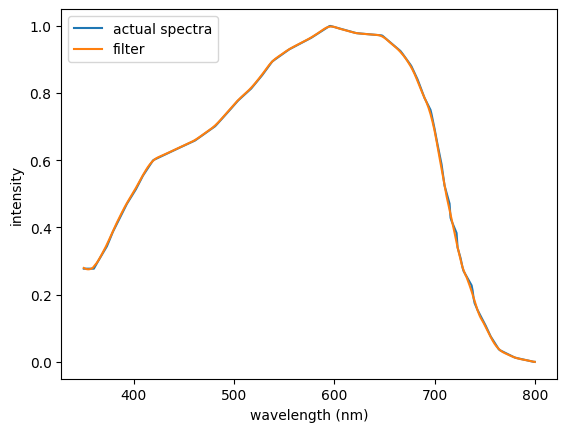

11
451
451


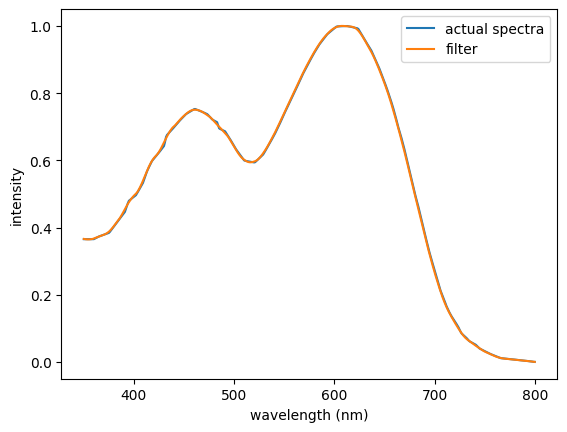

12
451
451


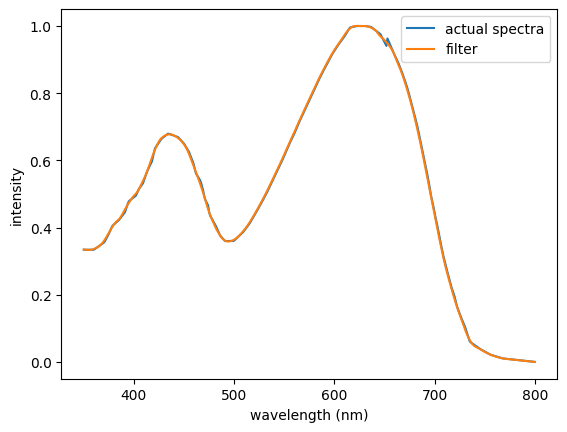

13
451
451


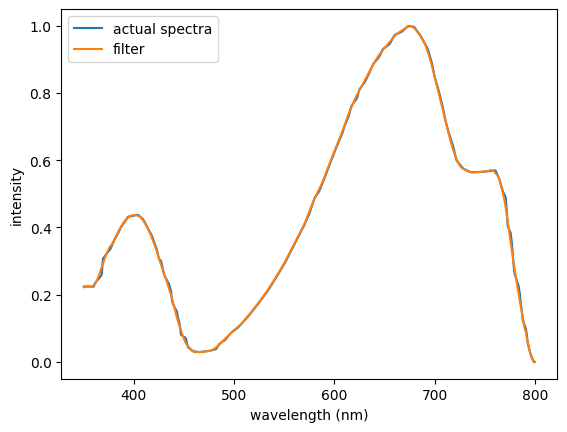

14
451
451


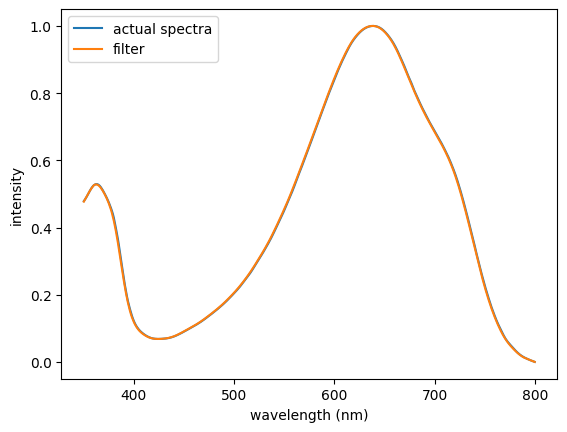

15
451
451


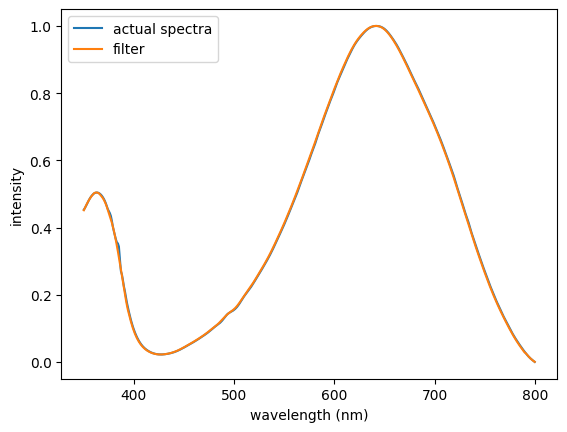

16
451
451


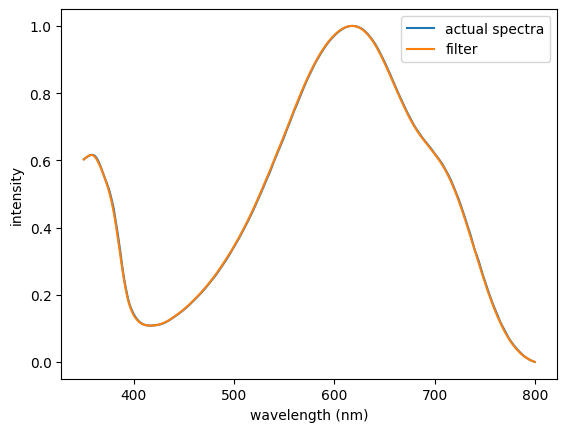

17
451
451


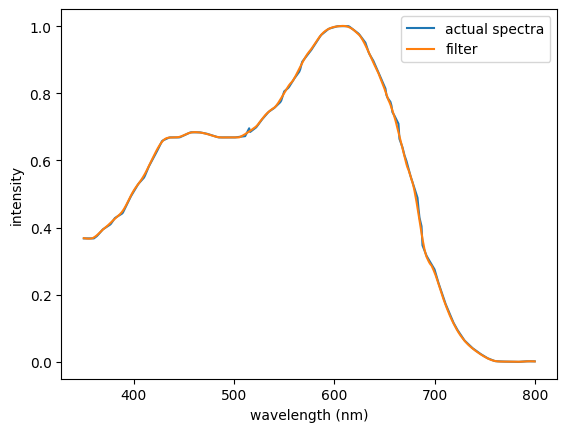

18
451
451


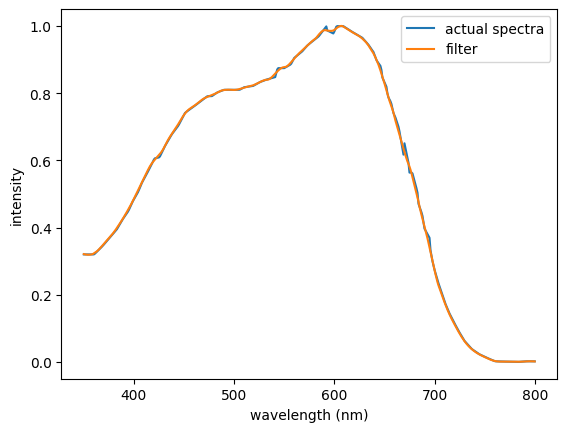

19
451
451


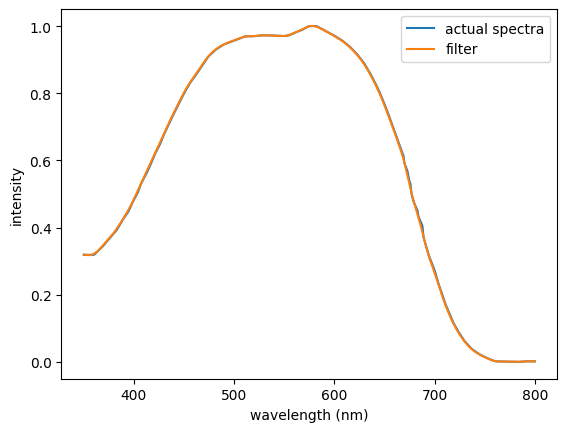

20
451
451


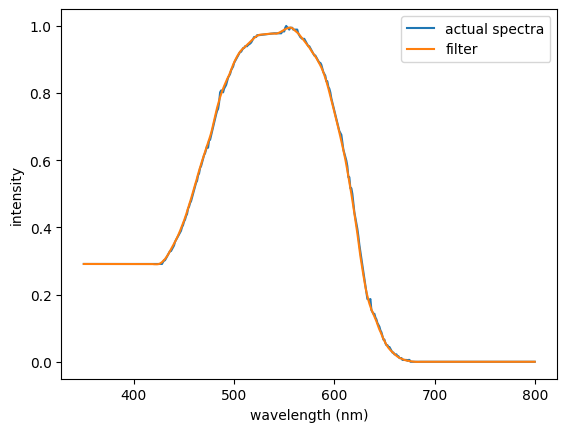

21
451
451


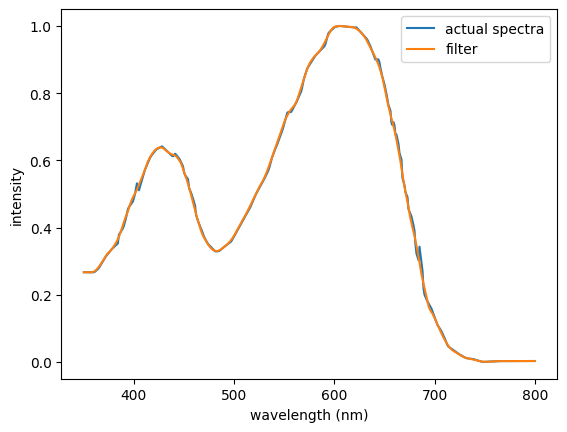

22
451
451


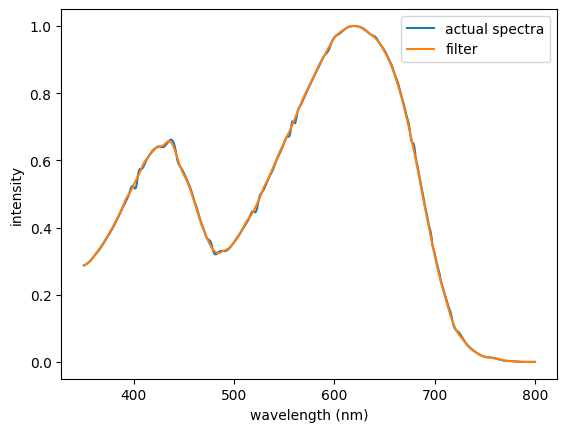

23
451
451


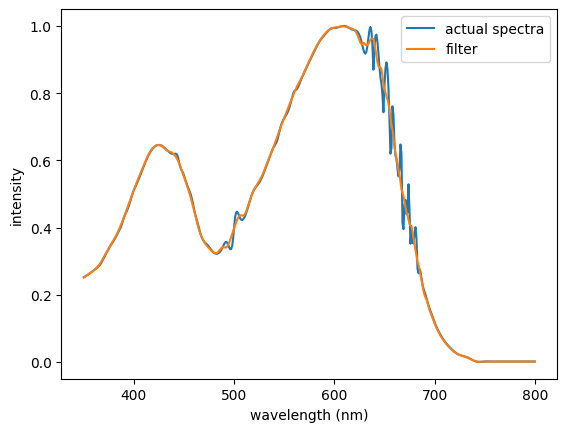

24
451
451


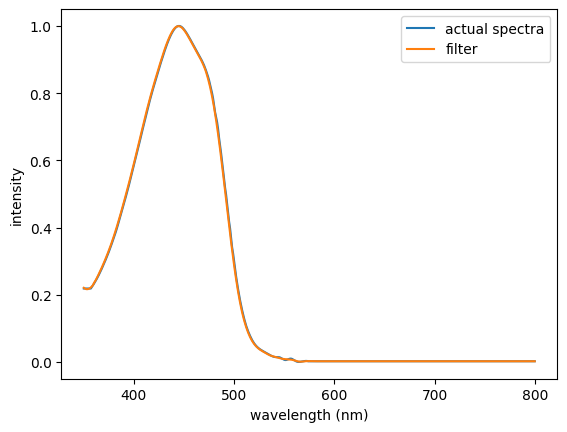

25
451
451


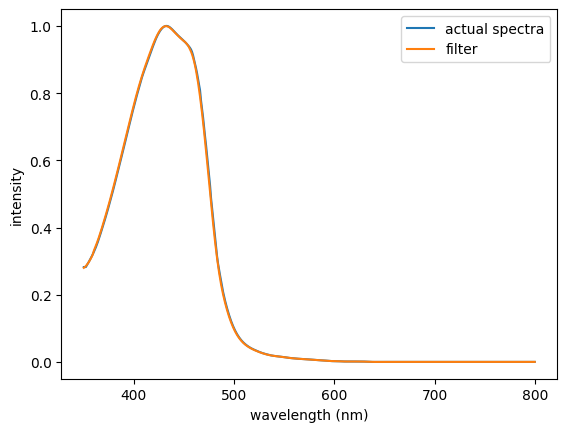

26
451
451


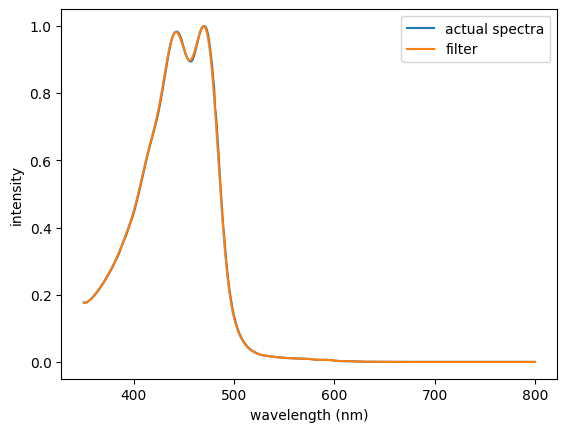

27
451
451


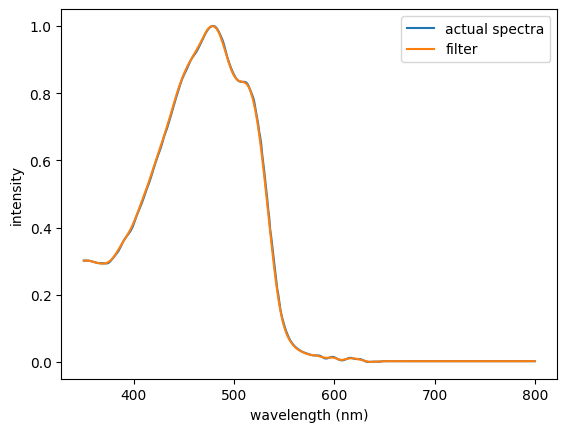

28
451
451


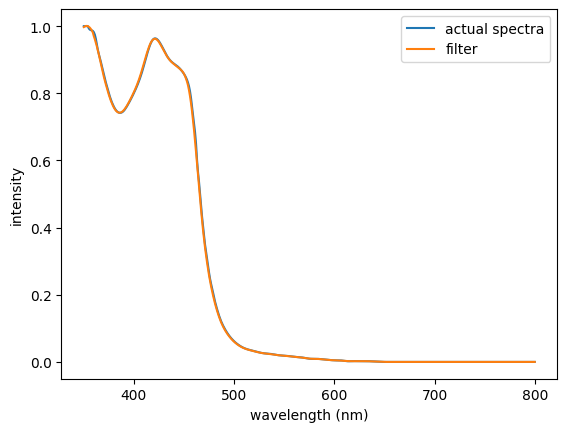

29
451
451


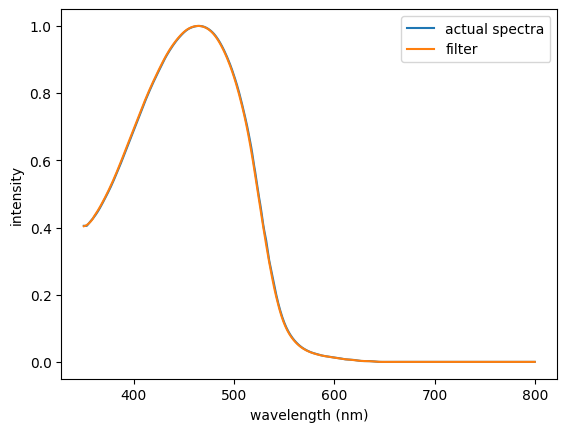

30
451
451


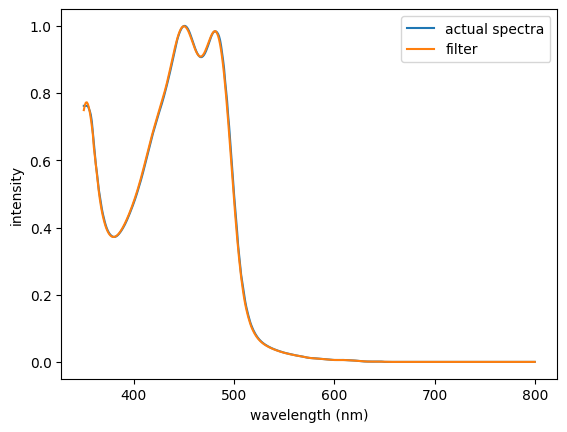

31
451
451


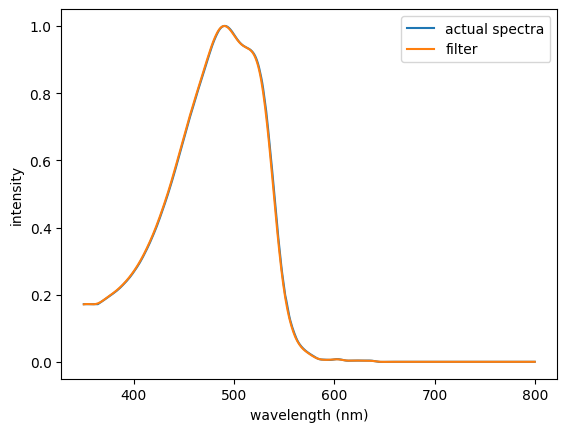

32
451
451


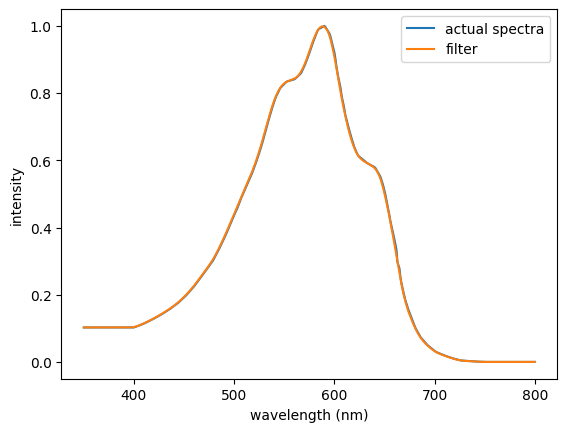

33
451
451


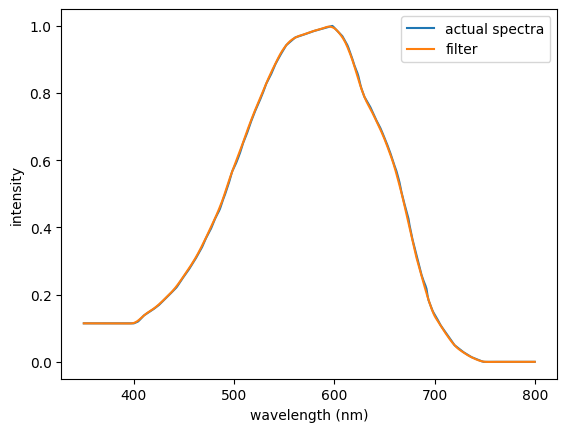

34
451
451


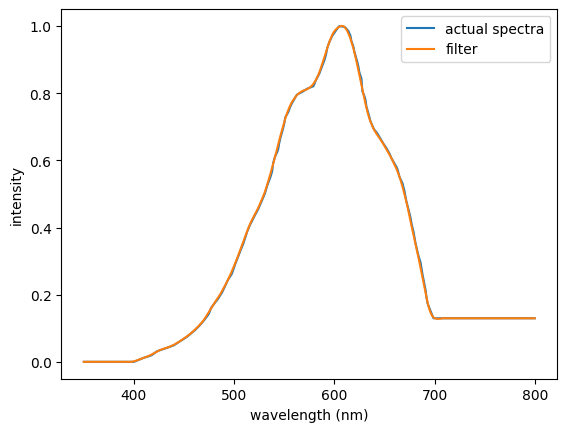

35
451
451


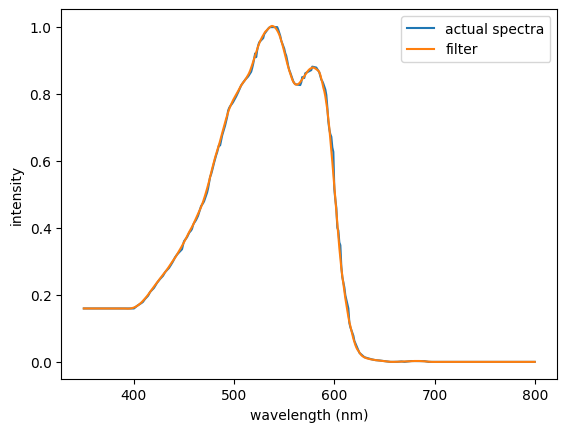

36
451
451


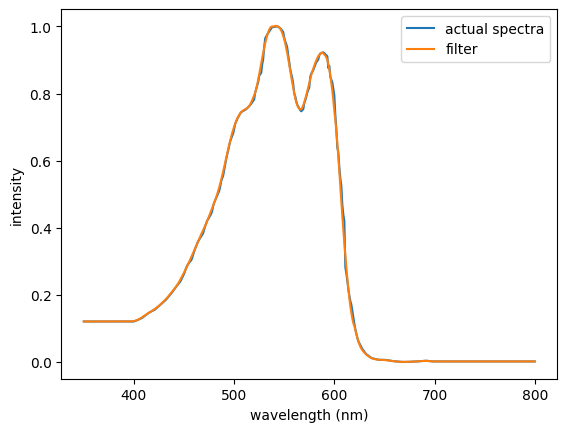

37
451
451


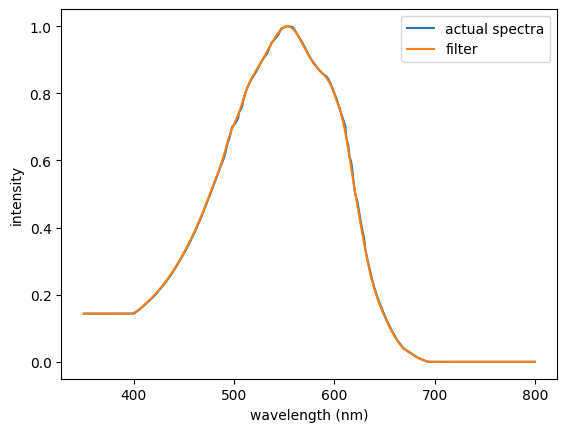

38
451
451


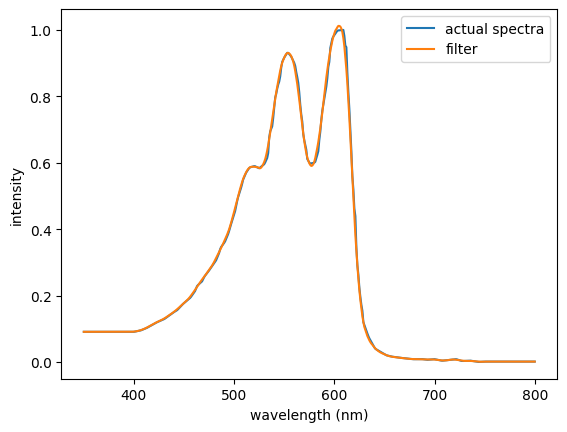

39
451
451


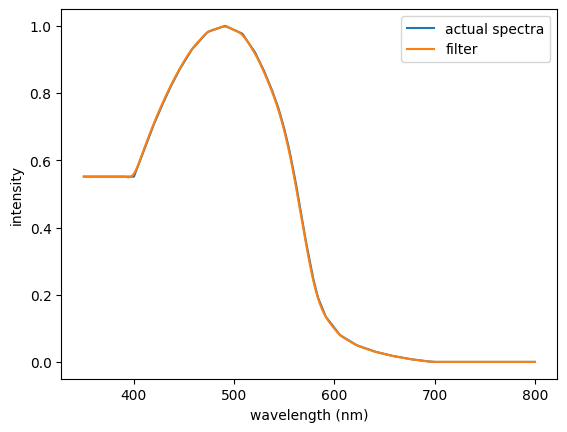

40
451
451


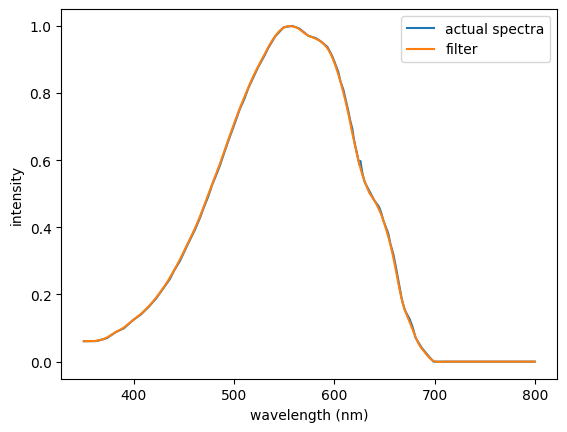

41
451
451


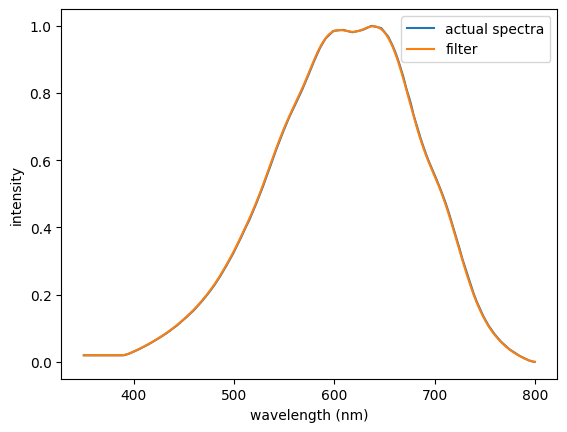

42
451
451


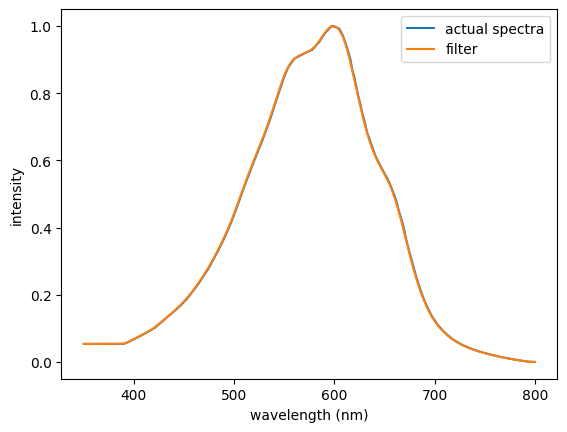

43
451
451


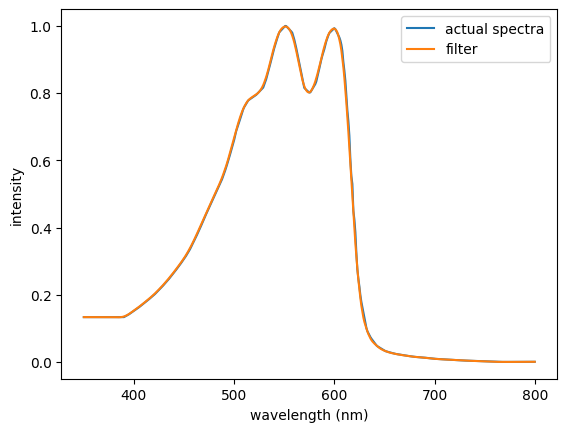

44
451
451


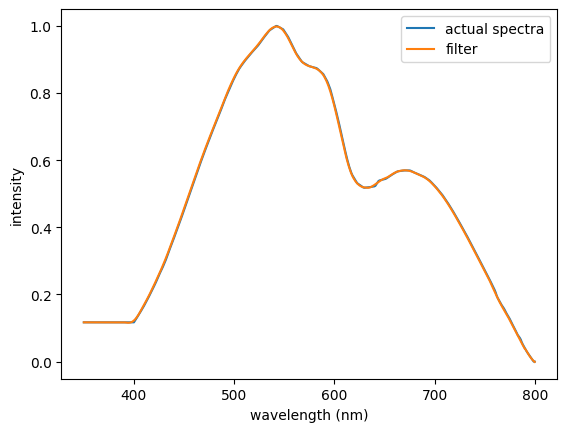

45
451
451


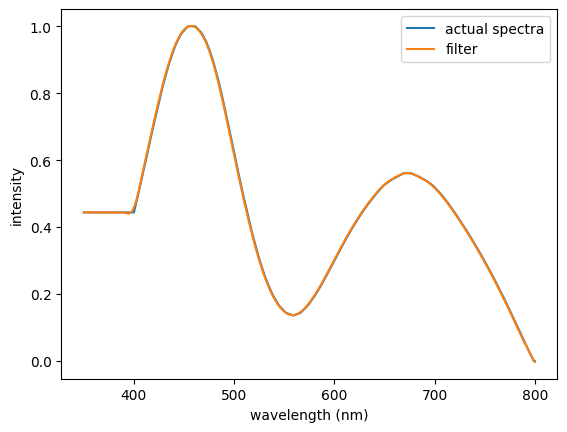

46
451
451


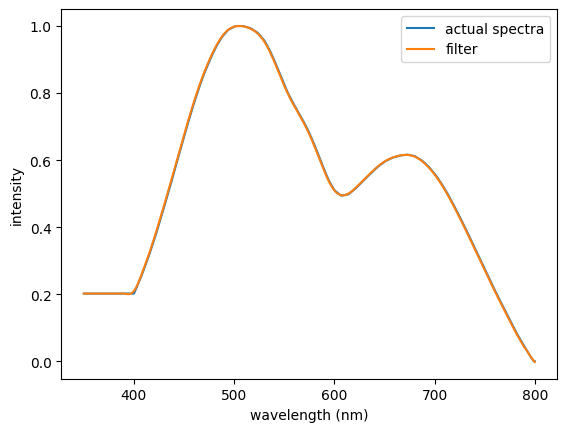

47
451
451


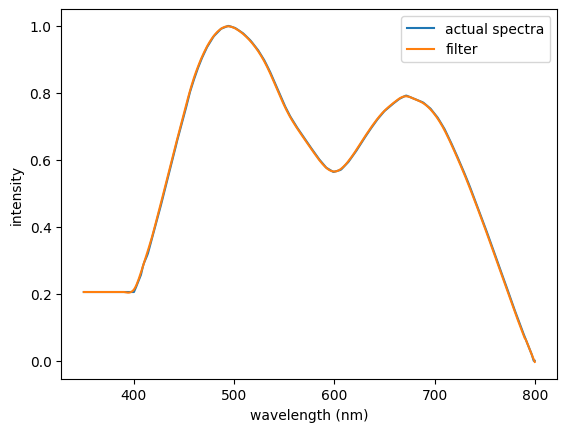

48
451
451


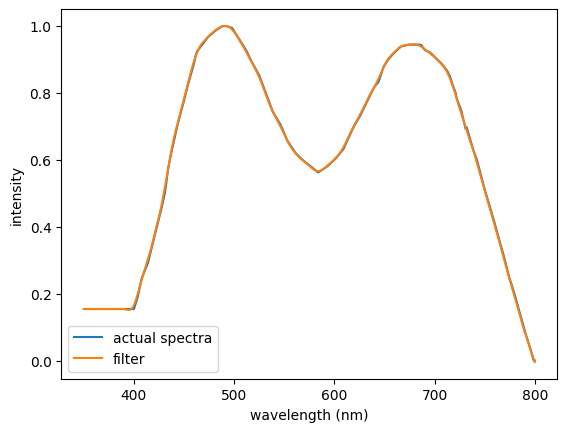

49
451
451


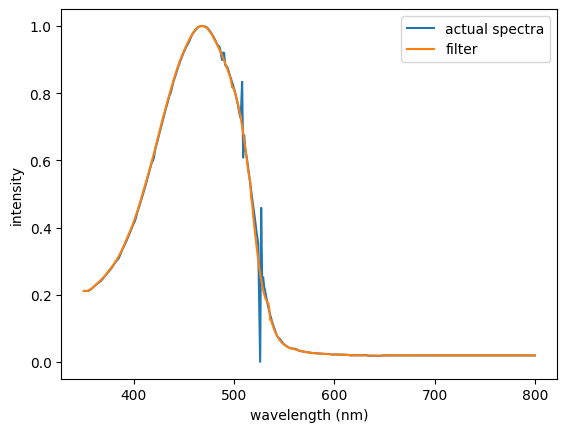

50
451
451


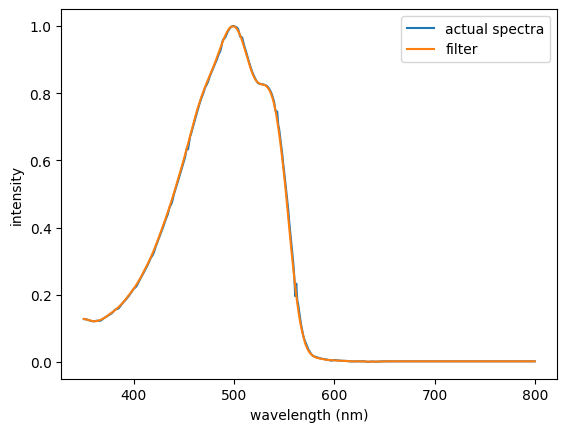

51
451
451


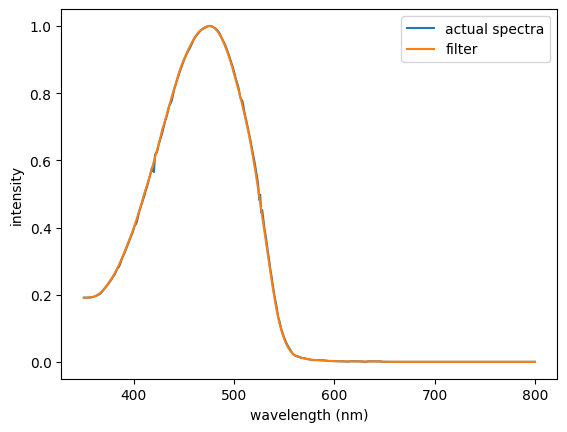

52
451
451


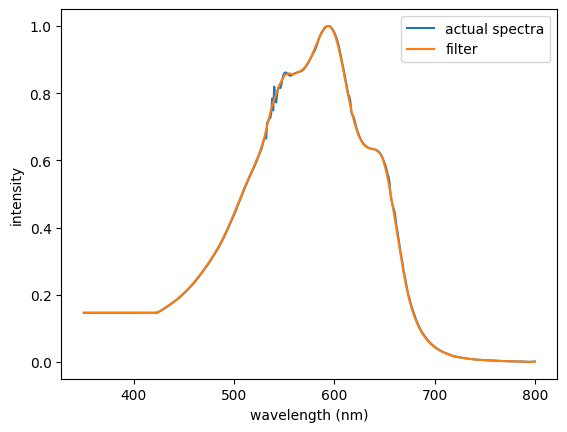

53
451
451


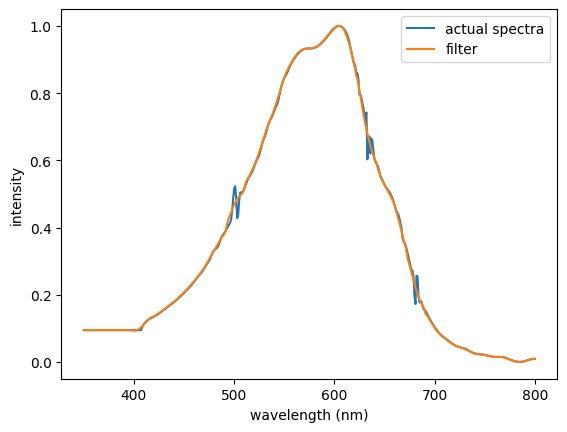

54
451
451


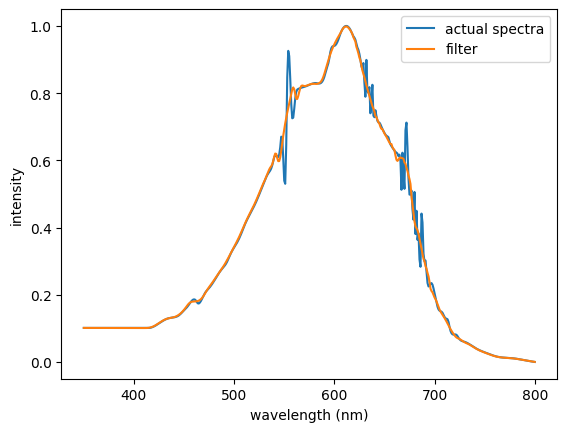

55
451
451


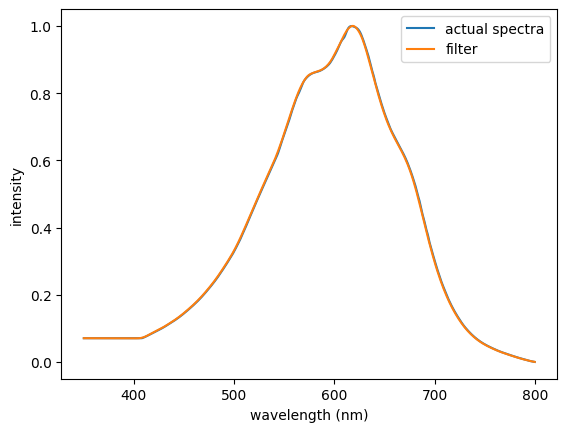

56
451
451


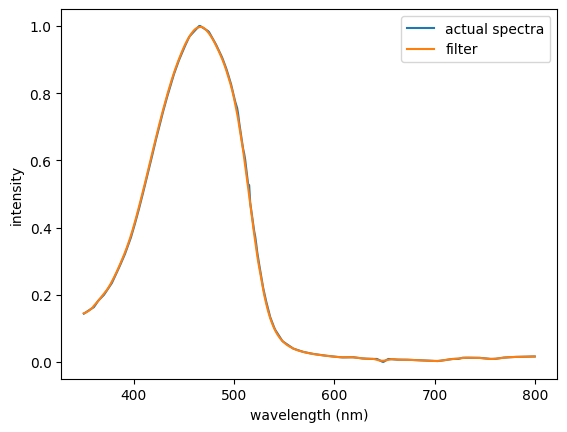

57
451
451


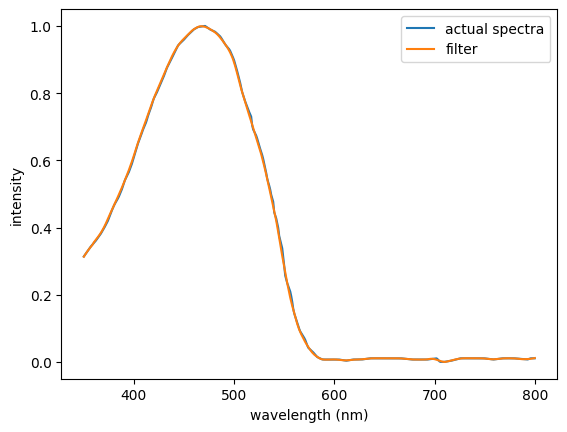

58
451
451


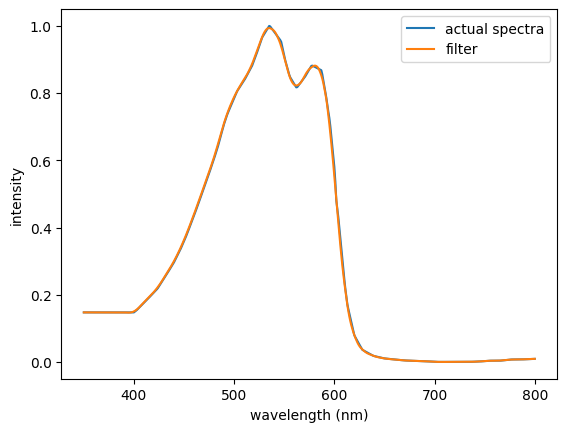

59
451
451


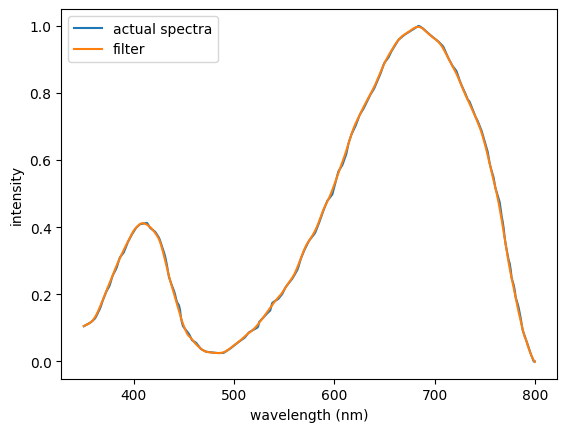

60
451
451


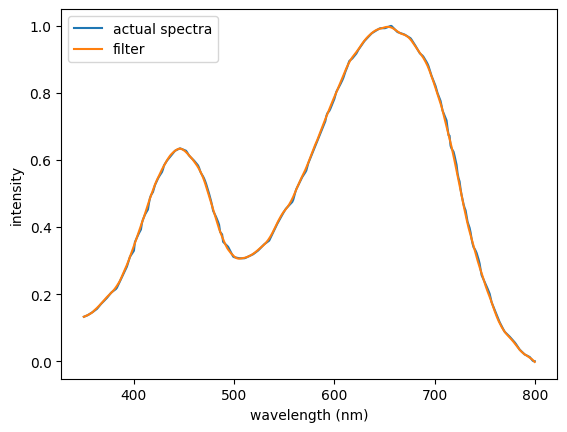

61
451
451


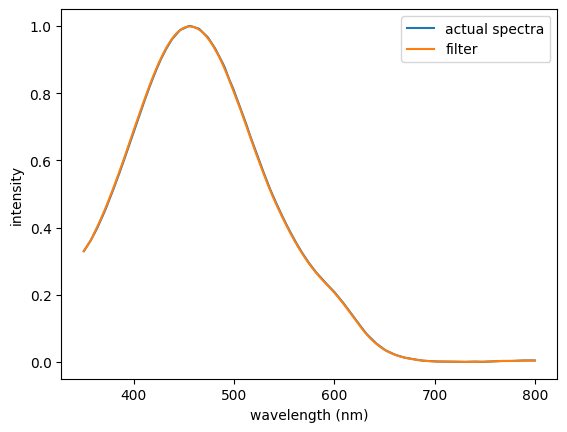

62
451
451


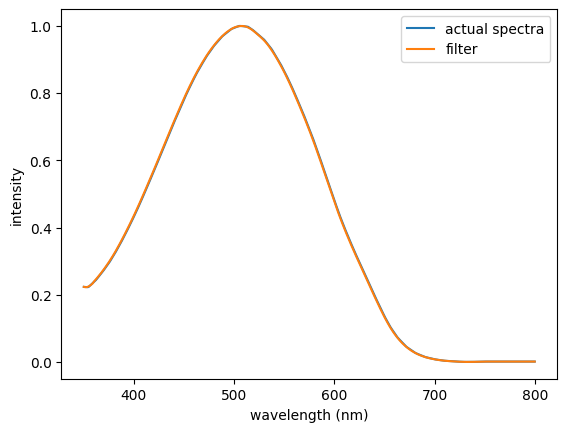

63
451
451


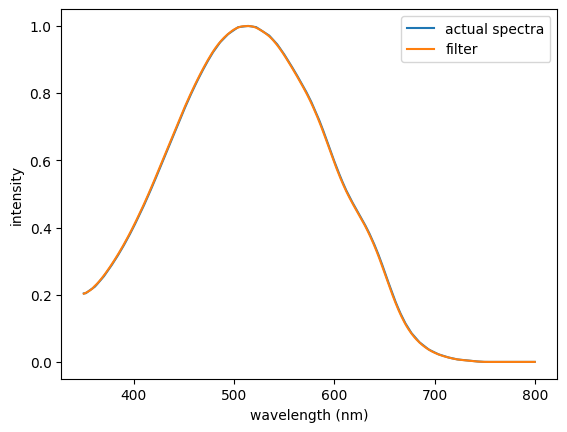

64
451
451


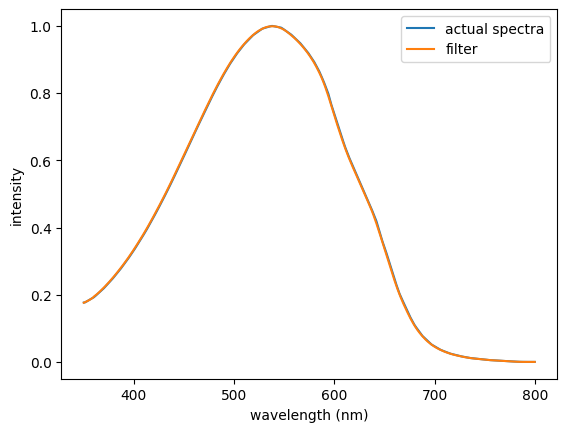

65
451
451


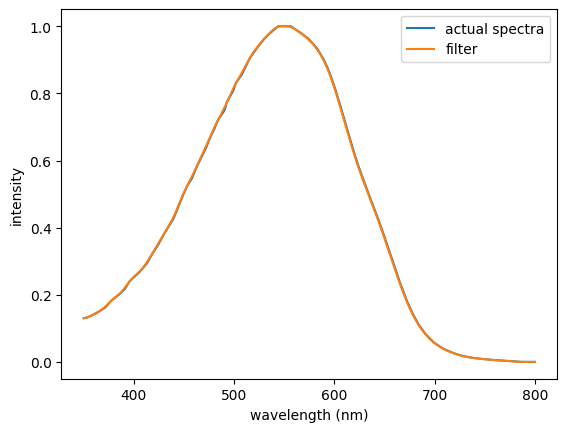

66
451
451


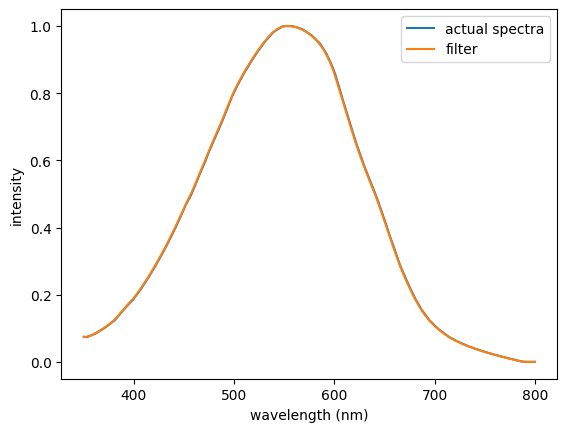

67
451
451


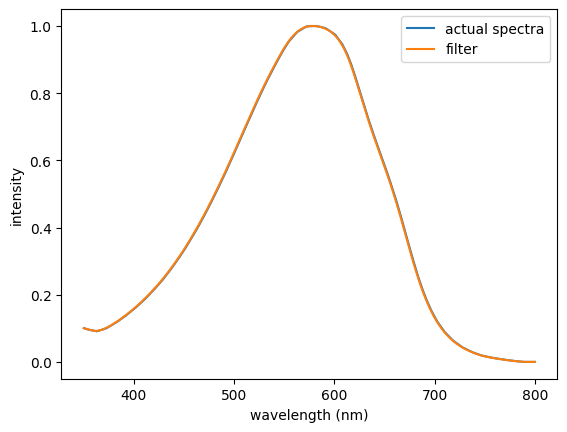

68
451
451


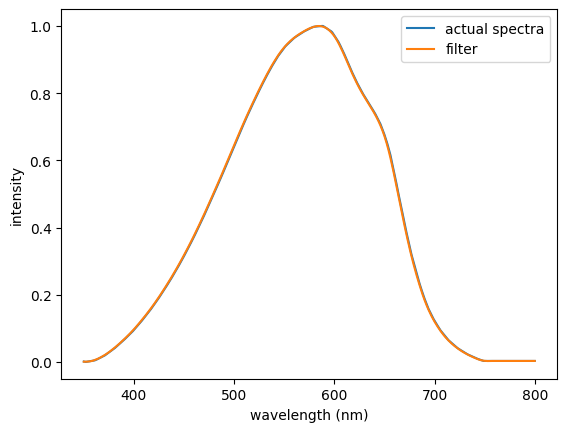

69
451
451


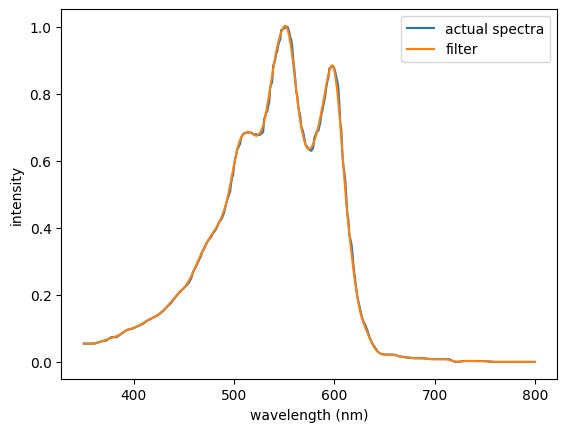

70
451
451


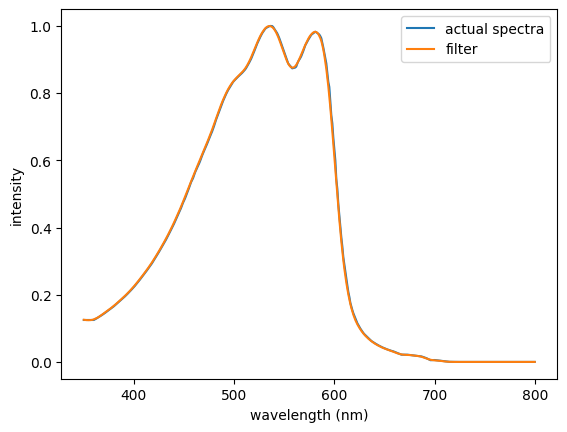

71
451
451


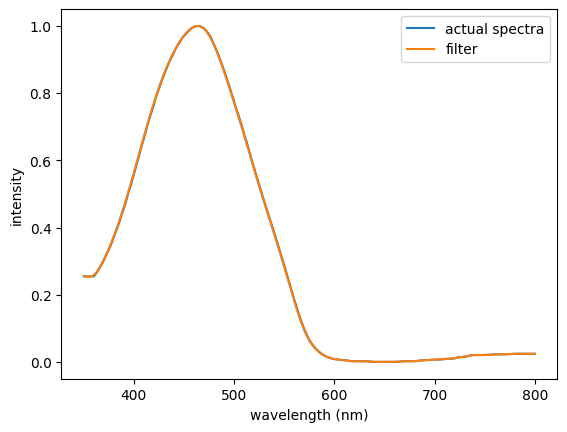

72
451
451


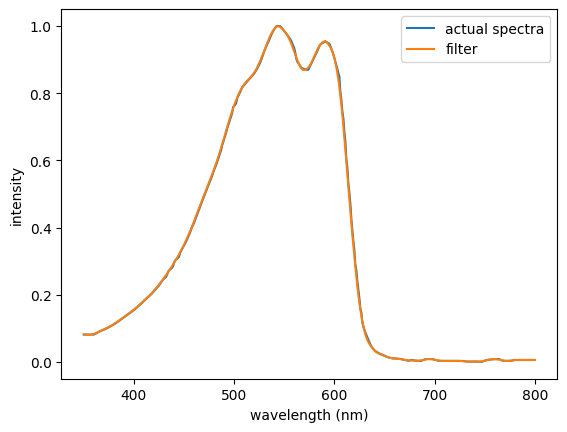

73
451
451


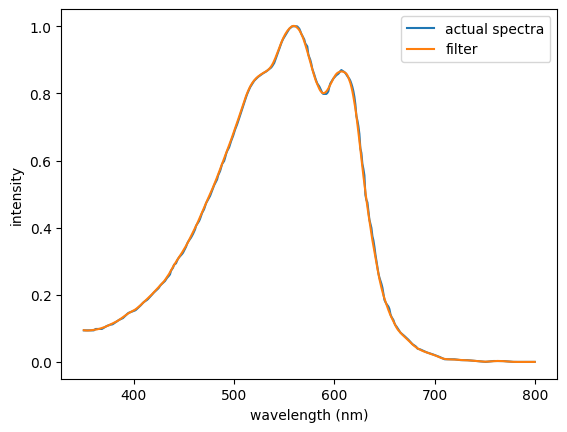

74
451
451


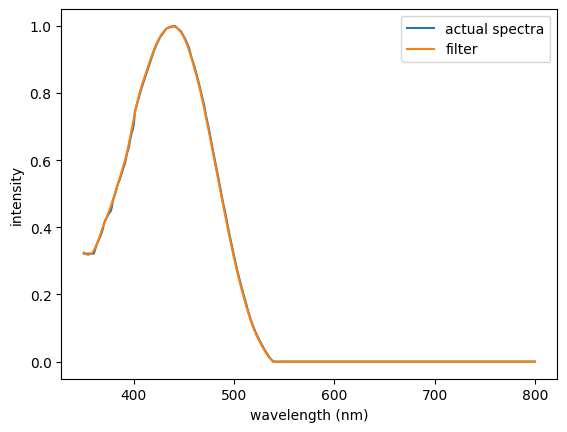

75
451
451


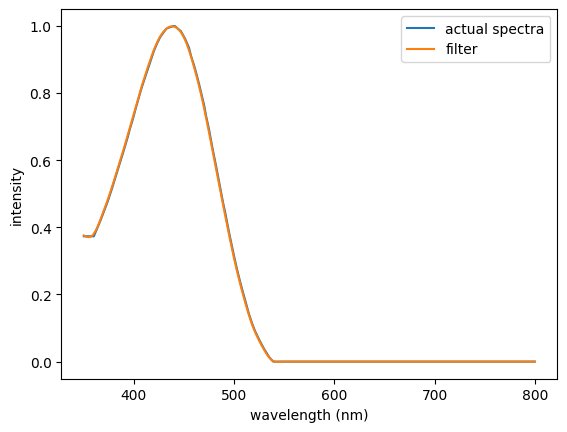

76
451
451


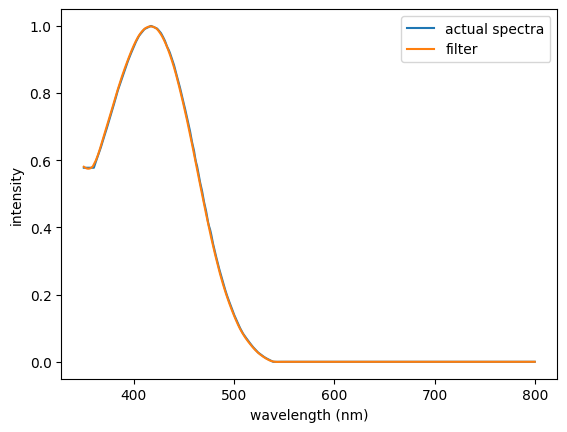

77
451
451


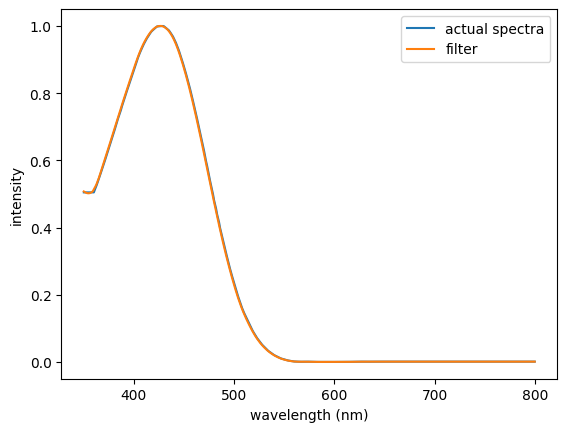

78
451
451


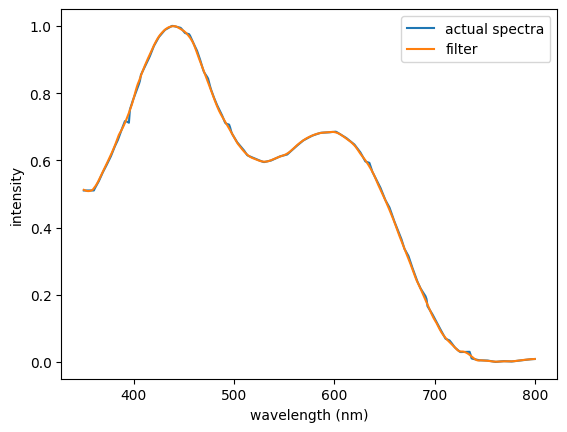

79
451
451


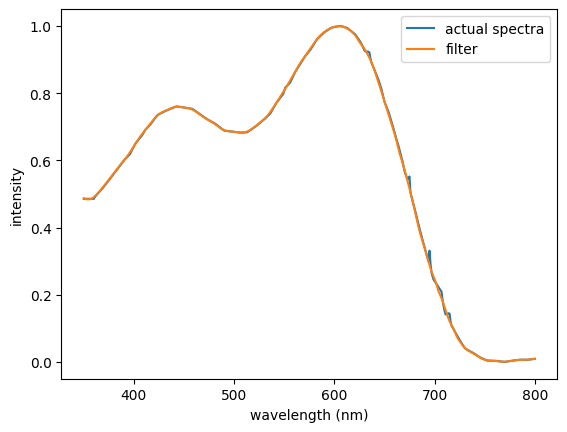

80
451
451


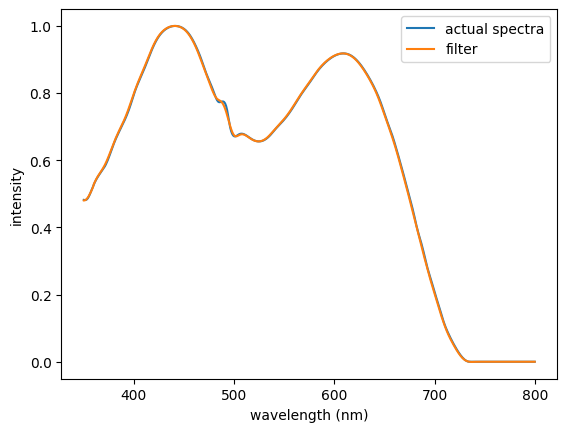

81
451
451


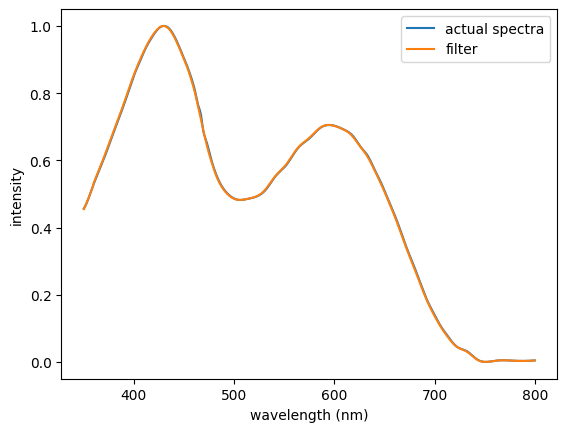

82
451
451


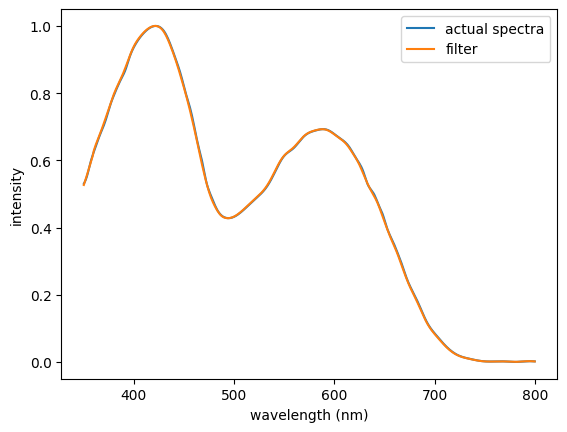

83
451
451


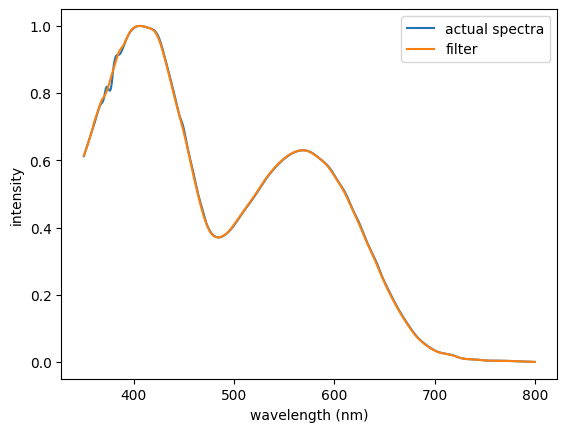

In [ ]:
df_y = []

for i in range(electrochromics.shape[0]):
  print(i)
  print(len(ast.literal_eval(electrochromics.intensity[i])))
  y=apply_savgol_filter(ast.literal_eval(electrochromics.intensity[i]), window_size=20, poly_order=3)
  print(len(y))
  plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), ast.literal_eval(electrochromics.intensity[i]), label = 'actual spectra')
  plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), y, label = 'filter')
  df_y.append(y)
  # plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), y_pred[i], label = 'set transformer prediction')
  plt.xlabel('wavelength (nm)')
  plt.ylabel('intensity')
  plt.legend()
  plt.show()

In [ ]:
df_y = []
for i in range(df_external.shape[0]):
  print(i)
  df_y.append(ast.literal_eval(ast.literal_eval(electrochromics.intensity[i])))


0


ValueError: malformed node or string: (0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.217252981089, 0.21858296147, 0.219912941851, 0.221242923266, 0.222572903647, 0.224211182078, 0.226073155025, 0.227935127972, 0.22979710092, 0.2316590749, 0.233535685959, 0.235475240897, 0.237414795835, 0.239354351806, 0.241293906744, 0.243233462715, 0.245173017654, 0.247112572592, 0.249052128563, 0.251647263256, 0.25475055219, 0.257853841124, 0.260957129025, 0.264060417959, 0.267342152394, 0.271479870284, 0.275617588174, 0.279755306064, 0.283893023954, 0.287698944306, 0.290802232207, 0.293905521141, 0.297008810075, 0.300112097976, 0.30321538691, 0.306318674811, 0.309642232716, 0.313004128631, 0.316366024546, 0.319727920461, 0.323089816376, 0.326451712291, 0.330242529665, 0.334725057207, 0.339207584749, 0.343690113324, 0.348172640866, 0.353570634042, 0.359777210877, 0.365983787712, 0.37196033649, 0.37739109135, 0.382821847243, 0.388252602103, 0.393683356963, 0.399198919896, 0.404715877427, 0.410232833925, 0.415749791456, 0.421111910412, 0.4254565143, 0.429801118188, 0.434145722076, 0.438490325963, 0.442834929851, 0.447697096867, 0.452739940739, 0.457782784611, 0.462825628483, 0.467303230513, 0.471027176407, 0.474751122302, 0.478475068196, 0.482199015123, 0.485922961018, 0.489646906912, 0.49337085384, 0.497094799734, 0.500818745629, 0.504542692556, 0.507697841933, 0.510542522853, 0.513387203774, 0.516231884694, 0.519076565614, 0.521921247568, 0.524460617977, 0.525589087244, 0.526717555478, 0.527846023711, 0.528974491945, 0.530102961212, 0.530182045236, 0.527078756302, 0.523975468401, 0.520872179467, 0.517768890533, 0.514665602632, 0.511562313698, 0.508459025797, 0.505355736863, 0.502252448962, 0.499149160028, 0.496624705616, 0.494762732669, 0.492900759722, 0.491038786774, 0.489176813827, 0.486635630441, 0.475774120721, 0.464912611001, 0.458329623962, 0.452123047126, 0.445916470291, 0.44225944133, 0.43977681039, 0.437294179449, 0.434811548508, 0.432328917568, 0.428752189547, 0.422545612712, 0.416339035877, 0.409580391499, 0.394063948895, 0.391233905053, 0.388647832146, 0.386061758207, 0.383475684267, 0.380889610328, 0.378303536388, 0.374657938997, 0.370003007145, 0.365348074261, 0.360693141376, 0.356095774389, 0.3517294468, 0.347363119211, 0.342996792654, 0.338630465065, 0.335200595422, 0.33537481994, 0.335549043424, 0.335723267942, 0.335897491427, 0.336071715945, 0.336245940463, 0.336420163948, 0.336594388465, 0.336768612983, 0.336942836468, 0.337117060986, 0.338296064278, 0.340527354609, 0.34275864494, 0.344989934237, 0.347221224568, 0.349452514899, 0.35168380523, 0.353915094528, 0.356674054171, 0.360125467768, 0.363576882398, 0.367028295994, 0.370479709591, 0.373931123188, 0.377382536784, 0.381405771626, 0.385982099815, 0.390558429036, 0.395134757225, 0.399711086447, 0.404287414635, 0.409057525801, 0.414409115027, 0.419760704252, 0.425112293478, 0.430463883737, 0.435799638596, 0.441022939288, 0.446246239981, 0.451469540674, 0.456692841366, 0.462038409029, 0.467598467895, 0.473158526762, 0.478718584596, 0.484278643462, 0.49000954159, 0.49574592307, 0.501482305582, 0.507218687061, 0.511556664027, 0.515806819555, 0.520056975084, 0.524307131645, 0.528557287173, 0.535265570042, 0.547052850956, 0.55761923796, 0.564544541938, 0.571469845915, 0.578395149892, 0.585213671067, 0.591660383177, 0.598107095287, 0.60455380843, 0.61100052054, 0.617968464086, 0.625043961079, 0.632119459105, 0.639098450965, 0.645596549354, 0.652094646711, 0.6585927451, 0.66507252364, 0.671438966834, 0.677805410028, 0.684171854255, 0.690596417054, 0.697485717681, 0.704375018309, 0.711264318937, 0.718129955823, 0.724966594373, 0.731803232923, 0.738639871472, 0.744789691277, 0.749996319811, 0.755202948346, 0.76040957688, 0.765616205415, 0.770822833949, 0.778810676808, 0.787012225765, 0.795213773689, 0.801229999291, 0.807244467699, 0.813258936108, 0.819273405549, 0.825250485308, 0.831203156507, 0.837155828738, 0.843108499936, 0.848705892702, 0.854042866543, 0.859379841417, 0.864716815258, 0.870053789099, 0.875348988022, 0.880634809049, 0.885920630077, 0.891206451104, 0.896492272132, 0.901778093159, 0.907063914187, 0.912349735214, 0.917635556242, 0.922781510476, 0.927594774628, 0.932408038781, 0.937221301901, 0.942034566054, 0.946741708548, 0.950928685697, 0.955115661814, 0.959302638963, 0.96348961508, 0.96767659223, 0.97147494973, 0.974410534665, 0.977346120634, 0.980281706602, 0.983217291538, 0.986152877507, 0.989088462442, 0.992024048411, 0.993043248359, 0.994037069727, 0.995030891095, 0.996024713496, 0.997018534864, 0.998012357264, 0.999006178632, 1.0, 0.999179239952, 0.998223888822, 0.997268537693, 0.996313186563, 0.995357835433, 0.994402484303, 0.993447133173, 0.992491782043, 0.989842185725, 0.986950485165, 0.984058783573, 0.981167083014, 0.978275382455, 0.975383681896, 0.972491981337, 0.96886715932, 0.964645774861, 0.960424389368, 0.956203003876, 0.951981619416, 0.947760233924, 0.943497440241, 0.939149142218, 0.934800844196, 0.930452546173, 0.926104247118, 0.921755949095, 0.915990398829, 0.90994185988, 0.903893320931, 0.897844781982, 0.891796242, 0.886151891578, 0.882301095135, 0.878450299726, 0.874599503284, 0.870748707875, 0.866897911432, 0.863047116023, 0.859178903637, 0.854317084755, 0.849455265872, 0.844593448023, 0.839731629141, 0.834869810258, 0.82949254907, 0.823648023248, 0.817803496392, 0.811958969537, 0.806107701092, 0.800211453254, 0.794315205415, 0.788418956544, 0.782476509297, 0.776128873545, 0.769781237793, 0.763433602042, 0.757012228224, 0.749672950809, 0.742333674427, 0.734994397012, 0.725296946695, 0.71224158488, 0.702571960403, 0.695912820061, 0.688332326816, 0.662916128375, 0.657431604023, 0.651947079671, 0.646462554286, 0.638307209903, 0.627503886935, 0.61672516054, 0.606325449664, 0.595925738788, 0.585467805005, 0.574951104937, 0.563708884486, 0.550778515822, 0.538246134372, 0.526163117119, 0.514079829211, 0.50197230216, 0.489864775109, 0.478090772832, 0.466453441137, 0.454771952345, 0.443048417978, 0.431324883612, 0.419601349246, 0.407949062298, 0.396828945597, 0.385708828897, 0.372848205616, 0.359870104518, 0.348749987818, 0.337629870084, 0.326119264973, 0.314380738164, 0.303136002272, 0.293591039342, 0.284046076411, 0.274621827799, 0.265849865624, 0.257077903449, 0.248262637463, 0.239076903293, 0.229891169122, 0.220762821101, 0.212656817587, 0.204550813041, 0.196444809527, 0.18861472047, 0.181046145354, 0.173477569206, 0.166054051887, 0.159151586256, 0.152249120625, 0.145346653961, 0.138608972971, 0.132574800445, 0.126540628952, 0.120506456427, 0.114472283901, 0.108575278848, 0.102713511665, 0.0968517444816, 0.0909899772985, 0.0855941400679, 0.0808930274022, 0.0761919147365, 0.0714908020708, 0.0667896894052, 0.062320820657, 0.0584645284665, 0.0546082362759, 0.0507519440853, 0.0468956508617, 0.0430393586711, 0.0392191813978, 0.0360876813003, 0.0329561801697, 0.0298246800721, 0.0266931799745, 0.0235616798769, 0.0204301797794, 0.0172986796818, 0.0150444208421, 0.013120894481, 0.01119736812, 0.00927384279205, 0.00735031643103, 0.00542679110305, 0.00350326474204, 0.00157973941405, 6.93889390391e-18, 0.0)

In [ ]:
# electrochromics = pd.read_csv('/content/electrochromics_literature_only.csv')
electrochromics = pd.read_csv('/content/literature_only_dataset_with_abs_corrected.csv')
# electrochromics = selected_points_df


electrochromics['smiles1'] = electrochromics['smiles1'].str.replace('*', 'C')
electrochromics['smiles2'] = electrochromics['smiles2'].str.replace('*', 'C')
electrochromics['smiles3'] = electrochromics['smiles3'].str.replace('*', 'C')

df=electrochromics[electrochromics.num_monomers !=1]
df = df[['smiles1', 'percentage_1', 'smiles2' , 'percentage_2', 'smiles3', 'percentage_3', 'L* (Colored State)', 'a* (Colored State)', 'b*(Colored State)']]
df['percentage_1'] = df['percentage_1']/100
df['percentage_2'] = df['percentage_2']/100
df['percentage_3'] = df['percentage_3']/100
df_external = df.dropna(axis=0)
df_external

FileNotFoundError: [Errno 2] No such file or directory: '/content/literature_only_dataset_with_abs_corrected.csv'

In [ ]:
# Scale the Lab values of the literature dataset
df_y_external = df_external[['L* (Colored State)' ,'a* (Colored State)', 'b*(Colored State)']]
scalery = MinMaxScaler().fit(df_y_external.values)
external_val_lab_scaled = scalery.transform(df_y_external)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


In [ ]:
external_val_lab_scaled.shape

(84, 3)

In [ ]:
len(df_y)

84

In [ ]:
# electrochromics = pd.read_csv('/content/electrochromics_literature_only.csv')
electrochromics = updated_database_data
electrochromics['smiles1'] = electrochromics['smiles1'].str.replace('*', 'C')
electrochromics['smiles2'] = electrochromics['smiles2'].str.replace('*', 'C')
electrochromics['smiles3'] = electrochromics['smiles3'].str.replace('*', 'C')

df=electrochromics[electrochromics.num_monomers !=1]
df = df[['smiles1', 'percentage_1', 'smiles2' , 'percentage_2', 'smiles3', 'percentage_3', 'L* (Colored State)', 'a* (Colored State)', 'b*(Colored State)']]
df['percentage_1'] = df['percentage_1']/100
df['percentage_2'] = df['percentage_2']/100
df['percentage_3'] = df['percentage_3']/100
df = df.dropna(axis=0)
df

<ipython-input-396-4b625e0b1218>:3: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  electrochromics['smiles1'] = electrochromics['smiles1'].str.replace('*', 'C')
<ipython-input-396-4b625e0b1218>:4: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  electrochromics['smiles2'] = electrochromics['smiles2'].str.replace('*', 'C')
<ipython-input-396-4b625e0b1218>:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  electrochromics['smiles3'] = electrochromics['smiles3'].str.replace('*', 'C')


,smiles1,percentage_1,smiles2,percentage_2,smiles3,percentage_3,L* (Colored State),a* (Colored State),b*(Colored State)
18,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.750,Cc1ccc(C)c2nsnc12,0.250,0,0.000,39.00,10.000,-12.00
19,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.760,Cc1ccc(C)c2nsnc12,0.240,0,0.000,48.00,50.000,-30.00
20,C1=CC(=CC=C1C)C,0.500,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.500,0,0.000,60.00,0.000,85.00
21,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.800,Cc1ccc(C)c2nsnc12,0.200,0,0.000,90.00,-20.000,-45.00
22,Cc1sc(C)c(OC)c1OC,0.400,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.400,Cc1ccc(C)c2nsnc12,0.200,53.00,-26.000,-2.00
...,...,...,...,...,...,...,...,...,...
85,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.700,Cc1ccc(C)c2nsnc12,0.150,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.150,94.00,-14.000,-36.00
86,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.675,Cc1ccc(C)c2nsnc12,0.150,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.175,55.88,-11.510,11.81
87,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.625,Cc1ccc(C)c2nsnc12,0.175,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.200,62.41,-21.260,21.45
88,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.575,Cc1ccc(C)c2nsnc12,0.200,Cc1ccc3c(c1)Cc2cc(C)ccc23,0.225,58.67,-26.100,19.78


In [ ]:
# Scale the Lab values of the literature dataset
df_y = df[['L* (Colored State)' ,'a* (Colored State)', 'b*(Colored State)']]
scalery = MinMaxScaler().fit(df_y.values)
literature_lab_scaled = scalery.transform(df_y)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


In [ ]:
experimental  = pd.read_csv('/content/electrochromics_in_house_experiments_with_abs.csv')
# experimental  = pd.read_csv('/content/electrochromics_in_house_experiments.csv')
#
experimental['smiles1'] = experimental['smiles1'].str.replace('*', 'C')
experimental['smiles2'] = experimental['smiles2'].str.replace('*', 'C')
experimental['smiles3'] = experimental['smiles3'].str.replace('*', 'C')

experimental = experimental[['smiles1', 'percentage_1', 'smiles2' , 'percentage_2', 'smiles3', 'percentage_3', 'L', 'a', 'b', 'intensity', 'wavelength']]
experimental['percentage_1'] = experimental['percentage_1']/100
experimental['percentage_2'] = experimental['percentage_2']/100
experimental['percentage_3'] = experimental['percentage_3']/100
experimental

,smiles1,percentage_1,smiles2,percentage_2,smiles3,percentage_3,L,a,b,intensity,wavelength
0,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.500,C1=CC(=CC=C1C)C,0.500,0,0.00,93.189331,-7.854913,81.260232,"0.322279459, 0.322923374, 0.323567289, 0.32485...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
1,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.600,C1=CC(=CC=C1C)C,0.400,0,0.00,83.296848,21.016103,70.308443,"0.340822785, 0.340189873, 0.341139241, 0.34303...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
2,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.700,C1=CC(=CC=C1C)C,0.300,0,0.00,70.232216,46.766111,45.463389,"0.275719098, 0.275719098, 0.276496502, 0.27908...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
3,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.800,C1=CC(=CC=C1C)C,0.200,0,0.00,64.601155,59.187033,17.268944,"0.253426147, 0.250380683, 0.249293017, 0.24864...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
4,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.900,C1=CC(=CC=C1C)C,0.100,0,0.00,59.374499,66.178065,-9.693180,"0.173959732, 0.172348993, 0.171543624, 0.17127...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
5,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,1.000,0,0.000,0,0.00,57.987748,66.464238,-15.893886,"0.179325406, 0.17738413, 0.176656151, 0.174229...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
6,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.500,Cc1sc(C)c(OC)c1OC,0.500,0,0.00,57.641921,51.953660,11.863889,"0.279779006, 0.275138122, 0.272707182, 0.26740...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
7,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.600,Cc1sc(C)c(OC)c1OC,0.400,0,0.00,60.100406,52.820003,14.700938,"0.300423131, 0.294781382, 0.291725435, 0.28749...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
8,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.700,Cc1sc(C)c(OC)c1OC,0.300,0,0.00,61.118822,53.148858,17.951082,"0.275879524, 0.271829916, 0.270311314, 0.26600...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."
9,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.800,Cc1sc(C)c(OC)c1OC,0.200,0,0.00,59.547440,57.853563,6.102337,"0.17953536, 0.176802187, 0.175606423, 0.172360...","350.0, 351.0, 352.0, 353.0, 354.0, 355.0, 356...."


0
451
451


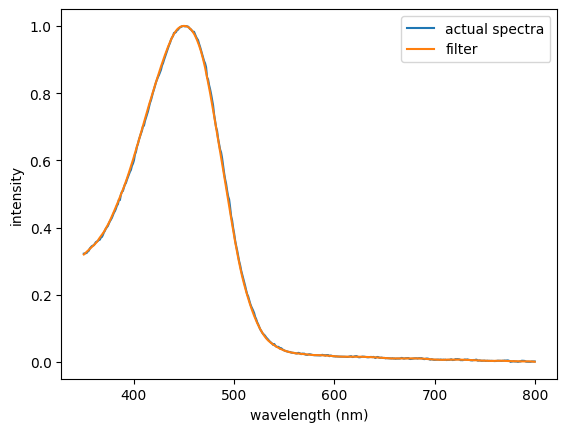

1
451
451


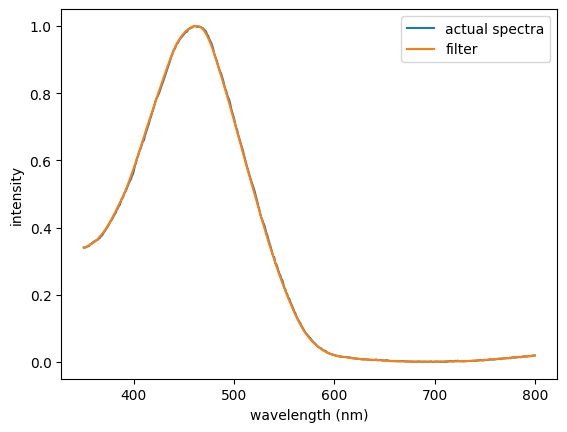

2
451
451


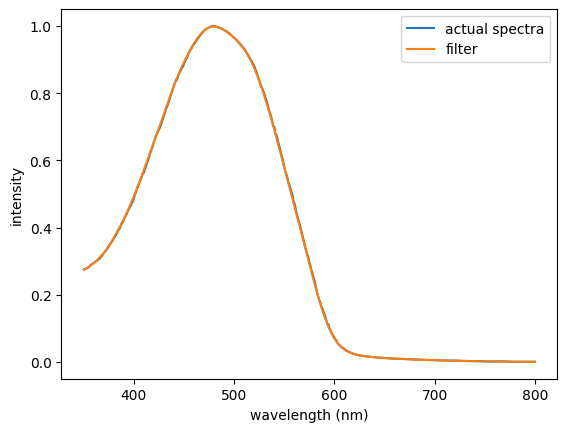

3
451
451


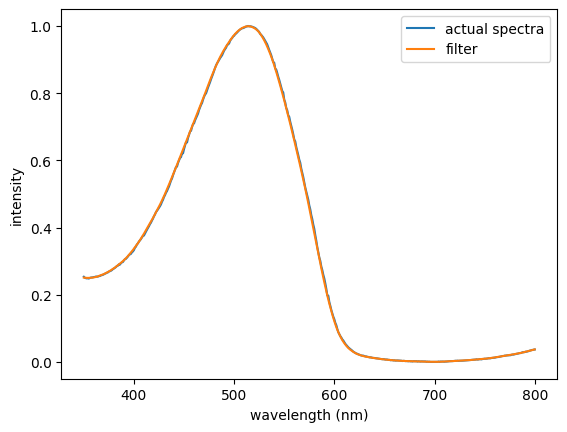

4
451
451


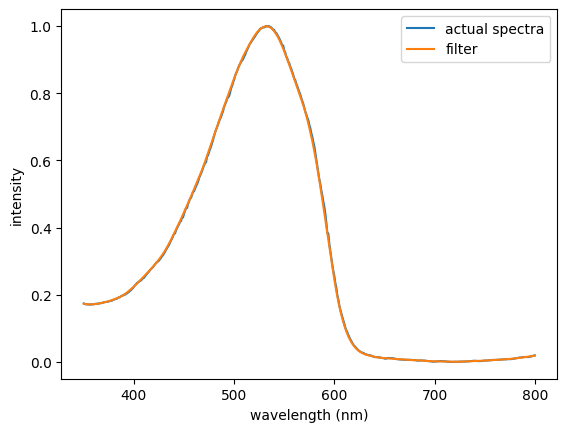

5
451
451


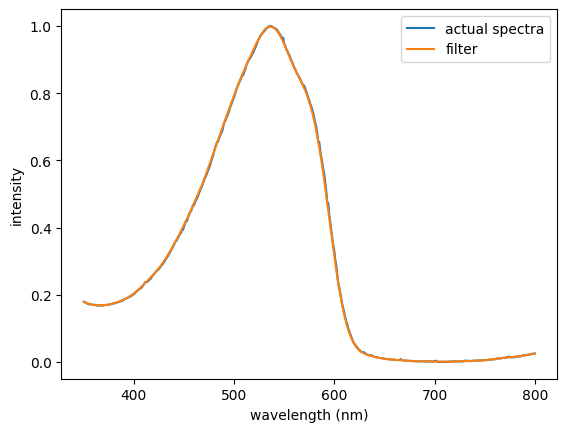

6
451
451


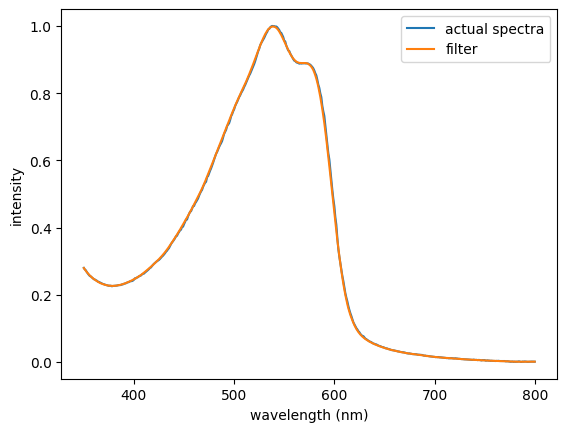

7
451
451


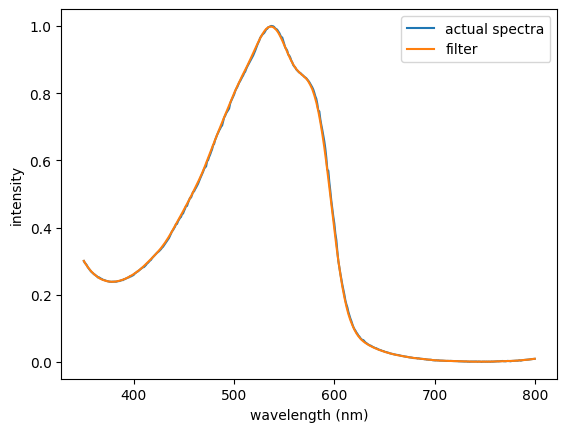

8
451
451


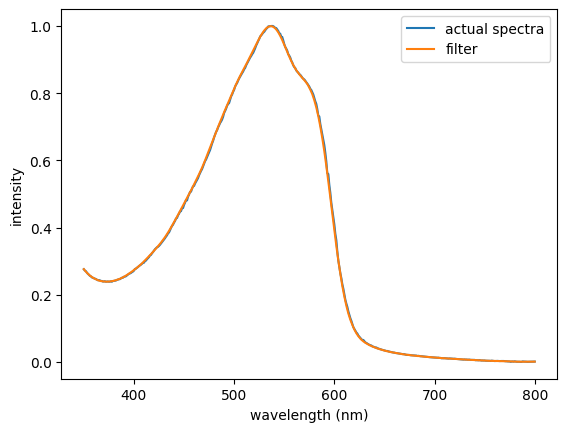

9
451
451


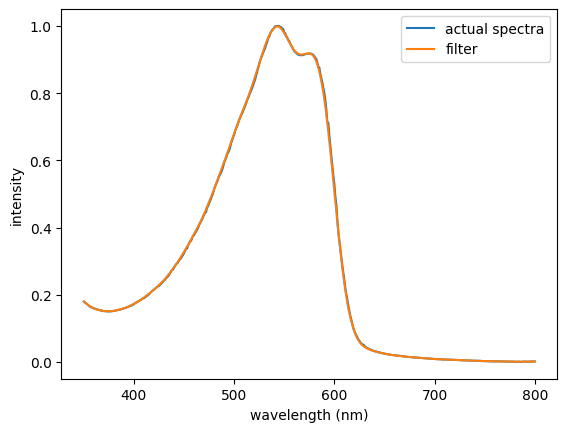

10
451
451


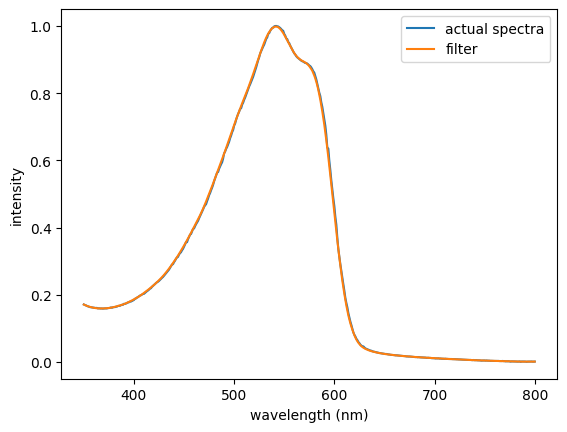

11
451
451


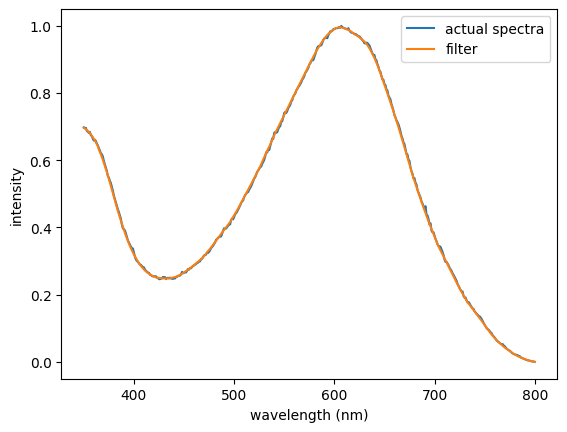

12
451
451


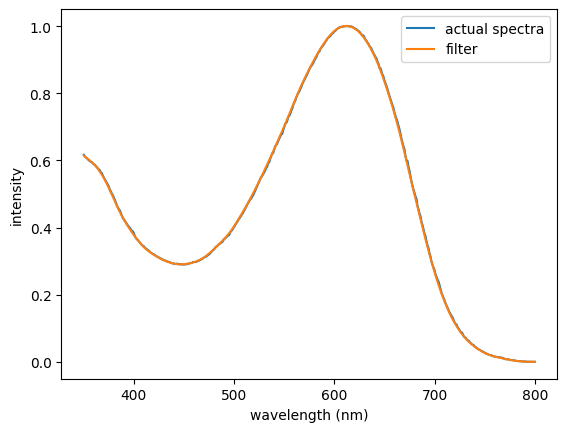

13
451
451


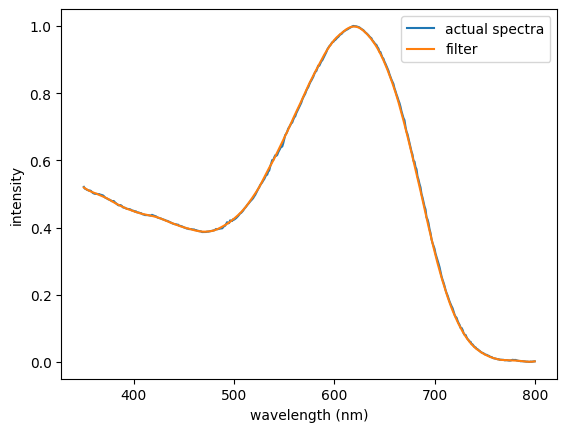

14
451
451


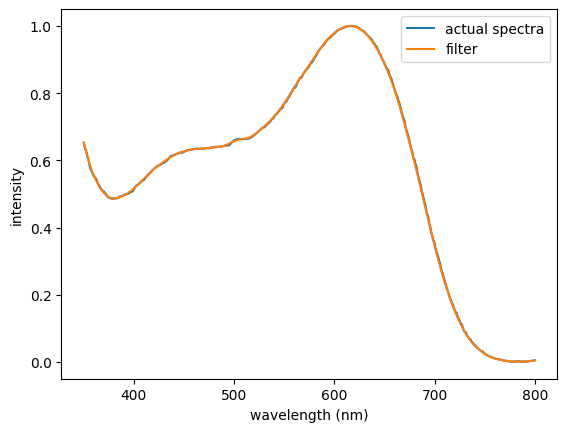

15
451
451


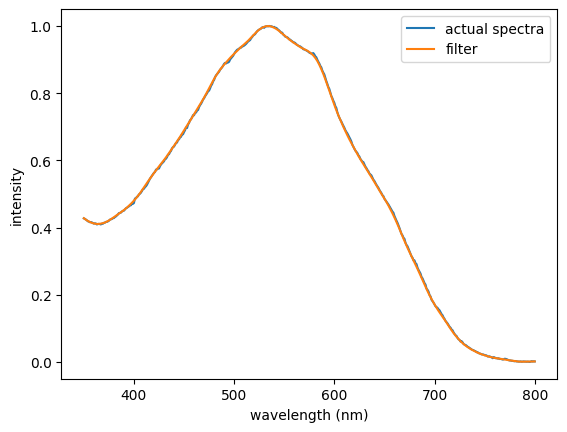

16
451
451


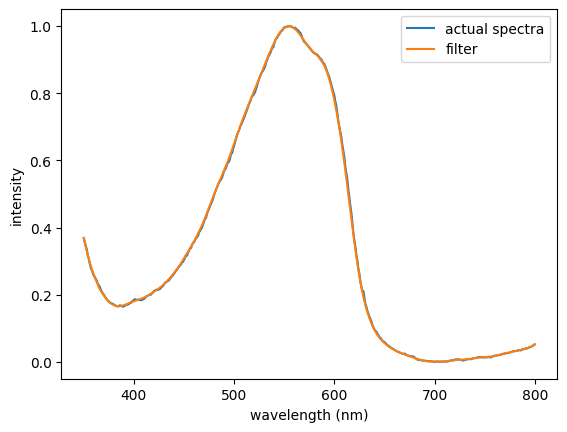

17
451
451


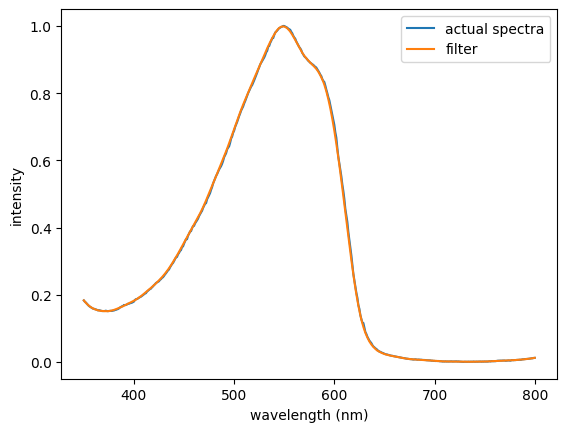

18
451
451


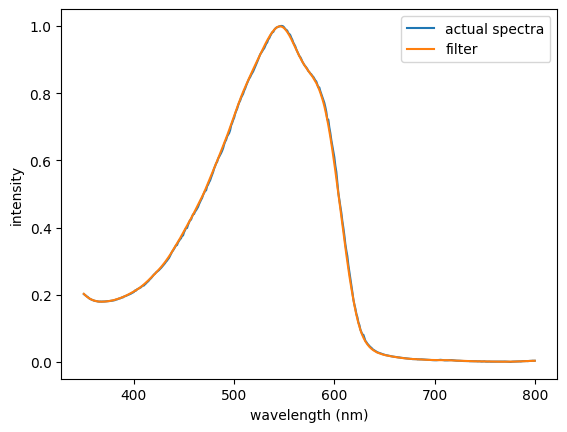

19
451
451


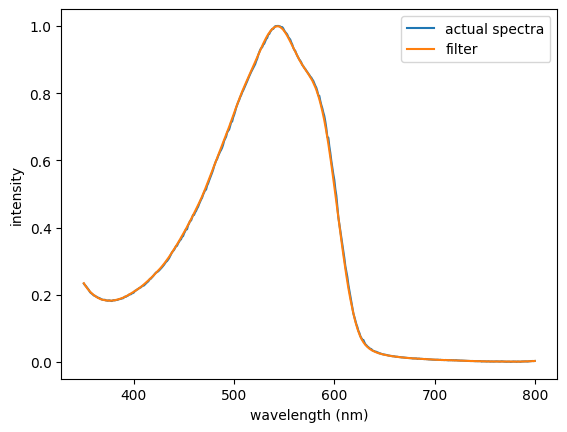

20
451
451


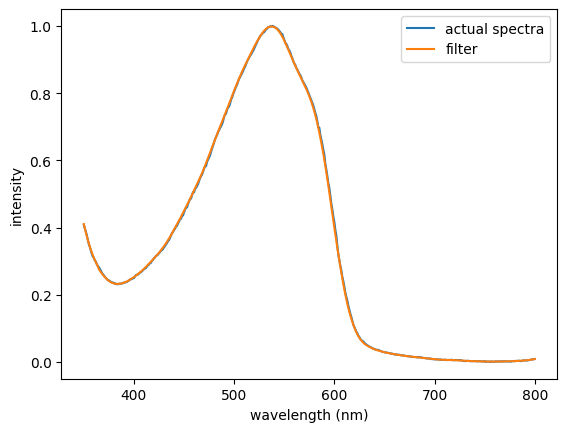

21
451
451


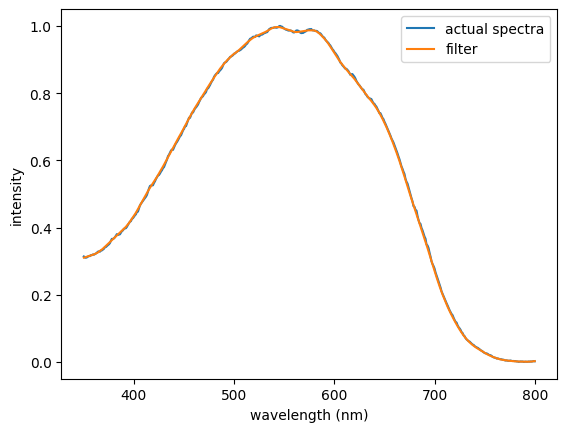

22
451
451


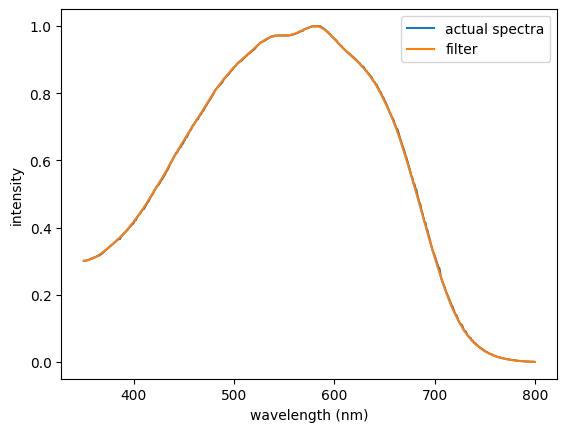

23
451
451


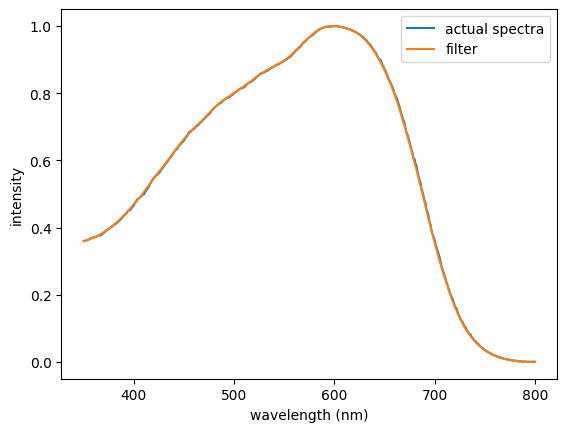

24
451
451


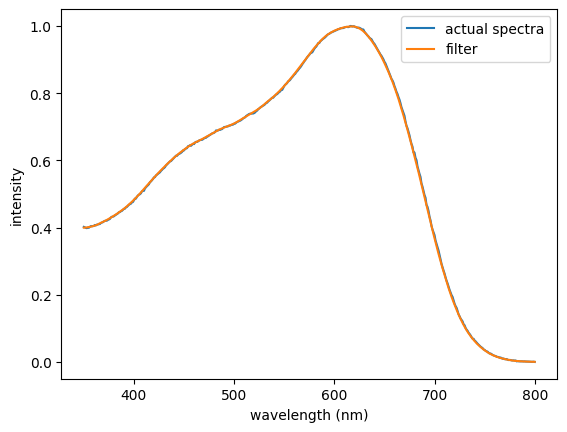

25
451
451


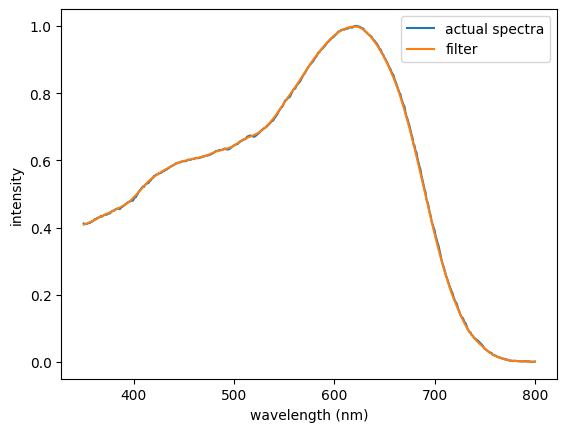

26
451
451


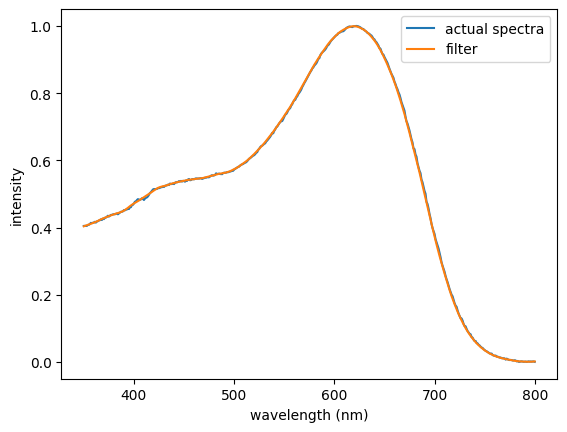

27
451
451


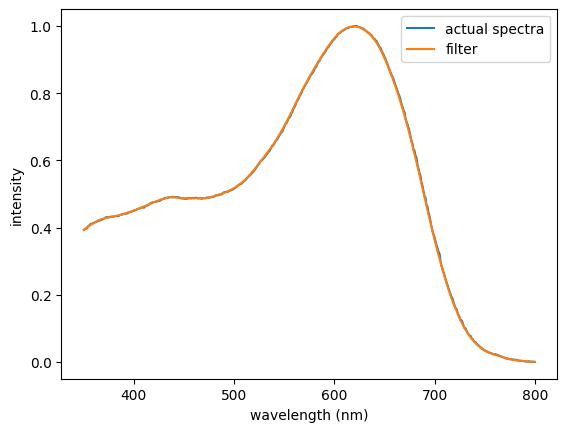

28
451
451


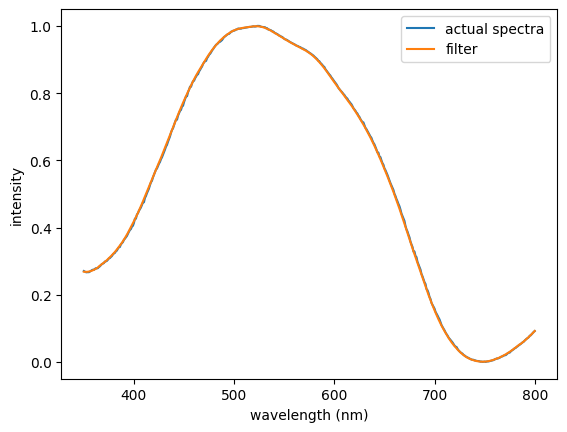

29
451
451


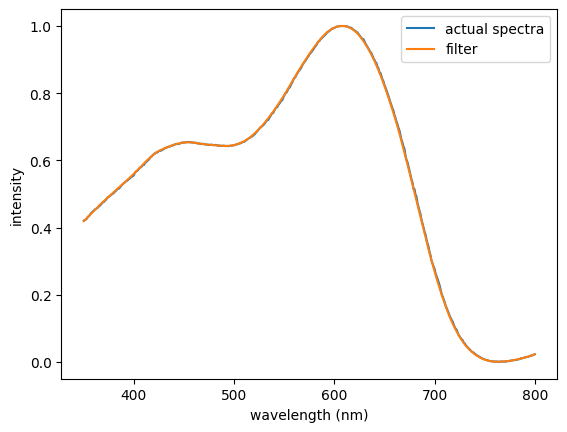

30
451
451


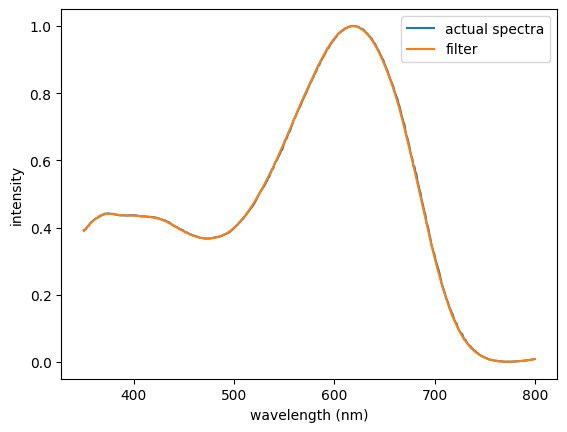

31
451
451


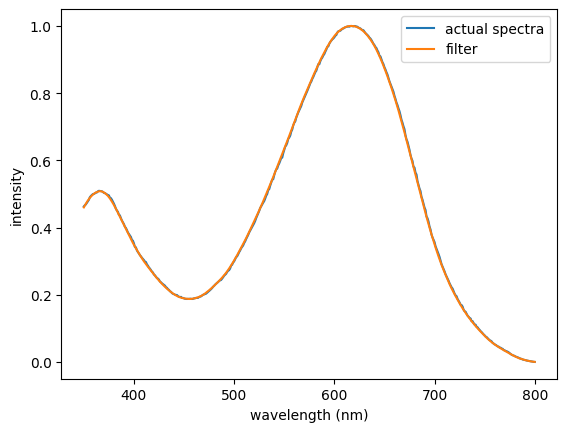

32
451
451


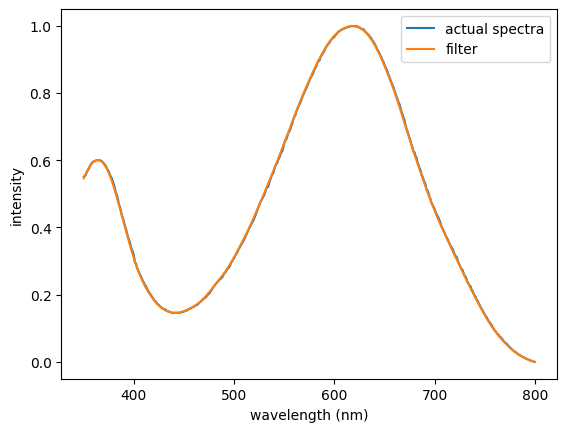

33
451
451


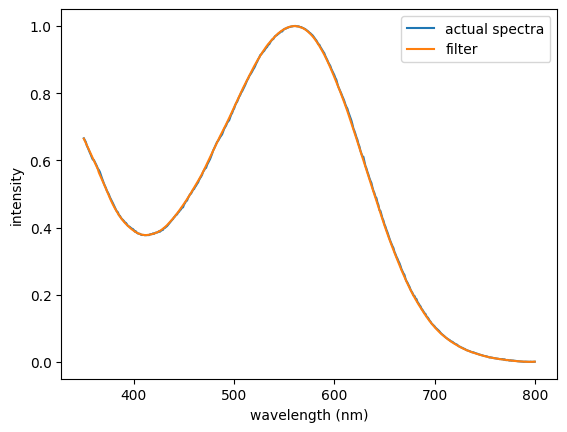

34
451
451


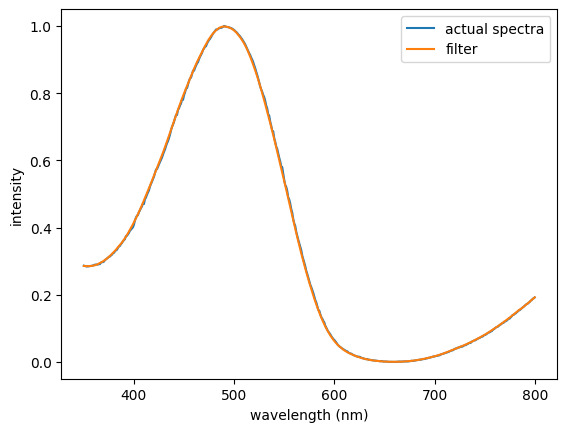

35
451
451


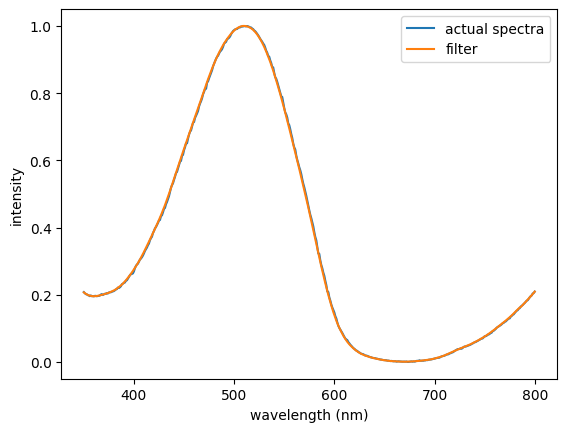

36
451
451


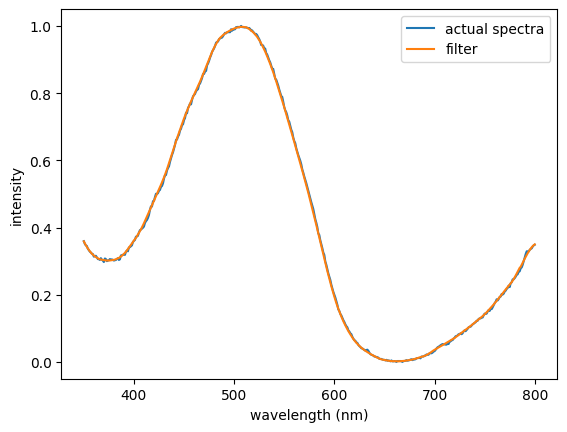

37
451
451


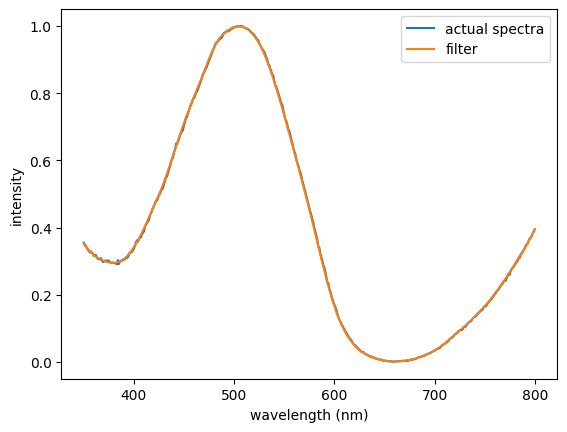

38
451
451


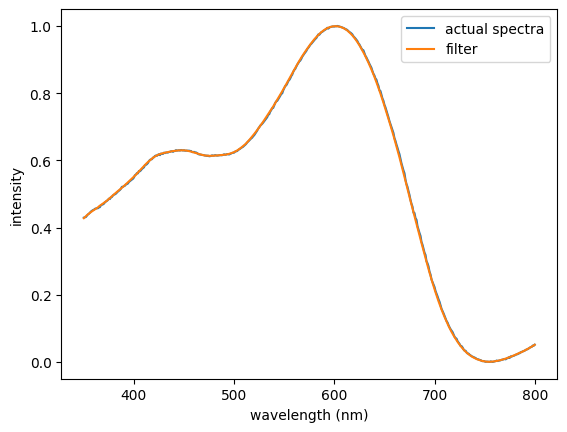

39
451
451


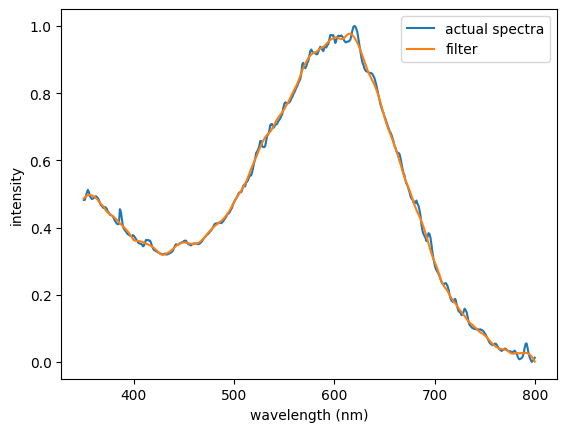

40
451
451


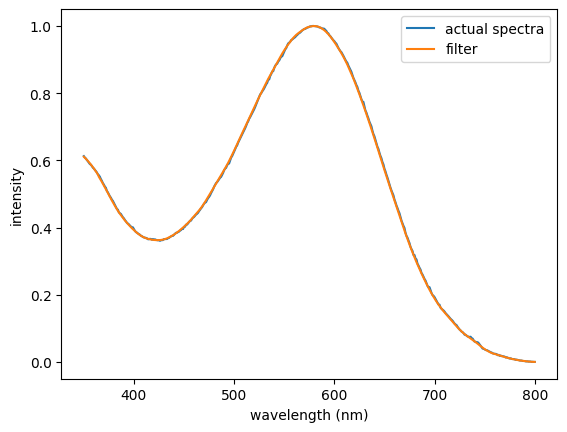

41
451
451


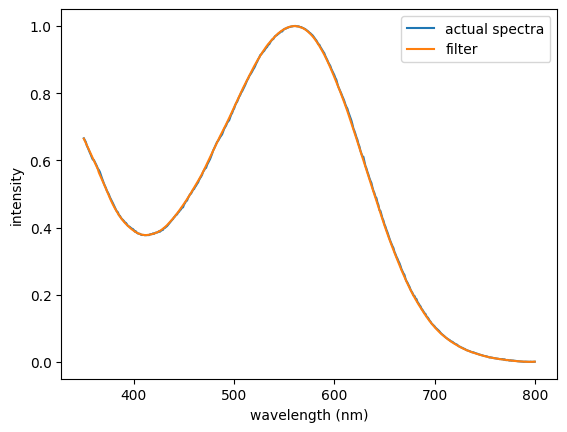

42
451
451


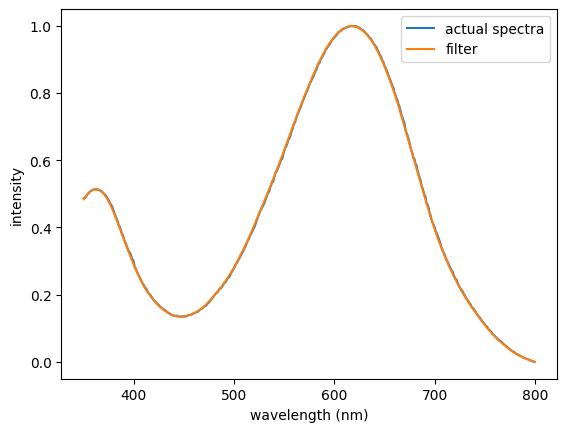

43
451
451


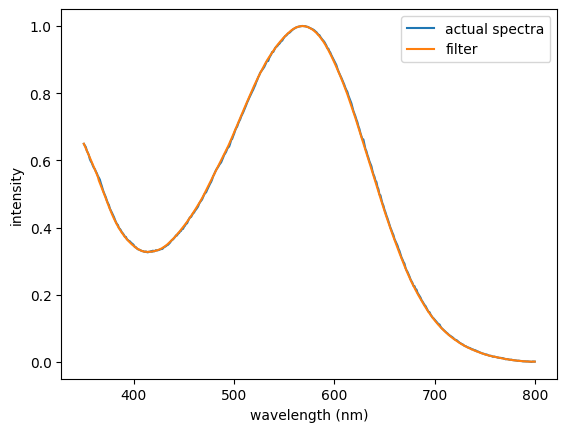

44
451
451


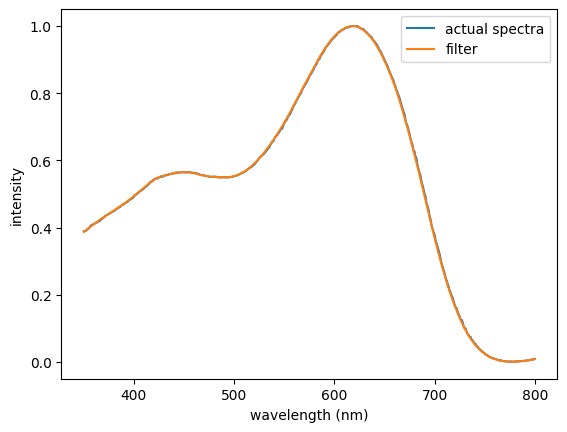

In [ ]:
df_y = []

for i in range(experimental.shape[0]):
  print(i)
  print(len(ast.literal_eval(experimental.intensity[i])))
  y=apply_savgol_filter(ast.literal_eval(experimental.intensity[i]), window_size=30, poly_order=3)
  print(len(y))
  plt.plot(ast.literal_eval(experimental.wavelength.values[i]), ast.literal_eval(experimental.intensity[i]), label = 'actual spectra')
  plt.plot(ast.literal_eval(experimental.wavelength.values[i]), y, label = 'filter')
  df_y.append(y)
  # plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), y_pred[i], label = 'set transformer prediction')
  plt.xlabel('wavelength (nm)')
  plt.ylabel('intensity')
  plt.legend()
  plt.show()

In [ ]:
experimental  = pd.read_csv('/content/in_house_dataset_with_abs_corrected.csv')
# experimental  = pd.read_csv('/content/electrochromics_in_house_experiments.csv')
#
experimental['smiles1'] = experimental['smiles1'].str.replace('*', 'C')
experimental['smiles2'] = experimental['smiles2'].str.replace('*', 'C')
experimental['smiles3'] = experimental['smiles3'].str.replace('*', 'C')

experimental = experimental[['smiles1', 'percentage_1', 'smiles2' , 'percentage_2', 'smiles3', 'percentage_3', 'L', 'a', 'b', 'batch_number']]
experimental['percentage_1'] = experimental['percentage_1']/100
experimental['percentage_2'] = experimental['percentage_2']/100
experimental['percentage_3'] = experimental['percentage_3']/100
experimental

In [ ]:
batch_1 = experimental[experimental['batch_number'] == 'batch_1']
batch_2  = experimental[experimental['batch_number'] == 'batch_2']
batch_3 = experimental[experimental['batch_number'] == 'batch_3']
batch_2.shape

(24, 10)

In [ ]:
def get_dft_descriptors_dictionary(dft_calculations_file):
    # create a dictionary to assign the molecular features to each of the smiles stings
    data_dft = pd.read_csv(dft_calculations_file)
    data_dft = data_dft.drop(['stoichiometry','number_of_atoms','charge','multiplicity', 'E_scf', 'zero_point_correction', 'E_thermal_correction',
        'H_thermal_correction', 'G_thermal_correction', 'E_zpe', 'E', 'H','converged',#'ES_<S**2>',
        'G', ], axis=1)
    scaler = MinMaxScaler()

    cols_to_scale = data_dft.columns[1:]

    data_dft[cols_to_scale] = scaler.fit_transform(data_dft[cols_to_scale])

    dictionary = data_dft.set_index('smiles').agg(list, axis=1).to_dict()
    return dictionary, data_dft.columns.values[1:]

In [ ]:
# create a dictionary to assign the molecular features to each of the smiles stings
dictionary , descriptor_names= get_dft_descriptors_dictionary('/content/dft_descriptors_ECPs.csv')

In [ ]:
len(descriptor_names)
descriptor_names

array(['dipole', 'molar_mass', 'molar_volume', 'electronic_spatial_extent',
       'homo_energy', 'lumo_energy', 'electronegativity', 'hardness',
       'ES_root_dipole', 'ES_root_molar_volume',
       'ES_root_electronic_spatial_extent', 'ES_transition_1',
       'ES_transition_2', 'ES_transition_3', 'ES_transition_4',
       'ES_transition_5', 'ES_transition_6', 'ES_transition_7',
       'ES_transition_8', 'ES_transition_9', 'ES_transition_10',
       'ES_osc_strength_1', 'ES_osc_strength_2', 'ES_osc_strength_3',
       'ES_osc_strength_4', 'ES_osc_strength_5', 'ES_osc_strength_6',
       'ES_osc_strength_7', 'ES_osc_strength_8', 'ES_osc_strength_9',
       'ES_osc_strength_10'], dtype=object)

In [ ]:
def smile_to_dft(smile):
  return dictionary[smile]

def dft_descr(smiles):
  bits = []
  for smile in smiles:
    try:
      bits.append(np.asarray(smile_to_dft(smile)))
    except:
      bits.append(np.zeros(len(descriptor_names)))
  return bits

def dft_descr_from_df(smiles, prefix):
  df = pd.DataFrame(dft_descr(smiles))

  df.columns =[f'{prefix}_{i}' for i in descriptor_names] # descriptor_names
  return df

In [ ]:
def smile_to_bits(smile):
  mol = Chem.MolFromSmiles(smile)
  fpgen1 = rdFingerprintGenerator.GetMorganGenerator(radius=3,fpSize=1024,countSimulation=True)
  return fpgen1.GetCountFingerprintAsNumPy(mol)

In [ ]:
from rdkit.Chem import rdFingerprintGenerator
def smile_to_bits(smile):
  mol = Chem.MolFromSmiles(smile)
  fpgen1 = rdFingerprintGenerator.GetMorganGenerator(radius=3,fpSize=1024,countSimulation=True)
  return fpgen1.GetCountFingerprintAsNumPy(mol)

def get_vectors(smiles):
  paws = []
  for smile in smiles:
    try:
      paws.append(np.asarray(smile_to_bits(smile)))
    except:
      paws.append(np.zeros(1024))
  return paws

def bits_to_df(smiles, prefix):
  df = pd.DataFrame(get_vectors(smiles))
  columns = [f'{prefix}_{i}' for i in df.columns]
  df.columns = columns
  return df

In [ ]:
def get_train_data_representation_dft(dataframe):
   """Given the dataframe with the experimental results, i.e., smiles + ratios + extracted Lab values
      return the finger print representation"""
   df1 = bits_to_df(dataframe.smiles2, 'bit_1')
   df2 = bits_to_df(dataframe.smiles2, 'bit_2')
   df3 = bits_to_df(dataframe.smiles3, 'bit_3')
   df1_dft = dft_descr_from_df(dataframe.smiles1, 'bit_1')
   df2_dft  = dft_descr_from_df(dataframe.smiles2, 'bit_2')
   df3_dft  = dft_descr_from_df(dataframe.smiles3, 'bit_3')
   percentage_1 = dataframe.percentage_1
   percentage_2 = dataframe.percentage_2
   percentage_3 = dataframe.percentage_3
   dataset = pd.concat([df1,df1_dft ,pd.DataFrame(dataframe[['percentage_1']].values, columns=['percentage_1']),df2,df2_dft ,
                        pd.DataFrame(dataframe[['percentage_2']].values, columns=['percentage_2']),
                        df3,df3_dft , pd.DataFrame(dataframe[['percentage_3']].values, columns=['percentage_3'])], axis=1)
  #  dataset = pd.concat([df1,pd.DataFrame(dataframe[['percentage_1']].values, columns=['percentage_1']),df2,
  #                       pd.DataFrame(dataframe[['percentage_2']].values, columns=['percentage_2']),
  #                       df3, pd.DataFrame(dataframe[['percentage_3']].values, columns=['percentage_3'])], axis=1)
   return dataset

In [ ]:
df_external = df_external.rename(columns={'smiles_A': 'smiles1', 'smiles_B': 'smiles2', 'smiles_C': 'smiles3'})

df_external = df_external.rename(columns={'Percentage of A %': 'percentage_1', 'Percentage of B %': 'percentage_2', 'Percentage of C %': 'percentage_3'})

In [ ]:
dataset_external_valid = get_train_data_representation_dft(df_external)

[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:50] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[20:56:50] SMILES Parse Error: syntax error while parsing: 0
[20:56:5

In [ ]:
dataset_test = get_train_data_representation_dft(experimental)

In [ ]:
literature_dataset = get_train_data_representation_dft(df_external)

[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:42] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[19:07:42] SMILES Parse Error: syntax error while parsing: 0
[19:07:4

In [ ]:
full_dataset = pd.concat([pd.DataFrame(literature_dataset.values, columns=literature_dataset.columns.values), pd.DataFrame(literature_lab_scaled, columns=['L','a','b'])], axis=1)
full_dataset

In [ ]:
full_dataset = pd.concat([pd.DataFrame(literature_dataset.values, columns=literature_dataset.columns.values), pd.DataFrame(pd.DataFrame(df_y).dropna(axis=1))], axis=1)
full_dataset

In [ ]:
full_dataset = pd.concat([literature_dataset, batch_1_dataset], axis=0)
full_dataset

In [ ]:
lab_all = np.concatenate([literature_lab_scaled, experimental_lab__batch1_scaled], axis=0)
len(lab_all)

152

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    full_dataset, lab_all , train_size=0.7, random_state=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    literature_dataset, literature_lab_scaled , train_size=0.7, random_state=1)

In [ ]:
# batch_1 = experimental[experimental['batch_number'] == 'batch_1']
batch_1_dataset = get_train_data_representation_dft(experimental)
experimental_validation_batch1 = experimental[['L' ,'a', 'b']]
experimental_lab__batch1_scaled = scalery.transform(experimental_validation_batch1.values)

In [ ]:
experimental_lab__batch1_scaled

In [ ]:
batch_1 = experimental[experimental['batch_number'] == 'batch_1']
batch_1_dataset = get_train_data_representation_dft(batch_1)
experimental_validation_batch1 = batch_1[['L' ,'a', 'b']]
experimental_lab__batch1_scaled = scalery.transform(experimental_validation_batch1.values)

batch_2  = experimental[experimental['batch_number'] == 'batch_2']
batch_2_dataset = get_train_data_representation_dft(batch_2)
experimental_validation_batch2 = batch_2[['L' ,'a', 'b']]
experimental_lab__batch2_scaled = scalery.transform(experimental_validation_batch2.values)

batch_3 = experimental[experimental['batch_number'] == 'batch_3']
batch_3_dataset = get_train_data_representation_dft(batch_3)
experimental_validation_batch3 = batch_3[['L' ,'a', 'b']]
experimental_lab__batch3_scaled = scalery.transform(experimental_validation_batch3.values)

# Import the Set Transformer model

In [ ]:
!git clone https://github.com/juho-lee/set_transformer.git

Cloning into 'set_transformer'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 46 (delta 12), reused 9 (delta 9), pack-reused 24
Receiving objects: 100% (46/46), 65.05 KiB | 4.34 MiB/s, done.
Resolving deltas: 100% (19/19), done.


In [ ]:
%cd set_transformer

/content/set_transformer


In [ ]:
import torch
import torch.nn as nn
from modules import SAB, PMA, ISAB
import numpy as np

def combine(data1, data2):
    return np.array(list(zip(data1, data2)))

class MonomerPair(torch.utils.data.Dataset):
  def __init__(self, dataset1, dataset2, dataset3, y):
    self.x = np.array(list(zip(dataset1, dataset2, dataset3)))
    self.x = np.concatenate([dataset1, dataset2, dataset3], axis=-1)
    self.y = np.reshape(y, (y.shape[0], -1))

  def __getitem__(self, index):
    return self.x[index], self.y[index]

  def __len__(self):
    return len(self.x)

In [ ]:
import torch
from torch.utils.data import Dataset
import numpy as np

class MonomerPair(Dataset):
    def __init__(self, dataset1, dataset2, dataset3, y):
        # Assuming dataset1, dataset2, and dataset3 are already numpy arrays
        self.x = np.concatenate([dataset1, dataset2, dataset3], axis=-1)
        self.y = np.reshape(y, (y.shape[0], -1))

    def __getitem__(self, index):
        # Convert data to tensors
        x_tensor = torch.from_numpy(self.x[index]).float()  # Ensure it's a float tensor
        y_tensor = torch.from_numpy(self.y[index]).float()
        return x_tensor, y_tensor

    def __len__(self):
        return len(self.x)


In [ ]:
import tqdm
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.nn.functional as F
from modules import SAB, PMA
import tqdm

In [ ]:
def enable_dropout(m):
  for each_module in m.modules():
    if each_module.__class__.__name__.startswith('Dropout'):
      each_module.train()

In [ ]:
from torch.autograd import Variable
def weighted_mse_loss(input,target):
    weights = Variable(torch.Tensor([0.1,1,1]))#.cuda()
    pct_var = (input-target)**2
    out = pct_var * weights.expand_as(target)
    loss = out.mean()
    return loss

In [ ]:
from torch.autograd import Variable
def weighted_mse_loss(input,target):
    weights = Variable(torch.Tensor([0.1,1,1]))#.cuda()
    pct_var = (input-target)**2
    out = pct_var * weights.expand_as(target)
    loss = out.mean()
    return loss

class SmallSetTransformer_v2(nn.Module):
    def __init__(self, dropout_ratio, device, epochs, learning_rate, batch_size):
        super().__init__()
        self.dropout_ratio = dropout_ratio
        self.device = device
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.enc = nn.Sequential(
            SAB(dim_in=1056, dim_out=800, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(800),
            SAB(dim_in=800, dim_out=500, num_heads=5),
            nn.LayerNorm(500),
            nn.Dropout(p=self.dropout_ratio),
            SAB(dim_in=500, dim_out=200, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(200)
        )
        self.dec = nn.Sequential(PMA(dim=200, num_heads=4, num_seeds=1),
                                SAB(dim_in=200, dim_out=100, num_heads=5),
                                 nn.LayerNorm(100),
                                 nn.Dropout(p=self.dropout_ratio),
                                 nn.LeakyReLU(),
                                 nn.Linear(in_features=100, out_features=3))

    def forward(self, x):
        x = x.reshape((x.shape[0], 3, -1))
        x = self.enc(x)
        x = self.dec(x)
        return x.squeeze(-1).squeeze(1)

    def predict(self, data):
        #self = self.to(self.device)
        torch.manual_seed(0)
        x = torch.FloatTensor(data)
        x = x.float().to(self.device)
        y = self(x)
        return y.detach().squeeze(1).numpy()  #

    def train_model(self, data1, data2, data3, y_new):
        #self = self.to(self.device)
        torch.manual_seed(0)
        enable_dropout(self)
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        criterion = weighted_mse_loss
        losses = []
        for _ in tqdm.tqdm(range(self.epochs)):
            for x, y in DataLoader(MonomerPair(data1, data2, data3, y_new), batch_size=self.batch_size):
                x, y = x.float(), y.float() #.to(self.device)
                loss = criterion(self(x), y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                losses.append(loss.item())
        return losses, optimizer

    def test_model(self, data1, data2, data3, target):
        y_list=[]
        y_list_std=[]
        torch.manual_seed(0)
        enable_dropout(self)

        for i in range(10):
            self = self.to(self.device)
            for x, y in DataLoader(MonomerPair(data1, data2, data3, target), batch_size=len(data1)):
                x, y = x.float(), y.float() #.to(self.device)
                y= self(x)
                y_list.append(y.detach().numpy())
                y_list_std.append(y[:, :].detach().numpy())

        return np.mean(y_list, axis=0), np.std(np.std(y_list_std, axis=0), axis=1)


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import tqdm
import numpy as np

# Assuming necessary imports for SAB, PMA, and MonomerPair are handled elsewhere

def weighted_mse_loss(input, target, device):
    weights = torch.Tensor([0.1, 1, 1]).to(device)  # Ensure weights are on the correct device
    pct_var = (input - target) ** 2
    out = pct_var * weights.expand_as(target)
    loss = out.mean()
    return loss

def enable_dropout(m):
    for each_module in m.modules():
        if each_module.__class__.__name__.startswith('Dropout'):
            each_module.train()

class SmallSetTransformer_v2(nn.Module):
    def __init__(self, dropout_ratio, device, epochs, learning_rate, batch_size):
        super(SmallSetTransformer_v2, self).__init__()  # Python 3 compatible
        self.dropout_ratio = dropout_ratio
        self.device = device
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.enc = nn.Sequential(
            SAB(dim_in=1025, dim_out=800, num_heads=5), #1056
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(800),
            SAB(dim_in=800, dim_out=500, num_heads=5),
            nn.LayerNorm(500),
            nn.Dropout(p=self.dropout_ratio),
            SAB(dim_in=500, dim_out=200, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(200)
        )
        self.dec = nn.Sequential(PMA(dim=200, num_heads=4, num_seeds=1),
                                SAB(dim_in=200, dim_out=100, num_heads=5),
                                 nn.LayerNorm(100),
                                 nn.Dropout(p=self.dropout_ratio),
                                 nn.LeakyReLU(),
                                 nn.Linear(in_features=100, out_features=3))

    def forward(self, x):
        x = x.reshape((x.shape[0], 3, -1))
        x = self.enc(x)
        x = self.dec(x)
        return x.squeeze(-1).squeeze(1)

    def predict(self, data):
        self.eval()  # Ensure the model is in eval mode
        enable_dropout(self)  # Only if you need dropout during inference
        x = torch.FloatTensor(data).to(self.device)
        y = self(x)
        return y.detach().cpu().numpy()

    def train_model(self, data_loader):
        self.train()  # Ensure the model is in train mode
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        losses = []
        for epoch in tqdm.tqdm(range(self.epochs)):
            for x, y in data_loader:
                x, y = x.to(self.device), y.to(self.device)
                optimizer.zero_grad()
                output = self(x)
                loss = weighted_mse_loss(output, y, self.device)
                loss.backward()
                optimizer.step()
                losses.append(loss.item())
        return losses, optimizer


    def test_model(self, data_loader):
        self.eval()  # Ensure the model is in eval mode
        enable_dropout(self)  # Only if you need dropout during inference
        predictions = []
        for x, y in data_loader:
            x = x.to(self.device)
            with torch.no_grad():
                prediction = self(x)
            predictions.append(prediction.detach().cpu().numpy())
        return np.mean(predictions, axis=0), np.std(predictions, axis=0)

# Note: Ensure DataLoader is properly set up with your dataset


In [ ]:
class SmallSetTransformer_v2(nn.Module):
    def __init__(self, dropout_ratio, device, epochs, learning_rate, batch_size):
        super().__init__()
        self.dropout_ratio = dropout_ratio
        self.device = device
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.enc = nn.Sequential(
            SAB(dim_in=1056, dim_out=800, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(800),
            SAB(dim_in=800, dim_out=600, num_heads=5),
            nn.LayerNorm(600),
            nn.Dropout(p=self.dropout_ratio),
            SAB(dim_in=600, dim_out=500, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(500)
        )
        self.dec = nn.Sequential(PMA(dim=500, num_heads=2, num_seeds=1),
                                SAB(dim_in=500, dim_out=450, num_heads=2),
                                 nn.LayerNorm(450),
                                 nn.Dropout(p=self.dropout_ratio),
                                 nn.LeakyReLU(),
                                 nn.Linear(in_features=450, out_features=451))

    def forward(self, x):
        x = x.reshape((x.shape[0], 3, -1))
        x = self.enc(x)
        x = self.dec(x)
        return x.squeeze(-1).squeeze(1)

    def predict(self, data):
        #self = self.to(self.device)5
        torch.manual_seed(0)
        x = torch.FloatTensor(data)
        x = x.float().to(self.device)
        y = self(x)
        return y.detach().squeeze(1).numpy()  #

    def train_model(self, data1, data2, data3, y_new):
        #self = self.to(self.device)
        torch.manual_seed(0)
        enable_dropout(self)
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        criterion = nn.MSELoss().to(device) #weighted_mse_loss
        losses = []
        for _ in tqdm.tqdm(range(self.epochs)):
            for x, y in DataLoader(MonomerPair(data1, data2, data3, y_new), batch_size=self.batch_size):
                x, y = x.float(), y.float() #.to(self.device)
                loss = criterion(self(x), y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                losses.append(loss.item())
        return losses, optimizer

    def test_model(self, data1, data2, data3, target):
        y_list=[]
        y_list_std=[]
        torch.manual_seed(0)
        enable_dropout(self)

        for i in range(10):
            self = self.to(self.device)
            for x, y in DataLoader(MonomerPair(data1, data2, data3, target), batch_size=len(data1)):
                x, y = x.float(), y.float() #.to(self.device)
                y= self(x)
                y_list.append(y.detach().numpy())
                y_list_std.append(y[:, :].detach().numpy())

        return np.mean(y_list, axis=0), np.std(np.std(y_list_std, axis=0), axis=1)


In [ ]:
class SmallSetTransformer_v2(nn.Module):
    def __init__(self, dropout_ratio, device, epochs, learning_rate, batch_size):
        super().__init__()
        self.dropout_ratio = dropout_ratio
        self.device = device
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.enc = nn.Sequential(
            SAB(dim_in=1056, dim_out=800, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(800),
            SAB(dim_in=800, dim_out=600, num_heads=5),
            nn.LayerNorm(600),
            nn.Dropout(p=self.dropout_ratio),
            SAB(dim_in=600, dim_out=500, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(500)
        )
        self.dec = nn.Sequential(PMA(dim=500, num_heads=2, num_seeds=1),
                                SAB(dim_in=500, dim_out=400, num_heads=2),
                                 nn.LayerNorm(400),
                                 nn.Dropout(p=self.dropout_ratio),
                                 nn.LeakyReLU(),
                                 nn.Linear(in_features=400, out_features=451))

    def forward(self, x):
        x = x.reshape((x.shape[0], 3, -1))
        x = self.enc(x)
        x = self.dec(x)
        return x.squeeze(-1).squeeze(1)

    def predict(self, data):
        #self = self.to(self.device)5
        torch.manual_seed(0)
        x = torch.FloatTensor(data)
        x = x.float().to(self.device)
        y = self(x)
        return y.detach().squeeze(1).numpy()  #

    def train_model(self, data1, data2, data3, y_new):
        #self = self.to(self.device)
        torch.manual_seed(0)
        enable_dropout(self)
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        criterion = nn.MSELoss().to(device) #weighted_mse_loss
        losses = []
        for _ in tqdm.tqdm(range(self.epochs)):
            for x, y in DataLoader(MonomerPair(data1, data2, data3, y_new), batch_size=self.batch_size):
                x, y = x.float(), y.float() #.to(self.device)
                loss = criterion(self(x), y)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                losses.append(loss.item())
        return losses, optimizer

    def test_model(self, data1, data2, data3, target):
        y_list=[]
        y_list_std=[]
        torch.manual_seed(0)
        enable_dropout(self)

        for i in range(10):
            self = self.to(self.device)
            for x, y in DataLoader(MonomerPair(data1, data2, data3, target), batch_size=len(data1)):
                x, y = x.float(), y.float() #.to(self.device)
                y= self(x)
                y_list.append(y.detach().numpy())
                y_list_std.append(y[:, :].detach().numpy())

        return np.mean(y_list, axis=0), np.std(np.std(y_list_std, axis=0), axis=1)


# Finetuning

In [ ]:
!pip install optuna

In [ ]:
X_train_all, y_train_all = pd.concat([literature_dataset, dataset_external_valid, batch_1_dataset, batch_2_dataset, batch_3_dataset], axis=0), np.concatenate([literature_lab_scaled, external_val_lab_scaled , experimental_lab__batch1_scaled, experimental_lab__batch2_scaled,  experimental_lab__batch3_scaled])

X_train, X_test, y_train, y_test = train_test_split(
    X_train_all, y_train_all , train_size=0.8, random_state=888)

In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import optuna
from optuna.samplers import TPESampler

X_train_all, y_train_all = pd.concat([literature_dataset, dataset_external_valid, batch_1_dataset, batch_2_dataset, batch_3_dataset], axis=0), np.concatenate([literature_lab_scaled, external_val_lab_scaled , experimental_lab__batch1_scaled, experimental_lab__batch2_scaled,  experimental_lab__batch3_scaled])

X_train, X_test, y_train, y_test = train_test_split(
    X_train_all, y_train_all , train_size=0.8, random_state=888)

X, y = X_train.values, y_train
Ndims = int(X_train.shape[1]/3)
# configure the cross-validation procedure
cv_outer = KFold(n_splits=5, shuffle=True, random_state=888)

def objective(trial, cv, X, y):
    # Define hyperparameters
    dropout_ratio = trial.suggest_categorical('dropout_ratio', [0.1, 0.15, 0.2, 0.25, 0.3]) #5
    learning_rate = trial.suggest_categorical('learning_rate', [ 1e-3]) #3
    batch_size = trial.suggest_categorical("batch_size", [12, 32, 64, 128, 256]) #4
    epochs = trial.suggest_int('epochs',400, 800, step =50) # 13

    device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")

    mse = []
    mae_list = []
    r2_list = []

    for train_ix, valid_ix in cv.split(X):
        X_train, X_valid = X[train_ix, :], X[valid_ix, :]
        y_train, y_valid = y[train_ix], y[valid_ix]

        train_data_1, train_data_2, train_data_3, y_new = X_train[:, :Ndims], X_train[:, Ndims:2*Ndims], X_train[:, 2*Ndims:], y_train
        # valid_data_1, valid_data_2, valid_data_3, y_valid = X_valid[:, :Ndims], X_valid[:, Ndims:2*Ndims], X_valid[:, 2*Ndims:], y_valid
        test_data_1, test_data_2, test_data_3 = X_test.values[:, :Ndims], X_test.values[:, Ndims:2*Ndims], X_test.values[:, 2*Ndims:]#, y_test
        #valid_data_1, valid_data_2, valid_data_3, y_valid= np.array(dataset_test.iloc[:,:Ndims].values, dtype=float), np.array(dataset_test.iloc[:,Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled[:], dtype=np.float16)

        model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
        losses = model.train_model(train_data_1, train_data_2, train_data_3, y_new)

        # valid_data = np.concatenate((valid_data_1, valid_data_2, valid_data_3), axis=1)
        # y_pred, y_pred_std = model.test_model(valid_data_1, valid_data_2, valid_data_3, y_valid) #model.predict(valid_data) #
        y_pred_test, y_pred_std_test = model.test_model(test_data_1, test_data_2, test_data_3, y_test )
        # mse = mean_squared_error(y_valid, y_pred)
        # mae = mean_absolute_error(y_valid, y_pred)
        # r2 = r2_score(y_valid, y_pred, multioutput='variance_weighted')
        r2_test = r2_score(y_test, y_pred_test, multioutput='variance_weighted')
        mae_test = mean_absolute_error(y_test, y_pred_test)
        mse_test = mean_squared_error(y_test, y_pred_test)

        print(f'R^2_test: {r2_test}, MSE_test: {mse_test}, MAE_test: {mae_test}')
        r2_list.append(r2_test)
        mae_list.append(mae_test)
    return np.mean(r2_list)

study = optuna.create_study(sampler=TPESampler(), direction="maximize")
study.optimize(lambda trial: objective(trial, cv_outer, X, y), n_trials=200)

best_params = study.best_params
# could just identify the mae and plot them to show the distribution

[I 2024-03-25 22:54:59,383] A new study created in memory with name: no-name-0b2efde3-967b-4575-8697-411bf9fe610e
100%|██████████| 600/600 [01:36<00:00,  6.22it/s]


R^2_test: 0.6542852061353688, MSE_test: 0.025106407957702526, MAE_test: 0.11505578363020247


100%|██████████| 600/600 [01:29<00:00,  6.70it/s]


R^2_test: 0.7056433693946605, MSE_test: 0.021376689063315395, MAE_test: 0.10667056606165848


100%|██████████| 600/600 [01:25<00:00,  7.01it/s]


R^2_test: 0.6191551533637363, MSE_test: 0.027657613321524988, MAE_test: 0.12272017368556594


100%|██████████| 600/600 [01:25<00:00,  7.00it/s]


R^2_test: 0.739406145181568, MSE_test: 0.01892477772560604, MAE_test: 0.098410133407891


100%|██████████| 600/600 [01:25<00:00,  7.00it/s]
[I 2024-03-25 23:02:23,243] Trial 0 finished with value: 0.6917997706809021 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 600}. Best is trial 0 with value: 0.6917997706809021.


R^2_test: 0.740508979329177, MSE_test: 0.018844687996988883, MAE_test: 0.10722046173719461


100%|██████████| 650/650 [01:00<00:00, 10.70it/s]


R^2_test: 0.6456304183016957, MSE_test: 0.025734933661536424, MAE_test: 0.11712090151588113


100%|██████████| 650/650 [01:02<00:00, 10.44it/s]


R^2_test: 0.6853326968348594, MSE_test: 0.02285168533258511, MAE_test: 0.10816047655599681


100%|██████████| 650/650 [01:03<00:00, 10.28it/s]


R^2_test: 0.738622876856298, MSE_test: 0.01898166002993194, MAE_test: 0.098452209733617


100%|██████████| 650/650 [01:04<00:00, 10.02it/s]


R^2_test: 0.6348057761196312, MSE_test: 0.026521037951668363, MAE_test: 0.11562112043286865


100%|██████████| 650/650 [01:04<00:00, 10.05it/s]
[I 2024-03-25 23:07:39,873] Trial 1 finished with value: 0.6912943698518408 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 650}. Best is trial 0 with value: 0.6917997706809021.


R^2_test: 0.7520800811467192, MSE_test: 0.018004374513426815, MAE_test: 0.09955328655850833


100%|██████████| 750/750 [01:52<00:00,  6.66it/s]


R^2_test: 0.7255663809225961, MSE_test: 0.019929845410560924, MAE_test: 0.10193126066609164


100%|██████████| 750/750 [01:53<00:00,  6.64it/s]


R^2_test: 0.7088123061770303, MSE_test: 0.021146555377796875, MAE_test: 0.10539347984171792


100%|██████████| 750/750 [01:52<00:00,  6.66it/s]


R^2_test: 0.6950991054582029, MSE_test: 0.02214243179894751, MAE_test: 0.10643675067846192


100%|██████████| 750/750 [01:53<00:00,  6.63it/s]


R^2_test: 0.6797249569668691, MSE_test: 0.023258929128179135, MAE_test: 0.10718512764751753


100%|██████████| 750/750 [02:06<00:00,  5.91it/s]
[I 2024-03-25 23:17:18,960] Trial 2 finished with value: 0.7144478035350571 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 750}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.7630362681505872, MSE_test: 0.017208717210176746, MAE_test: 0.09466244157198674


100%|██████████| 400/400 [00:39<00:00, 10.18it/s]


R^2_test: 0.6196713164908448, MSE_test: 0.027620128659971904, MAE_test: 0.12495730012309621


100%|██████████| 400/400 [00:41<00:00,  9.54it/s]


R^2_test: 0.6589415615135209, MSE_test: 0.024768255353895503, MAE_test: 0.11192483869730725


100%|██████████| 400/400 [00:42<00:00,  9.43it/s]


R^2_test: 0.6633574412106098, MSE_test: 0.024447566511141907, MAE_test: 0.11292508313776699


100%|██████████| 400/400 [00:40<00:00,  9.87it/s]


R^2_test: 0.6516692343339312, MSE_test: 0.02529638436721207, MAE_test: 0.11435283083688959


100%|██████████| 400/400 [00:42<00:00,  9.41it/s]
[I 2024-03-25 23:20:46,481] Trial 3 finished with value: 0.6632088902339326 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 400}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.722404897620756, MSE_test: 0.020159437811395644, MAE_test: 0.11101053366713669


100%|██████████| 600/600 [00:43<00:00, 13.89it/s]


R^2_test: 0.6256389823427116, MSE_test: 0.027186746415152823, MAE_test: 0.12265641611133431


100%|██████████| 600/600 [00:42<00:00, 14.01it/s]


R^2_test: 0.6450639281976092, MSE_test: 0.025776073155447596, MAE_test: 0.11747676398542788


100%|██████████| 600/600 [00:43<00:00, 13.66it/s]


R^2_test: 0.6429812312679598, MSE_test: 0.025927322218825846, MAE_test: 0.11603270032047557


100%|██████████| 600/600 [00:42<00:00, 14.03it/s]


R^2_test: 0.64029059284672, MSE_test: 0.02612272104777144, MAE_test: 0.1169697674687094


100%|██████████| 600/600 [00:44<00:00, 13.59it/s]
[I 2024-03-25 23:24:24,255] Trial 4 finished with value: 0.6431289288070079 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 600}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.6616699093800388, MSE_test: 0.024570117999628435, MAE_test: 0.11968254753084868


100%|██████████| 500/500 [00:35<00:00, 14.01it/s]


R^2_test: 0.589729420442251, MSE_test: 0.02979456108393541, MAE_test: 0.12876778763571167


100%|██████████| 500/500 [00:36<00:00, 13.69it/s]


R^2_test: 0.6157876900928662, MSE_test: 0.02790216434497396, MAE_test: 0.12253109816114822


100%|██████████| 500/500 [00:37<00:00, 13.28it/s]


R^2_test: 0.6371884701767518, MSE_test: 0.026348002576561193, MAE_test: 0.11779798213281518


100%|██████████| 500/500 [00:38<00:00, 13.00it/s]


R^2_test: 0.6258727659143208, MSE_test: 0.027169768646695142, MAE_test: 0.12505101234872618


100%|██████████| 500/500 [00:37<00:00, 13.44it/s]
[I 2024-03-25 23:27:30,749] Trial 5 finished with value: 0.6216929472083164 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 500}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.6398863894153921, MSE_test: 0.026152075002027708, MAE_test: 0.12295350844995223


100%|██████████| 650/650 [01:05<00:00, 10.00it/s]


R^2_test: 0.6583071690128197, MSE_test: 0.024814326037622594, MAE_test: 0.11683873555064246


100%|██████████| 650/650 [01:06<00:00,  9.70it/s]


R^2_test: 0.6533537903274435, MSE_test: 0.02517404898917423, MAE_test: 0.1157000293135264


100%|██████████| 650/650 [01:10<00:00,  9.19it/s]


R^2_test: 0.6959434333767193, MSE_test: 0.022081115241054845, MAE_test: 0.10324644038438162


100%|██████████| 650/650 [01:09<00:00,  9.30it/s]


R^2_test: 0.6334624314510434, MSE_test: 0.026618593971474026, MAE_test: 0.11594191617250708


100%|██████████| 650/650 [01:09<00:00,  9.33it/s]
[I 2024-03-25 23:33:14,055] Trial 6 finished with value: 0.6824344084326908 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 650}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.7711052179954277, MSE_test: 0.016622736077202337, MAE_test: 0.093677837334325


100%|██████████| 600/600 [00:43<00:00, 13.80it/s]


R^2_test: 0.4927774398800081, MSE_test: 0.03683538207135322, MAE_test: 0.12653277425048656


100%|██████████| 600/600 [00:43<00:00, 13.74it/s]


R^2_test: 0.6366904660877925, MSE_test: 0.026384168497267824, MAE_test: 0.11337166161741323


100%|██████████| 600/600 [00:45<00:00, 13.12it/s]


R^2_test: 0.6422671216607114, MSE_test: 0.025979182097096234, MAE_test: 0.12106063317496125


100%|██████████| 600/600 [00:45<00:00, 13.28it/s]


R^2_test: 0.6861012842173534, MSE_test: 0.022795869183787055, MAE_test: 0.11138083698706651


100%|██████████| 600/600 [00:45<00:00, 13.06it/s]
[I 2024-03-25 23:36:59,076] Trial 7 finished with value: 0.6337346195714463 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 600}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.7108367860113658, MSE_test: 0.020999534140855317, MAE_test: 0.10748318055587625


100%|██████████| 400/400 [00:40<00:00,  9.85it/s]


R^2_test: 0.6350603457749034, MSE_test: 0.02650255066176251, MAE_test: 0.12029748131098407


100%|██████████| 400/400 [00:39<00:00, 10.00it/s]


R^2_test: 0.6591719460227965, MSE_test: 0.024751524431240023, MAE_test: 0.11353969186681623


100%|██████████| 400/400 [00:40<00:00,  9.80it/s]


R^2_test: 0.6536615364448319, MSE_test: 0.025151699932357222, MAE_test: 0.11856327123754355


100%|██████████| 400/400 [00:43<00:00,  9.20it/s]


R^2_test: 0.6621443441627107, MSE_test: 0.02453566372282433, MAE_test: 0.11303559873253223


100%|██████████| 400/400 [00:43<00:00,  9.12it/s]
[I 2024-03-25 23:40:28,852] Trial 8 finished with value: 0.6527599564189712 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 400}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.6537616096896136, MSE_test: 0.0251444324397485, MAE_test: 0.11991837278262323


100%|██████████| 700/700 [01:53<00:00,  6.19it/s]


R^2_test: 0.6888963692158345, MSE_test: 0.022592885263244166, MAE_test: 0.10635668667935612


100%|██████████| 700/700 [01:51<00:00,  6.25it/s]


R^2_test: 0.7391248511623074, MSE_test: 0.01894520578517697, MAE_test: 0.09556714139374971


100%|██████████| 700/700 [01:57<00:00,  5.97it/s]


R^2_test: 0.6785238584460663, MSE_test: 0.023346154986012908, MAE_test: 0.1083015272732788


100%|██████████| 700/700 [01:56<00:00,  5.99it/s]


R^2_test: 0.7158239316838658, MSE_test: 0.020637358972131408, MAE_test: 0.09884236435341913


100%|██████████| 700/700 [01:56<00:00,  6.03it/s]
[I 2024-03-25 23:50:05,204] Trial 9 finished with value: 0.7124100411078322 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 700}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.7396811950310866, MSE_test: 0.01890480312847202, MAE_test: 0.10028499807943753


100%|██████████| 800/800 [03:47<00:00,  3.52it/s]


R^2_test: 0.5862570882562376, MSE_test: 0.030046727869892657, MAE_test: 0.12803210734088435


100%|██████████| 800/800 [04:11<00:00,  3.18it/s]


R^2_test: 0.6731837620096239, MSE_test: 0.023733962051392037, MAE_test: 0.10945126762251929


100%|██████████| 800/800 [04:10<00:00,  3.20it/s]


R^2_test: 0.7032843566430044, MSE_test: 0.02154800466094554, MAE_test: 0.10437182042520789


100%|██████████| 800/800 [03:57<00:00,  3.37it/s]


R^2_test: 0.6370539593533382, MSE_test: 0.02635777098586065, MAE_test: 0.11419546965361106


100%|██████████| 800/800 [04:12<00:00,  3.17it/s]
[I 2024-03-26 00:10:25,022] Trial 10 finished with value: 0.6571434040203294 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 2 with value: 0.7144478035350571.


R^2_test: 0.6859378538394432, MSE_test: 0.022807737781293774, MAE_test: 0.11242703742074249


100%|██████████| 800/800 [02:13<00:00,  6.01it/s]


R^2_test: 0.7360119973907343, MSE_test: 0.019171266625177905, MAE_test: 0.09928549182187611


100%|██████████| 800/800 [02:10<00:00,  6.13it/s]


R^2_test: 0.7408451666777911, MSE_test: 0.018820273488630208, MAE_test: 0.09493711469219364


100%|██████████| 800/800 [02:14<00:00,  5.93it/s]


R^2_test: 0.746581488321138, MSE_test: 0.018403691861490306, MAE_test: 0.09368237157724169


100%|██████████| 800/800 [02:06<00:00,  6.32it/s]


R^2_test: 0.721725768996957, MSE_test: 0.020208757309974953, MAE_test: 0.09768418505953408


100%|██████████| 800/800 [02:15<00:00,  5.88it/s]
[I 2024-03-26 00:21:26,937] Trial 11 finished with value: 0.7382135373359462 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 800}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7459032652931104, MSE_test: 0.01845294559413397, MAE_test: 0.10171600650751146


100%|██████████| 800/800 [02:02<00:00,  6.51it/s]


R^2_test: 0.6740019494886655, MSE_test: 0.023674543857553482, MAE_test: 0.11344816912858036


100%|██████████| 800/800 [02:09<00:00,  6.17it/s]


R^2_test: 0.7543443998167061, MSE_test: 0.01783993576425025, MAE_test: 0.09495324604965782


100%|██████████| 800/800 [02:14<00:00,  5.96it/s]


R^2_test: 0.6975732430136209, MSE_test: 0.02196275563838922, MAE_test: 0.10448074294572189


100%|██████████| 800/800 [02:04<00:00,  6.44it/s]


R^2_test: 0.6813409696231167, MSE_test: 0.023141571486178857, MAE_test: 0.1069425126002439


100%|██████████| 800/800 [02:14<00:00,  5.93it/s]
[I 2024-03-26 00:32:13,977] Trial 12 finished with value: 0.7017741492205432 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 800}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7016101841606066, MSE_test: 0.02166958597039652, MAE_test: 0.10107772174782337


100%|██████████| 750/750 [01:58<00:00,  6.34it/s]


R^2_test: 0.7143011435637896, MSE_test: 0.020747946486621014, MAE_test: 0.10514593530931626


100%|██████████| 750/750 [01:56<00:00,  6.43it/s]


R^2_test: 0.7279578112023807, MSE_test: 0.019756175595811304, MAE_test: 0.1015516531491455


100%|██████████| 750/750 [02:02<00:00,  6.13it/s]


R^2_test: 0.6533747787097455, MSE_test: 0.025172524776448005, MAE_test: 0.11147096699201192


100%|██████████| 750/750 [01:56<00:00,  6.44it/s]


R^2_test: 0.6831025828582198, MSE_test: 0.023013640077604258, MAE_test: 0.10631664674228652


100%|██████████| 750/750 [02:00<00:00,  6.21it/s]
[I 2024-03-26 00:42:09,536] Trial 13 finished with value: 0.7114038336737905 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 750}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7782828520348164, MSE_test: 0.016101483843968308, MAE_test: 0.09124598793948385


100%|██████████| 750/750 [01:53<00:00,  6.58it/s]


R^2_test: 0.6906050232128679, MSE_test: 0.02246879984639365, MAE_test: 0.10971428545932856


100%|██████████| 750/750 [01:56<00:00,  6.42it/s]


R^2_test: 0.703322272886387, MSE_test: 0.02154525111758702, MAE_test: 0.10258449376017909


100%|██████████| 750/750 [02:04<00:00,  6.01it/s]


R^2_test: 0.6654515473647514, MSE_test: 0.024295488890092226, MAE_test: 0.11346643919731897


100%|██████████| 750/750 [02:02<00:00,  6.10it/s]


R^2_test: 0.6611198078117679, MSE_test: 0.024610067329643475, MAE_test: 0.11508297773112654


100%|██████████| 750/750 [01:59<00:00,  6.25it/s]
[I 2024-03-26 00:52:09,067] Trial 14 finished with value: 0.7002325957198058 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 750}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7806643273232546, MSE_test: 0.01592853697795675, MAE_test: 0.0949705368855412


100%|██████████| 750/750 [00:53<00:00, 13.97it/s]


R^2_test: 0.6605726998213328, MSE_test: 0.02464979926084385, MAE_test: 0.11982320629389405


100%|██████████| 750/750 [00:54<00:00, 13.68it/s]


R^2_test: 0.6532169275354678, MSE_test: 0.025183988202510044, MAE_test: 0.11590714531326773


100%|██████████| 750/750 [00:57<00:00, 13.11it/s]


R^2_test: 0.6821632432425768, MSE_test: 0.02308185654973589, MAE_test: 0.11319439598673287


100%|██████████| 750/750 [00:56<00:00, 13.31it/s]


R^2_test: 0.6370061466273278, MSE_test: 0.026361243228952624, MAE_test: 0.11890241037717918


100%|██████████| 750/750 [00:57<00:00, 13.16it/s]
[I 2024-03-26 00:56:49,246] Trial 15 finished with value: 0.6632225011209217 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 750}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6831534883779037, MSE_test: 0.023009943230471393, MAE_test: 0.11713489910065145


100%|██████████| 800/800 [03:52<00:00,  3.45it/s]


R^2_test: 0.6559983100942508, MSE_test: 0.024981999376904308, MAE_test: 0.109778942891175


100%|██████████| 800/800 [04:07<00:00,  3.23it/s]


R^2_test: 0.6953202921037863, MSE_test: 0.02212636884110664, MAE_test: 0.10366094278867422


100%|██████████| 800/800 [04:07<00:00,  3.23it/s]


R^2_test: 0.7232719445350332, MSE_test: 0.02009647136062573, MAE_test: 0.1012145915809643


100%|██████████| 800/800 [03:57<00:00,  3.37it/s]


R^2_test: 0.6977741149390816, MSE_test: 0.02194816797075866, MAE_test: 0.10224107254239312


100%|██████████| 800/800 [04:06<00:00,  3.24it/s]
[I 2024-03-26 01:17:01,935] Trial 16 finished with value: 0.708506193873992 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.770166307697808, MSE_test: 0.01669092137151451, MAE_test: 0.09173408189022499


100%|██████████| 700/700 [01:47<00:00,  6.50it/s]


R^2_test: 0.697848915671818, MSE_test: 0.021942735811808733, MAE_test: 0.10849006207048835


100%|██████████| 700/700 [01:52<00:00,  6.24it/s]


R^2_test: 0.7277116491773371, MSE_test: 0.019774052309027273, MAE_test: 0.09885859694740966


100%|██████████| 700/700 [01:51<00:00,  6.30it/s]


R^2_test: 0.6747455578621911, MSE_test: 0.02362054172771172, MAE_test: 0.10972589142871149


100%|██████████| 700/700 [01:49<00:00,  6.39it/s]


R^2_test: 0.6930976641962491, MSE_test: 0.022287779934803294, MAE_test: 0.10916659877782642


100%|██████████| 700/700 [01:55<00:00,  6.05it/s]
[I 2024-03-26 01:26:18,980] Trial 17 finished with value: 0.7114669757099807 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 700}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.763931091642309, MSE_test: 0.017143733576175536, MAE_test: 0.09039719836113612


100%|██████████| 700/700 [01:51<00:00,  6.28it/s]


R^2_test: 0.6888963692158345, MSE_test: 0.022592885263244166, MAE_test: 0.10635668667935612


100%|██████████| 700/700 [01:52<00:00,  6.24it/s]


R^2_test: 0.7391248511623074, MSE_test: 0.01894520578517697, MAE_test: 0.09556714139374971


100%|██████████| 700/700 [01:51<00:00,  6.30it/s]


R^2_test: 0.6785238584460663, MSE_test: 0.023346154986012908, MAE_test: 0.1083015272732788


100%|██████████| 700/700 [01:52<00:00,  6.20it/s]


R^2_test: 0.7158239316838658, MSE_test: 0.020637358972131408, MAE_test: 0.09884236435341913


100%|██████████| 700/700 [01:54<00:00,  6.14it/s]
[I 2024-03-26 01:35:41,688] Trial 18 finished with value: 0.7124100411078322 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 700}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7396811950310866, MSE_test: 0.01890480312847202, MAE_test: 0.10028499807943753


100%|██████████| 500/500 [01:15<00:00,  6.65it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:14<00:00,  6.67it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:23<00:00,  6.01it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:19<00:00,  6.28it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:23<00:00,  5.99it/s]
[I 2024-03-26 01:42:18,911] Trial 19 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [02:15<00:00,  3.69it/s]


R^2_test: 0.694425435607372, MSE_test: 0.02219135487196586, MAE_test: 0.10513374138071657


100%|██████████| 500/500 [02:26<00:00,  3.41it/s]


R^2_test: 0.6486304182240171, MSE_test: 0.02551706846380823, MAE_test: 0.11710242674902771


100%|██████████| 500/500 [02:23<00:00,  3.47it/s]


R^2_test: 0.6214862516601861, MSE_test: 0.027488324920048334, MAE_test: 0.12024625527292794


100%|██████████| 500/500 [02:27<00:00,  3.39it/s]


R^2_test: 0.6243978616268551, MSE_test: 0.027276878754208145, MAE_test: 0.12369153733418563


100%|██████████| 500/500 [02:31<00:00,  3.31it/s]
[I 2024-03-26 01:54:24,647] Trial 20 finished with value: 0.6640365093852093 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7312425798076162, MSE_test: 0.019517630002411013, MAE_test: 0.10153926406769065


100%|██████████| 500/500 [01:15<00:00,  6.59it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:17<00:00,  6.41it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:21<00:00,  6.10it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:21<00:00,  6.14it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]
[I 2024-03-26 02:01:00,748] Trial 21 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:15<00:00,  6.65it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:17<00:00,  6.47it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:17<00:00,  6.43it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:19<00:00,  6.29it/s]
[I 2024-03-26 02:07:29,227] Trial 22 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:07<00:00,  6.72it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:08<00:00,  6.53it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:10<00:00,  6.37it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:09<00:00,  6.48it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:12<00:00,  6.20it/s]
[I 2024-03-26 02:13:18,663] Trial 23 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 550/550 [01:21<00:00,  6.73it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:24<00:00,  6.48it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:25<00:00,  6.46it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:27<00:00,  6.28it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:27<00:00,  6.31it/s]
[I 2024-03-26 02:20:26,070] Trial 24 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 450/450 [00:32<00:00, 14.00it/s]


R^2_test: 0.4842441685629716, MSE_test: 0.03745508303498387, MAE_test: 0.13666107820089038


100%|██████████| 450/450 [00:33<00:00, 13.56it/s]


R^2_test: 0.5830639428365219, MSE_test: 0.030278619628644077, MAE_test: 0.12457944309200027


100%|██████████| 450/450 [00:33<00:00, 13.54it/s]


R^2_test: 0.6500023791634553, MSE_test: 0.02541743428077974, MAE_test: 0.1170428674834763


100%|██████████| 450/450 [00:32<00:00, 13.92it/s]


R^2_test: 0.6362860903766613, MSE_test: 0.026413534962782228, MAE_test: 0.11918197226354021


100%|██████████| 450/450 [00:32<00:00, 13.76it/s]
[I 2024-03-26 02:23:10,580] Trial 25 finished with value: 0.5993919787737118 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6433633129289488, MSE_test: 0.025899574785900836, MAE_test: 0.12719179092119837


100%|██████████| 550/550 [01:21<00:00,  6.74it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:24<00:00,  6.51it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:24<00:00,  6.48it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:25<00:00,  6.40it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:28<00:00,  6.19it/s]
[I 2024-03-26 02:30:17,078] Trial 26 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 450/450 [00:31<00:00, 14.18it/s]


R^2_test: 0.6280037395123604, MSE_test: 0.027015013647924607, MAE_test: 0.12575496799713118


100%|██████████| 450/450 [00:32<00:00, 13.94it/s]


R^2_test: 0.6414356431947371, MSE_test: 0.026039565505458467, MAE_test: 0.12027381095167163


100%|██████████| 450/450 [00:32<00:00, 13.90it/s]


R^2_test: 0.6492369670461142, MSE_test: 0.025473019836315027, MAE_test: 0.12058020548829766


100%|██████████| 450/450 [00:32<00:00, 14.02it/s]


R^2_test: 0.5910043399219733, MSE_test: 0.02970197422002567, MAE_test: 0.1288118406294592


100%|██████████| 450/450 [00:32<00:00, 13.82it/s]
[I 2024-03-26 02:32:59,088] Trial 27 finished with value: 0.6279194198948915 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.629916409799273, MSE_test: 0.026876112214245712, MAE_test: 0.1272104899168073


100%|██████████| 550/550 [01:19<00:00,  6.90it/s]


R^2_test: 0.7436163773630593, MSE_test: 0.018619023362121793, MAE_test: 0.09754154113847917


100%|██████████| 550/550 [01:22<00:00,  6.67it/s]


R^2_test: 0.7477941011287498, MSE_test: 0.018315629816177428, MAE_test: 0.09831969718308266


100%|██████████| 550/550 [01:28<00:00,  6.24it/s]


R^2_test: 0.6862603053206564, MSE_test: 0.02278432079545001, MAE_test: 0.11058129290960489


100%|██████████| 550/550 [01:22<00:00,  6.69it/s]


R^2_test: 0.5724738766580467, MSE_test: 0.0310476886025335, MAE_test: 0.12441314187273551


100%|██████████| 550/550 [01:27<00:00,  6.32it/s]
[I 2024-03-26 02:39:59,563] Trial 28 finished with value: 0.6980460375488801 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7400855272738882, MSE_test: 0.0188754398197031, MAE_test: 0.10006834983326078


100%|██████████| 550/550 [01:21<00:00,  6.73it/s]


R^2_test: 0.6874417238000314, MSE_test: 0.022698524136358894, MAE_test: 0.11000489756930182


100%|██████████| 550/550 [01:23<00:00,  6.56it/s]


R^2_test: 0.6515545792331917, MSE_test: 0.025304710819492055, MAE_test: 0.11426482758774203


100%|██████████| 550/550 [01:28<00:00,  6.20it/s]


R^2_test: 0.6514990076609473, MSE_test: 0.025308746523454922, MAE_test: 0.11980569465977618


100%|██████████| 550/550 [01:21<00:00,  6.72it/s]


R^2_test: 0.6692126819769885, MSE_test: 0.024022348771027397, MAE_test: 0.10950126363401147


100%|██████████| 550/550 [01:26<00:00,  6.38it/s]
[I 2024-03-26 02:47:02,913] Trial 29 finished with value: 0.6724554471238113 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7025692429478971, MSE_test: 0.021599937457817783, MAE_test: 0.11303581162330562


100%|██████████| 500/500 [01:15<00:00,  6.63it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:20<00:00,  6.24it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:18<00:00,  6.38it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:20<00:00,  6.23it/s]
[I 2024-03-26 02:53:35,939] Trial 30 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:15<00:00,  6.65it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:17<00:00,  6.41it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:21<00:00,  6.15it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:16<00:00,  6.53it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:19<00:00,  6.29it/s]
[I 2024-03-26 03:00:07,273] Trial 31 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:08<00:00,  6.60it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:11<00:00,  6.29it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:14<00:00,  6.06it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:10<00:00,  6.40it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:13<00:00,  6.13it/s]
[I 2024-03-26 03:06:05,909] Trial 32 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 650/650 [01:41<00:00,  6.40it/s]


R^2_test: 0.6793615769523741, MSE_test: 0.02328531841509857, MAE_test: 0.11145835408224969


100%|██████████| 650/650 [01:44<00:00,  6.22it/s]


R^2_test: 0.7064095254480742, MSE_test: 0.021321049481852188, MAE_test: 0.10788071908276349


100%|██████████| 650/650 [01:44<00:00,  6.21it/s]


R^2_test: 0.6835742512776842, MSE_test: 0.022979386698894405, MAE_test: 0.11199421515908425


100%|██████████| 650/650 [01:44<00:00,  6.21it/s]


R^2_test: 0.6809203221317301, MSE_test: 0.0231721196365981, MAE_test: 0.11371826291164248


100%|██████████| 650/650 [01:47<00:00,  6.05it/s]
[I 2024-03-26 03:14:49,714] Trial 33 finished with value: 0.7045761639090325 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 650}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7726151437353, MSE_test: 0.01651308265107237, MAE_test: 0.09020581964748818


100%|██████████| 500/500 [01:16<00:00,  6.50it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:20<00:00,  6.18it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:20<00:00,  6.18it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:18<00:00,  6.33it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:23<00:00,  5.99it/s]
[I 2024-03-26 03:21:31,762] Trial 34 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 400/400 [00:29<00:00, 13.61it/s]


R^2_test: 0.5182707036743581, MSE_test: 0.034984017037651784, MAE_test: 0.1349712216934744


100%|██████████| 400/400 [00:29<00:00, 13.49it/s]


R^2_test: 0.4833681333037538, MSE_test: 0.037518702234953266, MAE_test: 0.12703218510817216


100%|██████████| 400/400 [00:30<00:00, 12.93it/s]


R^2_test: 0.6425678562921021, MSE_test: 0.025957342226553524, MAE_test: 0.11886598747456716


100%|██████████| 400/400 [00:30<00:00, 13.19it/s]


R^2_test: 0.6770555331816518, MSE_test: 0.023452787313460902, MAE_test: 0.10928272219832293


100%|██████████| 400/400 [00:29<00:00, 13.48it/s]
[I 2024-03-26 03:24:02,753] Trial 35 finished with value: 0.5895116755593711 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 400}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6262961513449894, MSE_test: 0.02713902166237639, MAE_test: 0.12477073381206309


100%|██████████| 600/600 [00:59<00:00, 10.07it/s]


R^2_test: 0.6485170023719773, MSE_test: 0.025525304919698216, MAE_test: 0.11858299665512019


100%|██████████| 600/600 [01:02<00:00,  9.53it/s]


R^2_test: 0.6062504289340525, MSE_test: 0.02859477679229111, MAE_test: 0.12485234793820171


100%|██████████| 600/600 [01:02<00:00,  9.57it/s]


R^2_test: 0.6961703763917466, MSE_test: 0.02206463424568079, MAE_test: 0.10705558370770403


100%|██████████| 600/600 [01:01<00:00,  9.79it/s]


R^2_test: 0.6650287045887731, MSE_test: 0.024326196465886157, MAE_test: 0.11468983497548824


100%|██████████| 600/600 [01:05<00:00,  9.11it/s]
[I 2024-03-26 03:29:16,061] Trial 36 finished with value: 0.6712230988955701 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 600}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7401489821913007, MSE_test: 0.018870831613540816, MAE_test: 0.10374356421577957


100%|██████████| 550/550 [00:39<00:00, 13.78it/s]


R^2_test: 0.5741753059433878, MSE_test: 0.030924127856777034, MAE_test: 0.12731703106842074


100%|██████████| 550/550 [00:40<00:00, 13.62it/s]


R^2_test: 0.6642664723067995, MSE_test: 0.024381551096261767, MAE_test: 0.11520602362892089


100%|██████████| 550/550 [00:42<00:00, 12.97it/s]


R^2_test: 0.6479183551473048, MSE_test: 0.025568779719481474, MAE_test: 0.11784746217919069


100%|██████████| 550/550 [00:41<00:00, 13.29it/s]


R^2_test: 0.6457268362600919, MSE_test: 0.02572793162216493, MAE_test: 0.1160310110622349


100%|██████████| 550/550 [00:39<00:00, 13.82it/s]
[I 2024-03-26 03:32:40,881] Trial 37 finished with value: 0.6422419934418082 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6791229975514572, MSE_test: 0.023302644464998728, MAE_test: 0.11540116975455524


100%|██████████| 600/600 [01:31<00:00,  6.57it/s]


R^2_test: 0.726572387289475, MSE_test: 0.01985678748332395, MAE_test: 0.10187929729142743


100%|██████████| 600/600 [01:35<00:00,  6.29it/s]


R^2_test: 0.7130191346723249, MSE_test: 0.020841048195907774, MAE_test: 0.10522707204455424


100%|██████████| 600/600 [01:38<00:00,  6.07it/s]


R^2_test: 0.64847366321577, MSE_test: 0.025528452284391864, MAE_test: 0.11944097099160637


100%|██████████| 600/600 [01:32<00:00,  6.47it/s]


R^2_test: 0.6865892625083581, MSE_test: 0.02276043135391721, MAE_test: 0.10460305702472816


100%|██████████| 600/600 [01:38<00:00,  6.08it/s]
[I 2024-03-26 03:40:38,765] Trial 38 finished with value: 0.6976140190870288 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 600}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7134156477492156, MSE_test: 0.0208122527285293, MAE_test: 0.10565001661516044


100%|██████████| 450/450 [02:04<00:00,  3.63it/s]


R^2_test: 0.661014814861147, MSE_test: 0.02461769209982327, MAE_test: 0.11260549823175221


100%|██████████| 450/450 [02:13<00:00,  3.37it/s]


R^2_test: 0.684795654884172, MSE_test: 0.022890686250519904, MAE_test: 0.10740783307093867


100%|██████████| 450/450 [02:13<00:00,  3.38it/s]


R^2_test: 0.6629403452842375, MSE_test: 0.024477856740749787, MAE_test: 0.11654254928852333


100%|██████████| 450/450 [02:14<00:00,  3.35it/s]


R^2_test: 0.7158508658292699, MSE_test: 0.020635402967776058, MAE_test: 0.0987461564798811


100%|██████████| 450/450 [02:11<00:00,  3.43it/s]
[I 2024-03-26 03:51:36,146] Trial 39 finished with value: 0.6798782970383852 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6747898043330991, MSE_test: 0.02361732847225081, MAE_test: 0.11257692799519016


100%|██████████| 400/400 [00:39<00:00, 10.19it/s]


R^2_test: 0.6626198434853957, MSE_test: 0.024501132137278087, MAE_test: 0.11549763578038759


100%|██████████| 400/400 [00:40<00:00,  9.80it/s]


R^2_test: 0.6512633585486031, MSE_test: 0.025325859770716472, MAE_test: 0.11365272484839666


100%|██████████| 400/400 [00:41<00:00,  9.69it/s]


R^2_test: 0.656208592002403, MSE_test: 0.024966728340009483, MAE_test: 0.11654905681136447


100%|██████████| 400/400 [00:40<00:00,  9.90it/s]


R^2_test: 0.664796237635739, MSE_test: 0.024343078619219288, MAE_test: 0.11090457605110011


100%|██████████| 400/400 [00:42<00:00,  9.33it/s]
[I 2024-03-26 03:55:01,757] Trial 40 finished with value: 0.6638702909269115 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 400}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.684463422962417, MSE_test: 0.022914813508919548, MAE_test: 0.11130055809517374


100%|██████████| 500/500 [01:16<00:00,  6.55it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:19<00:00,  6.28it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:21<00:00,  6.10it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:20<00:00,  6.19it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:24<00:00,  5.88it/s]
[I 2024-03-26 04:01:46,560] Trial 41 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 550/550 [01:25<00:00,  6.40it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:28<00:00,  6.24it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:32<00:00,  5.96it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:25<00:00,  6.47it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:32<00:00,  5.92it/s]
[I 2024-03-26 04:09:11,670] Trial 42 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 500/500 [01:17<00:00,  6.44it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:20<00:00,  6.18it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:20<00:00,  6.24it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:22<00:00,  6.06it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:25<00:00,  5.82it/s]
[I 2024-03-26 04:15:59,732] Trial 43 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:17<00:00,  6.43it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:19<00:00,  6.28it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:22<00:00,  6.07it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:19<00:00,  6.29it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:21<00:00,  6.10it/s]
[I 2024-03-26 04:22:42,021] Trial 44 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [00:33<00:00, 13.59it/s]


R^2_test: 0.6280037395123604, MSE_test: 0.027015013647924607, MAE_test: 0.12575496799713118


100%|██████████| 450/450 [00:34<00:00, 13.21it/s]


R^2_test: 0.6414356431947371, MSE_test: 0.026039565505458467, MAE_test: 0.12027381095167163


100%|██████████| 450/450 [00:34<00:00, 12.91it/s]


R^2_test: 0.6492369670461142, MSE_test: 0.025473019836315027, MAE_test: 0.12058020548829766


100%|██████████| 450/450 [00:34<00:00, 13.04it/s]


R^2_test: 0.5910043399219733, MSE_test: 0.02970197422002567, MAE_test: 0.1288118406294592


100%|██████████| 450/450 [00:34<00:00, 12.89it/s]
[I 2024-03-26 04:25:34,452] Trial 45 finished with value: 0.6279194198948915 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.629916409799273, MSE_test: 0.026876112214245712, MAE_test: 0.1272104899168073


100%|██████████| 650/650 [01:44<00:00,  6.20it/s]


R^2_test: 0.6358472582883885, MSE_test: 0.026445403710167736, MAE_test: 0.11354365897815505


100%|██████████| 650/650 [01:40<00:00,  6.50it/s]


R^2_test: 0.7131963765286192, MSE_test: 0.02082817658488539, MAE_test: 0.10485957987195181


100%|██████████| 650/650 [01:40<00:00,  6.46it/s]


R^2_test: 0.7381256762857988, MSE_test: 0.01901776759773434, MAE_test: 0.09990158281638266


100%|██████████| 650/650 [01:39<00:00,  6.50it/s]


R^2_test: 0.6238428526369658, MSE_test: 0.02731718446969283, MAE_test: 0.12278732697559287


100%|██████████| 650/650 [01:40<00:00,  6.44it/s]
[I 2024-03-26 04:34:01,896] Trial 46 finished with value: 0.6721489940269935 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 650}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.649732806395195, MSE_test: 0.025437011122773023, MAE_test: 0.11897724057832171


100%|██████████| 600/600 [01:32<00:00,  6.49it/s]


R^2_test: 0.726572387289475, MSE_test: 0.01985678748332395, MAE_test: 0.10187929729142743


100%|██████████| 600/600 [01:37<00:00,  6.16it/s]


R^2_test: 0.7130191346723249, MSE_test: 0.020841048195907774, MAE_test: 0.10522707204455424


100%|██████████| 600/600 [01:36<00:00,  6.21it/s]


R^2_test: 0.64847366321577, MSE_test: 0.025528452284391864, MAE_test: 0.11944097099160637


100%|██████████| 600/600 [01:37<00:00,  6.15it/s]


R^2_test: 0.6865892625083581, MSE_test: 0.02276043135391721, MAE_test: 0.10460305702472816


100%|██████████| 600/600 [01:41<00:00,  5.93it/s]
[I 2024-03-26 04:42:08,058] Trial 47 finished with value: 0.6976140190870288 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 600}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7134156477492156, MSE_test: 0.0208122527285293, MAE_test: 0.10565001661516044


100%|██████████| 500/500 [00:36<00:00, 13.62it/s]


R^2_test: 0.5916477405420807, MSE_test: 0.029655249351043123, MAE_test: 0.1241948308510717


100%|██████████| 500/500 [00:38<00:00, 13.12it/s]


R^2_test: 0.6381641178392139, MSE_test: 0.02627714935109482, MAE_test: 0.11406190823000346


100%|██████████| 500/500 [00:37<00:00, 13.43it/s]


R^2_test: 0.65467666060694, MSE_test: 0.025077979855016298, MAE_test: 0.1188240328995196


100%|██████████| 500/500 [00:37<00:00, 13.32it/s]


R^2_test: 0.6478165757812971, MSE_test: 0.025576171113572826, MAE_test: 0.11543308586878752


100%|██████████| 500/500 [00:37<00:00, 13.41it/s]
[I 2024-03-26 04:45:15,929] Trial 48 finished with value: 0.6323204249609157 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6292970300350468, MSE_test: 0.026921092647011046, MAE_test: 0.12535294430325453


100%|██████████| 400/400 [00:40<00:00,  9.87it/s]


R^2_test: 0.6350603457749034, MSE_test: 0.02650255066176251, MAE_test: 0.12029748131098407


100%|██████████| 400/400 [00:41<00:00,  9.73it/s]


R^2_test: 0.6591719460227965, MSE_test: 0.024751524431240023, MAE_test: 0.11353969186681623


100%|██████████| 400/400 [00:43<00:00,  9.11it/s]


R^2_test: 0.6536615364448319, MSE_test: 0.025151699932357222, MAE_test: 0.11856327123754355


100%|██████████| 400/400 [00:43<00:00,  9.22it/s]


R^2_test: 0.6621443441627107, MSE_test: 0.02453566372282433, MAE_test: 0.11303559873253223


100%|██████████| 400/400 [00:43<00:00,  9.20it/s]
[I 2024-03-26 04:48:49,358] Trial 49 finished with value: 0.6527599564189712 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 400}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6537616096896136, MSE_test: 0.0251444324397485, MAE_test: 0.11991837278262323


100%|██████████| 550/550 [01:26<00:00,  6.39it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:28<00:00,  6.19it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:28<00:00,  6.18it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:28<00:00,  6.24it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:29<00:00,  6.14it/s]
[I 2024-03-26 04:56:12,163] Trial 50 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 500/500 [01:17<00:00,  6.47it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:20<00:00,  6.24it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:23<00:00,  6.01it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:18<00:00,  6.34it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:24<00:00,  5.92it/s]
[I 2024-03-26 05:02:57,033] Trial 51 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:20<00:00,  6.19it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:24<00:00,  5.94it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:17<00:00,  6.44it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:21<00:00,  6.15it/s]
[I 2024-03-26 05:09:39,664] Trial 52 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:09<00:00,  6.48it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:11<00:00,  6.29it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:10<00:00,  6.34it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:11<00:00,  6.31it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:16<00:00,  5.87it/s]
[I 2024-03-26 05:15:40,588] Trial 53 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 500/500 [01:16<00:00,  6.51it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:19<00:00,  6.31it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:21<00:00,  6.10it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:21<00:00,  6.16it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:23<00:00,  5.95it/s]
[I 2024-03-26 05:22:24,734] Trial 54 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [02:01<00:00,  3.69it/s]


R^2_test: 0.661014814861147, MSE_test: 0.02461769209982327, MAE_test: 0.11260549823175221


100%|██████████| 450/450 [02:13<00:00,  3.37it/s]


R^2_test: 0.684795654884172, MSE_test: 0.022890686250519904, MAE_test: 0.10740783307093867


100%|██████████| 450/450 [02:13<00:00,  3.37it/s]


R^2_test: 0.6629403452842375, MSE_test: 0.024477856740749787, MAE_test: 0.11654254928852333


100%|██████████| 450/450 [02:02<00:00,  3.69it/s]


R^2_test: 0.7158508658292699, MSE_test: 0.020635402967776058, MAE_test: 0.0987461564798811


100%|██████████| 450/450 [02:11<00:00,  3.43it/s]
[I 2024-03-26 05:33:07,630] Trial 55 finished with value: 0.6798782970383852 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6747898043330991, MSE_test: 0.02361732847225081, MAE_test: 0.11257692799519016


100%|██████████| 600/600 [01:31<00:00,  6.53it/s]


R^2_test: 0.7067164032326386, MSE_test: 0.02129876348487096, MAE_test: 0.10729985949443084


100%|██████████| 600/600 [01:35<00:00,  6.27it/s]


R^2_test: 0.7097698162105819, MSE_test: 0.021077019338400903, MAE_test: 0.10345398035282487


100%|██████████| 600/600 [01:37<00:00,  6.14it/s]


R^2_test: 0.6763209885877937, MSE_test: 0.023506131215902486, MAE_test: 0.10938030269585086


100%|██████████| 600/600 [01:37<00:00,  6.14it/s]


R^2_test: 0.6788818429587207, MSE_test: 0.023320157529795396, MAE_test: 0.11020924197597158


100%|██████████| 600/600 [01:39<00:00,  6.02it/s]
[I 2024-03-26 05:41:11,326] Trial 56 finished with value: 0.704681708524895 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 600}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7517194916347401, MSE_test: 0.01803056114921355, MAE_test: 0.09940789873572549


100%|██████████| 550/550 [01:23<00:00,  6.61it/s]


R^2_test: 0.6848866625518639, MSE_test: 0.02288407711584327, MAE_test: 0.11167890950145996


100%|██████████| 550/550 [01:27<00:00,  6.31it/s]


R^2_test: 0.7012626163400715, MSE_test: 0.021694826948365022, MAE_test: 0.11051493270993921


100%|██████████| 550/550 [01:27<00:00,  6.30it/s]


R^2_test: 0.688146704739261, MSE_test: 0.022647327197793318, MAE_test: 0.11063318613627675


100%|██████████| 550/550 [01:24<00:00,  6.50it/s]


R^2_test: 0.7214006901574189, MSE_test: 0.020232365099137287, MAE_test: 0.10180911192085722


100%|██████████| 550/550 [01:27<00:00,  6.28it/s]
[I 2024-03-26 05:48:22,074] Trial 57 finished with value: 0.7138592053819549 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7735993531211592, MSE_test: 0.016441607658402968, MAE_test: 0.09780407153695365


100%|██████████| 700/700 [01:49<00:00,  6.40it/s]


R^2_test: 0.71033279460613, MSE_test: 0.02103613487085469, MAE_test: 0.1032674447465682


100%|██████████| 700/700 [01:49<00:00,  6.38it/s]


R^2_test: 0.7226134864745818, MSE_test: 0.020144289727042537, MAE_test: 0.1003443290206461


100%|██████████| 700/700 [01:55<00:00,  6.07it/s]


R^2_test: 0.6610442784491768, MSE_test: 0.024615552402957225, MAE_test: 0.11820481874097281


100%|██████████| 700/700 [01:49<00:00,  6.37it/s]


R^2_test: 0.6516622441272067, MSE_test: 0.02529689200814862, MAE_test: 0.11489482801222346


100%|██████████| 700/700 [01:56<00:00,  6.00it/s]
[I 2024-03-26 05:57:44,028] Trial 58 finished with value: 0.7038270244455926 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 700}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7734823185708674, MSE_test: 0.0164501069104365, MAE_test: 0.09101660508141253


100%|██████████| 550/550 [00:38<00:00, 14.23it/s]


R^2_test: 0.6540793838869003, MSE_test: 0.025121355126376033, MAE_test: 0.1206809249296677


100%|██████████| 550/550 [00:39<00:00, 13.78it/s]


R^2_test: 0.6513942003057597, MSE_test: 0.025316357815372444, MAE_test: 0.11918972132051191


100%|██████████| 550/550 [00:40<00:00, 13.43it/s]


R^2_test: 0.6486463112524836, MSE_test: 0.025515914284515214, MAE_test: 0.11834744327946833


100%|██████████| 550/550 [00:41<00:00, 13.23it/s]


R^2_test: 0.6466534931611894, MSE_test: 0.0256606361907612, MAE_test: 0.11680619119810232


100%|██████████| 550/550 [00:40<00:00, 13.65it/s]
[I 2024-03-26 06:01:06,409] Trial 59 finished with value: 0.6542176499363306 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6703148610753196, MSE_test: 0.02394230661322494, MAE_test: 0.11565892226421463


100%|██████████| 500/500 [01:14<00:00,  6.72it/s]


R^2_test: 0.7174637487965618, MSE_test: 0.020518272609216057, MAE_test: 0.10584895401295459


100%|██████████| 500/500 [01:17<00:00,  6.48it/s]


R^2_test: 0.6470727297391788, MSE_test: 0.025630190503320018, MAE_test: 0.117161940694733


100%|██████████| 500/500 [01:20<00:00,  6.22it/s]


R^2_test: 0.6972682400058484, MSE_test: 0.02198490548582809, MAE_test: 0.11368459579963046


100%|██████████| 500/500 [01:14<00:00,  6.71it/s]


R^2_test: 0.723328151682191, MSE_test: 0.020092389500110275, MAE_test: 0.09908952930630976


100%|██████████| 500/500 [01:15<00:00,  6.66it/s]
[I 2024-03-26 06:07:28,953] Trial 60 finished with value: 0.7036365563570379 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7330499115614095, MSE_test: 0.019386378435712334, MAE_test: 0.105239530034361


100%|██████████| 500/500 [01:14<00:00,  6.74it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:16<00:00,  6.51it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:18<00:00,  6.33it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:12<00:00,  6.89it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.53it/s]
[I 2024-03-26 06:13:49,005] Trial 61 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:12<00:00,  6.87it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:15<00:00,  6.64it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.62it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:15<00:00,  6.59it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.44it/s]
[I 2024-03-26 06:20:07,087] Trial 62 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:05<00:00,  6.92it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:09<00:00,  6.51it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:10<00:00,  6.38it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:07<00:00,  6.64it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:09<00:00,  6.43it/s]
[I 2024-03-26 06:25:50,379] Trial 63 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 800/800 [02:00<00:00,  6.63it/s]


R^2_test: 0.7120275047697742, MSE_test: 0.02091306207936988, MAE_test: 0.10387728034619174


100%|██████████| 800/800 [02:00<00:00,  6.61it/s]


R^2_test: 0.7235124320838162, MSE_test: 0.020079006737717925, MAE_test: 0.10066989433523217


100%|██████████| 800/800 [02:00<00:00,  6.65it/s]


R^2_test: 0.7136648434505812, MSE_test: 0.02079415570447703, MAE_test: 0.10658340535757582


100%|██████████| 800/800 [02:02<00:00,  6.52it/s]


R^2_test: 0.6620560454913804, MSE_test: 0.024542076125486548, MAE_test: 0.11186307764435183


100%|██████████| 800/800 [02:01<00:00,  6.57it/s]
[I 2024-03-26 06:35:57,842] Trial 64 finished with value: 0.708812154172723 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 800}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7327999450680635, MSE_test: 0.01940453143601512, MAE_test: 0.10170544348591581


100%|██████████| 500/500 [01:10<00:00,  7.05it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.81it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:14<00:00,  6.71it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.72it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:18<00:00,  6.41it/s]
[I 2024-03-26 06:42:10,020] Trial 65 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 550/550 [00:36<00:00, 15.08it/s]


R^2_test: 0.5741753059433878, MSE_test: 0.030924127856777034, MAE_test: 0.12731703106842074


100%|██████████| 550/550 [00:37<00:00, 14.77it/s]


R^2_test: 0.6642664723067995, MSE_test: 0.024381551096261767, MAE_test: 0.11520602362892089


100%|██████████| 550/550 [00:37<00:00, 14.57it/s]


R^2_test: 0.6479183551473048, MSE_test: 0.025568779719481474, MAE_test: 0.11784746217919069


100%|██████████| 550/550 [00:38<00:00, 14.37it/s]


R^2_test: 0.6457268362600919, MSE_test: 0.02572793162216493, MAE_test: 0.1160310110622349


100%|██████████| 550/550 [00:38<00:00, 14.17it/s]
[I 2024-03-26 06:45:19,455] Trial 66 finished with value: 0.6422419934418082 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6791229975514572, MSE_test: 0.023302644464998728, MAE_test: 0.11540116975455524


100%|██████████| 450/450 [01:53<00:00,  3.98it/s]


R^2_test: 0.6721266057264542, MSE_test: 0.023810734574267356, MAE_test: 0.11452473084187371


100%|██████████| 450/450 [01:52<00:00,  4.01it/s]


R^2_test: 0.7073789014431964, MSE_test: 0.021250651715745972, MAE_test: 0.1077401668396808


100%|██████████| 450/450 [01:51<00:00,  4.02it/s]


R^2_test: 0.6769912420924746, MSE_test: 0.023457456243867043, MAE_test: 0.10672996559854843


100%|██████████| 450/450 [01:50<00:00,  4.06it/s]


R^2_test: 0.7039734974853309, MSE_test: 0.021497958057691002, MAE_test: 0.10164879560078567


100%|██████████| 450/450 [01:51<00:00,  4.02it/s]
[I 2024-03-26 06:54:40,289] Trial 67 finished with value: 0.6955450330775156 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.717254918640122, MSE_test: 0.02053343821738353, MAE_test: 0.10517291728587859


100%|██████████| 500/500 [01:09<00:00,  7.20it/s]


R^2_test: 0.6909081891448483, MSE_test: 0.022446783410585137, MAE_test: 0.10684672321356892


100%|██████████| 500/500 [01:09<00:00,  7.24it/s]


R^2_test: 0.6550069594024333, MSE_test: 0.025053992983598696, MAE_test: 0.11563633405669227


100%|██████████| 500/500 [01:09<00:00,  7.19it/s]


R^2_test: 0.678057647915867, MSE_test: 0.023380012003337836, MAE_test: 0.11244224393211759


100%|██████████| 500/500 [01:09<00:00,  7.21it/s]


R^2_test: 0.6554934793211796, MSE_test: 0.025018661063251724, MAE_test: 0.11723024112597791


100%|██████████| 500/500 [01:09<00:00,  7.18it/s]
[I 2024-03-26 07:00:28,188] Trial 68 finished with value: 0.6794008071497515 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7175377599644291, MSE_test: 0.02051289778983639, MAE_test: 0.1122864729155304


100%|██████████| 550/550 [00:49<00:00, 11.06it/s]


R^2_test: 0.6521299015590691, MSE_test: 0.025262929914315318, MAE_test: 0.11858408743349158


100%|██████████| 550/550 [00:50<00:00, 10.98it/s]


R^2_test: 0.6835270229557018, MSE_test: 0.022982816501552244, MAE_test: 0.11444296224805726


100%|██████████| 550/550 [00:49<00:00, 11.06it/s]


R^2_test: 0.7008160899631863, MSE_test: 0.021727254468334973, MAE_test: 0.109110489914028


100%|██████████| 550/550 [00:49<00:00, 11.05it/s]


R^2_test: 0.7097275922314636, MSE_test: 0.02108008571700012, MAE_test: 0.09650353674390329


100%|██████████| 550/550 [00:50<00:00, 10.88it/s]
[I 2024-03-26 07:04:38,991] Trial 69 finished with value: 0.6941364330308825 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.724481558444991, MSE_test: 0.020008627100461952, MAE_test: 0.10648548903171833


100%|██████████| 750/750 [01:48<00:00,  6.92it/s]


R^2_test: 0.7143011435637896, MSE_test: 0.020747946486621014, MAE_test: 0.10514593530931626


100%|██████████| 750/750 [01:43<00:00,  7.22it/s]


R^2_test: 0.7279578112023807, MSE_test: 0.019756175595811304, MAE_test: 0.1015516531491455


100%|██████████| 750/750 [01:44<00:00,  7.18it/s]


R^2_test: 0.6533747787097455, MSE_test: 0.025172524776448005, MAE_test: 0.11147096699201192


100%|██████████| 750/750 [01:46<00:00,  7.04it/s]


R^2_test: 0.6831025828582198, MSE_test: 0.023013640077604258, MAE_test: 0.10631664674228652


100%|██████████| 750/750 [01:44<00:00,  7.15it/s]
[I 2024-03-26 07:13:27,954] Trial 70 finished with value: 0.7114038336737905 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 750}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7782828520348164, MSE_test: 0.016101483843968308, MAE_test: 0.09124598793948385


100%|██████████| 500/500 [01:09<00:00,  7.15it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:09<00:00,  7.23it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:09<00:00,  7.16it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:09<00:00,  7.25it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:09<00:00,  7.20it/s]
[I 2024-03-26 07:19:16,289] Trial 71 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.12it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.88it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:14<00:00,  6.67it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.69it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.53it/s]
[I 2024-03-26 07:25:26,491] Trial 72 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:03<00:00,  7.11it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:05<00:00,  6.90it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:08<00:00,  6.55it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:03<00:00,  7.06it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:08<00:00,  6.56it/s]
[I 2024-03-26 07:30:56,944] Trial 73 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 500/500 [01:09<00:00,  7.20it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.94it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.60it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:09<00:00,  7.19it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.46it/s]
[I 2024-03-26 07:37:02,133] Trial 74 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:03<00:00,  7.10it/s]


R^2_test: 0.63266759603144, MSE_test: 0.02667631629825305, MAE_test: 0.12372138681361584


100%|██████████| 450/450 [01:04<00:00,  7.02it/s]


R^2_test: 0.7185328090832933, MSE_test: 0.02044063559695512, MAE_test: 0.10494583633486519


100%|██████████| 450/450 [01:09<00:00,  6.51it/s]


R^2_test: 0.6714673626084396, MSE_test: 0.023858609952926057, MAE_test: 0.11550772475161027


100%|██████████| 450/450 [01:05<00:00,  6.90it/s]


R^2_test: 0.724063145189373, MSE_test: 0.02003901299680449, MAE_test: 0.10552776060770645


100%|██████████| 450/450 [01:11<00:00,  6.27it/s]
[I 2024-03-26 07:42:36,565] Trial 75 finished with value: 0.6990334424552104 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.748436299363506, MSE_test: 0.01826899226650457, MAE_test: 0.1036344416604097


100%|██████████| 500/500 [01:11<00:00,  7.03it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.80it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:16<00:00,  6.50it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:16<00:00,  6.51it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.45it/s]
[I 2024-03-26 07:48:53,393] Trial 76 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 550/550 [00:36<00:00, 15.08it/s]


R^2_test: 0.6540793838869003, MSE_test: 0.025121355126376033, MAE_test: 0.1206809249296677


100%|██████████| 550/550 [00:37<00:00, 14.54it/s]


R^2_test: 0.6513942003057597, MSE_test: 0.025316357815372444, MAE_test: 0.11918972132051191


100%|██████████| 550/550 [00:37<00:00, 14.53it/s]


R^2_test: 0.6486463112524836, MSE_test: 0.025515914284515214, MAE_test: 0.11834744327946833


100%|██████████| 550/550 [00:38<00:00, 14.47it/s]


R^2_test: 0.6466534931611894, MSE_test: 0.0256606361907612, MAE_test: 0.11680619119810232


100%|██████████| 550/550 [00:38<00:00, 14.23it/s]
[I 2024-03-26 07:52:03,112] Trial 77 finished with value: 0.6542176499363306 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6703148610753196, MSE_test: 0.02394230661322494, MAE_test: 0.11565892226421463


100%|██████████| 500/500 [01:11<00:00,  7.03it/s]


R^2_test: 0.7174637487965618, MSE_test: 0.020518272609216057, MAE_test: 0.10584895401295459


100%|██████████| 500/500 [01:09<00:00,  7.18it/s]


R^2_test: 0.6470727297391788, MSE_test: 0.025630190503320018, MAE_test: 0.117161940694733


100%|██████████| 500/500 [01:10<00:00,  7.07it/s]


R^2_test: 0.6972682400058484, MSE_test: 0.02198490548582809, MAE_test: 0.11368459579963046


100%|██████████| 500/500 [01:10<00:00,  7.10it/s]


R^2_test: 0.723328151682191, MSE_test: 0.020092389500110275, MAE_test: 0.09908952930630976


100%|██████████| 500/500 [01:09<00:00,  7.17it/s]
[I 2024-03-26 07:57:55,813] Trial 78 finished with value: 0.7036365563570379 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7330499115614095, MSE_test: 0.019386378435712334, MAE_test: 0.105239530034361


100%|██████████| 600/600 [00:39<00:00, 15.04it/s]


R^2_test: 0.6136803522558351, MSE_test: 0.02805520287378485, MAE_test: 0.1192381778826165


100%|██████████| 600/600 [00:40<00:00, 14.77it/s]


R^2_test: 0.6381207384718067, MSE_test: 0.02628029963599555, MAE_test: 0.11772217218769714


100%|██████████| 600/600 [00:42<00:00, 14.20it/s]


R^2_test: 0.6934945587857779, MSE_test: 0.022258956761315323, MAE_test: 0.11024405226844132


100%|██████████| 600/600 [00:41<00:00, 14.48it/s]


R^2_test: 0.6695268597830267, MSE_test: 0.02399953263382518, MAE_test: 0.11324928442777411


100%|██████████| 600/600 [00:42<00:00, 14.14it/s]
[I 2024-03-26 08:01:23,345] Trial 79 finished with value: 0.6595494347580817 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 600}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6829246644939618, MSE_test: 0.023026560817808305, MAE_test: 0.11670642135167521


100%|██████████| 550/550 [01:18<00:00,  7.02it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:22<00:00,  6.66it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:21<00:00,  6.75it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:21<00:00,  6.74it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:19<00:00,  6.90it/s]
[I 2024-03-26 08:08:07,990] Trial 80 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 500/500 [01:09<00:00,  7.17it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.91it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.58it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.73it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:14<00:00,  6.74it/s]
[I 2024-03-26 08:14:15,377] Trial 81 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.14it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.80it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.59it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:11<00:00,  6.96it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:15<00:00,  6.60it/s]
[I 2024-03-26 08:20:23,398] Trial 82 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.04it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:14<00:00,  6.73it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:13<00:00,  6.85it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.73it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]
[I 2024-03-26 08:26:34,767] Trial 83 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:03<00:00,  7.09it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:07<00:00,  6.68it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:07<00:00,  6.69it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:09<00:00,  6.51it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:10<00:00,  6.41it/s]
[I 2024-03-26 08:32:12,969] Trial 84 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 650/650 [01:33<00:00,  6.94it/s]


R^2_test: 0.6793615769523741, MSE_test: 0.02328531841509857, MAE_test: 0.11145835408224969


100%|██████████| 650/650 [01:30<00:00,  7.15it/s]


R^2_test: 0.7064095254480742, MSE_test: 0.021321049481852188, MAE_test: 0.10788071908276349


100%|██████████| 650/650 [01:33<00:00,  6.96it/s]


R^2_test: 0.6835742512776842, MSE_test: 0.022979386698894405, MAE_test: 0.11199421515908425


100%|██████████| 650/650 [01:34<00:00,  6.90it/s]


R^2_test: 0.6809203221317301, MSE_test: 0.0231721196365981, MAE_test: 0.11371826291164248


100%|██████████| 650/650 [01:33<00:00,  6.93it/s]
[I 2024-03-26 08:39:59,790] Trial 85 finished with value: 0.7045761639090325 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 650}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7726151437353, MSE_test: 0.01651308265107237, MAE_test: 0.09020581964748818


100%|██████████| 500/500 [02:06<00:00,  3.97it/s]


R^2_test: 0.703102245580703, MSE_test: 0.02156122988215357, MAE_test: 0.10070617625849247


100%|██████████| 500/500 [02:03<00:00,  4.04it/s]


R^2_test: 0.7024027341108445, MSE_test: 0.021612029618366866, MAE_test: 0.10619551817240791


100%|██████████| 500/500 [02:05<00:00,  3.98it/s]


R^2_test: 0.5805641190944519, MSE_test: 0.0304601611646286, MAE_test: 0.12639194263151854


100%|██████████| 500/500 [02:09<00:00,  3.86it/s]


R^2_test: 0.6594537137319094, MSE_test: 0.024731061971490418, MAE_test: 0.11407300462437853


100%|██████████| 500/500 [02:19<00:00,  3.59it/s]
[I 2024-03-26 08:50:44,497] Trial 86 finished with value: 0.6826946231834099 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7679503033991408, MSE_test: 0.01685185144724666, MAE_test: 0.09048753980289331


100%|██████████| 550/550 [00:50<00:00, 10.83it/s]


R^2_test: 0.6419253438516609, MSE_test: 0.026004002594388214, MAE_test: 0.1186023606577677


100%|██████████| 550/550 [00:50<00:00, 10.94it/s]


R^2_test: 0.714656622155669, MSE_test: 0.020722131014716597, MAE_test: 0.10713285455695609


100%|██████████| 550/550 [00:51<00:00, 10.77it/s]


R^2_test: 0.6807611855825142, MSE_test: 0.023183676408817588, MAE_test: 0.11018646891093742


100%|██████████| 550/550 [00:50<00:00, 10.83it/s]


R^2_test: 0.646672951041681, MSE_test: 0.02565922312573105, MAE_test: 0.11445558741460005


100%|██████████| 550/550 [00:51<00:00, 10.62it/s]
[I 2024-03-26 08:55:00,090] Trial 87 finished with value: 0.6818578948219425 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7252733714781872, MSE_test: 0.01995112426462602, MAE_test: 0.10934536137991764


100%|██████████| 450/450 [01:03<00:00,  7.05it/s]


R^2_test: 0.6584958848249105, MSE_test: 0.0248006211680292, MAE_test: 0.11316603452710265


100%|██████████| 450/450 [01:02<00:00,  7.17it/s]


R^2_test: 0.7185571034428951, MSE_test: 0.020438871298423315, MAE_test: 0.10175691551960293


100%|██████████| 450/450 [01:04<00:00,  6.94it/s]


R^2_test: 0.6752469418722263, MSE_test: 0.023584130351274237, MAE_test: 0.11566686653518328


100%|██████████| 450/450 [01:03<00:00,  7.11it/s]


R^2_test: 0.6849979949743443, MSE_test: 0.022875991962221513, MAE_test: 0.11203987551834475


100%|██████████| 450/450 [01:04<00:00,  6.98it/s]
[I 2024-03-26 09:00:20,198] Trial 88 finished with value: 0.6925378790427509 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.725391470099378, MSE_test: 0.019942547737918224, MAE_test: 0.10271276479164859


100%|██████████| 500/500 [01:10<00:00,  7.08it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:10<00:00,  7.14it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.58it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:10<00:00,  7.14it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.45it/s]
[I 2024-03-26 09:06:25,205] Trial 89 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 550/550 [01:17<00:00,  7.09it/s]


R^2_test: 0.6848866625518639, MSE_test: 0.02288407711584327, MAE_test: 0.11167890950145996


100%|██████████| 550/550 [01:21<00:00,  6.77it/s]


R^2_test: 0.7012626163400715, MSE_test: 0.021694826948365022, MAE_test: 0.11051493270993921


100%|██████████| 550/550 [01:19<00:00,  6.88it/s]


R^2_test: 0.688146704739261, MSE_test: 0.022647327197793318, MAE_test: 0.11063318613627675


100%|██████████| 550/550 [01:21<00:00,  6.77it/s]


R^2_test: 0.7214006901574189, MSE_test: 0.020232365099137287, MAE_test: 0.10180911192085722


100%|██████████| 550/550 [01:24<00:00,  6.51it/s]
[I 2024-03-26 09:13:10,647] Trial 90 finished with value: 0.7138592053819549 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7735993531211592, MSE_test: 0.016441607658402968, MAE_test: 0.09780407153695365


100%|██████████| 500/500 [01:10<00:00,  7.12it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.80it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:13<00:00,  6.81it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:10<00:00,  7.07it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:14<00:00,  6.69it/s]
[I 2024-03-26 09:19:14,219] Trial 91 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.06it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.87it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:13<00:00,  6.78it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.68it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.58it/s]
[I 2024-03-26 09:25:23,257] Trial 92 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.11it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.79it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:16<00:00,  6.57it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:10<00:00,  7.09it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.50it/s]
[I 2024-03-26 09:31:31,778] Trial 93 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:03<00:00,  7.10it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:05<00:00,  6.87it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:07<00:00,  6.70it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:03<00:00,  7.05it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:09<00:00,  6.52it/s]
[I 2024-03-26 09:37:01,561] Trial 94 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 500/500 [01:09<00:00,  7.18it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:14<00:00,  6.75it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:12<00:00,  6.86it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:12<00:00,  6.85it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:14<00:00,  6.69it/s]
[I 2024-03-26 09:43:06,736] Trial 95 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [00:32<00:00, 15.46it/s]


R^2_test: 0.625079606601744, MSE_test: 0.027227369251674762, MAE_test: 0.12424535437038571


100%|██████████| 500/500 [00:33<00:00, 15.11it/s]


R^2_test: 0.6513082628989465, MSE_test: 0.025322598738909893, MAE_test: 0.11672432037409952


100%|██████████| 500/500 [00:34<00:00, 14.63it/s]


R^2_test: 0.63295045490686, MSE_test: 0.02665577459611365, MAE_test: 0.12103094189163151


100%|██████████| 500/500 [00:33<00:00, 14.82it/s]


R^2_test: 0.6376054014144421, MSE_test: 0.02631772430693105, MAE_test: 0.12066579017407279


100%|██████████| 500/500 [00:33<00:00, 14.78it/s]
[I 2024-03-26 09:45:54,767] Trial 96 finished with value: 0.6372846029718595 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6394792890373047, MSE_test: 0.026181639337582305, MAE_test: 0.12565533794791361


100%|██████████| 550/550 [01:16<00:00,  7.17it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:19<00:00,  6.92it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:20<00:00,  6.86it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:21<00:00,  6.78it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:20<00:00,  6.82it/s]
[I 2024-03-26 09:52:33,846] Trial 97 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 450/450 [01:02<00:00,  7.21it/s]


R^2_test: 0.7338913579152413, MSE_test: 0.01932527114204502, MAE_test: 0.10138526043503467


100%|██████████| 450/450 [01:05<00:00,  6.84it/s]


R^2_test: 0.735775507930582, MSE_test: 0.01918844089995483, MAE_test: 0.10073459122513591


100%|██████████| 450/450 [01:07<00:00,  6.69it/s]


R^2_test: 0.6463841832731594, MSE_test: 0.025680193941936214, MAE_test: 0.1198050194263488


100%|██████████| 450/450 [01:07<00:00,  6.69it/s]


R^2_test: 0.6819325128784028, MSE_test: 0.023098612588973968, MAE_test: 0.11530104086231217


100%|██████████| 450/450 [01:06<00:00,  6.79it/s]
[I 2024-03-26 09:58:03,605] Trial 98 finished with value: 0.7090573527552746 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7473032017789879, MSE_test: 0.01835127977840068, MAE_test: 0.10077817264550049


100%|██████████| 550/550 [00:35<00:00, 15.33it/s]


R^2_test: 0.45777783999301436, MSE_test: 0.039377113720428375, MAE_test: 0.1336611836832514


100%|██████████| 550/550 [00:36<00:00, 14.92it/s]


R^2_test: 0.5822633974960852, MSE_test: 0.03033675661977761, MAE_test: 0.11381331742320833


100%|██████████| 550/550 [00:36<00:00, 14.89it/s]


R^2_test: 0.5573090115612092, MSE_test: 0.032148987408663864, MAE_test: 0.1352604890217499


100%|██████████| 550/550 [00:37<00:00, 14.85it/s]


R^2_test: 0.6689596056526264, MSE_test: 0.024040727612652427, MAE_test: 0.11220345659681497


100%|██████████| 550/550 [00:37<00:00, 14.81it/s]
[I 2024-03-26 10:01:08,368] Trial 99 finished with value: 0.5903236960692062 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6853086256430962, MSE_test: 0.022853433424281384, MAE_test: 0.11659449147972818


100%|██████████| 750/750 [01:48<00:00,  6.91it/s]


R^2_test: 0.7143011435637896, MSE_test: 0.020747946486621014, MAE_test: 0.10514593530931626


100%|██████████| 750/750 [01:52<00:00,  6.67it/s]


R^2_test: 0.7279578112023807, MSE_test: 0.019756175595811304, MAE_test: 0.1015516531491455


100%|██████████| 750/750 [01:50<00:00,  6.76it/s]


R^2_test: 0.6533747787097455, MSE_test: 0.025172524776448005, MAE_test: 0.11147096699201192


100%|██████████| 750/750 [01:49<00:00,  6.86it/s]


R^2_test: 0.6831025828582198, MSE_test: 0.023013640077604258, MAE_test: 0.10631664674228652


100%|██████████| 750/750 [01:55<00:00,  6.52it/s]
[I 2024-03-26 10:10:25,565] Trial 100 finished with value: 0.7114038336737905 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 750}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7782828520348164, MSE_test: 0.016101483843968308, MAE_test: 0.09124598793948385


100%|██████████| 500/500 [01:10<00:00,  7.07it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.90it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:14<00:00,  6.67it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:13<00:00,  6.83it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.46it/s]
[I 2024-03-26 10:16:35,119] Trial 101 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:09<00:00,  7.16it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:11<00:00,  7.01it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.65it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.70it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.50it/s]
[I 2024-03-26 10:22:43,873] Trial 102 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:09<00:00,  7.16it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.93it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:13<00:00,  6.80it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:14<00:00,  6.74it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.55it/s]
[I 2024-03-26 10:28:50,746] Trial 103 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:11<00:00,  7.03it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.82it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:12<00:00,  6.88it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:15<00:00,  6.62it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.45it/s]
[I 2024-03-26 10:35:01,899] Trial 104 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.10it/s]


R^2_test: 0.6909081891448483, MSE_test: 0.022446783410585137, MAE_test: 0.10684672321356892


100%|██████████| 500/500 [01:13<00:00,  6.83it/s]


R^2_test: 0.6550069594024333, MSE_test: 0.025053992983598696, MAE_test: 0.11563633405669227


100%|██████████| 500/500 [01:16<00:00,  6.54it/s]


R^2_test: 0.678057647915867, MSE_test: 0.023380012003337836, MAE_test: 0.11244224393211759


100%|██████████| 500/500 [01:16<00:00,  6.56it/s]


R^2_test: 0.6554934793211796, MSE_test: 0.025018661063251724, MAE_test: 0.11723024112597791


100%|██████████| 500/500 [01:13<00:00,  6.81it/s]
[I 2024-03-26 10:41:12,615] Trial 105 finished with value: 0.6794008071497515 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7175377599644291, MSE_test: 0.02051289778983639, MAE_test: 0.1122864729155304


100%|██████████| 450/450 [01:51<00:00,  4.03it/s]


R^2_test: 0.6721266057264542, MSE_test: 0.023810734574267356, MAE_test: 0.11452473084187371


100%|██████████| 450/450 [02:01<00:00,  3.70it/s]


R^2_test: 0.7073789014431964, MSE_test: 0.021250651715745972, MAE_test: 0.1077401668396808


100%|██████████| 450/450 [02:02<00:00,  3.68it/s]


R^2_test: 0.6769912420924746, MSE_test: 0.023457456243867043, MAE_test: 0.10672996559854843


100%|██████████| 450/450 [01:52<00:00,  3.98it/s]


R^2_test: 0.7039734974853309, MSE_test: 0.021497958057691002, MAE_test: 0.10164879560078567


100%|██████████| 450/450 [02:04<00:00,  3.61it/s]
[I 2024-03-26 10:51:06,772] Trial 106 finished with value: 0.6955450330775156 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.717254918640122, MSE_test: 0.02053343821738353, MAE_test: 0.10517291728587859


100%|██████████| 700/700 [01:41<00:00,  6.91it/s]


R^2_test: 0.71033279460613, MSE_test: 0.02103613487085469, MAE_test: 0.1032674447465682


100%|██████████| 700/700 [01:42<00:00,  6.82it/s]


R^2_test: 0.7226134864745818, MSE_test: 0.020144289727042537, MAE_test: 0.1003443290206461


100%|██████████| 700/700 [01:46<00:00,  6.58it/s]


R^2_test: 0.6610442784491768, MSE_test: 0.024615552402957225, MAE_test: 0.11820481874097281


100%|██████████| 700/700 [01:44<00:00,  6.67it/s]


R^2_test: 0.6516622441272067, MSE_test: 0.02529689200814862, MAE_test: 0.11489482801222346


100%|██████████| 700/700 [01:43<00:00,  6.77it/s]
[I 2024-03-26 10:59:46,289] Trial 107 finished with value: 0.7038270244455926 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 700}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7734823185708674, MSE_test: 0.0164501069104365, MAE_test: 0.09101660508141253


100%|██████████| 550/550 [01:17<00:00,  7.12it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:20<00:00,  6.86it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:22<00:00,  6.69it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:23<00:00,  6.58it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:21<00:00,  6.77it/s]
[I 2024-03-26 11:06:31,526] Trial 108 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 500/500 [00:45<00:00, 10.94it/s]


R^2_test: 0.7044560413115194, MSE_test: 0.021462914888081955, MAE_test: 0.10541165504825999


100%|██████████| 500/500 [00:47<00:00, 10.44it/s]


R^2_test: 0.6940955685244603, MSE_test: 0.022215310391667003, MAE_test: 0.11231851705044671


100%|██████████| 500/500 [00:48<00:00, 10.23it/s]


R^2_test: 0.6557779295260191, MSE_test: 0.0249980037960098, MAE_test: 0.11375842896935646


100%|██████████| 500/500 [00:47<00:00, 10.62it/s]


R^2_test: 0.679161181507915, MSE_test: 0.023299871479852362, MAE_test: 0.1058933171493255


100%|██████████| 500/500 [00:48<00:00, 10.30it/s]
[I 2024-03-26 11:10:30,489] Trial 109 finished with value: 0.6905292680826507 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7191556195433397, MSE_test: 0.02039540602110893, MAE_test: 0.10702470520453199


100%|██████████| 800/800 [01:58<00:00,  6.75it/s]


R^2_test: 0.7120275047697742, MSE_test: 0.02091306207936988, MAE_test: 0.10387728034619174


100%|██████████| 800/800 [01:55<00:00,  6.93it/s]


R^2_test: 0.7235124320838162, MSE_test: 0.020079006737717925, MAE_test: 0.10066989433523217


100%|██████████| 800/800 [02:00<00:00,  6.62it/s]


R^2_test: 0.7136648434505812, MSE_test: 0.02079415570447703, MAE_test: 0.10658340535757582


100%|██████████| 800/800 [01:56<00:00,  6.85it/s]


R^2_test: 0.6620560454913804, MSE_test: 0.024542076125486548, MAE_test: 0.11186307764435183


100%|██████████| 800/800 [01:58<00:00,  6.75it/s]
[I 2024-03-26 11:20:21,252] Trial 110 finished with value: 0.708812154172723 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 800}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7327999450680635, MSE_test: 0.01940453143601512, MAE_test: 0.10170544348591581


100%|██████████| 500/500 [01:09<00:00,  7.21it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:11<00:00,  6.96it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:13<00:00,  6.77it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:13<00:00,  6.78it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:14<00:00,  6.68it/s]
[I 2024-03-26 11:26:25,705] Trial 111 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:09<00:00,  7.17it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:15<00:00,  6.66it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:12<00:00,  6.94it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:12<00:00,  6.90it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:15<00:00,  6.58it/s]
[I 2024-03-26 11:32:32,071] Trial 112 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:09<00:00,  7.17it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:11<00:00,  7.02it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:11<00:00,  6.95it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:13<00:00,  6.84it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:15<00:00,  6.61it/s]
[I 2024-03-26 11:38:34,523] Trial 113 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:09<00:00,  7.18it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.86it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.65it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:09<00:00,  7.21it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:15<00:00,  6.62it/s]
[I 2024-03-26 11:44:38,042] Trial 114 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 450/450 [01:01<00:00,  7.27it/s]


R^2_test: 0.63266759603144, MSE_test: 0.02667631629825305, MAE_test: 0.12372138681361584


100%|██████████| 450/450 [01:05<00:00,  6.89it/s]


R^2_test: 0.7185328090832933, MSE_test: 0.02044063559695512, MAE_test: 0.10494583633486519


100%|██████████| 450/450 [01:07<00:00,  6.65it/s]


R^2_test: 0.6714673626084396, MSE_test: 0.023858609952926057, MAE_test: 0.11550772475161027


100%|██████████| 450/450 [01:02<00:00,  7.15it/s]


R^2_test: 0.724063145189373, MSE_test: 0.02003901299680449, MAE_test: 0.10552776060770645


100%|██████████| 450/450 [01:07<00:00,  6.71it/s]
[I 2024-03-26 11:50:03,821] Trial 115 finished with value: 0.6990334424552104 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.748436299363506, MSE_test: 0.01826899226650457, MAE_test: 0.1036344416604097


100%|██████████| 550/550 [01:16<00:00,  7.16it/s]


R^2_test: 0.7324839997161645, MSE_test: 0.019427475935463474, MAE_test: 0.09749066067338892


100%|██████████| 550/550 [01:15<00:00,  7.28it/s]


R^2_test: 0.7175358405756302, MSE_test: 0.020513037179180058, MAE_test: 0.10091546621435692


100%|██████████| 550/550 [01:22<00:00,  6.68it/s]


R^2_test: 0.6811038689113507, MSE_test: 0.02315879015110818, MAE_test: 0.11164001295261101


100%|██████████| 550/550 [01:19<00:00,  6.94it/s]


R^2_test: 0.5746505029810292, MSE_test: 0.030889618223694945, MAE_test: 0.1308169617925303


100%|██████████| 550/550 [01:24<00:00,  6.53it/s]
[I 2024-03-26 11:56:42,999] Trial 116 finished with value: 0.688063096368499 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7345412696583201, MSE_test: 0.01927807342401901, MAE_test: 0.10621148054408784


100%|██████████| 500/500 [01:10<00:00,  7.08it/s]


R^2_test: 0.7254090682048767, MSE_test: 0.019941269732973766, MAE_test: 0.10246211248749659


100%|██████████| 500/500 [01:10<00:00,  7.05it/s]


R^2_test: 0.660160545757142, MSE_test: 0.02467973060384866, MAE_test: 0.11351352589068577


100%|██████████| 500/500 [01:16<00:00,  6.57it/s]


R^2_test: 0.6195881758810509, MSE_test: 0.0276261664752589, MAE_test: 0.1318077020882983


100%|██████████| 500/500 [01:14<00:00,  6.73it/s]


R^2_test: 0.6610074692394455, MSE_test: 0.0246182255516119, MAE_test: 0.1163864339934843


100%|██████████| 500/500 [01:17<00:00,  6.44it/s]
[I 2024-03-26 12:02:53,559] Trial 117 finished with value: 0.6732403828327664 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.700036655081317, MSE_test: 0.02178385838135219, MAE_test: 0.11432769629163202


100%|██████████| 650/650 [01:35<00:00,  6.78it/s]


R^2_test: 0.6793615769523741, MSE_test: 0.02328531841509857, MAE_test: 0.11145835408224969


100%|██████████| 650/650 [01:32<00:00,  7.00it/s]


R^2_test: 0.7064095254480742, MSE_test: 0.021321049481852188, MAE_test: 0.10788071908276349


100%|██████████| 650/650 [01:41<00:00,  6.43it/s]


R^2_test: 0.6835742512776842, MSE_test: 0.022979386698894405, MAE_test: 0.11199421515908425


100%|██████████| 650/650 [01:34<00:00,  6.91it/s]


R^2_test: 0.6809203221317301, MSE_test: 0.0231721196365981, MAE_test: 0.11371826291164248


100%|██████████| 650/650 [01:37<00:00,  6.65it/s]
[I 2024-03-26 12:10:55,988] Trial 118 finished with value: 0.7045761639090325 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 650}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.7726151437353, MSE_test: 0.01651308265107237, MAE_test: 0.09020581964748818


100%|██████████| 500/500 [00:33<00:00, 14.86it/s]


R^2_test: 0.5916477405420807, MSE_test: 0.029655249351043123, MAE_test: 0.1241948308510717


100%|██████████| 500/500 [00:34<00:00, 14.50it/s]


R^2_test: 0.6381641178392139, MSE_test: 0.02627714935109482, MAE_test: 0.11406190823000346


100%|██████████| 500/500 [00:35<00:00, 14.21it/s]


R^2_test: 0.65467666060694, MSE_test: 0.025077979855016298, MAE_test: 0.1188240328995196


100%|██████████| 500/500 [00:35<00:00, 14.22it/s]


R^2_test: 0.6478165757812971, MSE_test: 0.025576171113572826, MAE_test: 0.11543308586878752


100%|██████████| 500/500 [00:35<00:00, 14.07it/s]
[I 2024-03-26 12:13:50,883] Trial 119 finished with value: 0.6323204249609157 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6292970300350468, MSE_test: 0.026921092647011046, MAE_test: 0.12535294430325453


100%|██████████| 450/450 [00:30<00:00, 14.65it/s]


R^2_test: 0.4842441685629716, MSE_test: 0.03745508303498387, MAE_test: 0.13666107820089038


100%|██████████| 450/450 [00:30<00:00, 14.59it/s]


R^2_test: 0.5830639428365219, MSE_test: 0.030278619628644077, MAE_test: 0.12457944309200027


100%|██████████| 450/450 [00:31<00:00, 14.23it/s]


R^2_test: 0.6500023791634553, MSE_test: 0.02541743428077974, MAE_test: 0.1170428674834763


100%|██████████| 450/450 [00:32<00:00, 14.01it/s]


R^2_test: 0.6362860903766613, MSE_test: 0.026413534962782228, MAE_test: 0.11918197226354021


100%|██████████| 450/450 [00:31<00:00, 14.17it/s]
[I 2024-03-26 12:16:28,836] Trial 120 finished with value: 0.5993919787737118 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 450}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.6433633129289488, MSE_test: 0.025899574785900836, MAE_test: 0.12719179092119837


100%|██████████| 500/500 [01:10<00:00,  7.06it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.76it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:16<00:00,  6.52it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:12<00:00,  6.91it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:16<00:00,  6.58it/s]
[I 2024-03-26 12:22:39,626] Trial 121 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:11<00:00,  7.02it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:12<00:00,  6.87it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:15<00:00,  6.59it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:11<00:00,  6.98it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.42it/s]
[I 2024-03-26 12:28:50,029] Trial 122 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:10<00:00,  7.08it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:13<00:00,  6.82it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:17<00:00,  6.43it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:11<00:00,  6.95it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


100%|██████████| 500/500 [01:17<00:00,  6.43it/s]
[I 2024-03-26 12:35:02,358] Trial 123 finished with value: 0.714499928108429 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500}. Best is trial 11 with value: 0.7382135373359462.


R^2_test: 0.761974891878461, MSE_test: 0.017285796195969465, MAE_test: 0.09709841068464935


100%|██████████| 500/500 [01:11<00:00,  6.95it/s]


R^2_test: 0.763419815752911, MSE_test: 0.017180863318049383, MAE_test: 0.08931804721552332


100%|██████████| 500/500 [01:14<00:00,  6.67it/s]


R^2_test: 0.7363271628741309, MSE_test: 0.01914837876113283, MAE_test: 0.10104406498009776


100%|██████████| 500/500 [01:16<00:00,  6.50it/s]


R^2_test: 0.6475714651574795, MSE_test: 0.025593971472208155, MAE_test: 0.1126820233569189


100%|██████████| 500/500 [01:16<00:00,  6.52it/s]


R^2_test: 0.6632063048791627, MSE_test: 0.02445854229367099, MAE_test: 0.11065568315814356


 14%|█▍        | 72/500 [00:11<01:06,  6.42it/s]
[W 2024-03-26 12:40:14,909] Trial 124 failed with parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 500} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/optuna/study/_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-651-bccd7c368403>", line 59, in <lambda>
    study.optimize(lambda trial: objective(trial, cv_outer, X, y), n_trials=200)
  File "<ipython-input-651-bccd7c368403>", line 41, in objective
    losses = model.train_model(train_data_1, train_data_2, train_data_3, y_new)
  File "<ipython-input-180-4ba85f13b082>", line 61, in train_model
    loss.backward()
  File "/usr/local/lib/python3.10/dist-packages/torch/_tensor.py", line 522, in backward
    torch.autograd.backward(
  File "/usr/local/lib/python3.10/dist-packages/torch/autograd/__init__.py", line 266, in b

KeyboardInterrupt: 

In [ ]:
df = study.trials_dataframe()
df

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout_ratio,params_epochs,params_learning_rate,state
0,0,0.691800,2024-03-25 22:54:59.385130,2024-03-25 23:02:23.243455,0 days 00:07:23.858325,32,0.30,600,0.001,COMPLETE
1,1,0.691294,2024-03-25 23:02:23.244976,2024-03-25 23:07:39.872771,0 days 00:05:16.627795,64,0.20,650,0.001,COMPLETE
2,2,0.714448,2024-03-25 23:07:39.874522,2024-03-25 23:17:18.960013,0 days 00:09:39.085491,32,0.20,750,0.001,COMPLETE
3,3,0.663209,2024-03-25 23:17:18.961759,2024-03-25 23:20:46.481003,0 days 00:03:27.519244,64,0.10,400,0.001,COMPLETE
4,4,0.643129,2024-03-25 23:20:46.482925,2024-03-25 23:24:24.255579,0 days 00:03:37.772654,256,0.25,600,0.001,COMPLETE
...,...,...,...,...,...,...,...,...,...,...
120,120,0.599392,2024-03-26 12:13:50.884957,2024-03-26 12:16:28.836525,0 days 00:02:37.951568,256,0.15,450,0.001,COMPLETE
121,121,0.714500,2024-03-26 12:16:28.838122,2024-03-26 12:22:39.626286,0 days 00:06:10.788164,32,0.15,500,0.001,COMPLETE
122,122,0.714500,2024-03-26 12:22:39.627896,2024-03-26 12:28:50.028809,0 days 00:06:10.400913,32,0.15,500,0.001,COMPLETE
123,123,0.714500,2024-03-26 12:28:50.030430,2024-03-26 12:35:02.358344,0 days 00:06:12.327914,32,0.15,500,0.001,COMPLETE


In [ ]:
from optuna.visualization import plot_optimization_history, plot_slice

plot_optimization_history(study)

# Train on literature data

In [ ]:
def setup_subplot(ax, y_true, y_pred, color, marker, xlabel, ylabel):
    ax.scatter(y_true, y_pred, color=color, s=100, edgecolor='black', marker=marker,
               label='$R^2$ = {:.2f}'.format(r2_score(y_true, y_pred)))
    lims = [
        np.min([min(y_true), min(y_pred)]),  # min of both axes
        np.max([max(y_true), max(y_pred)]),  # max of both axes
    ]
    print('lims', lims)
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label='y=x')
    ax.set_aspect('equal')#, adjustable='box')
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.tick_params(axis='both', which='both', width=2)
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='both', which='major', length=14)
    ax.tick_params(axis='both', which='minor', length=8, color='black')
    ax.tick_params(axis='both', which='both', bottom=True, top=True, left=True, right=True, direction='in')
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.legend(prop={'size': 16})


In [ ]:
X_train_lit, X_test_lit, y_train_lit, y_test_lit = train_test_split(
    literature_dataset, df_y , train_size=0.8, random_state=1)

In [ ]:
X_train_lit, X_test_lit_lab, y_train_lit_lab, y_test_lit_lab = train_test_split(
    literature_dataset, external_val_lab_scaled, train_size=0.8, random_state=1)

In [ ]:
y_new = np.array(y_train_lit, dtype=np.float16)
y_new1.size

201

In [ ]:
# importing necessary libraries
import pandas as pd
import numpy as np
import torch
import tqdm
import torch.nn as nn
# from copolymer_set_transformer.ml_modules import SAB, PMA
from torch.autograd import Variable
from torch.utils.data import DataLoader
import torch.nn.functional as F
device = 'cpu'

# Helper functions
def combine(data1, data2):
    return np.array(list(zip(data1, data2)))

def enable_dropout(m):
  for each_module in m.modules():
    if each_module.__class__.__name__.startswith('Dropout'):
      each_module.train()

def weighted_mse_loss(input, target):
    weights = Variable(torch.Tensor([0.5,1,1]))#.cuda()  # Higher weight for the a and b values than for the L
    pct_var = (input-target)**2
    out = pct_var * weights.expand_as(target)
    loss = out.mean()
    return loss

###########################################################################################
class MonomerPair(torch.utils.data.Dataset):
  def __init__(self, dataset1, dataset2, dataset3, y):
    self.x = np.array(list(zip(dataset1, dataset2, dataset3)))
    self.x = np.concatenate([dataset1, dataset2, dataset3], axis=-1)
    self.y = np.reshape(y, (y.shape[0], -1))

  def __getitem__(self, index):
    return self.x[index], self.y[index]

  def __len__(self):
    return len(self.x)

###########################################################################################

class CoPolymerSetTransformer(nn.Module):
    def __init__(self, dropout_ratio, device, epochs, learning_rate, batch_size, use_abs_decoder=False):

        super().__init__()
        self.dropout_ratio = dropout_ratio
        self.device = device
        self.epochs = epochs
        self.learning_rate = learning_rate
        self.batch_size = batch_size
        self.use_abs_decoder = use_abs_decoder  # Setting the flag as a class attribute

        self.enc = nn.Sequential(
            SAB(dim_in=1056, dim_out=800, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(800),
            SAB(dim_in=800, dim_out=500, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(500)
        )

        self.dec1 = nn.Sequential(
            PMA(dim=500, num_heads=4, num_seeds=1),
            SAB(dim_in=500, dim_out=200, num_heads=5),
            nn.Dropout(p=self.dropout_ratio),
            nn.LayerNorm(200),
            SAB(dim_in=200, dim_out=100, num_heads=5),
            nn.LayerNorm(100),
            nn.Dropout(p=self.dropout_ratio),
            nn.LeakyReLU(),
            nn.Linear(in_features=100, out_features=3)
        )

        if self.use_abs_decoder:
            self.dec2 = nn.Sequential(
                PMA(dim=500, num_heads=2, num_seeds=1),
                SAB(dim_in=500, dim_out=400, num_heads=2),
                nn.LayerNorm(400),
                nn.Dropout(p=self.dropout_ratio),
                nn.LeakyReLU(),
                nn.Linear(in_features=400, out_features=451)
            )


    def forward(self, x):
        x = x.reshape((x.shape[0], 3, -1)).float()
        encoded_features = self.enc(x)
        output1 = self.dec1(encoded_features)
        if self.use_abs_decoder:
          output2 = self.dec2(encoded_features)
          return output1.squeeze(-1).squeeze(1), output2.squeeze(-1).squeeze(1)
        return output1.squeeze(-1).squeeze(1)


    def train_model(self, data1, data2, data3, y_lab=None, y_abs=None):
        self.to(self.device)
        torch.manual_seed(0)
        enable_dropout(self)

        # Optimizers for each decoder
        optimizer1 = torch.optim.Adam(self.dec1.parameters(), lr=self.learning_rate)
        criterion1 = weighted_mse_loss
        losses1 = []

        if self.use_abs_decoder:
            optimizer2 = torch.optim.Adam(self.dec2.parameters(), lr=self.learning_rate)
            criterion2 = nn.MSELoss()
            losses2 = []

        for epoch in tqdm.tqdm(range(self.epochs)):
            #if y_lab is not None:
            for x, y in DataLoader(MonomerPair(data1, data2, data3, y_lab), batch_size=self.batch_size):
                x, y = x.to(self.device).float(), y.to(self.device).float()
                optimizer1.zero_grad()
                output1 = self(x)

                if self.use_abs_decoder:
                    loss1 = criterion1(output1[0], y)
                else:
                  loss1 = criterion1(output1, y)

                loss1.backward()
                optimizer1.step()
                losses1.append(loss1.item())

            if self.use_abs_decoder:
                for x, y in DataLoader(MonomerPair(data1, data2, data3, y_abs), batch_size=self.batch_size):
                    x, y = x.to(self.device).float(), y.to(self.device).float()
                    optimizer2.zero_grad()
                    output2 = self(x)
                    loss2 = criterion2(output2[1], y)
                    loss2.backward()
                    optimizer2.step()
                    losses2.append(loss2.item())
        if self.use_abs_decoder:
            return losses1, losses2

        return losses1, None


    def test_model(self, data1, data2, data3, target_lab, target_abs=None):
        lab_list=[]
        abs_list=[]
        y_list_std1=[]
        y_list_std2=[]

        torch.manual_seed(0)
        enable_dropout(self)

        for i in range(10):
            self = self.to(self.device)
            for x, y in DataLoader(MonomerPair(data1, data2, data3, target_lab), batch_size=len(data1)):
                x, y = x.float(), y.float() #.to(self.device)
                y= self(x)
                lab_list.append(y.detach().numpy())
                y_list_std1.append(y[:, :].detach().numpy())


            if self.use_abs_decoder:
              for x, y in DataLoader(MonomerPair(data1, data2, data3, target_abs), batch_size=len(data1)):
                  x, y = x.float(), y.float() #.to(self.device)
                  y= self(x)
                  abs_list.append(y.detach().numpy())
                  y_list_std2.append(y[:, :].detach().numpy())

              overal_std = np.std((abs_list , lab_list),axis=0)
              return np.mean(abs_list, axis=0), np.mean(lab_list, axis=0), overal_std

        return np.mean(lab_list, axis=0), np.std(np.std(y_list_std1, axis=0), axis=1)

In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)
#0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450
device ='cpu'
epochs, learning_rate, batch_size = 650, 1e-3, 12
dropout_ratio = 0.15

model = CoPolymerSetTransformer(dropout_ratio, device, epochs, learning_rate, batch_size, use_abs_decoder=False)

# Prepare your data
train_data_1, train_data_2, train_data_3= np.array(X_train_lit.iloc[:, :Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=float)#, np.array(y_train, dtype=np.float16)
y_new = np.array(y_train_lit, dtype=np.float16)
y_new1 = np.array(y_train_lit_lab, dtype=np.float16)
# y_abs=False, y_lab=False
# Train the model
# losses1, losses2, optimizer1, optimizer2 =
losses1, losses2 = model.train_model(train_data_1, train_data_2,train_data_3, y_abs = y_new, y_lab=y_new1)

losses1, losses2

100%|██████████| 650/650 [01:30<00:00,  7.16it/s]


([0.32547280192375183,
  0.36814484000205994,
  0.08906898647546768,
  0.1172761395573616,
  0.07346253097057343,
  0.09243694692850113,
  0.10038837045431137,
  0.11159343272447586,
  0.08902212232351303,
  0.10579335689544678,
  0.07679902762174606,
  0.08810625970363617,
  0.09242372959852219,
  0.07882674038410187,
  0.09771878272294998,
  0.07246321439743042,
  0.05608148127794266,
  0.05955798178911209,
  0.035916127264499664,
  0.047800980508327484,
  0.07008988410234451,
  0.0736624076962471,
  0.06364031881093979,
  0.06280626356601715,
  0.05824488401412964,
  0.06864112615585327,
  0.026926640421152115,
  0.045358676463365555,
  0.058992233127355576,
  0.04246397316455841,
  0.048489030450582504,
  0.06004025414586067,
  0.029141856357455254,
  0.03876102715730667,
  0.05766548588871956,
  0.0359555222094059,
  0.039350610226392746,
  0.05455498769879341,
  0.03905663639307022,
  0.04685790091753006,
  0.04965038597583771,
  0.029687747359275818,
  0.027861157432198524,
  0.

In [ ]:
y_pred_test, test_std = model.test_model(train_data_1, train_data_2,train_data_3, target_lab=y_new1)# ,target_abs = y_new )
y_pred_test

array([[ 0.37954348,  0.9520472 ,  0.20313223],
       [ 0.8664548 ,  0.5455219 ,  0.92511547],
       [ 0.23770194,  0.94513386,  0.15907693],
       [ 0.21591301,  0.6115301 ,  0.09214784],
       [ 0.45764208,  0.31997085,  0.3640406 ],
       [ 0.6246513 ,  0.19984762,  0.48495167],
       [ 0.40614596,  0.964671  ,  0.27239427],
       [ 0.17786792,  0.6172344 ,  0.39416257],
       [ 0.44874734,  0.2573357 ,  0.36229998],
       [ 0.60351276,  0.8532065 ,  0.44690195],
       [ 0.18782315,  0.55197966,  0.03664973],
       [ 0.44005126,  0.31486848,  0.34867293],
       [ 0.1648049 ,  0.5060462 ,  0.43605882],
       [ 0.96077406,  0.30436015,  0.92324305],
       [ 0.35664588,  0.94194806,  0.24305439],
       [ 1.0200001 ,  0.3085432 ,  0.9405095 ],
       [ 0.60650975,  0.21008198,  0.48024035],
       [ 0.17019908,  0.52253115,  0.4612832 ],
       [ 0.2807092 ,  0.74494374,  0.3809883 ],
       [ 0.5956522 ,  0.8263485 ,  0.4763731 ],
       [ 0.4619697 ,  0.31042662,  0.362

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(train_data_1, train_data_2,train_data_3, target_lab=y_new1 ,target_abs = y_new )


y_true = np.array(y_train_lit_lab, dtype=np.float16)   #est#= scalery.inverse_transform(y_test)
y_pred = y_pred_test#= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')

# print(r2_score(y_true[:, :], y_pred[:, :], multioutput='variance_weighted'))


print(r2_score(y_true[:, 1:], y_pred[:, 1:], multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.810886916845
0.807773301682
0.74911185635
0.877490257384


In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)
#0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450
device ='cpu'
epochs, learning_rate, batch_size = 750, 1e-3, 12
dropout_ratio = 0.15

model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

# Prepare your data
train_data_1, train_data_2,train_data_3= np.array(X_train_lit.iloc[:, :Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=float)#, np.array(y_train, dtype=np.float16)
y_new = np.array(y_train_lit, dtype=np.float16) # pd.DataFrame(y_train_lit).dropna(axis=1).values  #np.array(y_train_lit, dtype=np.float16) #  # dtype=np.float16)

# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

NameError: name 'SmallSetTransformer_v2' is not defined

In [ ]:
def custom_collate_fn(batch):
    # Process your batch here
    # For example, convert your data to tensors
    # Return a batch of tensors or other supported types
    return processed_batch

# When initializing DataLoader
from torch.utils.data import DataLoader
# dataloader = DataLoader(your_dataset, batch_size=your_batch_size, collate_fn=custom_collate_fn)


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true[:, 1:], y_pred[:, 1:], multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

In [ ]:
import os
torch.save({'state_dict':model.state_dict()},
        os.path.join('/content/', 'set_transformer_abs_model_750_1e-3_12_015.tar'))

In [ ]:
from scipy.signal import savgol_filter

def apply_savgol_filter(y, window_size, poly_order):
    """
    Apply a Savitzky-Golay filter to a 1D array.

    Parameters:
    y (array_like): The input signal.
    window_size (int): The size of the moving window. Must be odd.
    poly_order (int): The order of the polynomial used to fit the samples.

    Returns:
    numpy.ndarray: The smoothed signal.
    """
    return savgol_filter(y, window_size, poly_order)

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3 = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16)#, np.array(y_test, dtype=np.float16)
y_test = pd.DataFrame(y_test_lit).dropna(axis=1).values
# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true=  apply_savgol_filter(y_test, window_size=50, poly_order=5) # scalery.inverse_transform(y_test)
y_pred= apply_savgol_filter(y_pred_test, window_size=50, poly_order=5) #scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true[:, :], y_pred[:, :], multioutput='variance_weighted'))
# print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
# print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
# print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

In [ ]:
print(r2_score(abs_to_lab_proc(y_true), abs_to_lab_proc(y_pred), multioutput='variance_weighted'))


-0.0207227341563


In [ ]:
def abs_to_lab_proc(data):
    """
    Description: Reading a csv file with the Absorption spectra and converting to the Lab values

    Parameters:
        file_name: the complete path and name of the csv file with the absorption spectra
        the dataframe includes a column named 'wavelength' and columns with the abs spectra named after the
        positions on the plate reader, e.g. 'C3', 'C4' etc.

    Returns:
        df: a pandas dataframe with the Lab color coordicates    """

    import pandas as pd
    import csv
    import os
    import json
    import numpy as np
    import colour # requires to install the Corol library: pip install colour

    # file_name = data.get('csv_name')
    # scaler = MinMaxScaler()

    lab_list = []
    # file_name = pd.read_csv(filename)
    # file_name = file_name.dropna(axis=0)
    # print('file_name', file_name)
    # scaled_data = scaler.fit_transform(file_name.iloc[: , 1:])
    scaled_df = pd.DataFrame(data).T
    file_name = pd.concat([pd.DataFrame(ast.literal_eval(electrochromics.wavelength.values[0]), columns=['wavelength']), scaled_df], axis=1)

    for col in file_name.columns.values[1:]:
        Trans= 10**(2-file_name[col].values)
        data_sample = dict(zip(file_name['wavelength'], Trans/100))
        sd = colour.SpectralDistribution(data_sample)
        cmfs = colour.MSDS_CMFS['CIE 1931 2 Degree Standard Observer']
        illuminant = colour.SDS_ILLUMINANTS['D65']
        XYZ = colour.sd_to_XYZ(sd,cmfs,  illuminant)
        Lab = colour.XYZ_to_Lab(XYZ / 100)
        lab_list.append(Lab)

    return lab_list

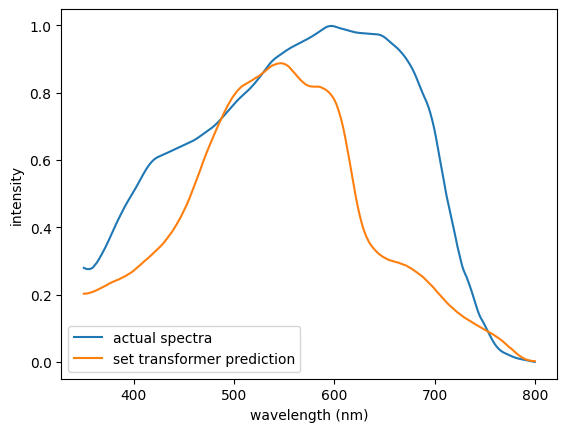

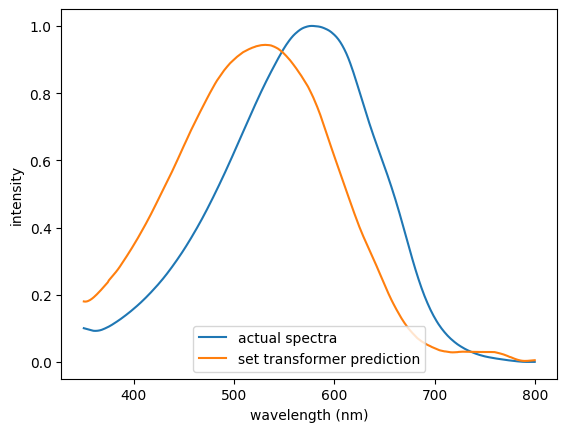

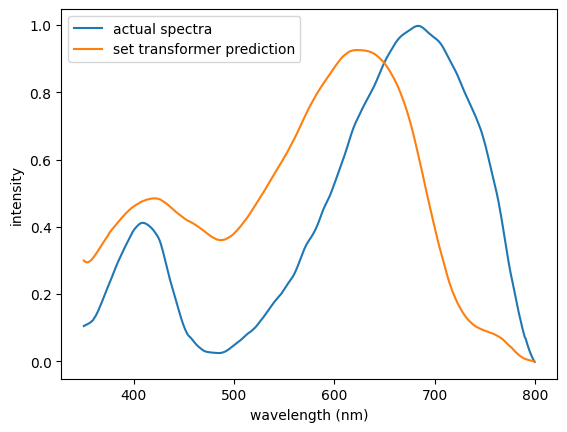

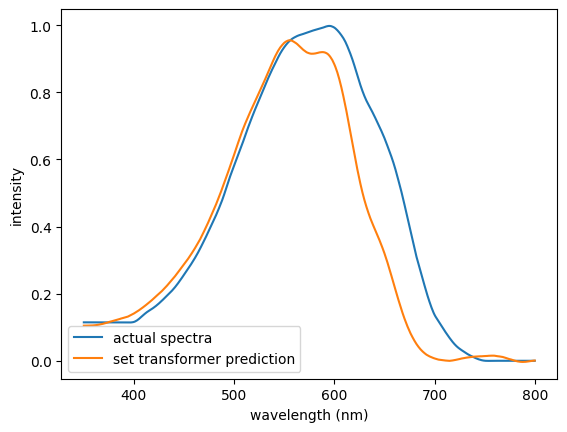

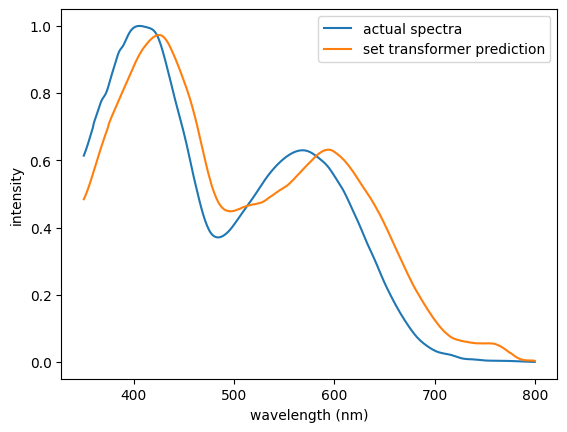

...

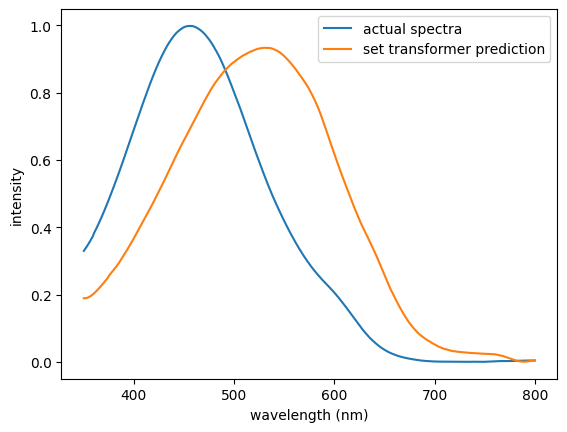

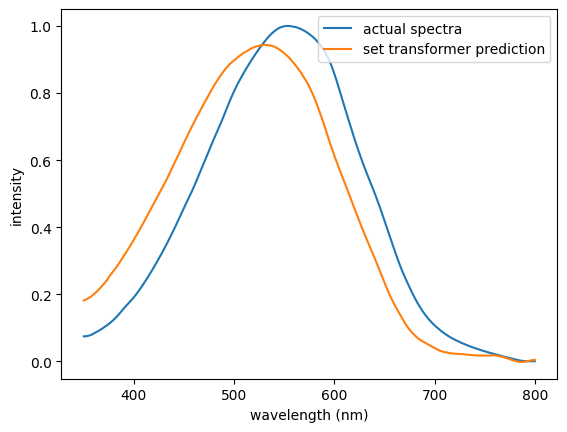

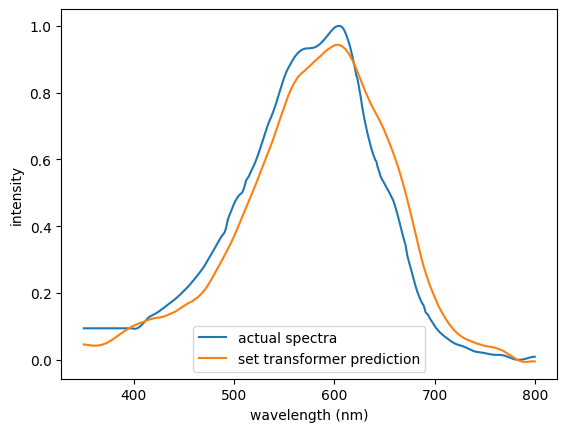

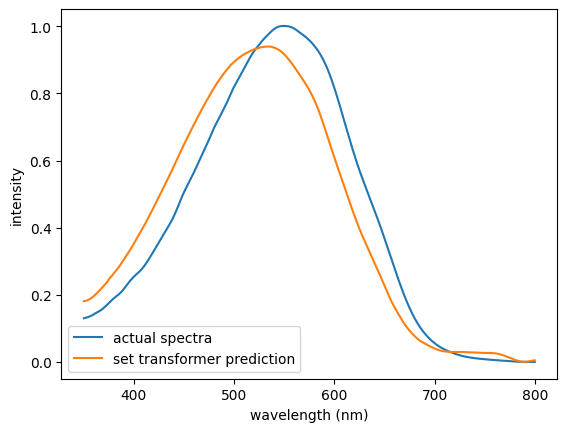

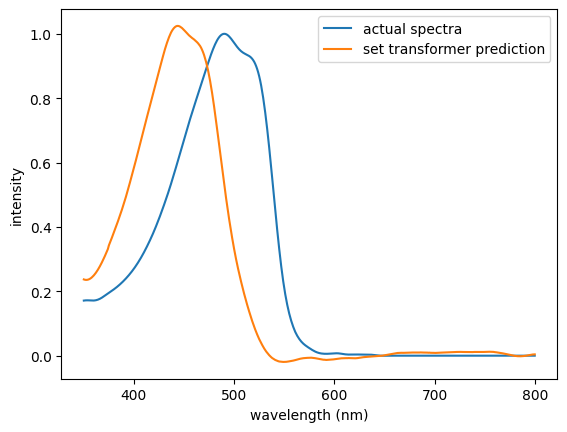

In [ ]:
for i in range(len( y_true)):

  plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), y_true[i], label = 'actual spectra')
  plt.plot(ast.literal_eval(electrochromics.wavelength.values[i]), y_pred[i], label = 'set transformer prediction')
  plt.xlabel('wavelength (nm)')
  plt.ylabel('intensity')
  plt.legend()
  plt.show()

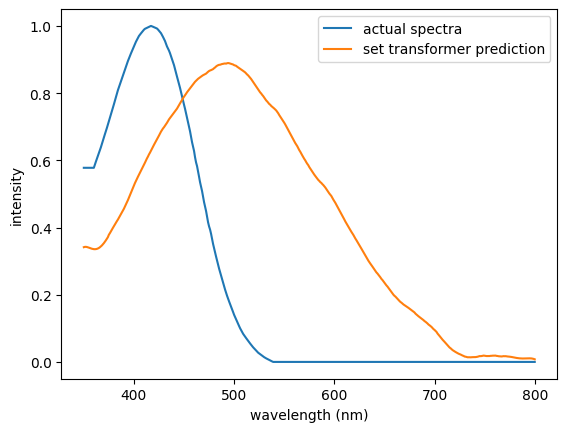

In [ ]:
plt.plot(ast.literal_eval(electrochromics.wavelength.values[3]), y_true[3], label = 'actual spectra')
plt.plot(ast.literal_eval(electrochromics.wavelength.values[3]), y_pred[3], label = 'set transformer prediction')
plt.xlabel('wavelength (nm)')
plt.ylabel('intensity')
plt.legend()
plt.show()

In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)
#0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450
device ='cpu'
epochs, learning_rate, batch_size = 150, 1e-3, 64
dropout_ratio = 0.15

model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

# Prepare your data
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train_lit.iloc[:, :Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train_lit, dtype=np.float16)


# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

NameError: name 'X_train_lit' is not defined

In [ ]:
import os
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
},  os.path.join('/content/', 'set_transformer_literature_data.tar'))

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true[:, 1:], y_pred[:, 1:], multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.584655928709
0.744759710516
0.0922309282221
0.690259269788


lims [26.0, 97.4375]
lims [-29.0, 79.90447]
lims [-63.363033, 78.0]


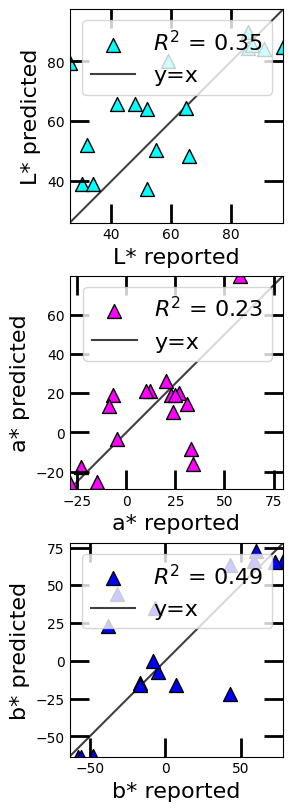

In [ ]:
# Create figure and axes
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=1, constrained_layout=True)#, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

# Setup each subplot
setup_subplot(axes[0], y_true[:,0], y_pred[:,0], "cyan", '^', 'L* reported', 'L* predicted')
setup_subplot(axes[1], y_true[:,1], y_pred[:,1], "magenta", '^', 'a* reported', 'a* predicted')
setup_subplot(axes[2], y_true[:,2], y_pred[:,2], "blue", '^', 'b* reported', 'b* predicted')

# Uncomment to save the figure
# plt.savefig('/path/to/save/figure.png', dpi=600)

plt.show()

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train_lit , dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.8526544903296687
0.7920565415094762
0.792304243311206
0.895065339936007


# Train on batch 1

In [ ]:
epochs, learning_rate, batch_size = 550, 1e-3, 12
dropout_ratio = 0.15
device = 'cpu'
import os

model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', 'set_transformer_literature_data.tar'))
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.15, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.15, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
 

In [ ]:
X_train,y_train = pd.concat([X_train_lit.iloc[:,:], batch_1_dataset], axis=0), np.concatenate([y_train_lit, experimental_lab__batch1_scaled])

In [ ]:
#X_train,y_train = batch_1_dataset,  experimental_lab__batch1_scaled

In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)

train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)


# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

100%|██████████| 550/550 [02:48<00:00,  3.26it/s]


In [ ]:
import os
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
},  os.path.join('/content/', 'set_transformer_literature_batch1.tar'))

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.31049302013859353
0.2886354307071103
0.012747474225969557
0.39226072891250885


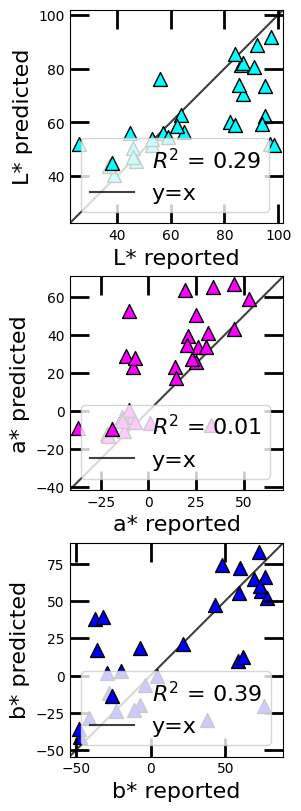

In [ ]:
# Create figure and axes
fig, axes = plt.subplots(figsize=(10,8), nrows=3, ncols=1, constrained_layout=True)#, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

# Setup each subplot
setup_subplot(axes[0], y_true[:,0], y_pred[:,0], "cyan", '^', 'L* reported', 'L* predicted')
setup_subplot(axes[1], y_true[:,1], y_pred[:,1], "magenta", '^', 'a* reported', 'a* predicted')
setup_subplot(axes[2], y_true[:,2], y_pred[:,2], "blue", '^', 'b* reported', 'b* predicted')

# Uncomment to save the figure
# plt.savefig('/path/to/save/figure.png', dpi=600)

plt.show()

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train_lit , dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.9112520976909989
0.8582608041564095
0.8631447349891954
0.945793243605299


# Train on batch 2

In [ ]:
epochs, learning_rate, batch_size = 50, 1e-3, 12
dropout_ratio = 0.15
device = 'cpu'
import os

model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', '/content/set_transformer_literature_batch1.tar'))
# model.load_state_dict(checkpoint['state_dict'])
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.15, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.15, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
 

In [ ]:
X_train,y_train = pd.concat([X_train_lit.iloc[:,:], batch_1_dataset, batch_2_dataset], axis=0), np.concatenate([y_train_lit , experimental_lab__batch1_scaled, experimental_lab__batch2_scaled])

In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)
#0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450
device ='cpu'
epochs, learning_rate, batch_size = 150, 1e-3, 64
dropout_ratio = 0.15

model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

# Prepare your data
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)


# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

100%|██████████| 150/150 [00:21<00:00,  6.94it/s]


In [ ]:
import os
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
},  os.path.join('/content/', 'set_transformer_literature_batch2.tar'))

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.3320000307624828
-0.35086902094353056
0.3615626188150961
0.46006337646461526


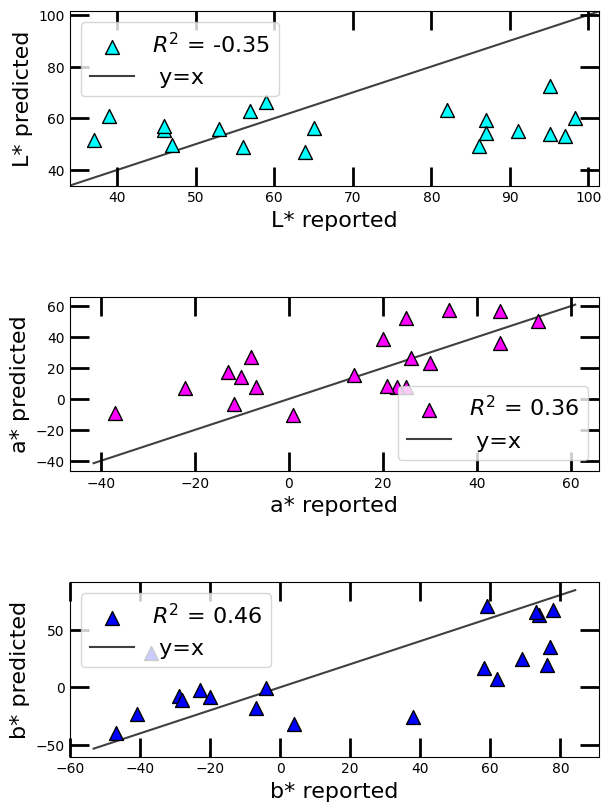

In [ ]:
# Construct histograms showing the scores distribution of the labeled/unlabeled data for each algorithm used
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
plt.rcParams["font.weight"] = "normal"
plt.rcParams["axes.labelweight"] = "normal"
fig, axes = plt.subplots(figsize=(6,8),nrows=3, ncols=1,constrained_layout=True, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

ax0, ax1, ax2= axes.flatten()

# Polymer Chemistry, 11, 2173 – 2181, 2020 journal

slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,0],y_pred[:,0])
ax0.scatter(y_true[:,0],y_pred[:,0],color="cyan", s=100, edgecolor='black', marker='^', label='$R^2$ = {:.2f}'.format(r2_score(y_true[:,0], y_pred[:,0])))

lims = [
    np.min([ax0.get_xlim(), ax0.get_ylim()]),  # min of both axes
    np.max([ax0.get_xlim(), ax0.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax0.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
#ax0.set_aspect('equal')
ax0.set_xlim(lims)
ax0.set_ylim(lims)
ax0.spines['bottom'].set_color('black')
ax0.spines['top'].set_color('black')
ax0.spines['right'].set_color('black')
ax0.spines['left'].set_color('black')
ax0.tick_params(axis = 'both', which='both', width=2)
ax0.tick_params(axis='x', colors='black')
ax0.tick_params(axis = 'both', which='major', length=14)
ax0.tick_params(axis = 'both', which='minor', length=8, color='black')
ax0.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax0.set_xlabel('L* reported', fontsize=16)
ax0.set_ylabel('L* predicted', fontsize=16)
ax0.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,1],y_pred[:,1])
ax1.scatter(y_true[:,1],y_pred[:,1], color="magenta", s=100, edgecolor='black', marker='^', label='$R^2$ = {:.2f}'.format(r2_score(y_true[:,1], y_pred[:,1])))
line = slope*np.array(y_true[:,1])+intercept
#ax1.plot(y_true[:,1], line, '-', linewidth=2.0, alpha=0.6, color='magenta' ,label='y={:.2f}x+{:.2f}'.format(slope,intercept))
lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black')
ax1.spines['right'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.tick_params(axis = 'both', which='both', width=2)
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis = 'both', which='major', length=14)
ax1.tick_params(axis = 'both', which='minor', length=8, color='black')
ax1.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax1.set_xlabel('a* reported', fontsize=16)
ax1.set_ylabel('a* predicted', fontsize=16)
ax1.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,2],y_pred[:,2])
ax2.scatter(y_true[:,2],y_pred[:,2], color="blue", s=100, edgecolor='black', marker='^', label='$R^2$ = {:.2f}'.format(r2_score(y_true[:,2], y_pred[:,2])))
line = slope*np.array(y_true[:,2])+intercept
#ax2.plot(y_true[:,2], line, '-', linewidth=2.0, alpha=0.6, label='y={:.2f}x+{:.2f}'.format(slope,intercept))

lims = [
    np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
    np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax2.spines['bottom'].set_color('black')
ax2.spines['top'].set_color('black')
ax2.spines['right'].set_color('black')
ax2.spines['left'].set_color('black')
ax2.tick_params(axis = 'both', which='both', width=2)
ax2.tick_params(axis='x', colors='black')

#major_ticks_x = np.arange(-30, 80, 20)
#minor_ticks_x = np.arange(-30, 80, 50)
#major_ticks_y = np.arange(-30, 80, 20)
#minor_ticks_y = np.arange(-30, 80, 5)
#ax2.set_xticks(major_ticks_x)
#ax2.set_xticks(minor_ticks_x, minor=True)
#ax2.set_yticks(major_ticks_y)
#ax2.set_yticks(minor_ticks_y, minor=True)

ax2.tick_params(axis = 'both', which='major', length=14)
ax2.tick_params(axis = 'both', which='minor', length=8, color='black')
ax2.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax2.set_xlabel('b* reported', fontsize=16)
ax2.set_ylabel('b* predicted', fontsize=16)
ax2.legend(prop={'size': 16})

#plt.savefig('/content/set_transformer_valid.png', rasterized=True,  bbox_inches="tight", dpi=600)

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train_lit , dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.6046749346120867
-0.3736057857166193
0.6749995895048877
0.7570430715225047


# Train on batch 3

In [ ]:
epochs, learning_rate, batch_size = 550, 1e-3, 12
dropout_ratio = 0.15
device = 'cpu'
import os

model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', '/content/set_transformer_literature_batch2.tar'))
# model.load_state_dict(checkpoint['state_dict'])
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

In [ ]:
X_train,y_train = pd.concat([X_train_lit.iloc[:,:], batch_1_dataset, batch_2_dataset, batch_3_dataset], axis=0), np.concatenate([y_train_lit , experimental_lab__batch1_scaled, experimental_lab__batch2_scaled, experimental_lab__batch3_scaled])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X_train_all, y_train_all , train_size=0.8, random_state=1)

In [ ]:
X_train, y_train = pd.concat([literature_dataset.iloc[:,:], batch_1_dataset, batch_2_dataset, dataset_external_valid], axis=0), np.concatenate([literature_lab_scaled, experimental_lab__batch1_scaled, experimental_lab__batch2_scaled, external_val_lab_scaled])

In [ ]:
X_train, y_train = pd.concat([literature_dataset.iloc[:,:], batch_1_dataset, batch_3_dataset], axis=0), np.concatenate([literature_lab_scaled, experimental_lab__batch1_scaled, experimental_lab__batch3_scaled])

In [ ]:
X_train, y_train = literature_dataset, literature_lab_scaled

In [ ]:
X_test, y_test = batch_3_dataset, experimental_lab__batch3_scaled # dataset_external_valid, external_val_lab_scaled #  dataset_external_valid, external_val_lab_scaled

In [ ]:
X_test, y_test = dataset_external_valid, external_val_lab_scaled #  dataset_external_valid, external_val_lab_scaled

In [ ]:
full_dataset = pd.concat([pd.DataFrame(literature_dataset.values, columns=literature_dataset.columns.values), pd.DataFrame(literature_lab_scaled, columns=['L','a','b'])], axis=1)
full_dataset

In [ ]:
X_train, y_train = pd.concat([literature_dataset.iloc[:,:], batch_1_dataset, batch_2_dataset, batch_3_dataset.iloc[:10, :].reset_index(drop=True)], axis=0), np.concatenate([literature_lab_scaled, experimental_lab__batch1_scaled, experimental_lab__batch2_scaled,  experimental_lab__batch3_scaled[:10]])

In [ ]:
X_test, y_test =  dataset_external_valid, external_val_lab_scaled # batch_3_dataset.iloc[:, :], experimental_lab__batch3_scaled[:]#

In [ ]:
X_test, y_test =   batch_3_dataset.iloc[10:, :], experimental_lab__batch3_scaled[10:]#

In [ ]:
X_test, y_test =  pd.concat([dataset_external_valid, batch_3_dataset.iloc[:, :]], axis=0), np.concatenate([external_val_lab_scaled, experimental_lab__batch3_scaled[:]])

In [ ]:
X_train_all, y_train_all = pd.concat([literature_dataset, dataset_external_valid, batch_1_dataset, batch_2_dataset, batch_3_dataset], axis=0), np.concatenate([literature_lab_scaled, external_val_lab_scaled , experimental_lab__batch1_scaled, experimental_lab__batch2_scaled,  experimental_lab__batch3_scaled])

X_train, X_test, y_train, y_test = train_test_split(
    X_train_all, y_train_all , train_size=0.75, random_state=1)

In [ ]:
X_train_all, y_train_all = literature_dataset, external_val_lab_scaled

X_train, X_test, y_train, y_test = train_test_split(
    X_train_all, y_train_all , train_size=0.75, random_state=1)

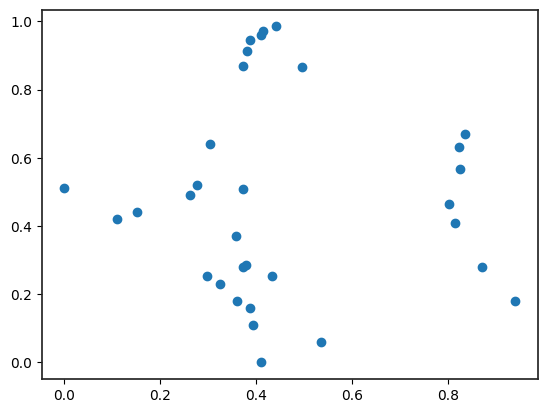

In [ ]:
plt.scatter(y_test[:, 0], y_test[:, 1])

In [ ]:
# Train the ML model with train data extracted from literature
Ndims = int(literature_dataset.shape[1]/3)

device ='cpu'
epochs, learning_rate, batch_size =  800, 1e-3, 32  #550, 1e-3, 64 #  450, 1e-3, 64 # {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 800}.
dropout_ratio = 0.1

model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

# Prepare your data
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)
# Initialize dataset
# monomer_dataset = MonomerPair(train_data_1, train_data_2,train_data_3, y_new )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=batch_size)#, shuffle=True)

# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

ValueError: could not convert string to float: '0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.159547738693, 0.162159757119, 0.164771775545, 0.16699513191, 0.168954145729, 0.170913159548, 0.172872173366, 0.174831187186, 0.176790201005, 0.179154103852, 0.183333333333, 0.187512562814, 0.190879396985, 0.194013819095, 0.197148241206, 0.202072864322, 0.208341708543, 0.211576633165, 0.214711055277, 0.217845477387, 0.220979899498, 0.226120184254, 0.231344221106, 0.235843278894, 0.239761306533, 0.243679334171, 0.247324120603, 0.250458542714, 0.253592964824, 0.257024706867, 0.262248743719, 0.267472780569, 0.271155778894, 0.274290201005, 0.277424623115, 0.280559045226, 0.285065326634, 0.290080402009, 0.295095477386, 0.300110552763, 0.306030150753, 0.312051926298, 0.316231155779, 0.32041038526, 0.323844221105, 0.326978643216, 0.330113065326, 0.333247487437, 0.336381909547, 0.349431532663, 0.360474246231, 0.364392273869, 0.368310301508, 0.372449748743, 0.378718592964, 0.384987437186, 0.389095477387, 0.392229899498, 0.397594221105, 0.408564698492, 0.414907872696, 0.419087102177, 0.423844221106, 0.430113065326, 0.436381909547, 0.445773510409, 0.455624551328, 0.465120244078, 0.469597989949, 0.474075735822, 0.479632537688, 0.488252198493, 0.496871859296, 0.505703517587, 0.51824120603, 0.536118090452, 0.552198492462, 0.560034547739, 0.570904522612, 0.583442211055, 0.594974874371, 0.605945351759, 0.616915829145, 0.62571451005, 0.637468592965, 0.649222675879, 0.646557788944, 0.661185092127, 0.67581239531, 0.686136934673, 0.695540201005, 0.706256281407, 0.718793969848, 0.731463567839, 0.750408291457, 0.758244346734, 0.763693467336, 0.767611494975, 0.771529522613, 0.776078831658, 0.781564070351, 0.787049309045, 0.792688442211, 0.798957286432, 0.805226130653, 0.8123220268, 0.819635678392, 0.825817839196, 0.83020603015, 0.834594221105, 0.83898241206, 0.842895728643, 0.846030150753, 0.849164572864, 0.852569095477, 0.857270728643, 0.861972361809, 0.866673994975, 0.877430904523, 0.890106783919, 0.905778894472, 0.921451005025, 0.910219849246, 0.930593592964, 0.944899497487, 0.954302763818, 0.957751256281, 0.960885678392, 0.964020100502, 0.967154522613, 0.978810720268, 0.982989949748, 0.987169179229, 0.99134840871, 0.995389447236, 0.998523869346, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.992663316583, 0.983260050251, 0.973856783919, 0.959648241206, 0.951477386934, 0.943954773869, 0.935615577889, 0.922283291456, 0.91444723618, 0.900072236181, 0.883266331657, 0.872094849246, 0.86425879397, 0.855345477387, 0.846074120603, 0.838238065327, 0.832663316582, 0.829528894472, 0.828752692031, 0.828304917444, 0.827857142857, 0.82740936827, 0.826961593682, 0.834987437185, 0.850787269682, 0.848697654941, 0.847864321608, 0.862214195979, 0.863781407035, 0.86534861809, 0.866915829146, 0.868483040201, 0.870050251256, 0.871617462311, 0.881881909547, 0.881255025125, 0.880628140703, 0.880001256281, 0.879227386934, 0.874525753768, 0.869824120602, 0.865122487437, 0.85391959799, 0.843156407034, 0.838454773869, 0.83147403685, 0.82311557789, 0.813844221106, 0.797386934673, 0.761130653265, 0.71851758794, 0.694535175879, 0.680213567839, 0.672377512563, 0.640615577889, 0.627355527638, 0.516331658291, 0.484974874371, 0.459899497488, 0.400486809045, 0.392650753769, 0.356867671691, 0.34850921273, 0.28368718593, 0.252763819095, 0.237091708543, 0.222644472362, 0.198698963567, 0.185769472362, 0.172839981156, 0.15991048995, 0.116601758794, 0.10343718593, 0.094924623116, 0.0865661641545, 0.0782077051926, 0.0628140703518, 0.0558486878839, 0.0488833054159, 0.0419179229481, 0.0342964824121, 0.0272395632006, 0.0245873598763, 0.021935156552, 0.0192829532277, 0.0166307499034, 0.0139785465791, 0.0130007677276, 0.012130094919, 0.0112594221106, 0.0103887493021, 0.00951807649359, 0.00864740368515, 0.0077767308766, 0.00708291457291, 0.00645603015079, 0.00582914572868, 0.00520226130656, 0.0050251256282, 0.00498037060304, 0.00458856783918, 0.00419676507542, 0.00380496231156, 0.0034131595478, 0.00302135678394, 0.00262955402008, 0.00223775125632, 0.00184594849246, 0.0014541457287, 0.00106234296484, 0.000670540201081, 0.000278737437219, 1.38777878078e-17, 1.73472347598e-17, 0.0, 2.08166817117e-17, 1.73472347598e-17, 1.73472347598e-17, 1.38777878078e-17, 0.000228747906245, 0.00048994974882, 0.000751151591291, 0.00101235343387, 0.00123037060302, 0.000838567839258, 0.000446765075397, 5.49623115352e-05, 0.000336840452326, 0.000728643216085, 0.00112044597995, 0.0015122487437, 0.00190405150757, 0.00229585427143, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0025125628141, 0.0021880234506, 0.00166561976556, 0.00114321608041, 0.000620812395361, 9.84087102127e-05, 1.73472347598e-17, 1.04083408559e-17, 6.93889390391e-18, 2.77555756156e-17, 6.93889390391e-18, 1.38777878078e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17, 1.04083408559e-17'

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true=scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.7809835338160913
0.7468997495018426
0.718565865785719
0.8154747051330837


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.5779909464453333
0.6610382425069854
0.5214106365653671
0.5914177002001139


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train , dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.8940748131665832
0.7749394963586181
0.8616111648455554
0.9336642187227426


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true=y_test # scalery.inverse_transform(y_test)
y_pred= y_pred_test #scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[2:,0], y_pred[2:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[2:,1], y_pred[2:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[2:,2], y_pred[2:,2])) #, multioutput='variance_weighted'))

0.7338144439763662
0.7672630401995623
0.7367316502661242
0.9092554861750213


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.671364686170899
0.7870785282102075
0.5446448651993053
0.7284856597143816


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())


print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.6862278493846581
0.8003466310455372
0.5591243338931582
0.743887690657508


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)
# monomer_dataset = MonomerPair(test_data_1, test_data_2, test_data_3, y_test )

# Create DataLoader
# data_loader = DataLoader(monomer_dataset, batch_size=len(test_data_1))
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3, y_test) #(data_loader)

y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.8237795768409503
0.7168744520588589
0.7757129360633371
0.871194555805687


In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

TypeError: SmallSetTransformer_v2.test_model() takes 2 positional arguments but 5 were given

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test_lit, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

NameError: name 'X_test_lit' is not defined

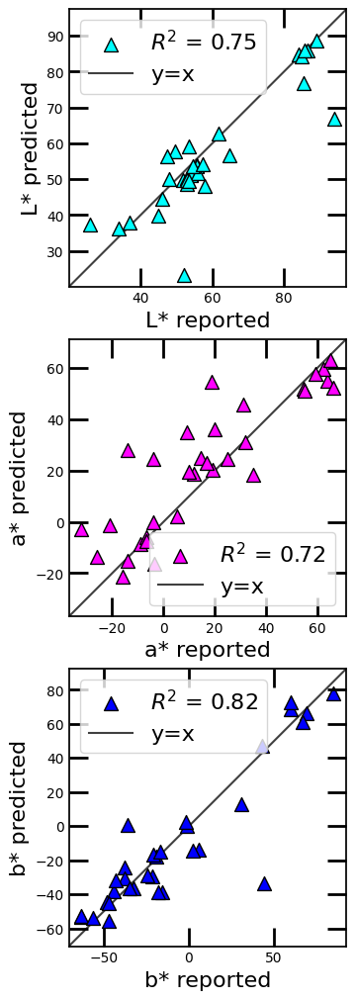

In [ ]:
def setup_subplot(ax, y_true, y_pred, color, marker, xlabel, ylabel):
    ax.scatter(y_true, y_pred, color=color, s=100, edgecolor='black', marker=marker,
               label='$R^2$ = {:.2f}'.format(r2_score(y_true, y_pred)))
    lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
        np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label='y=x')
    ax.set_aspect('equal', adjustable='box')
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    ax.spines['bottom'].set_color('black')
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['left'].set_color('black')
    ax.tick_params(axis='both', which='both', width=2)
    ax.tick_params(axis='x', colors='black')
    ax.tick_params(axis='both', which='major', length=14)
    ax.tick_params(axis='both', which='minor', length=8, color='black')
    ax.tick_params(axis='both', which='both', bottom=True, top=True, left=True, right=True, direction='in')
    ax.set_xlabel(xlabel, fontsize=16)
    ax.set_ylabel(ylabel, fontsize=16)
    ax.legend(prop={'size': 16})

# Create figure and axes
fig, axes = plt.subplots(figsize=(8,10), nrows=3, ncols=1, constrained_layout=True)

# Setup each subplot
setup_subplot(axes[0], y_true[:,0], y_pred[:,0], "cyan", '^', 'L* reported', 'L* predicted')
setup_subplot(axes[1], y_true[:,1], y_pred[:,1], "magenta", '^', 'a* reported', 'a* predicted')
setup_subplot(axes[2], y_true[:,2], y_pred[:,2], "blue", '^', 'b* reported', 'b* predicted')

# Uncomment to save the figure
# plt.savefig('/path/to/save/figure.png', dpi=600)

plt.show()

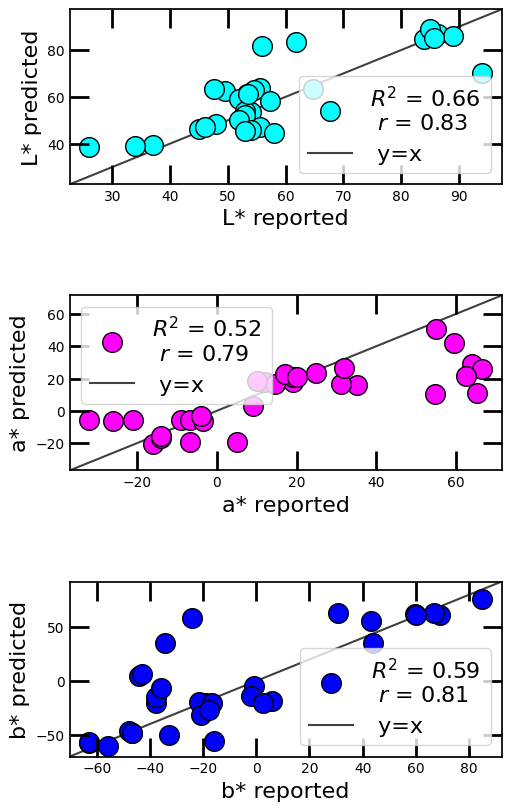

In [ ]:
# Construct histograms showing the scores distribution of the labeled/unlabeled data for each algorithm used
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
plt.rcParams["font.weight"] = "normal"
plt.rcParams["axes.labelweight"] = "normal"
fig, axes = plt.subplots(figsize=(5,8),nrows=3, ncols=1,constrained_layout=True, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

ax0, ax1, ax2= axes.flatten()

# Polymer Chemistry, 11, 2173 – 2181, 2020 journal

slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,0],y_pred[:,0])
r2 =r2_score(y_true[:,0], y_pred[:,0])
ax0.scatter(y_true[:,0],y_pred[:,0], color="cyan", s=200, edgecolor='black', marker='o', label='$R^2$ = {:.2f} \n $r$ = {:.2f}'.format(r2, r_value))
# ax0.scatter(y_true[:,0],y_pred[:,0],color="cyan", s=100, edgecolor='black', marker='^', label='$R^2$ = {:.2f}'.format(r2_score(y_true[:,0], y_pred[:,0])))

lims = [
    np.min([ax0.get_xlim(), ax0.get_ylim()]),  # min of both axes
    np.max([ax0.get_xlim(), ax0.get_ylim()]),  # max of both axes
]
ax.set_xlim(lims)
ax.set_ylim(lims)
# now plot both limits against eachother
ax0.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
# ax0.set_aspect('equal')
ax0.set_xlim(lims)
ax0.set_ylim(lims)
ax0.spines['bottom'].set_color('black')
ax0.spines['top'].set_color('black')
ax0.spines['right'].set_color('black')
ax0.spines['left'].set_color('black')
ax0.tick_params(axis = 'both', which='both', width=2)
ax0.tick_params(axis='x', colors='black')
ax0.tick_params(axis = 'both', which='major', length=14)
ax0.tick_params(axis = 'both', which='minor', length=8, color='black')
ax0.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax0.set_xlabel('L* reported', fontsize=16)
ax0.set_ylabel('L* predicted', fontsize=16)
ax0.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,1],y_pred[:,1])
r2 =r2_score(y_true[:,1], y_pred[:,1])
ax1.scatter(y_true[:,1],y_pred[:,1],  marker='o', color="magenta", s=200, edgecolor='black',label='$R^2$ = {:.2f} \n $r$ = {:.2f}'.format(r2, r_value))
# ax1.scatter(y_true[:,1],y_pred[:,1], color="magenta", s=100, edgecolor='black', marker='^', label='$R^2$ = {:.2f}'.format(r2_score(y_true[:,1], y_pred[:,1])))
line = slope*np.array(y_true[:,1])+intercept
#ax1.plot(y_true[:,1], line, '-', linewidth=2.0, alpha=0.6, color='magenta' ,label='y={:.2f}x+{:.2f}'.format(slope,intercept))
lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]
ax1.set_xlim(lims)
ax1.set_ylim(lims)
# now plot both limits against eachother
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black')
ax1.spines['right'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.tick_params(axis = 'both', which='both', width=2)
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis = 'both', which='major', length=14)
ax1.tick_params(axis = 'both', which='minor', length=8, color='black')
ax1.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax1.set_xlabel('a* reported', fontsize=16)
ax1.set_ylabel('a* predicted', fontsize=16)
ax1.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,2],y_pred[:,2])
r2 =r2_score(y_true[:,2], y_pred[:,2])
ax2.scatter(y_true[:,2],y_pred[:,2], color="blue", s=200, edgecolor='black', marker='o', label='$R^2$ = {:.2f} \n $r$ = {:.2f}'.format(r2, r_value))
            #'$R^2$ = {:.2f}'.format(r2_score(y_true[:,2], y_pred[:,2])))
r_value
line = slope*np.array(y_true[:,2])+intercept
#ax2.plot(y_true[:,2], line, '-', linewidth=2.0, alpha=0.6, label='y={:.2f}x+{:.2f}'.format(slope,intercept))

lims = [
    np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
    np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]
ax2.set_xlim(lims)
ax2.set_ylim(lims)
# now plot both limits against eachother
ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax2.spines['bottom'].set_color('black')
ax2.spines['top'].set_color('black')
ax2.spines['right'].set_color('black')
ax2.spines['left'].set_color('black')
ax2.tick_params(axis = 'both', which='both', width=2)
ax2.tick_params(axis='x', colors='black')

#major_ticks_x = np.arange(-30, 80, 20)
#minor_ticks_x = np.arange(-30, 80, 50)
#major_ticks_y = np.arange(-30, 80, 20)
#minor_ticks_y = np.arange(-30, 80, 5)
#ax2.set_xticks(major_ticks_x)
#ax2.set_xticks(minor_ticks_x, minor=True)
#ax2.set_yticks(major_ticks_y)
#ax2.set_yticks(minor_ticks_y, minor=True)

ax2.tick_params(axis = 'both', which='major', length=14)
ax2.tick_params(axis = 'both', which='minor', length=8, color='black')
ax2.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax2.set_xlabel('b* reported', fontsize=16)
ax2.set_ylabel('b* predicted', fontsize=16)
ax2.legend(prop={'size': 16})

plt.savefig('/content/literature.svg')#, rasterized=True,  bbox_inches="tight", dpi=600)

In [ ]:
Ndims = int(literature_dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train_lit.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train_lit.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train_lit.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train_lit , dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

# Model comparison

In [ ]:
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import RandomForestRegressor
#RandomForestRegressor( n_estimators=100,  max_depth=15, random_state=0)
# CatBoostRegressor(loss_function='MultiRMSE', n_estimators=200, learning_rate=0.10, max_depth=15, random_state=0)
regr_rf = RandomForestRegressor( n_estimators=100,  max_depth=15, random_state=0)
#CatBoostRegressor(loss_function='MultiRMSE', n_estimators=100, learning_rate=0.10, max_depth=15, random_state=0) #RandomForestRegressor(n_estimators=100, max_depth=12, random_state=888)
regr_rf.fit(X_train.values, y_train)

RandomForestRegressor(max_depth=15, random_state=0)

In [ ]:
rf_preds = model.predict(valid_data)
y_true= scalery.inverse_transform(y_valid)
y_pred = scalery.inverse_transform(rf_preds)#.detach().numpy())

rf_df_test = pd.DataFrame(np.mean(abs(y_true - y_pred)[:, :], axis=1), columns=['MAE'])
rf_df_test['model'] = ['Random Forest' for _ in range(rf_df_test.shape[0])]

In [ ]:
df_test_all = pd.concat([df_test, rf_df_test])
#df_test_all

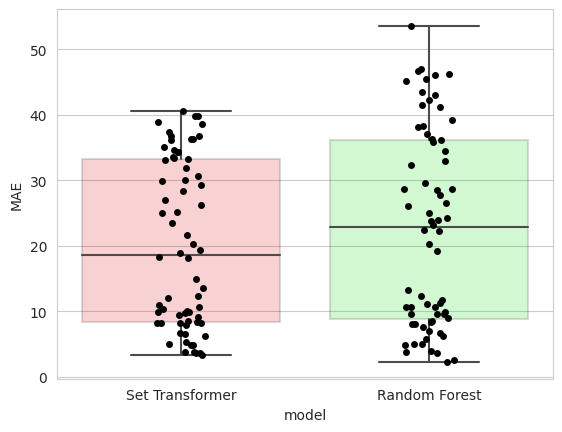

In [ ]:
import seaborn as sns

sns.set_style('whitegrid')
boxprops = { 'alpha': 0.2} #'facecolor': 'blue',
# Let's say you have three models, then you might choose three colors with transparency.
# You can adjust colors and alpha (for transparency) values as you prefer.
colors = ["#FF000025", "#00FF0000", "#0000FF55"]  # Here 55 at the end of each color sets the transparency

palette = sns.color_palette(colors)

ax = sns.boxplot(x='model', y='MAE', data=df_test_all, palette=palette, boxprops=boxprops)
ax = sns.stripplot(x="model", y="MAE", data=df_test_all, color='black')


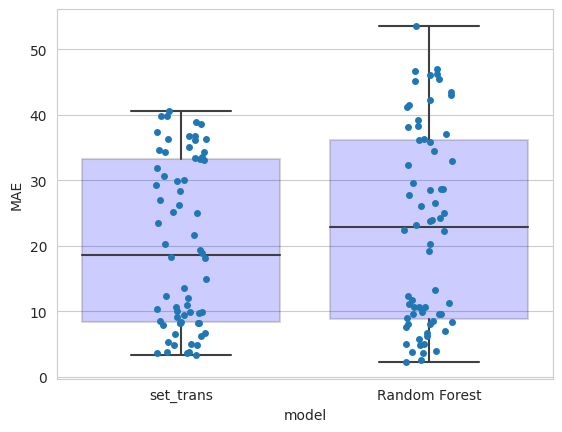

In [ ]:
import seaborn as sns
sns.set_style('whitegrid')
boxprops = {'facecolor': 'blue', 'alpha': 0.2}
ax= sns.boxplot(x='model',y='MAE',data=df_test_all, boxprops=boxprops)
ax = sns.stripplot(x="model", y="MAE",data=df_test_all)

In [ ]:
mae = mean_absolute_error(y_true, y_pred)#, multioutput='raw_values')
mae

12.290614

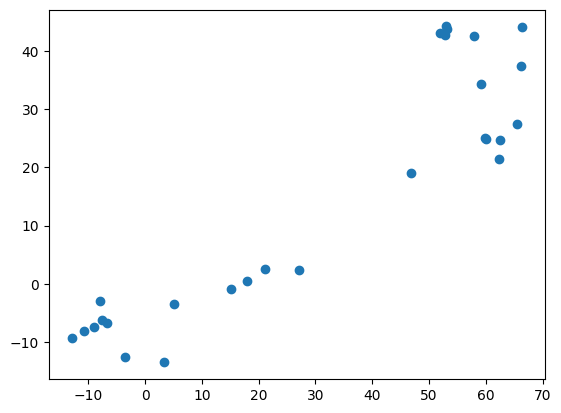

In [ ]:
plt.scatter(y_true[:,1], y_pred[:,1])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    dataset, df_y_scaled, train_size=0.99999999, random_state=888)

In [ ]:
len(df_y_scaled[:99])

99

In [ ]:
X_train,y_train = dataset.iloc[:99,:], df_y_scaled[:99]

In [ ]:
X_train,y_train = dataset.iloc[:,:], df_y_scaled

In [ ]:
batch_1 = dataset_test.iloc[:21, :]
batch_2  = dataset_test.iloc[21:44, :]
batch_3 = dataset_test.iloc[44:, :]

In [ ]:
X_train.shape

(168, 3168)

In [ ]:
X_train,y_train = pd.concat([dataset.iloc[:,:], dataset_test], axis=0), np.concatenate([df_y_scaled, experimental_y_scaled])

In [ ]:
X_train

,bit_A_0,bit_A_1,bit_A_2,bit_A_3,bit_A_4,bit_A_5,bit_A_6,bit_A_7,bit_A_8,bit_A_9,...,C_ES_osc_strength_2,C_ES_osc_strength_3,C_ES_osc_strength_4,C_ES_osc_strength_5,C_ES_osc_strength_6,C_ES_osc_strength_7,C_ES_osc_strength_8,C_ES_osc_strength_9,C_ES_osc_strength_10,percentage_3
0,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
1,0,0,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
2,0,1,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
3,0,1,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
4,0,1,0,0,0,0,0,0,0,0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,0,1,0,0,0,0,0,0,0,0,...,0.000556,0.792381,0.261816,0.028060,0.007842,0.052997,0.167902,0.010136,0.025119,0.05
8,0,1,0,0,0,0,0,0,0,0,...,0.002225,1.000000,0.202071,0.108734,0.000270,0.114595,0.001710,0.007894,0.000159,0.15
9,0,1,0,0,0,0,0,0,0,0,...,0.000556,0.792381,0.261816,0.028060,0.007842,0.052997,0.167902,0.010136,0.025119,0.10
10,0,1,0,0,0,0,0,0,0,0,...,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000,0.05


In [ ]:
epochs, learning_rate, batch_size = 500, 1e-3, 12
dropout_ratio = 0.2
device = 'cpu'
import os

model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', 'set_transformer_new_model_0_test_12_400_02_final.tar'))
# model.load_state_dict(checkpoint['state_dict'])
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(
#     dataset, df_y_scaled, train_size=0.990, random_state=0)
Ndims = int(dataset.shape[1]/3)
#0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450
device ='cpu'
epochs, learning_rate, batch_size = 800, 1e-3, 12
dropout_ratio = 0.2

model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

# Prepare your data
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)


# Train the model
losses, optimizer = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

100%|██████████| 800/800 [06:26<00:00,  2.07it/s]


In [ ]:
!pip install hiddenlayer

In [ ]:
for x, y in DataLoader(MonomerPair(train_data_1, train_data_2,train_data_3, y_new)):
  x, y = x.float().cpu(), y.float().cpu()
  y= model(x)


In [ ]:
!pip install torchviz

In [ ]:
from torchviz import make_dot

make_dot(x, params=dict(list(model.named_parameters()))).render("rnn_torchviz", format="png")

'rnn_torchviz.png'

In [ ]:
batch = next(iter(DataLoader(MonomerPair(train_data_1, train_data_2,train_data_3, y_new))))
batch[0]
# yhat = model(batch[0]) # Give dummy batch to forward().

tensor([[0.0000, 0.0000, 1.0000,  ..., 0.0000, 0.0000, 0.4000]],
       dtype=torch.float64)

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import torch

# Initialize a writer
writer = SummaryWriter('runs/model_visualization')

# Write the model
writer.add_graph(model, input_to_model=x)
writer.close()

In [ ]:
!pip install torchviz

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {'runs/model_visualization'} --host "0.0.0.0" --port 6006

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
# batch 1


# Prepare your data
train_data_1, train_data_2,train_data_3, y_new = np.array(dataset_test.iloc[:, :Ndims].values, dtype=float), np.array(dataset_test.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled, dtype=np.float16)


# Train the model
losses = model.train_model(train_data_1, train_data_2,train_data_3, y_new)

NameError: name 'Ndims' is not defined

MAE: 0.012 (0.010)


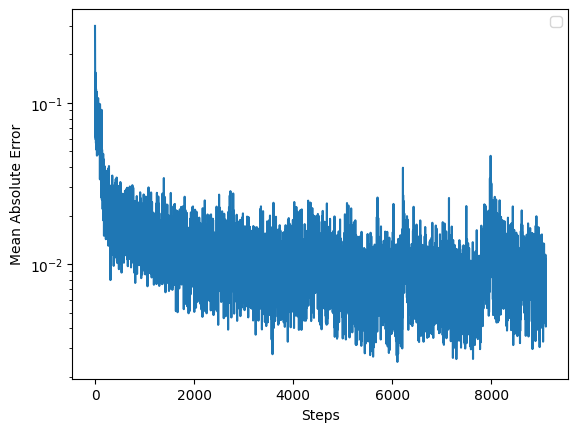

In [ ]:
# 750 epochs
plt.plot(losses)
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

MAE: 0.013 (0.013)


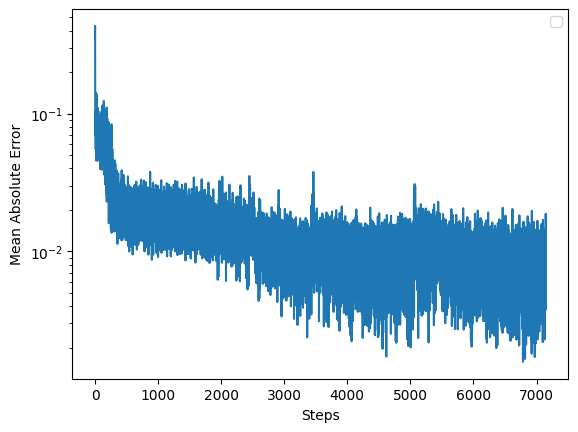

In [ ]:
# 650 epochs
plt.plot(losses)
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

MAE: 0.014 (0.014)


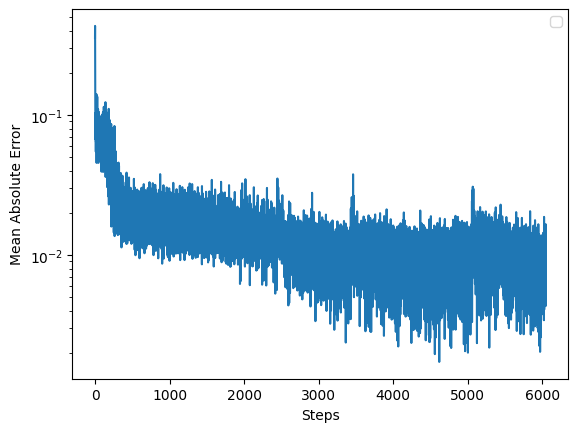

In [ ]:
# 550 epochs
plt.plot(losses)
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

MAE: 0.017 (0.018)


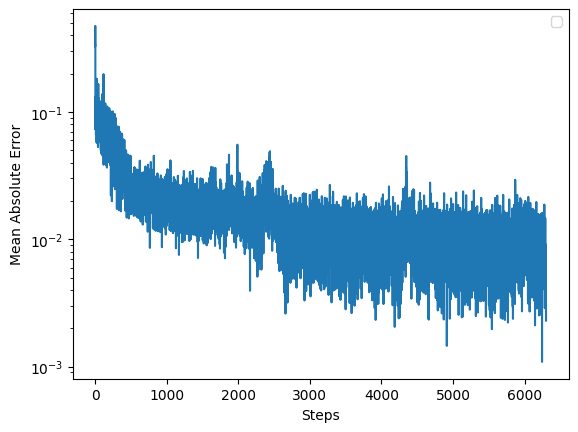

In [ ]:

# 450 epochs
plt.plot(losses)
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

MAE: 0.022 (0.020)


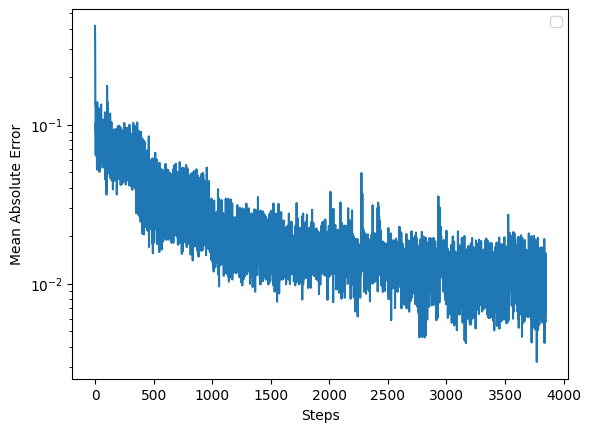

In [ ]:
# 350 epochs
plt.plot(losses)
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

100%|██████████| 550/550 [08:00<00:00,  1.15it/s]


MAE: 0.019 (0.019)


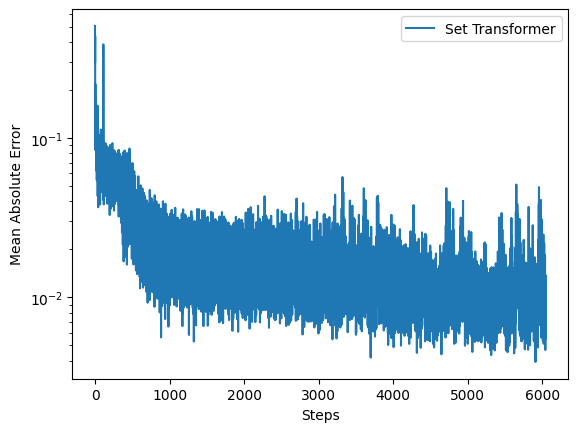

In [ ]:
models = [
    ("Set Transformer", SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)), #,
]
device='cpu'
losses=[]

Ndims = np.int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)

for _name, _model in models:
    _losses = train(_model, train_data_1, train_data_2, train_data_3 ,y_new)
    test(_model, train_data_1, train_data_2, train_data_3 ,y_new)

    plt.plot(_losses, label=_name)
    losses.append(_losses)

print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

100%|██████████| 550/550 [07:43<00:00,  1.19it/s]


MAE: 0.014 (0.014)


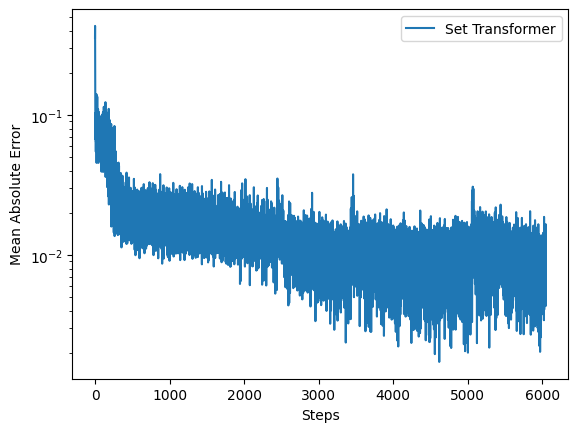

In [ ]:
models = [
    ("Set Transformer", SmallSetTransformer_v2(dropout_ratio)), #,  device, epochs, learning_rate, batch_size
]
device='cpu'
losses=[]

Ndims = np.int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)

for _name, _model in models:
    _losses = train(_model, train_data_1, train_data_2, train_data_3 ,y_new)
    test(_model, train_data_1, train_data_2, train_data_3 ,y_new)

    plt.plot(_losses, label=_name)
    losses.append(_losses)

print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))
plt.legend()
plt.xlabel("Steps")
plt.ylabel("Mean Absolute Error")
plt.yscale("log")
plt.show()

In [ ]:
from ml_modules import *
from ml_utils import *

In [ ]:
%cd ..

/content


In [ ]:
all_possibilities=pd.read_csv('all_possible_space.csv')
all_possibilities.head()

,smiles1,smiles2,smiles3,percentage_1,percentage_2,percentage_3
0,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,C1=CC(=CC=C1C)C,0,95,5,0
1,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,C1=CC(=CC=C1C)C,Cc1ccc(C)c2nsnc12,95,0,5
2,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,C1=CC(=CC=C1C)C,Cc1sc(C)c(OC)c1OC,95,0,5
3,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,C1=CC(=CC=C1C)C,Cc1sc(C)c2OCCOc12,95,0,5
4,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nsnc12,0,95,5,0


In [ ]:
all_possibilities=pd.read_csv('all_possible_space.csv')
all_possibilities['percentage_1'] = all_possibilities['percentage_1']/100
all_possibilities['percentage_2'] = all_possibilities['percentage_2']/100
all_possibilities['percentage_3'] = all_possibilities['percentage_3']/100
dataset = all_possibilities[all_possibilities["percentage_1"] !=1]
dataset=dataset.reset_index(drop=True)
validation_1 = bits_to_df(dataset['smiles1'], 'bit_1')
validation_2 = bits_to_df(dataset['smiles2'], 'bit_2')
validation_3 = bits_to_df(dataset['smiles3'], 'bit_3')
df1_dft = dft_descr_from_df(dataset['smiles1'], 'A')
df2_dft  = dft_descr_from_df(dataset['smiles2'], 'B')
df3_dft  = dft_descr_from_df(dataset['smiles3'], 'C')

validation_dataset = pd.concat([
    dataset['smiles1'],
    dataset['smiles2'],
    dataset['smiles3'],
    validation_1,df1_dft,
    dataset[['percentage_1']],
    validation_2,df2_dft,
    dataset[['percentage_2']],
    validation_3, df3_dft,
    dataset[['percentage_3']]
], axis=1)
all_possibilities = validation_dataset

[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:05] SMILES Parse Error: Failed parsing SMILES '0' for input: '0'
[07:28:05] SMILES Parse Error: syntax error while parsing: 0
[07:28:0

In [ ]:
all_possibilities.shape

(700, 3171)

In [ ]:
from scipy.stats import norm
def select_next_exp_ml(dataframe, selected_color, uncertainties, iteration):
    """Color comparison based on the delta-E value: https://python-colormath.readthedocs.io/en/latest/delta_e.html"""
    selected_color_lab = LabColor(selected_color[0], selected_color[1], selected_color[2])
    print('selected_color_lab', selected_color_lab)
    #print('dataframe',dataframe)
    dataframe['delta_e'] = dataframe.apply(lambda row: delta_e_cie2000(selected_color_lab, LabColor(row['L'], row['a'] ,row['b'])), axis=1)
    dataframe['uncertainties']  = uncertainties
    #if iteration == 0 or iteration ==1:
    EI_values = expectedImprovement(dataframe['delta_e'].values, uncertainties, ybest=0, epsilon=0.001) #00
       #EI_values =upperConfidenceBound(dataframe['delta_e'].values, uncertainties, epsilon=0.01)
    #else:
     #  EI_values = expectedImprovement(dataframe['delta_e'].values, uncertainties, ybest=10, epsilon=100)
    # EI_values = dataframe['delta_e'].values
    #print('uncertainties', uncertainties)
    #print('index', dataframe.index)

    # top_6_loc = np.argpartition(EI_values, 6)[:6] # we want to select the top 6 experiments with expected improvent
    #
    top_6_loc = np.argpartition(EI_values, 6)[:6]
    print('top_6_loc', top_6_loc )
    top_6_sorted_indices = [np.argsort(EI_values[top_6_loc])]
    print('top_6_sorted_indices', top_6_sorted_indices)
    df = dataframe.loc[top_6_loc , :]
    dataframe['uncertainties'] = uncertainties
    dataframe['EI_values'] = EI_values
    print('top_6_loc', top_6_loc)
    plt.scatter(dataframe.index, uncertainties)
    plt.scatter(top_6_loc,dataframe.loc[top_6_loc, :]['uncertainties'],color='r',marker='s',s=100,facecolor='None')
    plt.xlabel('index', fontsize=14)
    plt.ylabel('Uncertainty', fontsize=14)
    plt.show()
    print('EI_values', EI_values.min() )
    plt.scatter(dataframe.index, EI_values)
    plt.scatter(top_6_loc,dataframe.loc[top_6_loc, :]['EI_values'],color='r',marker='s',s=100,facecolor='None')
    plt.xlabel('index', fontsize=14)
    plt.ylabel('Expected improvement', fontsize=14)
    plt.show()

    plt.scatter(EI_values, uncertainties)
    plt.scatter(dataframe.loc[top_6_loc, :]['EI_values'],dataframe.loc[top_6_loc, :]['uncertainties'],color='r',marker='s',s=100,facecolor='None')
    plt.xlabel('Expected improvement', fontsize=14)
    plt.ylabel('Uncertainty', fontsize=14)
    plt.show()
    # print('new_df', dataframe.loc[top_6_loc, :])
    # dataframe.sort_values(by=['delta_e'], ascending =True).head(6) # select the 6 points closer to the selected color value
    #df.to_csv('test.csv')
    return df

# Acquisition functions
def upperConfidenceBound(ye_pred, esigma, epsilon):
    """
        ye_pred: predicted values distance to target
        esigma: uncertainty
        epsilon: control exploration/exploitation. Higher epsilon means more exploration
    """
    ucb = np.empty(ye_pred.size, dtype=float)
    for ii in range(0,ye_pred.size):
        if esigma[ii] > 0:
            ucb[ii]=(ye_pred[ii]+epsilon*(esigma[ii]))
        else:
            ucb[ii]=0.0
    return ucb

def expectedImprovement(ye_pred, esigma, ybest, epsilon=0.01):
    expI = np.empty(ye_pred.size, dtype=float)
    for ii in range(ye_pred.size):
        if esigma[ii] > 0:
            zzval=(ye_pred[ii]-ybest)/float(esigma[ii])
            expI[ii]=(ye_pred[ii]-ybest-epsilon)*norm.cdf(zzval)+esigma[ii]*norm.pdf(zzval)
        else:
            expI[ii]=0.0
    return expI

def convert_for_chemspeed(dataframe):
    monomers_dict = {
       "Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12":"ProDOT-2Br",
       "C1=CC(=CC=C1C)C":"Ben-2Br",
       "Cc1ccc(C)c2nsnc12":"BTD-2Br",
       "Cc1sc(C)c(OC)c1OC":"DMoT-2Br", #Cc1sc(C)c(OC)c1OC
       "Cc1sc(C)c2OCCOc12":"EDOT-2Br",
       "Cc1ccc3c(c1)Cc2cc(C)ccc23":"green-2Br"
    }
    dataframe['percentage_1'] = (dataframe['percentage_1']-0.5)*2
    dataframe['percentage_2'] = dataframe['percentage_2']*2
    dataframe['percentage_3'] = dataframe['percentage_3']*2
    csv = pd.DataFrame(0, index=np.arange(dataframe.shape[0]), columns=["ProDOT-2Br", "Ben-2Br", "BTD-2Br", "DMoT-2Br", "EDOT-2Br", "green-2Br"])
    for i, ix in enumerate(dataframe.index):
       for monomer in ['1','2','3']:
            label = monomers_dict.get(dataframe.loc[ix, f'smiles{monomer}'], 0)
            value = dataframe.loc[ix, f'percentage_{monomer}'] * 1000
            if label in csv.columns:
                csv.loc[i, label] = round(value)
    return csv

In [ ]:
import os
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
},  os.path.join('/content/', 'set_transformer_new_model_2_test_12_800_02_final_retrain_all.tar'))  #set_transformer_new_model_0_test_12_750_02.tar  /content/set_transformer_new_model_0.tar

In [ ]:
epochs, learning_rate, batch_size = 2, 1e-3, 12
dropout_ratio = 0.15
device = 'cpu'
import os

model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', 'set_transformer_new_model_2_test_12_800_02_final_retrain_all.tar'))
# model.load_state_dict(checkpoint['state_dict'])
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
#torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.15, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.15, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
 

In [ ]:
epochs, learning_rate, batch_size = 5, 1e-3, 12
dropout_ratio = 0.2
model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', 'set_transformer_new_model_1_tza.tar'))
# model.load_state_dict(checkpoint['state_dict'])
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
device = 'cpu' #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
# Also, move your data to the device in your training loop


SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.2, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.2, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
   

target_Lab [65, -20, 40]


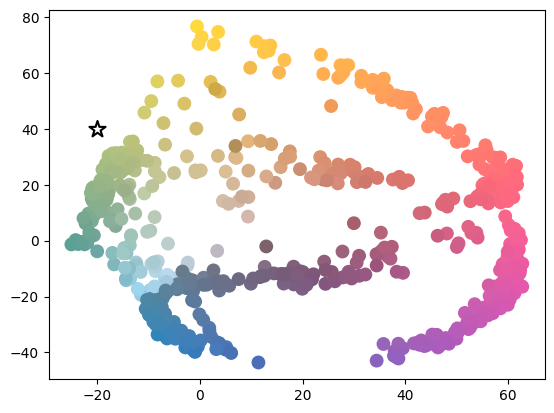

selected_color_lab LabColor (lab_l:65.0000 lab_a:-20.0000 lab_b:40.0000)
top_6_loc [578 438 648 539 299 349]
top_6_sorted_indices [array([1, 2, 0, 3, 5, 4])]
top_6_loc [578 438 648 539 299 349]


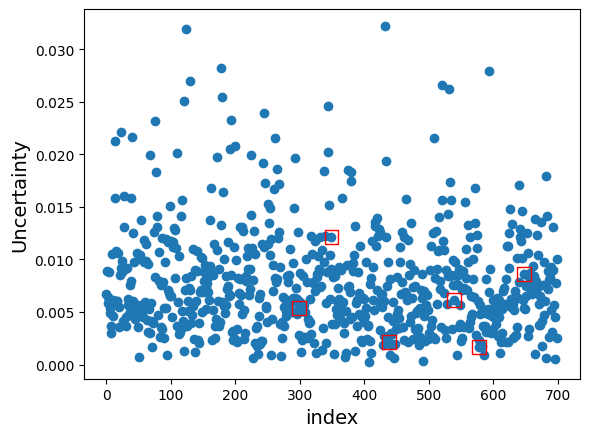

EI_values 8.10732317001119


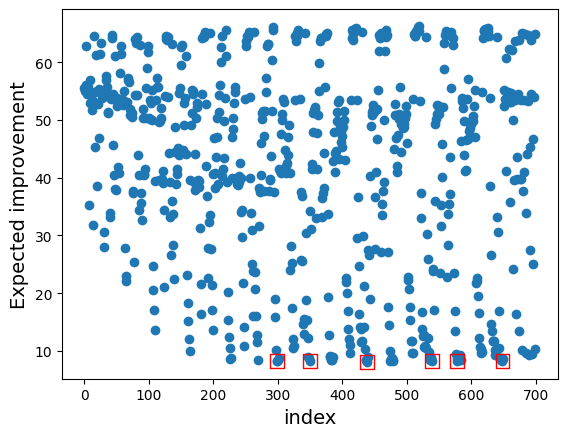

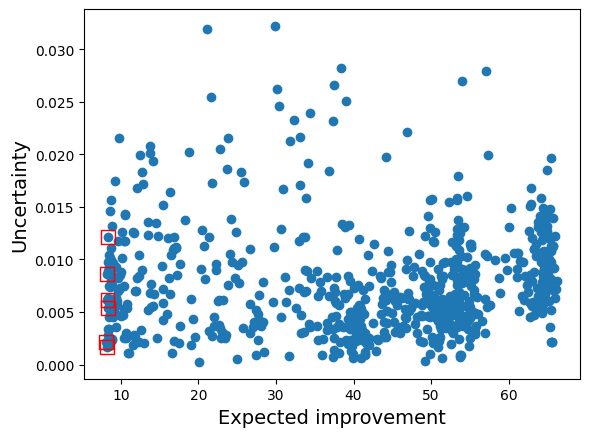

top_candidates                                             smiles1  percentage_1  \
578  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.50   
438  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.60   
648  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.50   
539  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.55   
299  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.65   
349  Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12          0.65   

               smiles2  percentage_2                    smiles3  percentage_3  \
578    C1=CC(=CC=C1C)C          0.25  Cc1ccc3c(c1)Cc2cc(C)ccc23          0.25   
438  Cc1sc(C)c2OCCOc12          0.05  Cc1ccc3c(c1)Cc2cc(C)ccc23          0.35   
648  Cc1sc(C)c2OCCOc12          0.05  Cc1ccc3c(c1)Cc2cc(C)ccc23          0.45   
539  Cc1sc(C)c2OCCOc12          0.00  Cc1ccc3c(c1)Cc2cc(C)ccc23          0.45   
299    C1=CC(=CC=C1C)C          0.10  Cc1ccc3c(c1)Cc2cc(C)ccc23          0.25   
349  Cc1sc(C)c2

In [ ]:
from colormath.color_conversions import convert_color
from colormath.color_objects import LabColor, XYZColor, sRGBColor
import colormath

lab_scaler = joblib.load('scaler.gz')
all_possibilities['exclude'] = 0
all_possibilities = all_possibilities.reset_index(drop=True)
all_possibilities_avail = all_possibilities[all_possibilities.exclude==0]
X_valid= all_possibilities_avail.iloc[:,3:-1]
pred_data_1, pred_data_2,pred_data_3, y_target = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.zeros(X_valid.shape[0])
preds, uncertainties = model.test_model(pred_data_1, pred_data_2,pred_data_3, y_target)


preds_inv_scaled = lab_scaler.inverse_transform(preds)
#target_Lab = init_data["target_Lab"]
target_Lab = [65, -20, 40] #[75, 36, 70] #[75, 40, 75] # [75, 40, 70]
print('target_Lab',target_Lab )
#hex_target_color = get_hex_color_single(target_Lab)
#print('hex_target_color', hex_target_color)
#plot_color_circle(hex_target_color)
preds_df = pd.concat([pd.DataFrame(all_possibilities_avail['smiles1'].values, columns=["smiles1"]),
                  pd.DataFrame(all_possibilities_avail['percentage_1'].values, columns=["percentage_1"]),
                  pd.DataFrame(all_possibilities_avail['smiles2'].values, columns=["smiles2"]),
                  pd.DataFrame(all_possibilities_avail['percentage_2'].values, columns=["percentage_2"]),
                  pd.DataFrame(all_possibilities_avail['smiles3'].values, columns=["smiles3"]),
                  pd.DataFrame(all_possibilities_avail['percentage_3'].values, columns=["percentage_3"]),
                  pd.DataFrame(preds_inv_scaled, columns=["L", "a", "b"]) ], axis=1)
#preds_df.to_csv('all_predictions.csv', index=None)
# create a plot to visualize the color preds_df

y_pred = list(zip(preds_df['L'], preds_df['a'], preds_df['b']))
color_list = []

for i in range(len(y_pred)):
        lab_list = (list(y_pred[i]))
        a = ', '.join(str(item) for item in list(y_pred[i]))
        lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
        rgb = convert_color(lab, sRGBColor)
        rgb = colormath.color_objects.sRGBColor(rgb.clamped_rgb_r, rgb.clamped_rgb_g, rgb.clamped_rgb_b, is_upscaled=False)
        try:
            c = rgb.get_rgb_hex()
            color_list.append(str(c))
        except:
            color_list.append('#000000')
#fig = plt.figure(figsize=(8, 8))
#ax = fig.add_subplot(111)
#ax.axvline(x=0)
#ax.axhline(y=0)
plt.scatter(target_Lab[1], target_Lab[2], marker='*', edgecolors='black', s=150,color='w',
          linewidths=1.5)
plt.scatter(preds_df['a'], preds_df['b'], c=color_list, s=80, label='loop_1')
plt.show()
# print(df_known['a* (Colored State)'].shape,  df_known['b*(Colored State)'].shape, len(random_color_list))
# ax.scatter(df_known['a* (Colored State)'], df_known['b*(Colored State)'], c=random_color_list, label='database', marker='^')
# image = create_colored_circles(color_list)
# image.show()
# df_known , random_color_list = get_hex_color(df_known['L* (Colored State)'], df_known['a* (Colored State)'], df_known['b*(Colored State)'],


# 5. Select: get the 6 top candidates to run in Chemspeed: create the correct format and send it to chemspeed, file named
# according to the experimental iteration
top_candidates = select_next_exp_ml(preds_df, target_Lab, uncertainties, 0) # print out the first monomer smiles + ratio as well
print('top_candidates', top_candidates)

df_pivot = convert_for_chemspeed(top_candidates.iloc[: , :-3])
df_pivot.to_csv('loop_4_green.csv', index=None)
print('df_pivot', df_pivot)

In [ ]:
ProDOT-2Br Ben-2Br  BTD-2Br  DMoT-2Br EDOT-2Br  green-2Br
100        0        0         0       300        600
200        0        0         0       100        700
300        0        0         0         0        700
100        0        0         0         0        900
0         400       0         0         0        600
0          0        0         0       200        800

In [ ]:
1            0      900        0       100         0
2            0      800        0       200         0
7          100      600        0       300         0

In [ ]:
df_pivot    ProDOT-2Br  Ben-2Br  BTD-2Br  DMoT-2Br  EDOT-2Br
0         200      700        0         0       100
1           0      900        0       100         0
2         100      800        0       100         0
3         100      700        0         0       200
4         100      900        0         0         0
5           0      700        0         0       300

SyntaxError: invalid decimal literal (<ipython-input-204-aea7a849db3e>, line 1)

In [ ]:
from colormath.color_objects import LabColor


In [ ]:
"""
The functions in this module are used for comparing two LabColor objects
using various Delta E formulas.
"""

import numpy

from colormath import color_diff_matrix


def _get_lab_color1_vector(color):
    """
    Converts an LabColor into a NumPy vector.

    :param LabColor color:
    :rtype: numpy.ndarray
    """
    if not color.__class__.__name__ == 'LabColor':
        raise ValueError(
            "Delta E functions can only be used with two LabColor objects.")
    return numpy.array([color.lab_l, color.lab_a, color.lab_b])


def _get_lab_color2_matrix(color):
    """
    Converts an LabColor into a NumPy matrix.

    :param LabColor color:
    :rtype: numpy.ndarray
    """
    if not color.__class__.__name__ == 'LabColor':
        raise ValueError(
            "Delta E functions can only be used with two LabColor objects.")
    return numpy.array([(color.lab_l, color.lab_a, color.lab_b)])


# noinspection PyPep8Naming
def delta_e_cie1976(color1, color2):
    """
    Calculates the Delta E (CIE1976) of two colors.
    """
    color1_vector = _get_lab_color1_vector(color1)
    color2_matrix = _get_lab_color2_matrix(color2)
    delta_e = color_diff_matrix.delta_e_cie1976(color1_vector, color2_matrix)[0]
    return numpy.asscalar(delta_e)


# noinspection PyPep8Naming
def delta_e_cie1994(color1, color2, K_L=1, K_C=1, K_H=1, K_1=0.045, K_2=0.015):
    """
    Calculates the Delta E (CIE1994) of two colors.

    K_l:
      0.045 graphic arts
      0.048 textiles
    K_2:
      0.015 graphic arts
      0.014 textiles
    K_L:
      1 default
      2 textiles
    """
    color1_vector = _get_lab_color1_vector(color1)
    color2_matrix = _get_lab_color2_matrix(color2)
    delta_e = color_diff_matrix.delta_e_cie1994(
        color1_vector, color2_matrix, K_L=K_L, K_C=K_C, K_H=K_H, K_1=K_1, K_2=K_2)[0]
    return numpy.asscalar(delta_e)


# noinspection PyPep8Naming
def delta_e_cie2000(color1, color2, Kl=1, Kc=1, Kh=1):
    """
    Calculates the Delta E (CIE2000) of two colors.
    """
    color1_vector = _get_lab_color1_vector(color1)
    color2_matrix = _get_lab_color2_matrix(color2)
    delta_e = color_diff_matrix.delta_e_cie2000(
        color1_vector, color2_matrix, Kl=Kl, Kc=Kc, Kh=Kh)[0]
    return delta_e.item()


# noinspection PyPep8Naming
def delta_e_cmc(color1, color2, pl=2, pc=1):
    """
    Calculates the Delta E (CMC) of two colors.

    CMC values
      Acceptability: pl=2, pc=1
      Perceptability: pl=1, pc=1
    """
    color1_vector = _get_lab_color1_vector(color1)
    color2_matrix = _get_lab_color2_matrix(color2)
    delta_e = color_diff_matrix.delta_e_cmc(
        color1_vector, color2_matrix, pl=pl, pc=pc)[0]
    return numpy.asscalar(delta_e)


In [ ]:
import os
torch.save({'state_dict':model.state_dict()},
        os.path.join('/content/', 'set_transformer_new_model_0.tar'))

In [ ]:
epochs, learning_rate, batch_size = 5, 1e-3, 12
dropout_ratio = 0.15
model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
ckpt = torch.load(os.path.join('/content', 'set_transformer_new_model_0_test_12_750_02.tar'),map_location=torch.device('cpu'))
model.load_state_dict(ckpt['state_dict'])


KeyError: 'state_dict'

In [ ]:
# import os
# epochs, learning_rate, batch_size = 10, 1e-1, 12
# dropout_ratio = 0.2
# net=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
# ckpt = torch.load(os.path.join('/content/', 'set_transformer_new_model_0.tar'))
# net.load_state_dict(ckpt['state_dict'])
# model = net

train_data_1, train_data_2,train_data_3, y_new = np.array(dataset_test.iloc[:, :Ndims].values, dtype=float), np.array(dataset_test.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled, dtype=np.float16)


# Train the model
# losses =
model.train_model(train_data_1, train_data_2,train_data_3, y_new)

100%|██████████| 10/10 [00:00<00:00, 23.59it/s]


([0.006630650721490383,
  0.03058992512524128,
  0.007036993745714426,
  0.01524258777499199,
  0.014680157415568829,
  0.008609538897871971,
  0.005573376547545195,
  0.006626881659030914,
  0.0071564773097634315,
  0.007533215917646885],
 Adam (
 Parameter Group 0
     amsgrad: False
     betas: (0.9, 0.999)
     capturable: False
     differentiable: False
     eps: 1e-08
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     weight_decay: 0
 ))

In [ ]:
len(df_y_scaled[99:120])

21

In [ ]:
epochs, learning_rate, batch_size = 3, 1e-3, 12
dropout_ratio = 0.1
model=SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)  # Initialize optimizer

checkpoint = torch.load(os.path.join('/content/', 'set_transformer_new_model_2_test_12_800_02_final.tar'))
# model.load_state_dict(checkpoint['state_dict'])

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
device = 'cpu' #torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.1, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.1, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
   

In [ ]:
train_data_1, train_data_2,train_data_3, y_new = np.array(dataset_test.iloc[:, :Ndims].values, dtype=float), np.array(dataset_test.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled, dtype=np.float16)
# train_data_1, train_data_2,train_data_3, y_new = np.array(dataset.iloc[99:120, :Ndims].values, dtype=float), np.array(dataset.iloc[99:120, Ndims:2*Ndims].values, dtype=float), np.array(dataset.iloc[99:120, 2*Ndims:].values, dtype=float), np.array(df_y_scaled[99:120], dtype=np.float16)
# train_data_1, train_data_2,train_data_3, y_new = np.array(dataset.iloc[120:141, :Ndims].values, dtype=float), np.array(dataset.iloc[120:141, Ndims:2*Ndims].values, dtype=float), np.array(dataset.iloc[120:141, 2*Ndims:].values, dtype=float), np.array(df_y_scaled[120:141], dtype=np.float16)
# train_data_1, train_data_2,train_data_3, y_new = np.array(dataset.iloc[141:, :Ndims].values, dtype=float), np.array(dataset.iloc[141:, Ndims:2*Ndims].values, dtype=float), np.array(dataset.iloc[141:, 2*Ndims:].values, dtype=float), np.array(df_y_scaled[141:], dtype=np.float16)

# train_data_1, train_data_2,train_data_3, y_new = np.array(dataset.iloc[99:, :Ndims].values, dtype=float), np.array(dataset.iloc[99:, Ndims:2*Ndims].values, dtype=float), np.array(dataset.iloc[99:, 2*Ndims:].values, dtype=float), np.array(df_y_scaled[99:], dtype=np.float16)

# Train the model
#losses =
model.train_model(train_data_1, train_data_2,train_data_3, y_new)

100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


([0.0032515020575374365, 0.005041718017309904, 0.0021530857775360346],
 Adam (
 Parameter Group 0
     amsgrad: False
     betas: (0.9, 0.999)
     capturable: False
     differentiable: False
     eps: 1e-08
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     weight_decay: 0
 ))

In [ ]:
Ndims = int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train, dtype=np.float16)
valid_data = np.concatenate((train_data_1, train_data_2,train_data_3), axis=1)
y_pred_train, std_train = model.test_model(train_data_1, train_data_2,train_data_3, y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.8322200817478338
0.7978469896531172
0.8207760087268745
0.8435995791215372


In [ ]:
import os
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
},  os.path.join('/content/', 'set_transformer_new_model_1_tza.tar'))

In [ ]:
import os
torch.save({'state_dict':model.state_dict()},
        os.path.join('/content/', 'set_transformer_new_model_1_tza.tar'))

In [ ]:
print('MAE: %.3f (%.3f)' % (np.mean(losses), np.std(losses)))

MAE: 0.021 (0.028)


In [ ]:
net=SmallSetTransformer_v2()
ckpt = torch.load(os.path.join('/content', 'model.tar'),map_location=torch.device('cpu'))
net.load_state_dict(ckpt['state_dict'])
_model = net#.load_state_dict(ckpt['state_dict'])

In [ ]:
Ndims = int(dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_valid = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_valid, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_valid)


y_true= scalery.inverse_transform(y_valid)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

IndexError: index 16 is out of bounds for axis 0 with size 16

In [ ]:
Ndims = int(dataset.shape[1]/3)
test_data_1, test_data_2, test_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)

# y_pred_test, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_test) # , std_pred
y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test)


y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_test)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.731115079454383
0.8322059540007094
0.4389711662220057
0.8272544861556795


In [ ]:
Ndims = np.int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_train = np.array(X_train.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_train, dtype=np.float16)

y_pred_train, train_std = test(_model, train_data_1, train_data_2, train_data_3 ,y_train) # , std_pred

y_true= scalery.inverse_transform(y_train)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

NameError: name '_model' is not defined

In [ ]:
Ndims = np.int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_test = np.array(X_test.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_test.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_test.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_test, dtype=np.float16)

y_pred_train, train_std = test(_model, train_data_1, train_data_2, train_data_3 ,y_test) # , std_pred

y_true= scalery.inverse_transform(y_test)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.8144335439673539
0.8060870252442913
0.792950498110111
0.8218675158784189


In [ ]:
len(y_pred_train)
len(y_test)

17

In [ ]:
Ndims = np.int(dataset.shape[1]/3)
train_data_1, train_data_2,train_data_3, y_valid = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_valid, dtype=np.float16)

y_pred_train, train_std = test(_model, train_data_1, train_data_2, train_data_3 ,y_valid) # , std_pred

y_true= scalery.inverse_transform(y_valid)
y_pred= scalery.inverse_transform(y_pred_train)#.detach().numpy())

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
#mean_absolute_error(y_true, y_pred, multioutput='uniform_average')
print(r2_score(y_true, y_pred, multioutput='variance_weighted'))
print(r2_score(y_true[:,0], y_pred[:,0])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,1], y_pred[:,1])) #, multioutput='variance_weighted'))
print(r2_score(y_true[:,2], y_pred[:,2])) #, multioutput='variance_weighted'))

0.5190085326128431
0.43107709699770647
0.3889712264572476
0.6040594492554956


In [ ]:
df.iloc[:40,: ]

,smiles1,percentage_1,smiles2,percentage_2,smiles3,percentage_3,L* (Colored State),a* (Colored State),b*(Colored State)
0,Cc1sc(C)c2OCC(COCCCCCCCC)(COCCCCCCCC)COc12,0.67,Cc4ccc(c2ccc(c1ccc(C)s1)c3nsnc23)s4,0.33,0,0.00,59.0,-29.00,-7.0
1,Cc1sc(C)c2OCC(COCCCCCCCC)(COCCCCCCCC)COc12,0.67,Cc5sc(c3ccc(c2sc(C)c1OCCOc12)c4nsnc34)c6OCCOc56,0.33,0,0.00,66.0,-30.00,-4.0
2,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.67,Cc1ccc(C)c2nsnc12,0.33,0,0.00,64.0,-37.00,-7.0
3,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.80,Cc1ccc(C)c2nsnc12,0.20,0,0.00,57.0,7.00,-7.0
4,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,0.86,Cc1ccc(C)c2nsnc12,0.14,0,0.00,52.0,34.00,7.0
5,Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC,1.00,0,0.00,0,0.00,81.0,46.00,15.0
6,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.67,Cc1ccc(C)c2nsnc12,0.33,0,0.00,64.0,-21.00,-33.0
7,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.80,Cc1ccc(C)c2nsnc12,0.20,0,0.00,55.0,-5.00,-17.0
8,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,0.86,Cc1ccc(C)c2nsnc12,0.14,0,0.00,51.0,17.00,-27.0
9,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,1.00,0,0.00,0,0.00,68.0,60.00,-35.0


In [ ]:
X_valid.index

Int64Index([136, 99, 20, 43, 47, 21, 19, 104, 39, 129, 63, 133, 24, 103, 35,
            70],
           dtype='int64')

In [ ]:
y_true[:,0], y_pred[:,0]

(array([50.2 , 70.2 , 42.  , 55.  , 44.97, 39.  , 44.97, 60.1 , 53.  ,
        91.  , 34.  , 55.6 , 90.  , 57.66, 92.  , 59.  ], dtype=float16),
 array([47.82846 , 77.36371 , 52.99269 , 56.442574, 51.94474 , 51.422127,
        55.68016 , 62.54387 , 53.168022, 67.37641 , 38.392673, 56.18575 ,
        50.6154  , 60.969963, 91.03136 , 74.11186 ], dtype=float32))

In [ ]:
y_true[:,1], y_pred[:,1]

(array([  2.527 ,  46.78  ,   0.7085,  56.97  ,  32.03  ,   9.99  ,
         -7.004 ,  52.8   ,  18.98  ,   2.836 ,   9.99  ,  64.06  ,
        -20.02  ,  51.97  ,  -9.98  ,  52.97  ], dtype=float16),
 array([  5.512436 ,  42.866276 ,  -7.4094324,  60.64459  ,  44.522026 ,
         -4.4240646, -11.513393 ,  46.582253 ,  56.297443 ,  55.260094 ,
         13.360424 ,  66.560165 ,  27.550491 ,  45.56988  ,  -4.036489 ,
         43.911644 ], dtype=float32))

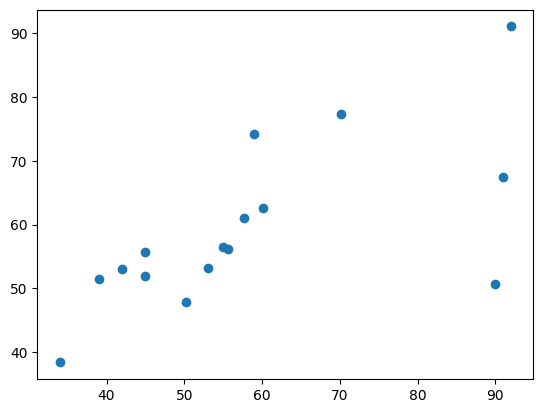

In [ ]:
plt.scatter(y_true[:,0], y_pred[:,0])

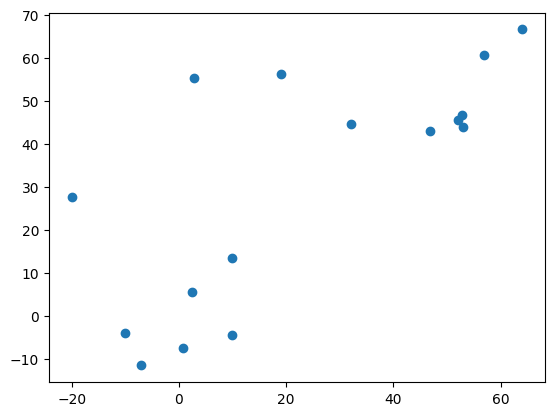

In [ ]:
plt.scatter(y_true[:,1], y_pred[:,1])

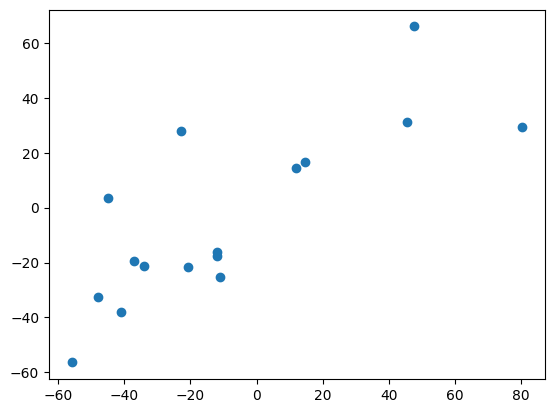

In [ ]:
plt.scatter(y_true[:,2], y_pred[:,2])

In [ ]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 27.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 11.3 MB/s eta 0:00:00


In [ ]:
import optuna
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import optuna
from optuna.samplers import TPESampler

X_train, X_test, y_train, y_test = train_test_split(
    dataset, df_y_scaled, train_size=0.8, random_state=888)

X, y = X_train.values, y_train
Ndims = int(dataset.shape[1]/3)
# configure the cross-validation procedure
cv_outer = KFold(n_splits=5, shuffle=True, random_state=888)

def objective(trial, cv, X, y):
    # Define hyperparameters
    dropout_ratio = trial.suggest_categorical('dropout_ratio', [0.1, 0.15, 0.2, 0.25, 0.3]) #5
    learning_rate = trial.suggest_categorical('learning_rate', [1e-2, 1e-3]) #3
    batch_size = trial.suggest_categorical("batch_size", [12, 32, 64, 128, 256]) #4
    epochs = trial.suggest_int('epochs',400, 800, step =50) # 13

    device = "cpu"#torch.device("cuda" if torch.cuda.is_available() else "cpu")

    mse = []
    mae_list = []
    r2_list = []

    for train_ix, valid_ix in cv.split(X):
        X_train, X_valid = X[train_ix, :], X[valid_ix, :]
        y_train, y_valid = y[train_ix], y[valid_ix]

        train_data_1, train_data_2, train_data_3, y_new = X_train[:, :Ndims], X_train[:, Ndims:2*Ndims], X_train[:, 2*Ndims:], y_train
        valid_data_1, valid_data_2, valid_data_3, y_valid = X_valid[:, :Ndims], X_valid[:, Ndims:2*Ndims], X_valid[:, 2*Ndims:], y_valid
        test_data_1, test_data_2, test_data_3 = X_test.values[:, :Ndims], X_test.values[:, Ndims:2*Ndims], X_test.values[:, 2*Ndims:]#, y_test
        #valid_data_1, valid_data_2, valid_data_3, y_valid= np.array(dataset_test.iloc[:,:Ndims].values, dtype=float), np.array(dataset_test.iloc[:,Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled[:], dtype=np.float16)

        model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
        losses = model.train_model(train_data_1, train_data_2, train_data_3, y_new)

        valid_data = np.concatenate((valid_data_1, valid_data_2, valid_data_3), axis=1)
        y_pred, y_pred_std = model.test_model(valid_data_1, valid_data_2, valid_data_3, y_valid) #model.predict(valid_data) #
        y_pred_test, y_pred_std_test = model.test_model(test_data_1, test_data_2, test_data_3, y_test )
        mse = mean_squared_error(y_valid, y_pred)
        mae = mean_absolute_error(y_valid, y_pred)
        r2 = r2_score(y_valid, y_pred, multioutput='variance_weighted')
        r2_test = r2_score(y_test, y_pred_test, multioutput='variance_weighted')
        mae_test = mean_absolute_error(y_test, y_pred_test)
        mse_test = mean_squared_error(y_test, y_pred_test)

        print(f'MSE: {mse}, MAE: {mae}, R^2: {r2}, R^2_test: {r2_test}, MSE_test: {mse_test}, MAE_test: {mae_test}')
        r2_list.append(r2)
        mae_list.append(mae)
    return np.mean(mae_list)

study = optuna.create_study(sampler=TPESampler(), direction="minimize")
study.optimize(lambda trial: objective(trial, cv_outer, X, y), n_trials=50)

best_params = study.best_params
# could just identify the mae and plot them to show the distribution

[I 2024-02-20 17:16:47,720] A new study created in memory with name: no-name-b122fc92-9490-4a7c-af12-cd92398022bf
100%|██████████| 450/450 [00:38<00:00, 11.63it/s]


MSE: 0.02435148493691725, MAE: 0.11453073265394646, R^2: 0.6247690214143716, R^2_test: 0.5717093778182514, MSE_test: 0.024130041578005423, MAE_test: 0.11777838783126278


100%|██████████| 450/450 [00:34<00:00, 13.11it/s]


MSE: 0.0241603673799738, MAE: 0.11437619598958577, R^2: 0.6796528517765721, R^2_test: 0.5580989884193466, MSE_test: 0.024896855617536393, MAE_test: 0.11766647694561093


100%|██████████| 450/450 [00:36<00:00, 12.46it/s]


MSE: 0.023296932640330417, MAE: 0.11328291305653547, R^2: 0.6445320346604911, R^2_test: 0.6407054886237238, MSE_test: 0.020242776865143666, MAE_test: 0.10798059674765302


100%|██████████| 450/450 [00:34<00:00, 13.03it/s]


MSE: 0.02087244779646949, MAE: 0.10366849658742548, R^2: 0.6391676678818299, R^2_test: 0.6533101165949168, MSE_test: 0.01953262777182285, MAE_test: 0.1044105909943372


100%|██████████| 450/450 [00:34<00:00, 12.93it/s]
[I 2024-02-20 17:19:47,777] Trial 0 finished with value: 0.11489893056368819 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 450}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.03218080562539732, MAE: 0.12863631453094773, R^2: 0.4788957904190541, R^2_test: 0.623088842433206, MSE_test: 0.021235304796006965, MAE_test: 0.1087455365886022


100%|██████████| 800/800 [01:20<00:00, 10.00it/s]


MSE: 0.04763530360540941, MAE: 0.16797634768475414, R^2: 0.2659896661996313, R^2_test: 0.36240408655132417, MSE_test: 0.03592237397846656, MAE_test: 0.1472754706032177


100%|██████████| 800/800 [01:28<00:00,  9.06it/s]


MSE: 0.08057577707527182, MAE: 0.22183615979619886, R^2: -0.06837036026800584, R^2_test: -0.018599160063410575, MSE_test: 0.057388228484772354, MAE_test: 0.19408101072686146


100%|██████████| 800/800 [01:38<00:00,  8.16it/s]


MSE: 0.04047147451873865, MAE: 0.13959257346440201, R^2: 0.3824803924375441, R^2_test: 0.6130067414106892, MSE_test: 0.02180333384980152, MAE_test: 0.11357573864836178


100%|██████████| 800/800 [01:42<00:00,  7.80it/s]


MSE: 0.058733994029462146, MAE: 0.20395204707089665, R^2: -0.015363614604429116, R^2_test: -0.0065489010032375415, MSE_test: 0.05670931272736798, MAE_test: 0.19452397766015958


100%|██████████| 800/800 [01:35<00:00,  8.37it/s]
[I 2024-02-20 17:27:33,839] Trial 1 finished with value: 0.1729359006066185 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.01, 'batch_size': 128, 'epochs': 800}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.03645451312522346, MAE: 0.131322375016841, R^2: 0.4096915885540933, R^2_test: 0.6996646959217409, MSE_test: 0.01692099476246745, MAE_test: 0.10245565757607106


100%|██████████| 750/750 [01:40<00:00,  7.48it/s]


MSE: 0.0309265260426529, MAE: 0.13803458150062897, R^2: 0.5234544972801302, R^2_test: 0.43810314504623865, MSE_test: 0.03165746287769767, MAE_test: 0.13658051407278374


100%|██████████| 750/750 [01:48<00:00,  6.93it/s]


MSE: 0.030201717142658763, MAE: 0.1358203635259364, R^2: 0.5995493857381964, R^2_test: 0.5443859556254318, MSE_test: 0.02566945262139349, MAE_test: 0.1163138272201099


100%|██████████| 750/750 [01:27<00:00,  8.56it/s]


MSE: 0.06611980876352774, MAE: 0.20829220199993403, R^2: -0.008865598431643676, R^2_test: -0.0084313024445864, MSE_test: 0.056815367874722966, MAE_test: 0.19472786660935235


100%|██████████| 750/750 [01:31<00:00,  8.23it/s]


MSE: 0.06011288047346103, MAE: 0.20824869144677108, R^2: -0.03920110679345757, R^2_test: -0.012121069363957267, MSE_test: 0.05702325061734297, MAE_test: 0.19624648104536033


100%|██████████| 750/750 [01:44<00:00,  7.16it/s]
[I 2024-02-20 17:35:47,495] Trial 2 finished with value: 0.16650168795391615 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.01, 'batch_size': 64, 'epochs': 750}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.03952855083775331, MAE: 0.14211260129631034, R^2: 0.35991365536445113, R^2_test: 0.39457113107481917, MSE_test: 0.03411007158006358, MAE_test: 0.12693756975439532


100%|██████████| 450/450 [00:51<00:00,  8.67it/s]


MSE: 0.06834455807588324, MAE: 0.20999909431867583, R^2: -0.05311834059604897, R^2_test: -0.033672822407618416, MSE_test: 0.058237483827431234, MAE_test: 0.19568193828402503


100%|██████████| 450/450 [00:51<00:00,  8.68it/s]


MSE: 0.08007858359662871, MAE: 0.22203372666542873, R^2: -0.06177797239187529, R^2_test: -0.006244952991785182, MSE_test: 0.0566921881914243, MAE_test: 0.19294878061647427


100%|██████████| 450/450 [00:57<00:00,  7.78it/s]


MSE: 0.06653633642994779, MAE: 0.20684142103235184, R^2: -0.015221037766761623, R^2_test: -0.010397945064892286, MSE_test: 0.05692616919919586, MAE_test: 0.1949287965991441


100%|██████████| 450/450 [01:00<00:00,  7.39it/s]


MSE: 0.025629837699055653, MAE: 0.11396500026224132, R^2: 0.5569243148221105, R^2_test: 0.570223628521408, MSE_test: 0.024213749206542082, MAE_test: 0.1229094501645623


100%|██████████| 450/450 [00:56<00:00,  7.95it/s]
[I 2024-02-20 17:40:28,230] Trial 3 finished with value: 0.18307335320251128 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.01, 'batch_size': 256, 'epochs': 450}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.0468061577402048, MAE: 0.16252752373385868, R^2: 0.24206727088643673, R^2_test: 0.47873057860642715, MSE_test: 0.02936849923889311, MAE_test: 0.12470338769608268


100%|██████████| 600/600 [01:01<00:00,  9.83it/s]


MSE: 0.031193174458643353, MAE: 0.12987710319963924, R^2: 0.5193457233663586, R^2_test: 0.5193946938344068, MSE_test: 0.027077468942255985, MAE_test: 0.11437807072871962


100%|██████████| 600/600 [01:00<00:00,  9.90it/s]


MSE: 0.02085689795553611, MAE: 0.10637749147369786, R^2: 0.7234542142607817, R^2_test: 0.4714343472216547, MSE_test: 0.029779571435105234, MAE_test: 0.11788091560097791


100%|██████████| 600/600 [01:02<00:00,  9.58it/s]


MSE: 0.024365553171946802, MAE: 0.11486774480197597, R^2: 0.6282268681410108, R^2_test: 0.6703284962218978, MSE_test: 0.01857380638578029, MAE_test: 0.10103058561319771


100%|██████████| 600/600 [01:02<00:00,  9.53it/s]


MSE: 0.02063444207030017, MAE: 0.10233653049602211, R^2: 0.6432821906282075, R^2_test: 0.5978101512383382, MSE_test: 0.02265951498875517, MAE_test: 0.10679305557714763


100%|██████████| 600/600 [01:02<00:00,  9.66it/s]
[I 2024-02-20 17:45:39,124] Trial 4 finished with value: 0.11540967451912613 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 600}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.03024325873080333, MAE: 0.12358950262429552, R^2: 0.5102705128168235, R^2_test: 0.6377986278117603, MSE_test: 0.020406550407269904, MAE_test: 0.10261897008450656


100%|██████████| 800/800 [03:55<00:00,  3.39it/s]


MSE: 0.03219551688453285, MAE: 0.13220315511789274, R^2: 0.5039006722609035, R^2_test: 0.5806906719715561, MSE_test: 0.023624032363422223, MAE_test: 0.10710201951662979


100%|██████████| 800/800 [03:56<00:00,  3.39it/s]


MSE: 0.030311895120977695, MAE: 0.132449863857413, R^2: 0.5980885138650002, R^2_test: 0.5668542963345439, MSE_test: 0.024403578545659953, MAE_test: 0.1124117136261199


100%|██████████| 800/800 [03:59<00:00,  3.33it/s]


MSE: 0.02552624290990929, MAE: 0.11665960852823194, R^2: 0.6105168963643091, R^2_test: 0.5384579750485027, MSE_test: 0.0260034370945212, MAE_test: 0.10658952446571957


100%|██████████| 800/800 [03:57<00:00,  3.37it/s]


MSE: 0.021673726493249945, MAE: 0.10358532235473882, R^2: 0.6253155666019404, R^2_test: 0.47228586090558616, MSE_test: 0.02973159686005422, MAE_test: 0.1203329722774592


100%|██████████| 800/800 [03:59<00:00,  3.34it/s]
[I 2024-02-20 18:05:29,389] Trial 5 finished with value: 0.12176954349873263 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.033931808974428525, MAE: 0.12394976763538666, R^2: 0.45054177011291296, R^2_test: 0.652830331330944, MSE_test: 0.019559659039304726, MAE_test: 0.10048134193135345


100%|██████████| 650/650 [03:07<00:00,  3.47it/s]


MSE: 0.023714155586478977, MAE: 0.11121311089028744, R^2: 0.6345896018211027, R^2_test: 0.5729992870044188, MSE_test: 0.02405736764894409, MAE_test: 0.09682179072216444


100%|██████████| 650/650 [03:05<00:00,  3.50it/s]


MSE: 0.03167750837837646, MAE: 0.130296749434852, R^2: 0.5799815742765561, R^2_test: 0.5815372344482036, MSE_test: 0.02357633674109964, MAE_test: 0.1048758974037048


100%|██████████| 650/650 [03:05<00:00,  3.50it/s]


MSE: 0.03174006198876573, MAE: 0.12863360854268713, R^2: 0.5157055467737997, R^2_test: 0.7026661155457891, MSE_test: 0.01675189374420936, MAE_test: 0.09628942783837093


100%|██████████| 650/650 [03:04<00:00,  3.52it/s]


MSE: 0.019228505506055153, MAE: 0.09664168230259751, R^2: 0.6675873116295185, R^2_test: 0.5689637350513074, MSE_test: 0.024284732039793294, MAE_test: 0.110519716063332


100%|██████████| 650/650 [03:06<00:00,  3.49it/s]
[I 2024-02-20 18:21:00,945] Trial 6 finished with value: 0.12166226862675926 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 650}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.045409149643937226, MAE: 0.14152619196337218, R^2: 0.2646890413995144, R^2_test: 0.6155575012669534, MSE_test: 0.021659623158510593, MAE_test: 0.10442460525364776


100%|██████████| 450/450 [01:11<00:00,  6.30it/s]


MSE: 0.06536517877420184, MAE: 0.20693959363012868, R^2: -0.00720921374634123, R^2_test: 0.016325782919512918, MSE_test: 0.055420545134634035, MAE_test: 0.1912062419832501


100%|██████████| 450/450 [01:08<00:00,  6.59it/s]


MSE: 0.037667968180427926, MAE: 0.13881662122317265, R^2: 0.5005528684148677, R^2_test: 0.48191042129065226, MSE_test: 0.02918934580380037, MAE_test: 0.11897295103267834


100%|██████████| 450/450 [01:14<00:00,  6.07it/s]


MSE: 0.06604253425009858, MAE: 0.20846352867388188, R^2: -0.007686532737230617, R^2_test: 0.00043411932763760716, MSE_test: 0.056315886950110194, MAE_test: 0.19420492513491863


100%|██████████| 450/450 [01:08<00:00,  6.56it/s]


MSE: 0.06012689847607156, MAE: 0.2090272075803974, R^2: -0.03944344294027283, R^2_test: -0.017962562194649964, MSE_test: 0.05735236234097632, MAE_test: 0.19697577569356928


100%|██████████| 450/450 [01:12<00:00,  6.21it/s]
[I 2024-02-20 18:26:57,373] Trial 7 finished with value: 0.19640855117680756 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.01, 'batch_size': 64, 'epochs': 450}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.06663690966781437, MAE: 0.2187958047764572, R^2: -0.07905235641329819, R^2_test: -0.01288883466832153, MSE_test: 0.057066506779763916, MAE_test: 0.195938588891467


100%|██████████| 500/500 [01:38<00:00,  5.05it/s]


MSE: 0.04539501403369578, MAE: 0.1639616121080075, R^2: 0.30051019135392604, R^2_test: 0.7315935834622629, MSE_test: 0.01512211021074053, MAE_test: 0.09747454871562412


100%|██████████| 500/500 [01:40<00:00,  4.98it/s]


MSE: 0.08014526419037449, MAE: 0.2217343074804474, R^2: -0.06266210373443117, R^2_test: -0.007402576029633011, MSE_test: 0.05675740907319992, MAE_test: 0.19343547013025866


100%|██████████| 500/500 [01:47<00:00,  4.65it/s]


MSE: 0.065732685572105, MAE: 0.2079300743626822, R^2: -0.0029588168258731992, R^2_test: -0.004286655664586619, MSE_test: 0.05658185704364738, MAE_test: 0.19415839797283185


100%|██████████| 500/500 [01:40<00:00,  4.98it/s]


MSE: 0.059052504235969173, MAE: 0.205148831899942, R^2: -0.020869858133605076, R^2_test: -0.005032672349077233, MSE_test: 0.05662388788131304, MAE_test: 0.1942800649175641


100%|██████████| 500/500 [01:47<00:00,  4.66it/s]
[I 2024-02-20 18:35:33,695] Trial 8 finished with value: 0.2036768730074149 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.01, 'batch_size': 32, 'epochs': 500}. Best is trial 0 with value: 0.11489893056368819.


MSE: 0.0672584739476353, MAE: 0.21960953918599546, R^2: -0.08911735498761059, R^2_test: -0.008186030672031587, MSE_test: 0.05680154917834455, MAE_test: 0.19513446500559337


100%|██████████| 450/450 [00:45<00:00,  9.80it/s]


MSE: 0.025346837553773833, MAE: 0.11630532183643177, R^2: 0.6094316759741085, R^2_test: 0.42162639050931594, MSE_test: 0.03258576891909826, MAE_test: 0.12570028399648575


100%|██████████| 450/450 [00:45<00:00,  9.85it/s]


MSE: 0.02003955205490737, MAE: 0.10616335027452939, R^2: 0.7342915671975403, R^2_test: 0.5330989767168284, MSE_test: 0.026305364911434478, MAE_test: 0.11570161942254957


100%|██████████| 450/450 [00:46<00:00,  9.76it/s]


MSE: 0.02193777313698424, MAE: 0.1091702956670547, R^2: 0.6652702868023177, R^2_test: 0.6822013162979571, MSE_test: 0.017904887602025295, MAE_test: 0.09974064524395841


100%|██████████| 450/450 [00:46<00:00,  9.68it/s]


MSE: 0.016694359984324295, MAE: 0.0880032923537956, R^2: 0.7113963390828117, R^2_test: 0.6340893316306139, MSE_test: 0.020615533435243406, MAE_test: 0.10506658054204444


100%|██████████| 450/450 [00:46<00:00,  9.59it/s]
[I 2024-02-20 18:39:26,382] Trial 9 finished with value: 0.11229628615942977 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.04176635317079557, MAE: 0.14183917066533738, R^2: 0.32367689269502725, R^2_test: 0.6278438123938986, MSE_test: 0.020967408146135902, MAE_test: 0.10700987065275919


100%|██████████| 550/550 [01:23<00:00,  6.56it/s]


MSE: 0.02280494650828872, MAE: 0.11594543587817951, R^2: 0.6485995651983691, R^2_test: 0.5434469265287779, MSE_test: 0.025722357845023632, MAE_test: 0.11058724507792485


100%|██████████| 550/550 [01:23<00:00,  6.59it/s]


MSE: 0.02208515138217566, MAE: 0.11502265366040552, R^2: 0.7071685561691016, R^2_test: 0.6264710063828447, MSE_test: 0.0210447525109425, MAE_test: 0.0993376296866932


100%|██████████| 550/550 [01:23<00:00,  6.62it/s]


MSE: 0.04131146244850554, MAE: 0.13904368822957483, R^2: 0.3696637352014287, R^2_test: 0.6044561832929535, MSE_test: 0.022285075247371885, MAE_test: 0.11048930299293831


100%|██████████| 550/550 [01:23<00:00,  6.62it/s]


MSE: 0.02068040496525413, MAE: 0.09980022449021352, R^2: 0.6424876073220778, R^2_test: 0.6912134193839539, MSE_test: 0.017397142601533334, MAE_test: 0.09352600904001478


100%|██████████| 550/550 [01:23<00:00,  6.62it/s]
[I 2024-02-20 18:46:24,505] Trial 10 finished with value: 0.11770766082629733 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 550}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03111843221420867, MAE: 0.11872630187311323, R^2: 0.4960988170667265, R^2_test: 0.5987929438059582, MSE_test: 0.022604144116055654, MAE_test: 0.10944840525831558


100%|██████████| 400/400 [00:31<00:00, 12.83it/s]


MSE: 0.02365236163934928, MAE: 0.11888687566318505, R^2: 0.6355417820808369, R^2_test: 0.5347297558046051, MSE_test: 0.02621348625438581, MAE_test: 0.11867100368197726


100%|██████████| 400/400 [00:30<00:00, 13.22it/s]


MSE: 0.02682586954304159, MAE: 0.12158788985820516, R^2: 0.6443104249379007, R^2_test: 0.5644815772266308, MSE_test: 0.024537258359696532, MAE_test: 0.11505454856994546


100%|██████████| 400/400 [00:30<00:00, 13.16it/s]


MSE: 0.023443364397011293, MAE: 0.11753527149298693, R^2: 0.6422977577532242, R^2_test: 0.6105635170005926, MSE_test: 0.021940985956914457, MAE_test: 0.11410435721185092


100%|██████████| 400/400 [00:30<00:00, 13.29it/s]


MSE: 0.02044390216820559, MAE: 0.10205296659161221, R^2: 0.6465761481891402, R^2_test: 0.6506616354773082, MSE_test: 0.01968184411272918, MAE_test: 0.10310345401601013


100%|██████████| 400/400 [00:31<00:00, 12.86it/s]
[I 2024-02-20 18:48:59,198] Trial 11 finished with value: 0.11773426574550909 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 400}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.030378925732060618, MAE: 0.1286083251215561, R^2: 0.5080736552776013, R^2_test: 0.6163150404094594, MSE_test: 0.02161694314158069, MAE_test: 0.110022888968406


100%|██████████| 400/400 [00:30<00:00, 13.29it/s]


MSE: 0.026725144310929722, MAE: 0.12872998771256616, R^2: 0.5881934067425378, R^2_test: 0.55252024540836, MSE_test: 0.02521116392557819, MAE_test: 0.11844225664320678


100%|██████████| 400/400 [00:31<00:00, 12.89it/s]


MSE: 0.023317979383074786, MAE: 0.1183565070212393, R^2: 0.6908222428814411, R^2_test: 0.5495038378799696, MSE_test: 0.02538110936754348, MAE_test: 0.11804119952351265


100%|██████████| 400/400 [00:31<00:00, 12.59it/s]


MSE: 0.024687821578820615, MAE: 0.12005563448775146, R^2: 0.6233096502113713, R^2_test: 0.6364797827209756, MSE_test: 0.020480854595191344, MAE_test: 0.10971113366719554


100%|██████████| 400/400 [00:30<00:00, 13.10it/s]


MSE: 0.01825796384943536, MAE: 0.09320099724283487, R^2: 0.6843655454423818, R^2_test: 0.7071592521890546, MSE_test: 0.01649874887387492, MAE_test: 0.09783202728820341


100%|██████████| 400/400 [00:30<00:00, 13.01it/s]
[I 2024-02-20 18:51:34,968] Trial 12 finished with value: 0.11830888267106361 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 400}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.030427912732700485, MAE: 0.13120128689092628, R^2: 0.5072804081306738, R^2_test: 0.6052859400848782, MSE_test: 0.02223832646313098, MAE_test: 0.11349816957018664


100%|██████████| 500/500 [00:38<00:00, 13.05it/s]


MSE: 0.025115535825736394, MAE: 0.12209240140709172, R^2: 0.6129957943013838, R^2_test: 0.5834891350947717, MSE_test: 0.023466365984518747, MAE_test: 0.11192070229206602


100%|██████████| 500/500 [00:38<00:00, 12.99it/s]


MSE: 0.025716351359643442, MAE: 0.11864840301823469, R^2: 0.6590217486675327, R^2_test: 0.515881872097596, MSE_test: 0.027275382532176706, MAE_test: 0.12140423433529594


100%|██████████| 500/500 [00:37<00:00, 13.26it/s]


MSE: 0.022301800046206827, MAE: 0.11134851817188418, R^2: 0.6597159116084703, R^2_test: 0.6185649514638025, MSE_test: 0.021490182375698035, MAE_test: 0.11353011561805222


100%|██████████| 500/500 [00:39<00:00, 12.63it/s]


MSE: 0.016934582503502736, MAE: 0.08979888885218484, R^2: 0.7072434935388827, R^2_test: 0.6688391307655814, MSE_test: 0.018657717749990612, MAE_test: 0.10284258481497562


100%|██████████| 500/500 [00:37<00:00, 13.17it/s]
[I 2024-02-20 18:54:48,687] Trial 13 finished with value: 0.11492699437500617 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 500}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03448008357321831, MAE: 0.1327467604256354, R^2: 0.441663552309373, R^2_test: 0.6120632171427588, MSE_test: 0.021856492332933925, MAE_test: 0.11036682700419005


100%|██████████| 650/650 [01:05<00:00,  9.85it/s]


MSE: 0.02954377460654531, MAE: 0.12899344481985006, R^2: 0.5447612543775074, R^2_test: 0.5229161059449654, MSE_test: 0.026879071367711355, MAE_test: 0.10773019826292964


100%|██████████| 650/650 [01:07<00:00,  9.69it/s]


MSE: 0.02369948090714227, MAE: 0.11587138388425311, R^2: 0.6857638377936438, R^2_test: 0.4866322872558095, MSE_test: 0.028923314244471338, MAE_test: 0.1173333605918588


100%|██████████| 650/650 [01:10<00:00,  9.25it/s]


MSE: 0.02898624069978652, MAE: 0.1258320192466306, R^2: 0.5577237500117422, R^2_test: 0.7616313607999539, MSE_test: 0.013429771460998385, MAE_test: 0.08737254565324333


100%|██████████| 650/650 [01:08<00:00,  9.48it/s]


MSE: 0.01816404409756474, MAE: 0.09251264063801574, R^2: 0.6859891826616431, R^2_test: 0.6611486023044024, MSE_test: 0.01909100477967098, MAE_test: 0.097494398790064


100%|██████████| 650/650 [01:07<00:00,  9.63it/s]
[I 2024-02-20 19:00:29,739] Trial 14 finished with value: 0.11926149607300691 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 650}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03795673218467489, MAE: 0.1330979917762851, R^2: 0.3853661355276759, R^2_test: 0.5865584334607649, MSE_test: 0.023293440654495328, MAE_test: 0.1075717216165203


100%|██████████| 550/550 [00:42<00:00, 12.90it/s]


MSE: 0.026113296070224213, MAE: 0.12418886537079778, R^2: 0.5976213498310422, R^2_test: 0.5473146464492049, MSE_test: 0.02550444916886219, MAE_test: 0.11586559115764457


100%|██████████| 550/550 [00:42<00:00, 12.86it/s]


MSE: 0.0210760733645637, MAE: 0.10799352767857105, R^2: 0.7205481236315104, R^2_test: 0.6038278368426738, MSE_test: 0.022320476503400796, MAE_test: 0.10489200718433783


100%|██████████| 550/550 [00:42<00:00, 12.88it/s]


MSE: 0.02361865912636807, MAE: 0.12093451674459886, R^2: 0.6396230854372936, R^2_test: 0.658291998301006, MSE_test: 0.019251946835844694, MAE_test: 0.10628664191099262


100%|██████████| 550/550 [00:42<00:00, 13.08it/s]


MSE: 0.017818716278998583, MAE: 0.09064168425594477, R^2: 0.6919590355190346, R^2_test: 0.6881358134332031, MSE_test: 0.01757053598375131, MAE_test: 0.09952586925087087


100%|██████████| 550/550 [00:41<00:00, 13.26it/s]
[I 2024-02-20 19:04:02,996] Trial 15 finished with value: 0.11535280195277295 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 550}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03453765481219169, MAE: 0.13300541571395227, R^2: 0.44073130047798487, R^2_test: 0.6026112524585475, MSE_test: 0.022389019287790007, MAE_test: 0.11228131628817473


100%|██████████| 450/450 [00:46<00:00,  9.77it/s]


MSE: 0.03178507216586194, MAE: 0.1298328513954039, R^2: 0.5102251971858169, R^2_test: 0.5779670921973294, MSE_test: 0.02377747978858021, MAE_test: 0.10899912889077724


100%|██████████| 450/450 [00:46<00:00,  9.58it/s]


MSE: 0.022400804894840157, MAE: 0.11167703681564227, R^2: 0.7029832430478866, R^2_test: 0.5314737039410662, MSE_test: 0.02639693334096245, MAE_test: 0.11337384594724352


100%|██████████| 450/450 [00:46<00:00,  9.63it/s]


MSE: 0.025179537629770366, MAE: 0.1184331373111734, R^2: 0.6158069756380972, R^2_test: 0.7218230266017948, MSE_test: 0.015672586758843223, MAE_test: 0.09711137614810587


100%|██████████| 450/450 [00:47<00:00,  9.56it/s]


MSE: 0.01816149911890803, MAE: 0.09296355721323597, R^2: 0.6860331789668608, R^2_test: 0.6483573538738959, MSE_test: 0.019811668134125045, MAE_test: 0.10319564915073699


100%|██████████| 450/450 [00:47<00:00,  9.55it/s]
[I 2024-02-20 19:07:58,419] Trial 16 finished with value: 0.1167096237858715 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03795921385660201, MAE: 0.13064153619390204, R^2: 0.3853259497814558, R^2_test: 0.59620681247364, MSE_test: 0.02274984764852417, MAE_test: 0.11072709097079121


100%|██████████| 500/500 [00:38<00:00, 12.99it/s]


MSE: 0.025115535825736394, MAE: 0.12209240140709172, R^2: 0.6129957943013838, R^2_test: 0.5834891350947717, MSE_test: 0.023466365984518747, MAE_test: 0.11192070229206602


100%|██████████| 500/500 [00:37<00:00, 13.21it/s]


MSE: 0.025716351359643442, MAE: 0.11864840301823469, R^2: 0.6590217486675327, R^2_test: 0.515881872097596, MSE_test: 0.027275382532176706, MAE_test: 0.12140423433529594


100%|██████████| 500/500 [00:38<00:00, 12.99it/s]


MSE: 0.022301800046206827, MAE: 0.11134851817188418, R^2: 0.6597159116084703, R^2_test: 0.6185649514638025, MSE_test: 0.021490182375698035, MAE_test: 0.11353011561805222


100%|██████████| 500/500 [00:38<00:00, 13.10it/s]


MSE: 0.016934582503502736, MAE: 0.08979888885218484, R^2: 0.7072434935388827, R^2_test: 0.6688391307655814, MSE_test: 0.018657717749990612, MAE_test: 0.10284258481497562


100%|██████████| 500/500 [00:38<00:00, 12.88it/s]
[I 2024-02-20 19:11:12,011] Trial 17 finished with value: 0.11492699437500617 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 500}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03448008357321831, MAE: 0.1327467604256354, R^2: 0.441663552309373, R^2_test: 0.6120632171427588, MSE_test: 0.021856492332933925, MAE_test: 0.11036682700419005


100%|██████████| 400/400 [01:00<00:00,  6.59it/s]


MSE: 0.02622679127739494, MAE: 0.12342617715173694, R^2: 0.5958725070905779, R^2_test: 0.5392559643933829, MSE_test: 0.025958478099218724, MAE_test: 0.11763208821393234


100%|██████████| 400/400 [01:00<00:00,  6.64it/s]


MSE: 0.023028538594283457, MAE: 0.11610781251716089, R^2: 0.6946599962487884, R^2_test: 0.5720672805129762, MSE_test: 0.024109877216571127, MAE_test: 0.10587214482482926


100%|██████████| 400/400 [01:01<00:00,  6.50it/s]


MSE: 0.03838697190548752, MAE: 0.14389597464154133, R^2: 0.41428603458437907, R^2_test: 0.6300595828631824, MSE_test: 0.020842570872607075, MAE_test: 0.10564820546421316


100%|██████████| 400/400 [01:00<00:00,  6.60it/s]


MSE: 0.020142996035474408, MAE: 0.09436911372795043, R^2: 0.6517780613849858, R^2_test: 0.6838089877116558, MSE_test: 0.017814310839315183, MAE_test: 0.09618746702493207


100%|██████████| 400/400 [01:01<00:00,  6.54it/s]
[I 2024-02-20 19:16:17,951] Trial 18 finished with value: 0.11932596035010838 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 32, 'epochs': 400}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.030864643044206667, MAE: 0.1188307237121523, R^2: 0.5002084284410833, R^2_test: 0.576610106793196, MSE_test: 0.023853932814928733, MAE_test: 0.10785375710874474


100%|██████████| 600/600 [00:45<00:00, 13.13it/s]


MSE: 0.02758123485459686, MAE: 0.12274126580145987, R^2: 0.5750019445672219, R^2_test: 0.496190449366555, MSE_test: 0.028384804089925553, MAE_test: 0.12073956415478942


100%|██████████| 600/600 [00:46<00:00, 12.99it/s]


MSE: 0.024678127994662392, MAE: 0.11606041304941865, R^2: 0.6727877601258806, R^2_test: 0.5268666889383835, MSE_test: 0.026656494157398097, MAE_test: 0.11818730533469123


100%|██████████| 600/600 [00:46<00:00, 12.92it/s]


MSE: 0.023754827861383648, MAE: 0.11444934368613406, R^2: 0.6375454031979138, R^2_test: 0.6449549211532204, MSE_test: 0.020003362368750218, MAE_test: 0.10571355755640151


100%|██████████| 600/600 [00:46<00:00, 13.02it/s]


MSE: 0.01723891831731045, MAE: 0.08961248681072165, R^2: 0.7019822897493639, R^2_test: 0.6309459630037296, MSE_test: 0.020792631909348047, MAE_test: 0.10521435317691548


100%|██████████| 600/600 [00:46<00:00, 12.90it/s]
[I 2024-02-20 19:20:10,467] Trial 19 finished with value: 0.11432216456642712 and parameters: {'dropout_ratio': 0.1, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 600}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03419007106736376, MAE: 0.1287473134844014, R^2: 0.4463597286385526, R^2_test: 0.6021189035781066, MSE_test: 0.022416758393762958, MAE_test: 0.11159744428137819


100%|██████████| 700/700 [00:54<00:00, 12.95it/s]


MSE: 0.026611409896077826, MAE: 0.12548173365328977, R^2: 0.5899459354238195, R^2_test: 0.5091856446501717, MSE_test: 0.02765265029932748, MAE_test: 0.11957872354997152


100%|██████████| 700/700 [00:53<00:00, 12.97it/s]


MSE: 0.020854523166221422, MAE: 0.10761407818718978, R^2: 0.7234857020677602, R^2_test: 0.6350200034670499, MSE_test: 0.020563099062540408, MAE_test: 0.10142947184635191


100%|██████████| 700/700 [00:53<00:00, 13.03it/s]


MSE: 0.02553462918386783, MAE: 0.12079072327006646, R^2: 0.6103889373841788, R^2_test: 0.6292041904269943, MSE_test: 0.020890763977899896, MAE_test: 0.11194678128863811


100%|██████████| 700/700 [00:54<00:00, 12.81it/s]


MSE: 0.016708865329613954, MAE: 0.08658280494802632, R^2: 0.7111455780019799, R^2_test: 0.6836826596642228, MSE_test: 0.017821428205139114, MAE_test: 0.10048506723503464


100%|██████████| 700/700 [00:53<00:00, 13.02it/s]
[I 2024-02-20 19:24:42,154] Trial 20 finished with value: 0.1133551510474057 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 700}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03401124424026578, MAE: 0.1263064151784562, R^2: 0.449255473806387, R^2_test: 0.6246096871805804, MSE_test: 0.021149619877666018, MAE_test: 0.10656435072258992


100%|██████████| 700/700 [00:53<00:00, 13.06it/s]


MSE: 0.026611409896077826, MAE: 0.12548173365328977, R^2: 0.5899459354238195, R^2_test: 0.5091856446501717, MSE_test: 0.02765265029932748, MAE_test: 0.11957872354997152


100%|██████████| 700/700 [00:54<00:00, 12.95it/s]


MSE: 0.020854523166221422, MAE: 0.10761407818718978, R^2: 0.7234857020677602, R^2_test: 0.6350200034670499, MSE_test: 0.020563099062540408, MAE_test: 0.10142947184635191


100%|██████████| 700/700 [00:54<00:00, 12.90it/s]


MSE: 0.02553462918386783, MAE: 0.12079072327006646, R^2: 0.6103889373841788, R^2_test: 0.6292041904269943, MSE_test: 0.020890763977899896, MAE_test: 0.11194678128863811


100%|██████████| 700/700 [00:53<00:00, 13.04it/s]


MSE: 0.016708865329613954, MAE: 0.08658280494802632, R^2: 0.7111455780019799, R^2_test: 0.6836826596642228, MSE_test: 0.017821428205139114, MAE_test: 0.10048506723503464


100%|██████████| 700/700 [00:54<00:00, 12.88it/s]
[I 2024-02-20 19:29:13,597] Trial 21 finished with value: 0.1133551510474057 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 700}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03401124424026578, MAE: 0.1263064151784562, R^2: 0.449255473806387, R^2_test: 0.6246096871805804, MSE_test: 0.021149619877666018, MAE_test: 0.10656435072258992


100%|██████████| 700/700 [00:52<00:00, 13.33it/s]


MSE: 0.026611409896077826, MAE: 0.12548173365328977, R^2: 0.5899459354238195, R^2_test: 0.5091856446501717, MSE_test: 0.02765265029932748, MAE_test: 0.11957872354997152


100%|██████████| 700/700 [00:53<00:00, 13.04it/s]


MSE: 0.020854523166221422, MAE: 0.10761407818718978, R^2: 0.7234857020677602, R^2_test: 0.6350200034670499, MSE_test: 0.020563099062540408, MAE_test: 0.10142947184635191


100%|██████████| 700/700 [00:55<00:00, 12.72it/s]


MSE: 0.02553462918386783, MAE: 0.12079072327006646, R^2: 0.6103889373841788, R^2_test: 0.6292041904269943, MSE_test: 0.020890763977899896, MAE_test: 0.11194678128863811


100%|██████████| 700/700 [00:54<00:00, 12.75it/s]


MSE: 0.016708865329613954, MAE: 0.08658280494802632, R^2: 0.7111455780019799, R^2_test: 0.6836826596642228, MSE_test: 0.017821428205139114, MAE_test: 0.10048506723503464


100%|██████████| 700/700 [00:54<00:00, 12.79it/s]
[I 2024-02-20 19:33:46,127] Trial 22 finished with value: 0.1133551510474057 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 700}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03401124424026578, MAE: 0.1263064151784562, R^2: 0.449255473806387, R^2_test: 0.6246096871805804, MSE_test: 0.021149619877666018, MAE_test: 0.10656435072258992


100%|██████████| 700/700 [00:53<00:00, 13.13it/s]


MSE: 0.026611409896077826, MAE: 0.12548173365328977, R^2: 0.5899459354238195, R^2_test: 0.5091856446501717, MSE_test: 0.02765265029932748, MAE_test: 0.11957872354997152


100%|██████████| 700/700 [00:53<00:00, 13.06it/s]


MSE: 0.020854523166221422, MAE: 0.10761407818718978, R^2: 0.7234857020677602, R^2_test: 0.6350200034670499, MSE_test: 0.020563099062540408, MAE_test: 0.10142947184635191


100%|██████████| 700/700 [00:53<00:00, 12.97it/s]


MSE: 0.02553462918386783, MAE: 0.12079072327006646, R^2: 0.6103889373841788, R^2_test: 0.6292041904269943, MSE_test: 0.020890763977899896, MAE_test: 0.11194678128863811


100%|██████████| 700/700 [00:53<00:00, 13.06it/s]


MSE: 0.016708865329613954, MAE: 0.08658280494802632, R^2: 0.7111455780019799, R^2_test: 0.6836826596642228, MSE_test: 0.017821428205139114, MAE_test: 0.10048506723503464


100%|██████████| 700/700 [00:54<00:00, 12.85it/s]
[I 2024-02-20 19:38:16,699] Trial 23 finished with value: 0.1133551510474057 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 700}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03401124424026578, MAE: 0.1263064151784562, R^2: 0.449255473806387, R^2_test: 0.6246096871805804, MSE_test: 0.021149619877666018, MAE_test: 0.10656435072258992


100%|██████████| 700/700 [00:53<00:00, 13.08it/s]


MSE: 0.026611409896077826, MAE: 0.12548173365328977, R^2: 0.5899459354238195, R^2_test: 0.5091856446501717, MSE_test: 0.02765265029932748, MAE_test: 0.11957872354997152


100%|██████████| 700/700 [00:53<00:00, 13.11it/s]


MSE: 0.020854523166221422, MAE: 0.10761407818718978, R^2: 0.7234857020677602, R^2_test: 0.6350200034670499, MSE_test: 0.020563099062540408, MAE_test: 0.10142947184635191


100%|██████████| 700/700 [00:54<00:00, 12.78it/s]


MSE: 0.02553462918386783, MAE: 0.12079072327006646, R^2: 0.6103889373841788, R^2_test: 0.6292041904269943, MSE_test: 0.020890763977899896, MAE_test: 0.11194678128863811


100%|██████████| 700/700 [00:54<00:00, 12.88it/s]


MSE: 0.016708865329613954, MAE: 0.08658280494802632, R^2: 0.7111455780019799, R^2_test: 0.6836826596642228, MSE_test: 0.017821428205139114, MAE_test: 0.10048506723503464


100%|██████████| 700/700 [00:55<00:00, 12.70it/s]
[I 2024-02-20 19:42:49,545] Trial 24 finished with value: 0.1133551510474057 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 700}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.03401124424026578, MAE: 0.1263064151784562, R^2: 0.449255473806387, R^2_test: 0.6246096871805804, MSE_test: 0.021149619877666018, MAE_test: 0.10656435072258992


100%|██████████| 750/750 [00:55<00:00, 13.53it/s]


MSE: 0.02823598310376453, MAE: 0.12886303265078428, R^2: 0.5649129571030547, R^2_test: 0.4708176166706767, MSE_test: 0.029814318247355562, MAE_test: 0.12325210234854096


100%|██████████| 750/750 [00:55<00:00, 13.40it/s]


MSE: 0.020395641700995268, MAE: 0.10947093731966312, R^2: 0.7295701032875709, R^2_test: 0.6023202890164812, MSE_test: 0.022405412268609832, MAE_test: 0.10476547650381063


100%|██████████| 750/750 [00:57<00:00, 13.15it/s]


MSE: 0.024976770888738387, MAE: 0.11594932924566077, R^2: 0.6189008198787069, R^2_test: 0.6785329050239968, MSE_test: 0.018111567160206985, MAE_test: 0.10263272101519942


100%|██████████| 750/750 [00:57<00:00, 13.06it/s]


MSE: 0.017487464726019156, MAE: 0.0921624891133175, R^2: 0.6976855450087147, R^2_test: 0.6483346693299643, MSE_test: 0.019812946189165015, MAE_test: 0.10388209773989347


100%|██████████| 750/750 [00:57<00:00, 13.05it/s]
[I 2024-02-20 19:47:34,427] Trial 25 finished with value: 0.11404259209009933 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 128, 'epochs': 750}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.034841536314970896, MAE: 0.12376717212107098, R^2: 0.4358105432988342, R^2_test: 0.6132312930541021, MSE_test: 0.021790682532655332, MAE_test: 0.10811110617594126


100%|██████████| 650/650 [01:23<00:00,  7.77it/s]


MSE: 0.04493166080244749, MAE: 0.15693117798319686, R^2: 0.30764998126170806, R^2_test: 0.5583221273883884, MSE_test: 0.02488428389095217, MAE_test: 0.1130301908665428


100%|██████████| 650/650 [01:17<00:00,  8.36it/s]


MSE: 0.04599983681066964, MAE: 0.16042859128015663, R^2: 0.3900789541281776, R^2_test: 0.21642855750566184, MSE_test: 0.04414668570236046, MAE_test: 0.15912239096221492


100%|██████████| 650/650 [01:23<00:00,  7.78it/s]


MSE: 0.04024068718481485, MAE: 0.1352482842963394, R^2: 0.3860017789343228, R^2_test: 0.6122821190104778, MSE_test: 0.021844159326101665, MAE_test: 0.11428274069076018


100%|██████████| 650/650 [01:23<00:00,  7.77it/s]


MSE: 0.023386167657961716, MAE: 0.11537463819530129, R^2: 0.5957117489230853, R^2_test: 0.6096484311286853, MSE_test: 0.021992542210992793, MAE_test: 0.11455498694542719


100%|██████████| 650/650 [01:16<00:00,  8.47it/s]
[I 2024-02-20 19:54:21,454] Trial 26 finished with value: 0.1481895665230322 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.01, 'batch_size': 128, 'epochs': 650}. Best is trial 9 with value: 0.11229628615942977.


MSE: 0.050537562437615924, MAE: 0.1729651408601668, R^2: 0.18164458544762122, R^2_test: 0.4093951445297469, MSE_test: 0.033274881542051195, MAE_test: 0.14306064847320624


100%|██████████| 750/750 [03:49<00:00,  3.27it/s]


MSE: 0.024946067567740603, MAE: 0.11759431104787832, R^2: 0.6156071233620836, R^2_test: 0.5638113241573592, MSE_test: 0.024575020649113294, MAE_test: 0.09947691021587042


100%|██████████| 750/750 [03:47<00:00,  3.30it/s]


MSE: 0.01943985120582666, MAE: 0.11014456584632852, R^2: 0.742243120821241, R^2_test: 0.5516693555845008, MSE_test: 0.02525910335213726, MAE_test: 0.11288136599132742


100%|██████████| 750/750 [03:40<00:00,  3.40it/s]


MSE: 0.026093975966486962, MAE: 0.10592235113162592, R^2: 0.6018543433324014, R^2_test: 0.6263303912674313, MSE_test: 0.021052674815110955, MAE_test: 0.10012684112272852


100%|██████████| 750/750 [03:43<00:00,  3.35it/s]


MSE: 0.020525018563788244, MAE: 0.10173769128040992, R^2: 0.6451738489247454, R^2_test: 0.6289561595218712, MSE_test: 0.02090473812476018, MAE_test: 0.10450292921697313


100%|██████████| 750/750 [03:32<00:00,  3.53it/s]
[I 2024-02-20 20:12:56,354] Trial 27 finished with value: 0.10868445578964854 and parameters: {'dropout_ratio': 0.2, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.022066125415493548, MAE: 0.10802335964200001, R^2: 0.6426829403524973, R^2_test: 0.7283153090667575, MSE_test: 0.015306809322443443, MAE_test: 0.08961530779337006


100%|██████████| 750/750 [03:43<00:00,  3.35it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:37<00:00,  3.44it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:43<00:00,  3.36it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:41<00:00,  3.38it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:35<00:00,  3.48it/s]
[I 2024-02-20 20:31:19,962] Trial 28 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 750/750 [03:42<00:00,  3.37it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:39<00:00,  3.42it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:45<00:00,  3.33it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:41<00:00,  3.38it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:37<00:00,  3.45it/s]
[I 2024-02-20 20:49:47,408] Trial 29 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 800/800 [03:56<00:00,  3.38it/s]


MSE: 0.027263813349672057, MAE: 0.12034222328832857, R^2: 0.5798930788132689, R^2_test: 0.5885054468258472, MSE_test: 0.02318374524904134, MAE_test: 0.10424800068368567


100%|██████████| 800/800 [03:53<00:00,  3.42it/s]


MSE: 0.019477815149731684, MAE: 0.10419716200311023, R^2: 0.7417397492882664, R^2_test: 0.6217378841024727, MSE_test: 0.02131141825495848, MAE_test: 0.09752851352526153


100%|██████████| 800/800 [04:01<00:00,  3.31it/s]


MSE: 0.03584480598522651, MAE: 0.1451915699461716, R^2: 0.4530747696157993, R^2_test: 0.6248504948370137, MSE_test: 0.021136052691131706, MAE_test: 0.09739449799188987


100%|██████████| 800/800 [03:56<00:00,  3.38it/s]


MSE: 0.020145897577722376, MAE: 0.09801577542269498, R^2: 0.6517279009885492, R^2_test: 0.6518683083905267, MSE_test: 0.01961385974403418, MAE_test: 0.0982852802394827


100%|██████████| 800/800 [03:51<00:00,  3.45it/s]
[I 2024-02-20 21:09:29,560] Trial 30 finished with value: 0.11648452664794393 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.028554350964480155, MAE: 0.11467590257941433, R^2: 0.5376190185338582, R^2_test: 0.6084560578443312, MSE_test: 0.02205972093365872, MAE_test: 0.09139416538984452


100%|██████████| 750/750 [03:43<00:00,  3.36it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:37<00:00,  3.44it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:44<00:00,  3.34it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:42<00:00,  3.37it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:36<00:00,  3.46it/s]
[I 2024-02-20 21:27:55,499] Trial 31 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 750/750 [03:41<00:00,  3.38it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:39<00:00,  3.42it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:44<00:00,  3.34it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:41<00:00,  3.39it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:40<00:00,  3.41it/s]
[I 2024-02-20 21:46:23,972] Trial 32 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 800/800 [03:58<00:00,  3.36it/s]


MSE: 0.027263813349672057, MAE: 0.12034222328832857, R^2: 0.5798930788132689, R^2_test: 0.5885054468258472, MSE_test: 0.02318374524904134, MAE_test: 0.10424800068368567


100%|██████████| 800/800 [03:51<00:00,  3.46it/s]


MSE: 0.019477815149731684, MAE: 0.10419716200311023, R^2: 0.7417397492882664, R^2_test: 0.6217378841024727, MSE_test: 0.02131141825495848, MAE_test: 0.09752851352526153


100%|██████████| 800/800 [04:02<00:00,  3.30it/s]


MSE: 0.03584480598522651, MAE: 0.1451915699461716, R^2: 0.4530747696157993, R^2_test: 0.6248504948370137, MSE_test: 0.021136052691131706, MAE_test: 0.09739449799188987


100%|██████████| 800/800 [04:02<00:00,  3.31it/s]


MSE: 0.020145897577722376, MAE: 0.09801577542269498, R^2: 0.6517279009885492, R^2_test: 0.6518683083905267, MSE_test: 0.01961385974403418, MAE_test: 0.0982852802394827


100%|██████████| 800/800 [04:00<00:00,  3.33it/s]
[I 2024-02-20 22:06:19,881] Trial 33 finished with value: 0.11648452664794393 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.028554350964480155, MAE: 0.11467590257941433, R^2: 0.5376190185338582, R^2_test: 0.6084560578443312, MSE_test: 0.02205972093365872, MAE_test: 0.09139416538984452


100%|██████████| 750/750 [03:45<00:00,  3.33it/s]


MSE: 0.02893616744326079, MAE: 0.1332043376067352, R^2: 0.5541238468873895, R^2_test: 0.4585387062539265, MSE_test: 0.030506116301161776, MAE_test: 0.1358379872610292


100%|██████████| 750/750 [04:08<00:00,  3.01it/s]


MSE: 0.0802092348669332, MAE: 0.2215113283790331, R^2: -0.06351030374245291, R^2_test: -0.008958521895285733, MSE_test: 0.056845071600667985, MAE_test: 0.19357429356241038


100%|██████████| 750/750 [03:47<00:00,  3.30it/s]


MSE: 0.06597033949355696, MAE: 0.20836640290522038, R^2: -0.006584974707586688, R^2_test: -0.006451235894196138, MSE_test: 0.056703810241392726, MAE_test: 0.19447064836096495


100%|██████████| 750/750 [03:55<00:00,  3.18it/s]


MSE: 0.059820882278386896, MAE: 0.20775907405931737, R^2: -0.03415318952326979, R^2_test: -0.007847329967765463, MSE_test: 0.05678246666368473, MAE_test: 0.19537928370067523


100%|██████████| 750/750 [03:47<00:00,  3.30it/s]
[I 2024-02-20 22:25:46,450] Trial 34 finished with value: 0.1883258403397868 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.01, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.04710002416646627, MAE: 0.17078805874862804, R^2: 0.2373086879733197, R^2_test: 0.5204304019171094, MSE_test: 0.027019116791160588, MAE_test: 0.13445137746987107


100%|██████████| 800/800 [04:05<00:00,  3.25it/s]


MSE: 0.027263813349672057, MAE: 0.12034222328832857, R^2: 0.5798930788132689, R^2_test: 0.5885054468258472, MSE_test: 0.02318374524904134, MAE_test: 0.10424800068368567


100%|██████████| 800/800 [04:01<00:00,  3.31it/s]


MSE: 0.019477815149731684, MAE: 0.10419716200311023, R^2: 0.7417397492882664, R^2_test: 0.6217378841024727, MSE_test: 0.02131141825495848, MAE_test: 0.09752851352526153


100%|██████████| 800/800 [04:05<00:00,  3.26it/s]


MSE: 0.03584480598522651, MAE: 0.1451915699461716, R^2: 0.4530747696157993, R^2_test: 0.6248504948370137, MSE_test: 0.021136052691131706, MAE_test: 0.09739449799188987


100%|██████████| 800/800 [04:01<00:00,  3.31it/s]


MSE: 0.020145897577722376, MAE: 0.09801577542269498, R^2: 0.6517279009885492, R^2_test: 0.6518683083905267, MSE_test: 0.01961385974403418, MAE_test: 0.0982852802394827


100%|██████████| 800/800 [03:57<00:00,  3.36it/s]
[I 2024-02-20 22:46:01,250] Trial 35 finished with value: 0.11648452664794393 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.028554350964480155, MAE: 0.11467590257941433, R^2: 0.5376190185338582, R^2_test: 0.6084560578443312, MSE_test: 0.02205972093365872, MAE_test: 0.09139416538984452


100%|██████████| 750/750 [03:43<00:00,  3.36it/s]


MSE: 0.02893616744326079, MAE: 0.1332043376067352, R^2: 0.5541238468873895, R^2_test: 0.4585387062539265, MSE_test: 0.030506116301161776, MAE_test: 0.1358379872610292


100%|██████████| 750/750 [04:07<00:00,  3.03it/s]


MSE: 0.0802092348669332, MAE: 0.2215113283790331, R^2: -0.06351030374245291, R^2_test: -0.008958521895285733, MSE_test: 0.056845071600667985, MAE_test: 0.19357429356241038


100%|██████████| 750/750 [03:46<00:00,  3.31it/s]


MSE: 0.06597033949355696, MAE: 0.20836640290522038, R^2: -0.006584974707586688, R^2_test: -0.006451235894196138, MSE_test: 0.056703810241392726, MAE_test: 0.19447064836096495


100%|██████████| 750/750 [03:54<00:00,  3.20it/s]


MSE: 0.059820882278386896, MAE: 0.20775907405931737, R^2: -0.03415318952326979, R^2_test: -0.007847329967765463, MSE_test: 0.05678246666368473, MAE_test: 0.19537928370067523


100%|██████████| 750/750 [03:47<00:00,  3.29it/s]
[I 2024-02-20 23:05:22,688] Trial 36 finished with value: 0.1883258403397868 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.01, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.04710002416646627, MAE: 0.17078805874862804, R^2: 0.2373086879733197, R^2_test: 0.5204304019171094, MSE_test: 0.027019116791160588, MAE_test: 0.13445137746987107


100%|██████████| 600/600 [01:02<00:00,  9.66it/s]


MSE: 0.026039266633300983, MAE: 0.1213427375980506, R^2: 0.598762066224018, R^2_test: 0.4307532760621962, MSE_test: 0.032071557034778174, MAE_test: 0.12218977645378681


100%|██████████| 600/600 [01:02<00:00,  9.58it/s]


MSE: 0.019327174061771812, MAE: 0.1038806750503461, R^2: 0.7437371296332864, R^2_test: 0.524620025698816, MSE_test: 0.026783071940274544, MAE_test: 0.11091273995836924


100%|██████████| 600/600 [01:02<00:00,  9.58it/s]


MSE: 0.025618085363375398, MAE: 0.11865260808082467, R^2: 0.6091155509353032, R^2_test: 0.6552842704872003, MSE_test: 0.01942140325969247, MAE_test: 0.10257534356985054


100%|██████████| 600/600 [01:02<00:00,  9.59it/s]


MSE: 0.01670644562360106, MAE: 0.08806374041430999, R^2: 0.7111874086570228, R^2_test: 0.645469493497374, MSE_test: 0.019974371185156076, MAE_test: 0.1040739273248853


100%|██████████| 600/600 [01:03<00:00,  9.50it/s]
[I 2024-02-20 23:10:37,535] Trial 37 finished with value: 0.1156779419169233 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 600}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.04485954828415966, MAE: 0.14644994844108514, R^2: 0.2735887434612139, R^2_test: 0.6006144689008703, MSE_test: 0.022501518763084555, MAE_test: 0.11076389565624656


100%|██████████| 650/650 [03:12<00:00,  3.37it/s]


MSE: 0.03241569647223897, MAE: 0.12860041660465948, R^2: 0.5005079345131411, R^2_test: 0.5703417907344219, MSE_test: 0.02420709190664966, MAE_test: 0.09651921645761578


100%|██████████| 650/650 [03:10<00:00,  3.42it/s]


MSE: 0.018190433689574733, MAE: 0.1043388029411096, R^2: 0.758809397814341, R^2_test: 0.5868698679992755, MSE_test: 0.023275894325031448, MAE_test: 0.10484346109131187


100%|██████████| 650/650 [03:17<00:00,  3.30it/s]


MSE: 0.023068936809323964, MAE: 0.11280671336012216, R^2: 0.6480108280023, R^2_test: 0.684733137107387, MSE_test: 0.01776224394317423, MAE_test: 0.10003966182835707


100%|██████████| 650/650 [03:12<00:00,  3.37it/s]


MSE: 0.02034962813610725, MAE: 0.09666780141208198, R^2: 0.6482059100259853, R^2_test: 0.7059682950630549, MSE_test: 0.016565847809690042, MAE_test: 0.09083529420768661


100%|██████████| 650/650 [03:08<00:00,  3.44it/s]
[I 2024-02-20 23:26:41,276] Trial 38 finished with value: 0.11372534287139638 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 650}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.03236454489454335, MAE: 0.1262129800390087, R^2: 0.47592049801239794, R^2_test: 0.5893783823527684, MSE_test: 0.02313456375995752, MAE_test: 0.10226141042796788


100%|██████████| 550/550 [02:48<00:00,  3.27it/s]


MSE: 0.0523789712035731, MAE: 0.17596478047895783, R^2: 0.19289469726632263, R^2_test: 0.2890481569643278, MSE_test: 0.04005527238728651, MAE_test: 0.1461991652514563


100%|██████████| 550/550 [03:10<00:00,  2.88it/s]


MSE: 0.0800012159169551, MAE: 0.22131408336399472, R^2: -0.060752138837346946, R^2_test: -0.009377990664573985, MSE_test: 0.05686870461600705, MAE_test: 0.19363766114388106


100%|██████████| 550/550 [02:45<00:00,  3.32it/s]


MSE: 0.040975029789780924, MAE: 0.14254572892424153, R^2: 0.3747970733329718, R^2_test: 0.5862630333006783, MSE_test: 0.023310083601540785, MAE_test: 0.11524063602180833


100%|██████████| 550/550 [03:08<00:00,  2.92it/s]


MSE: 0.05974622184646947, MAE: 0.20749152791297343, R^2: -0.032862497696972706, R^2_test: -0.00836647637866744, MSE_test: 0.05681171555177928, MAE_test: 0.19539724817937024


100%|██████████| 550/550 [03:09<00:00,  2.91it/s]
[I 2024-02-20 23:41:44,987] Trial 39 finished with value: 0.1936399723288053 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.01, 'batch_size': 12, 'epochs': 550}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.06757562621894912, MAE: 0.22088374096385896, R^2: -0.0942530058965284, R^2_test: -0.008753530415356797, MSE_test: 0.05683352230988823, MAE_test: 0.19579899274630597


100%|██████████| 800/800 [01:23<00:00,  9.61it/s]


MSE: 0.030021207561317657, MAE: 0.13170652968487415, R^2: 0.5374045106186631, R^2_test: 0.4036005085858499, MSE_test: 0.03360135333249891, MAE_test: 0.1240923146600081


100%|██████████| 800/800 [01:25<00:00,  9.39it/s]


MSE: 0.019816539340043654, MAE: 0.10526582009928397, R^2: 0.7372485374331572, R^2_test: 0.5483259047510356, MSE_test: 0.025447474526865663, MAE_test: 0.10579586960275993


100%|██████████| 800/800 [01:27<00:00,  9.18it/s]


MSE: 0.032282115489783825, MAE: 0.1292989207778419, R^2: 0.5074348161120944, R^2_test: 0.677482140103707, MSE_test: 0.01817076761873241, MAE_test: 0.09724918847641828


100%|██████████| 800/800 [01:25<00:00,  9.39it/s]


MSE: 0.02006185352909565, MAE: 0.09976137698462785, R^2: 0.6531808120396317, R^2_test: 0.6134484004553853, MSE_test: 0.021778450626681833, MAE_test: 0.1047454618535308


100%|██████████| 800/800 [01:24<00:00,  9.42it/s]
[I 2024-02-20 23:48:52,407] Trial 40 finished with value: 0.12225519456194964 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 800}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.042835132274215294, MAE: 0.1452433252631203, R^2: 0.3063701385886408, R^2_test: 0.7106141708887441, MSE_test: 0.01630409756106434, MAE_test: 0.09688144564520353


100%|██████████| 750/750 [03:46<00:00,  3.31it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:42<00:00,  3.38it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:48<00:00,  3.28it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:44<00:00,  3.35it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:38<00:00,  3.43it/s]
[I 2024-02-21 00:07:34,290] Trial 41 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 750/750 [03:45<00:00,  3.33it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:41<00:00,  3.38it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:46<00:00,  3.31it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:45<00:00,  3.33it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:40<00:00,  3.40it/s]
[I 2024-02-21 00:26:15,026] Trial 42 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 700/700 [03:30<00:00,  3.33it/s]


MSE: 0.025279624695631508, MAE: 0.12225417848015713, R^2: 0.6104673559993562, R^2_test: 0.49891348824716136, MSE_test: 0.028231387138900943, MAE_test: 0.11619347048014601


100%|██████████| 700/700 [03:26<00:00,  3.38it/s]


MSE: 0.019941714609567545, MAE: 0.1046449470065607, R^2: 0.7355888134732759, R^2_test: 0.604201813555584, MSE_test: 0.022299406526230248, MAE_test: 0.1017484149745634


100%|██████████| 700/700 [03:31<00:00,  3.31it/s]


MSE: 0.03401375493361717, MAE: 0.1376741947451381, R^2: 0.4810132112036661, R^2_test: 0.5649211383551423, MSE_test: 0.024512493333899276, MAE_test: 0.11235534202872433


100%|██████████| 700/700 [03:28<00:00,  3.35it/s]


MSE: 0.02127078636907485, MAE: 0.10548660621511108, R^2: 0.6322813918912329, R^2_test: 0.6406144628400838, MSE_test: 0.0202479052892327, MAE_test: 0.10366360314114154


100%|██████████| 700/700 [03:23<00:00,  3.45it/s]
[I 2024-02-21 00:43:37,222] Trial 43 finished with value: 0.11812854165146613 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 700}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.031533848678994364, MAE: 0.12058278181036365, R^2: 0.48937197277796146, R^2_test: 0.5998872500836303, MSE_test: 0.022542490522416855, MAE_test: 0.09256995773050504


100%|██████████| 750/750 [03:36<00:00,  3.46it/s]


MSE: 0.03050200992143427, MAE: 0.12580669252993945, R^2: 0.5299958478385414, R^2_test: 0.5780383575890868, MSE_test: 0.02377346467179475, MAE_test: 0.1005076976190931


100%|██████████| 750/750 [03:30<00:00,  3.57it/s]


MSE: 0.019351719212739333, MAE: 0.10215839078337396, R^2: 0.7434116805624382, R^2_test: 0.605684200236157, MSE_test: 0.02221588834865566, MAE_test: 0.10166072897670574


100%|██████████| 750/750 [03:41<00:00,  3.39it/s]


MSE: 0.030331965122224035, MAE: 0.1227716469973223, R^2: 0.5371904922761966, R^2_test: 0.6590263914415431, MSE_test: 0.019210570872659958, MAE_test: 0.09475337672108379


100%|██████████| 750/750 [03:38<00:00,  3.44it/s]


MSE: 0.019879208817310038, MAE: 0.0991097388023493, R^2: 0.6563382815393902, R^2_test: 0.6663732282444047, MSE_test: 0.018796647549714444, MAE_test: 0.09596546067457473


100%|██████████| 750/750 [03:34<00:00,  3.49it/s]
[I 2024-02-21 01:01:40,035] Trial 44 finished with value: 0.1132511109440405 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030132871496053714, MAE: 0.11640908560721748, R^2: 0.5120580147638422, R^2_test: 0.5842027818817042, MSE_test: 0.02342615887806154, MAE_test: 0.09282789516548014


100%|██████████| 800/800 [03:56<00:00,  3.38it/s]


MSE: 0.027263813349672057, MAE: 0.12034222328832857, R^2: 0.5798930788132689, R^2_test: 0.5885054468258472, MSE_test: 0.02318374524904134, MAE_test: 0.10424800068368567


100%|██████████| 800/800 [03:52<00:00,  3.45it/s]


MSE: 0.019477815149731684, MAE: 0.10419716200311023, R^2: 0.7417397492882664, R^2_test: 0.6217378841024727, MSE_test: 0.02131141825495848, MAE_test: 0.09752851352526153


100%|██████████| 800/800 [03:56<00:00,  3.38it/s]


MSE: 0.03584480598522651, MAE: 0.1451915699461716, R^2: 0.4530747696157993, R^2_test: 0.6248504948370137, MSE_test: 0.021136052691131706, MAE_test: 0.09739449799188987


100%|██████████| 800/800 [03:50<00:00,  3.47it/s]


MSE: 0.020145897577722376, MAE: 0.09801577542269498, R^2: 0.6517279009885492, R^2_test: 0.6518683083905267, MSE_test: 0.01961385974403418, MAE_test: 0.0982852802394827


100%|██████████| 800/800 [03:45<00:00,  3.54it/s]
[I 2024-02-21 01:21:04,169] Trial 45 finished with value: 0.11648452664794393 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 800}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.028554350964480155, MAE: 0.11467590257941433, R^2: 0.5376190185338582, R^2_test: 0.6084560578443312, MSE_test: 0.02205972093365872, MAE_test: 0.09139416538984452


100%|██████████| 750/750 [01:16<00:00,  9.78it/s]


MSE: 0.025913688490771376, MAE: 0.11790703569612515, R^2: 0.6006970943930359, R^2_test: 0.5135354091105647, MSE_test: 0.02740758306729439, MAE_test: 0.11890490398238855


100%|██████████| 750/750 [01:14<00:00, 10.01it/s]


MSE: 0.024343859089263526, MAE: 0.11861796689378436, R^2: 0.6772198984663369, R^2_test: 0.4962129372389179, MSE_test: 0.028383537115429697, MAE_test: 0.11623354329165884


100%|██████████| 750/750 [01:15<00:00,  9.88it/s]


MSE: 0.030005328343563176, MAE: 0.12702105026798452, R^2: 0.5421743634539252, R^2_test: 0.6458981804868079, MSE_test: 0.019950218812110187, MAE_test: 0.10350457060833458


100%|██████████| 750/750 [01:18<00:00,  9.58it/s]


MSE: 0.017692919698606663, MAE: 0.08850345940670767, R^2: 0.6941337432446414, R^2_test: 0.7017542306485685, MSE_test: 0.016803269654268278, MAE_test: 0.09638013203687168


100%|██████████| 750/750 [01:18<00:00,  9.59it/s]
[I 2024-02-21 01:27:29,621] Trial 46 finished with value: 0.11680296803019057 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 750}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.030368297315111703, MAE: 0.13196532788635118, R^2: 0.5082457613733198, R^2_test: 0.5701369007941479, MSE_test: 0.024218635476650194, MAE_test: 0.11223070701051384


100%|██████████| 650/650 [01:58<00:00,  5.49it/s]


MSE: 0.0442029766256107, MAE: 0.15848214889742415, R^2: 0.3188782442387972, R^2_test: 0.4773488349540769, MSE_test: 0.029446347153497254, MAE_test: 0.13423105561478468


100%|██████████| 650/650 [02:08<00:00,  5.06it/s]


MSE: 0.08011945567125378, MAE: 0.22177069354057344, R^2: -0.062319903412301966, R^2_test: -0.008012766438178859, MSE_test: 0.05679178741156676, MAE_test: 0.1934982461635831


100%|██████████| 650/650 [02:04<00:00,  5.22it/s]


MSE: 0.0656578293517998, MAE: 0.20678542087367444, R^2: -0.0018166497974621007, R^2_test: -0.005355379412455003, MSE_test: 0.05664206930872127, MAE_test: 0.19389476832477107


100%|██████████| 650/650 [02:05<00:00,  5.19it/s]


MSE: 0.025455493744700314, MAE: 0.11682079601441714, R^2: 0.5599382850212062, R^2_test: 0.3805011653749912, MSE_test: 0.03490277830711838, MAE_test: 0.1341207491795424


100%|██████████| 650/650 [01:50<00:00,  5.86it/s]
[I 2024-02-21 01:37:38,812] Trial 47 finished with value: 0.18466583382219118 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.01, 'batch_size': 32, 'epochs': 650}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.06725808311639149, MAE: 0.21947010978486672, R^2: -0.08911102625212905, R^2_test: -0.010226769015036469, MSE_test: 0.0569165250814257, MAE_test: 0.19535997152976523


100%|██████████| 700/700 [03:18<00:00,  3.52it/s]


MSE: 0.025279624695631508, MAE: 0.12225417848015713, R^2: 0.6104673559993562, R^2_test: 0.49891348824716136, MSE_test: 0.028231387138900943, MAE_test: 0.11619347048014601


100%|██████████| 700/700 [03:20<00:00,  3.49it/s]


MSE: 0.019941714609567545, MAE: 0.1046449470065607, R^2: 0.7355888134732759, R^2_test: 0.604201813555584, MSE_test: 0.022299406526230248, MAE_test: 0.1017484149745634


100%|██████████| 700/700 [03:26<00:00,  3.38it/s]


MSE: 0.03401375493361717, MAE: 0.1376741947451381, R^2: 0.4810132112036661, R^2_test: 0.5649211383551423, MSE_test: 0.024512493333899276, MAE_test: 0.11235534202872433


100%|██████████| 700/700 [03:24<00:00,  3.43it/s]


MSE: 0.02127078636907485, MAE: 0.10548660621511108, R^2: 0.6322813918912329, R^2_test: 0.6406144628400838, MSE_test: 0.0202479052892327, MAE_test: 0.10366360314114154


100%|██████████| 700/700 [03:20<00:00,  3.49it/s]
[I 2024-02-21 01:54:31,075] Trial 48 finished with value: 0.11812854165146613 and parameters: {'dropout_ratio': 0.25, 'learning_rate': 0.001, 'batch_size': 12, 'epochs': 700}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.031533848678994364, MAE: 0.12058278181036365, R^2: 0.48937197277796146, R^2_test: 0.5998872500836303, MSE_test: 0.022542490522416855, MAE_test: 0.09256995773050504


100%|██████████| 450/450 [00:46<00:00,  9.76it/s]


MSE: 0.025346837553773833, MAE: 0.11630532183643177, R^2: 0.6094316759741085, R^2_test: 0.42162639050931594, MSE_test: 0.03258576891909826, MAE_test: 0.12570028399648575


100%|██████████| 450/450 [00:45<00:00,  9.80it/s]


MSE: 0.02003955205490737, MAE: 0.10616335027452939, R^2: 0.7342915671975403, R^2_test: 0.5330989767168284, MSE_test: 0.026305364911434478, MAE_test: 0.11570161942254957


100%|██████████| 450/450 [00:47<00:00,  9.47it/s]


MSE: 0.02193777313698424, MAE: 0.1091702956670547, R^2: 0.6652702868023177, R^2_test: 0.6822013162979571, MSE_test: 0.017904887602025295, MAE_test: 0.09974064524395841


100%|██████████| 450/450 [00:48<00:00,  9.19it/s]


MSE: 0.016694359984324295, MAE: 0.0880032923537956, R^2: 0.7113963390828117, R^2_test: 0.6340893316306139, MSE_test: 0.020615533435243406, MAE_test: 0.10506658054204444


100%|██████████| 450/450 [00:47<00:00,  9.47it/s]
[I 2024-02-21 01:58:28,598] Trial 49 finished with value: 0.11229628615942977 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450}. Best is trial 27 with value: 0.10868445578964854.


MSE: 0.04176635317079557, MAE: 0.14183917066533738, R^2: 0.32367689269502725, R^2_test: 0.6278438123938986, MSE_test: 0.020967408146135902, MAE_test: 0.10700987065275919


In [ ]:
#Trial 35 finished with value: 0.11140368231296807 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450}
Trial 6 finished with value: 0.1108465280830498 and parameters: {'dropout_ratio': 0.3, 'learning_rate': 0.001, 'batch_size': 256, 'epochs': 500}


In [ ]:
[I 2024-02-21 01:58:28,598] Trial 49 finished with value: 0.11229628615942977 and parameters: {'dropout_ratio': 0.15, 'learning_rate': 0.001, 'batch_size': 64, 'epochs': 450}. Best is trial 27 with value: 0.10868445578964854.


In [ ]:
df.to_csv('optuna_ecps_study.csv', index=None)

In [ ]:
df = study.trials_dataframe()
df

,number,value,datetime_start,datetime_complete,duration,params_batch_size,params_dropout_ratio,params_epochs,params_learning_rate,state
0,0,0.114899,2024-02-20 17:16:47.722191,2024-02-20 17:19:47.777143,0 days 00:03:00.054952,256,0.10,450,0.001,COMPLETE
1,1,0.172936,2024-02-20 17:19:47.778732,2024-02-20 17:27:33.839140,0 days 00:07:46.060408,128,0.30,800,0.010,COMPLETE
2,2,0.166502,2024-02-20 17:27:33.841182,2024-02-20 17:35:47.495497,0 days 00:08:13.654315,64,0.10,750,0.010,COMPLETE
3,3,0.183073,2024-02-20 17:35:47.497065,2024-02-20 17:40:28.229832,0 days 00:04:40.732767,256,0.25,450,0.010,COMPLETE
4,4,0.115410,2024-02-20 17:40:28.231523,2024-02-20 17:45:39.124245,0 days 00:05:10.892722,64,0.25,600,0.001,COMPLETE
5,5,0.121770,2024-02-20 17:45:39.126422,2024-02-20 18:05:29.388788,0 days 00:19:50.262366,12,0.15,800,0.001,COMPLETE
6,6,0.121662,2024-02-20 18:05:29.390264,2024-02-20 18:21:00.944806,0 days 00:15:31.554542,12,0.30,650,0.001,COMPLETE
7,7,0.196409,2024-02-20 18:21:00.946477,2024-02-20 18:26:57.373431,0 days 00:05:56.426954,64,0.30,450,0.010,COMPLETE
8,8,0.203677,2024-02-20 18:26:57.375004,2024-02-20 18:35:33.695482,0 days 00:08:36.320478,32,0.30,500,0.010,COMPLETE
9,9,0.112296,2024-02-20 18:35:33.697044,2024-02-20 18:39:26.382593,0 days 00:03:52.685549,64,0.15,450,0.001,COMPLETE


In [ ]:
from optuna.visualization import plot_optimization_history, plot_slice

plot_optimization_history(study)

In [ ]:
plot_slice(study)


In [ ]:

# manual nested cross-validation for random forest on a classification dataset
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
# create dataset
X, y = dataset.values, df_y_scaled #make_classification(n_samples=1000, n_features=20, random_state=1, n_informative=10, n_redundant=10)
# configure the cross-validation procedure
cv_outer = KFold(n_splits=5, shuffle=True, random_state=1)
# enumerate splits
outer_results = list()


for train_ix, test_ix in cv_outer.split(X):
 # split data
 X_train, X_test = X[train_ix, :], X[test_ix, :]
 y_train, y_test = y[train_ix], y[test_ix]
 train_data_1, train_data_2,train_data_3, y_new = X_train[:, :Ndims], X_train[:, Ndims:2*Ndims], X_train[:, 2*Ndims:], y_train
 test_data_1, test_data_2,test_data_3, y_valid = X_test[:, :Ndims],  X_test[:, Ndims:2*Ndims], X_test[:, 2*Ndims:],  y_test
 cv_inner = KFold(n_splits=3, shuffle=True, random_state=1)
 device='cuda'
 model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
 space = dict()
 space['dropout_ratio'] = [0.1, 0.15, 0.2]
 space['epochs'] = [2, 3, 5]
 space['learning_rate'] = [0.1, 0.001, 0.05]
 space['batch_size'] = [32, 124, 64]
 # define search
 search = GridSearchCV(model, space, scoring='accuracy', cv=cv_inner, refit=True)


 # execute search
 result = search.fit(X_train, y_train)
 # get the best performing model fit on the whole training set
 best_model = result.best_estimator_
 # evaluate model on the hold out dataset
 yhat = best_model.predict(X_test)
 # evaluate the model
 acc = accuracy_score(y_test, yhat)
 # store the result
 outer_results.append(acc)
 # report progress
 print('>acc=%.3f, est=%.3f, cfg=%s' % (acc, result.best_score_, result.best_params_))
# summarize the estimated performance of the model
print('Accuracy: %.3f (%.3f)' % (mean(outer_results), std(outer_results)))

TypeError: estimator should be an estimator implementing 'fit' method, SmallSetTransformer_v2(
  (enc): Sequential(
    (0): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=1056, out_features=800, bias=True)
        (fc_k): Linear(in_features=1056, out_features=800, bias=True)
        (fc_v): Linear(in_features=1056, out_features=800, bias=True)
        (fc_o): Linear(in_features=800, out_features=800, bias=True)
      )
    )
    (1): Dropout(p=0.2, inplace=False)
    (2): LayerNorm((800,), eps=1e-05, elementwise_affine=True)
    (3): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=800, out_features=500, bias=True)
        (fc_k): Linear(in_features=800, out_features=500, bias=True)
        (fc_v): Linear(in_features=800, out_features=500, bias=True)
        (fc_o): Linear(in_features=500, out_features=500, bias=True)
      )
    )
    (4): LayerNorm((500,), eps=1e-05, elementwise_affine=True)
    (5): Dropout(p=0.2, inplace=False)
    (6): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=500, out_features=200, bias=True)
        (fc_k): Linear(in_features=500, out_features=200, bias=True)
        (fc_v): Linear(in_features=500, out_features=200, bias=True)
        (fc_o): Linear(in_features=200, out_features=200, bias=True)
      )
    )
    (7): Dropout(p=0.2, inplace=False)
    (8): LayerNorm((200,), eps=1e-05, elementwise_affine=True)
  )
  (dec): Sequential(
    (0): PMA(
      (mab): MAB(
        (fc_q): Linear(in_features=200, out_features=200, bias=True)
        (fc_k): Linear(in_features=200, out_features=200, bias=True)
        (fc_v): Linear(in_features=200, out_features=200, bias=True)
        (fc_o): Linear(in_features=200, out_features=200, bias=True)
      )
    )
    (1): SAB(
      (mab): MAB(
        (fc_q): Linear(in_features=200, out_features=100, bias=True)
        (fc_k): Linear(in_features=200, out_features=100, bias=True)
        (fc_v): Linear(in_features=200, out_features=100, bias=True)
        (fc_o): Linear(in_features=100, out_features=100, bias=True)
      )
    )
    (2): LayerNorm((100,), eps=1e-05, elementwise_affine=True)
    (3): Dropout(p=0.2, inplace=False)
    (4): LeakyReLU(negative_slope=0.01)
    (5): Linear(in_features=100, out_features=3, bias=True)
  )
) was passed

In [ ]:
from sklearn.metrics import r2_score
def train_test_eval(seed):
  model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)
  model = SmallSetTransformer_v2(dropout_ratio, device, epochs, learning_rate, batch_size)

  #_model.
  np.random.seed(seed)
  X_train, y_train, X_valid, y_valid, X_test, y_test = train_valid_test_split(full_dataset, target = ['L','a','b'],
                                                                              train_size=0.8, valid_size=0.1, test_size=0.1)
  train_data_1, train_data_2,train_data_3, y_new = np.array(X_train.iloc[:, :Ndims].values, dtype=float), np.array(X_train.iloc[:, Ndims:2*Ndims].values, dtype=float), np.array(X_train.iloc[:, 2*Ndims:].values, dtype=float), np.array(y_train, dtype=np.float16)

  losses = model.train_model(train_data_1, train_data_2, train_data_3, y_new)
  test_data_1, test_data_2,test_data_3, y_valid = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_valid, dtype=np.float16)

  y_pred_val , valid_std= model.test_model(test_data_1, test_data_2, test_data_3 ,y_valid) #

  test_data_1, test_data_2,test_data_3, y_test = X_test.iloc[:, :Ndims].values, X_test.iloc[:, Ndims:2*Ndims].values,X_test.iloc[:, 2*Ndims:].values, np.array(y_test, dtype=np.float16)
  y_pred_test, test_std = model.test_model(test_data_1, test_data_2, test_data_3 ,y_test) #

  return r2_score(y_valid, y_pred_val), r2_score(y_test, y_pred_test, multioutput='variance_weighted')

In [ ]:
dropout_ratio, device, epochs, learning_rate, batch_size

(0.2, 'cuda', 550, 0.001, 12)

In [ ]:
test_score=[]
val_score=[]
epochs=1
device='cuda'
for i in range(1):
  r2_val , r2_test = train_test_eval(i)
  test_score.append(r2_test)
  val_score.append(r2_val)

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument mat1 in method wrapper_CUDA_addmm)

In [ ]:
from sklearn.metrics import r2_score
test_data_1, test_data_2,test_data_3, y_valid = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_valid, dtype=np.float16)
#scalery.inverse_transform(y_train)
y_pred, test_std = test(_model, test_data_1, test_data_2, test_data_3 ,y_valid) #
# r2_score(y_valid, y_pred)#, multioutput='variance_weighted')

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
test_data_1, test_data_2,test_data_3, y_valid = np.array(X_valid.iloc[:, :Ndims].values, dtype=np.float16),  np.array(X_valid.iloc[:, Ndims:2*Ndims].values, dtype=np.float16), np.array(X_valid.iloc[:, 2*Ndims:].values, dtype=np.float16), np.array(y_valid, dtype=np.float16)
valid_data = np.concatenate((test_data_1, test_data_2,test_data_3), axis=1)
y_pred, std_test = model.test_model(test_data_1, test_data_2,test_data_3, y_valid)
r2_score(y_valid, y_pred)#

RuntimeError: Found no NVIDIA driver on your system. Please check that you have an NVIDIA GPU and installed a driver from http://www.nvidia.com/Download/index.aspx

In [ ]:
y_valid

array([[0.1521, 0.3618, 0.2905],
       [1.    , 0.242 , 0.82  ],
       [0.8438, 0.5522, 0.919 ],
       [0.4011, 0.0476, 0.3987],
       [0.3042, 0.6855, 0.1487],
       [0.9404, 0.219 , 0.1824],
       [0.3042, 0.8286, 0.223 ],
       [0.3735, 0.533 , 0.1014],
       [0.4702, 0.3523, 1.    ],
       [0.913 , 0.2573, 0.747 ]], dtype=float16)

In [ ]:
y_pred#-y_valid

array([[0.15302475, 0.4286967 , 0.25018713],
       [1.0539567 , 0.2563    , 0.8706106 ],
       [0.85468566, 0.5938983 , 0.91735613],
       [0.3907432 , 0.10875438, 0.40955448],
       [0.29722708, 0.660669  , 0.14089149],
       [0.64929676, 0.28010902, 0.39358273],
       [0.3837555 , 0.2172906 , 0.3936913 ],
       [0.3058877 , 0.6269457 , 0.14491151],
       [0.7841441 , 0.3311101 , 0.9775035 ],
       [0.95464116, 0.2324687 , 0.73756254]], dtype=float32)

In [ ]:
r2_score(scalery.inverse_transform(y_valid), scalery.inverse_transform(y_pred))

0.8878417623790625

In [ ]:
print('L: ', r2_score(y_valid[:,0], y_pred[:,0]))#, multioutput='variance_weighted'))
print('a: ', r2_score(y_valid[:, 1], y_pred[:, 1]))#, multioutput='variance_weighted'))
print('b: ', r2_score(y_valid[:, 2], y_pred[:, 2]))#, multioutput='variance_weighted'))

L:  0.8515664124210817
a:  0.8574585352816576
b:  0.9546913412148376


In [ ]:
test_data_1, test_data_2,test_data_3, y_test = X_test.iloc[:, :Ndims].values, X_test.iloc[:, Ndims:2*Ndims].values,X_test.iloc[:, 2*Ndims:].values, np.array(y_test, dtype=np.float16)
y_pred , valid_std= test(_model, test_data_1, test_data_2, test_data_3 ,y_test) #


#print('MAE', mean_absolute_error(y_true, y_pred, multioutput='uniform_average'))
r2_score(y_test, y_pred, multioutput='variance_weighted')

NameError: ignored

In [ ]:
test_data_1, test_data_2,test_data_3, y_test = X_test.iloc[:, :Ndims].values, X_test.iloc[:, Ndims:2*Ndims].values,X_test.iloc[:, 2*Ndims:].values, np.array(y_test, dtype=np.float16)
#valid_data = np.concatenate((test_data_1, test_data_2,test_data_3), axis=1)
y_pred, std_test= model.test_model(test_data_1, test_data_2,test_data_3, y_test)#valid_data)
r2_score(y_test, y_pred)#

-24.84974737697492

In [ ]:
import sklearn
sklearn.metrics.mean_squared_error(y_test , y_pred)

0.0013273138

ValueError: ignored

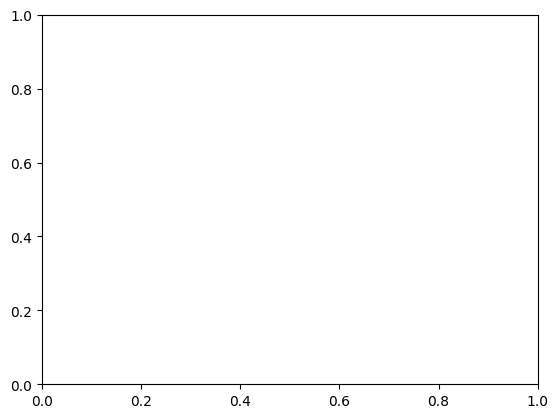

In [ ]:
plt.scatter(std_test, np.mean(abs(y_test - y_pred)[:, :], axis=1))

In [ ]:
np.mean((y_test - y_pred)[:, 1:], axis=1)

array([ 0.06815553,  0.01150098,  0.2624156 ,  0.11387426,  0.01525185,
        0.08021795, -0.05142641, -0.05117393,  0.06261709,  0.04872565,
        0.0785331 ,  0.04540117,  0.06333899,  0.02903731,  0.16611826,
       -0.01935785,  0.16388372, -0.07848347, -0.11119473, -0.18454361,
        0.05679636,  0.00878827, -0.19181482, -0.00543249, -0.05587374,
        0.03018822, -0.05144265, -0.1240724 ,  0.04421252, -0.03191605,
       -0.03607793,  0.01806982, -0.08445232], dtype=float32)

(array([16.,  4.,  6.,  1.,  2.,  3.,  0.,  0.,  0.,  1.]),
 array([7.77542591e-05, 3.49690905e-03, 6.91606384e-03, 1.03352191e-02,
        1.37543734e-02, 1.71735287e-02, 2.05926839e-02, 2.40118392e-02,
        2.74309926e-02, 3.08501478e-02, 3.42693031e-02]),
 <BarContainer object of 10 artists>)

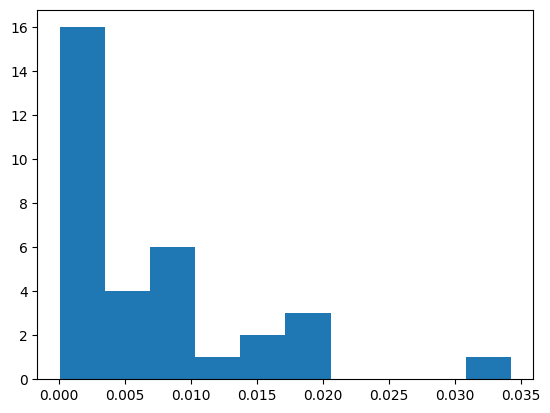

In [ ]:
plt.hist(std_test)

In [ ]:
print('L: ', r2_score(y_test[:,0], y_pred[:,0]))#, multioutput='variance_weighted'))
print('a: ', r2_score(y_test[:, 1], y_pred[:, 1]))#, multioutput='variance_weighted'))
print('b: ', r2_score(y_test[:, 2], y_pred[:, 2]))#, multioutput='variance_weighted'))

L:  0.6673968137263685
a:  0.6667450605009801
b:  0.6813376068787629


In [ ]:
!pip install colorspacious

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
color_list_exp = []

for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)

  c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
  color_list_exp.append(str(c))

NameError: ignored

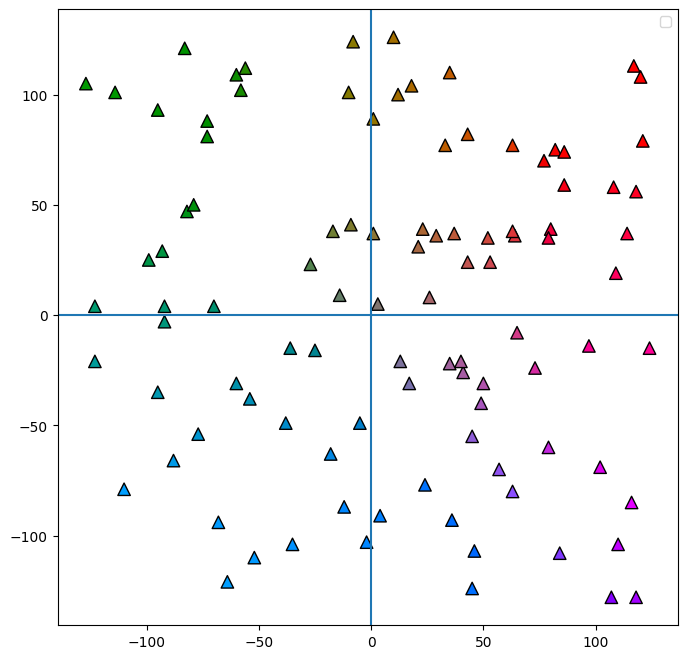

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
ax.axvline(x=0)
ax.axhline(y=0)
#ax.scatter(a_,b_, c=color_list, s=80, label='database')
ax.scatter(pd.DataFrame(lab_colors_sample ).iloc[:,1],pd.DataFrame(lab_colors_sample ).iloc[:,2], c=color_list_exp, marker='^', edgecolors='black', s=80)#, label='experimental batches')
#ax.scatter(gen_data['a'], gen_data['b'], c=color_list_gen, marker='s', edgecolors='black', s=80, label='generative model')
plt.legend()

In [ ]:
import random
sample_size = 100  # Specify the desired sample size
lab_colors_sample = random.sample(lab_colors, sample_size)
num_colors = len(lab_colors_sample)

In [ ]:
y_pred = lab_colors_sample

In [ ]:
from itertools import product

a_values = range(-128, 128)
b_values = range(-128, 128)
lab_colors = [(50, a, b) for a, b in product(a_values, b_values)]
num_colors = len(lab_colors)

In [ ]:
!pip install colormath

In [ ]:
import numpy as np
def dominant_hue(color):
    """
    Calculate the dominant hue of a Lab color.
    """
    a, b = color[1], color[2]
    hue = np.arctan2(b, a) * 180 / np.pi
    if hue < 0:
        hue += 360
    return hue

def divide_color_palette(palette):
    """
    Divide the color palette into basic color regions.
    """
    color_regions = {
        'red': [],
        'green': [],
        'blue': [],
        'cyan': [],
        'magenta': [],
        'yellow': []
    }
    for idx, color in enumerate(palette):
        hue = dominant_hue(color)
        if hue >= 0 and hue < 60:
            color_regions['red'].append(idx)
        elif hue >= 60 and hue < 120:
            color_regions['yellow'].append(idx)
        elif hue >= 120 and hue < 180:
            color_regions['green'].append(idx)
        elif hue >= 180 and hue < 240:
            color_regions['cyan'].append(idx)
        elif hue >= 240 and hue < 300:
            color_regions['blue'].append(idx)
        elif hue >= 300 and hue < 360:
            color_regions['magenta'].append(idx)
        else:
            color_regions['red'].append(idx)  # Handle edge case near red
    return color_regions

# Example usage
color_palette =df_y.values
divided_colors = divide_color_palette(color_palette)

# Print the colors in each region
for region, colors in divided_colors.items():
    print(f"{region}: {colors}")


red: [4, 5, 17, 18, 38, 46, 64, 65, 74, 99, 100, 103, 104, 105, 106, 107, 130, 131, 132, 141, 142, 152, 160]
green: [27, 28, 29, 72, 93, 94, 95, 96]
blue: [7, 10, 20, 24, 39, 40, 41, 48, 49, 51, 60, 61, 62, 63, 79, 80, 92, 108, 109, 110, 111, 120, 121, 122, 123, 125, 126, 127, 128, 135, 136, 137, 138, 139, 151, 155, 156, 157]
cyan: [0, 1, 2, 6, 11, 12, 13, 14, 15, 16, 19, 25, 26, 30, 71, 91, 140]
magenta: [3, 8, 9, 21, 22, 42, 43, 44, 45, 47, 50, 52, 54, 55, 56, 70, 75, 76, 77, 78, 81, 82, 84, 85, 101, 102, 112, 113, 114, 115, 116, 117, 118, 119, 124, 133, 134, 146, 149, 150, 153, 154, 159, 161, 162, 163, 164]
yellow: [23, 31, 32, 33, 34, 35, 36, 37, 53, 57, 58, 59, 66, 67, 68, 69, 73, 83, 86, 87, 88, 89, 90, 97, 98, 129, 143, 144, 145, 147, 148, 158]


In [ ]:
L=electrochromics['L* (Colored State)'].dropna().values
a_=electrochromics['a* (Colored State)'].dropna().values
b_=electrochromics['b*(Colored State)'].dropna().values

In [ ]:
from colormath.color_objects import LabColor, XYZColor, sRGBColor
from colormath.color_conversions import convert_color

y_pred = list(zip(L,a_,b_))
color_list = []

for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)
  try:
    c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
    color_list.append(str(c))
  except:
    pass

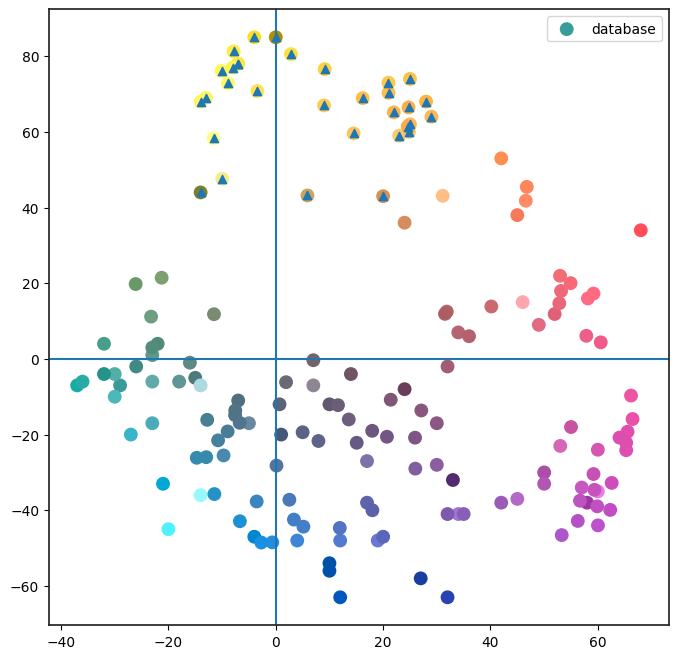

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
ax.axvline(x=0)
ax.axhline(y=0)
ax.scatter(a_,b_, c=color_list, s=80, label='database')
ax.scatter(a_[divided_colors['yellow']],b_[divided_colors['yellow']], marker='^')

#ax.scatter(exp_batches_a, exp_batches_b, c=color_list_exp, marker='^', edgecolors='black', s=80, label='experimental batches')
plt.legend()

In [ ]:
electrochromics.loc[divided_colors['yellow']].color

In [ ]:

dataset.loc[divided_colors['red']]

# Shapley

In [ ]:
!pip install shap
import shap

# print the JS visualization code to the notebook
shap.initjs()

In [ ]:
electrochromics.shape

(167, 35)

In [ ]:
dataset.shape

(165, 3168)

In [ ]:
explainer = shap.GradientExplainer(
    model = model,
    data = [torch.FloatTensor(dataset.values)])#,
    #link = "identity")

In [ ]:
data = [torch.FloatTensor(dataset.values)]
shap_values = explainer.shap_values(data)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


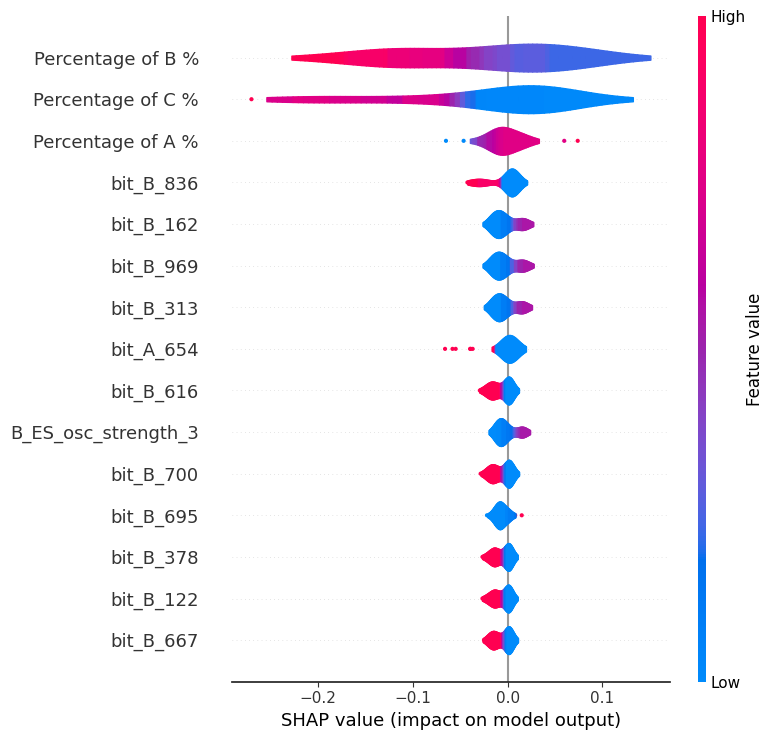

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['blue']]+ shap_values[2][divided_colors['blue']], dataset.loc[divided_colors['blue']].values, feature_names = dataset.columns, max_display=15, plot_type='violin')


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


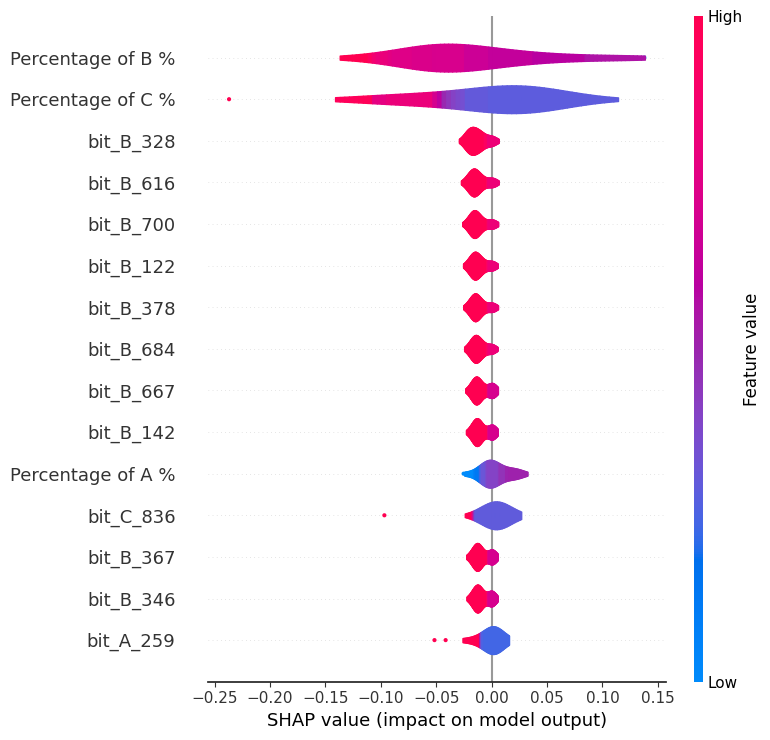

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['cyan']]+ shap_values[2][divided_colors['cyan']], dataset.loc[divided_colors['cyan']].values, feature_names = dataset.columns, max_display=15, plot_type='violin')


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


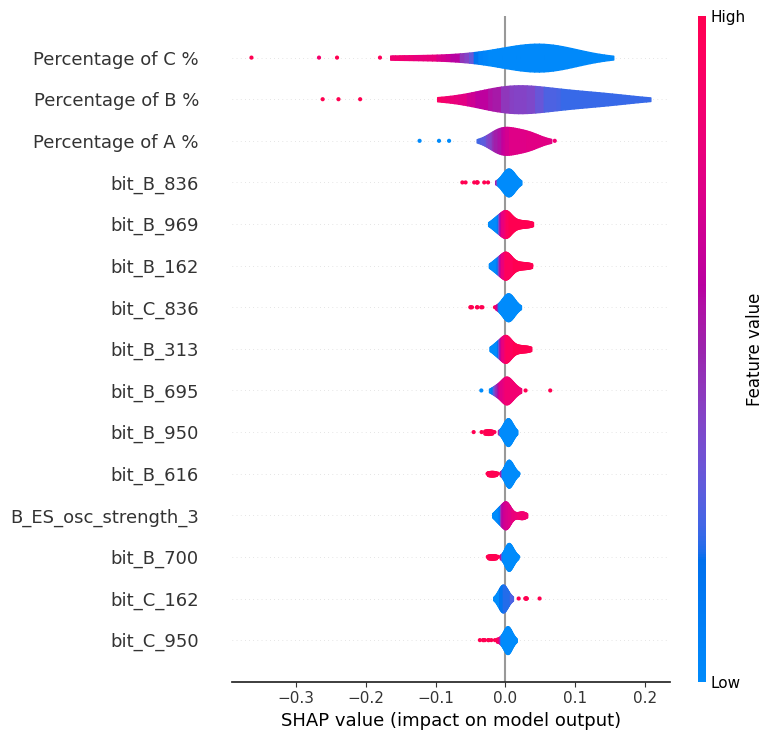

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['magenta']]+ shap_values[2][divided_colors['magenta']], dataset.loc[divided_colors['magenta']].values, feature_names = dataset.columns, max_display=15, plot_type='violin')


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


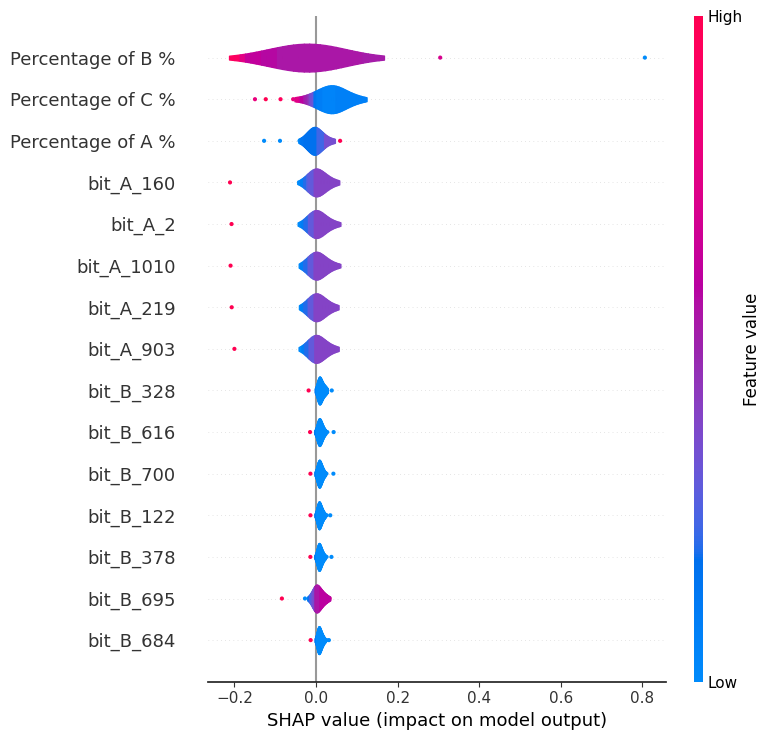

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['yellow']]+ shap_values[2][divided_colors['yellow']], dataset.loc[divided_colors['yellow']].values, feature_names = dataset.columns, max_display=15, plot_type='violin')


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


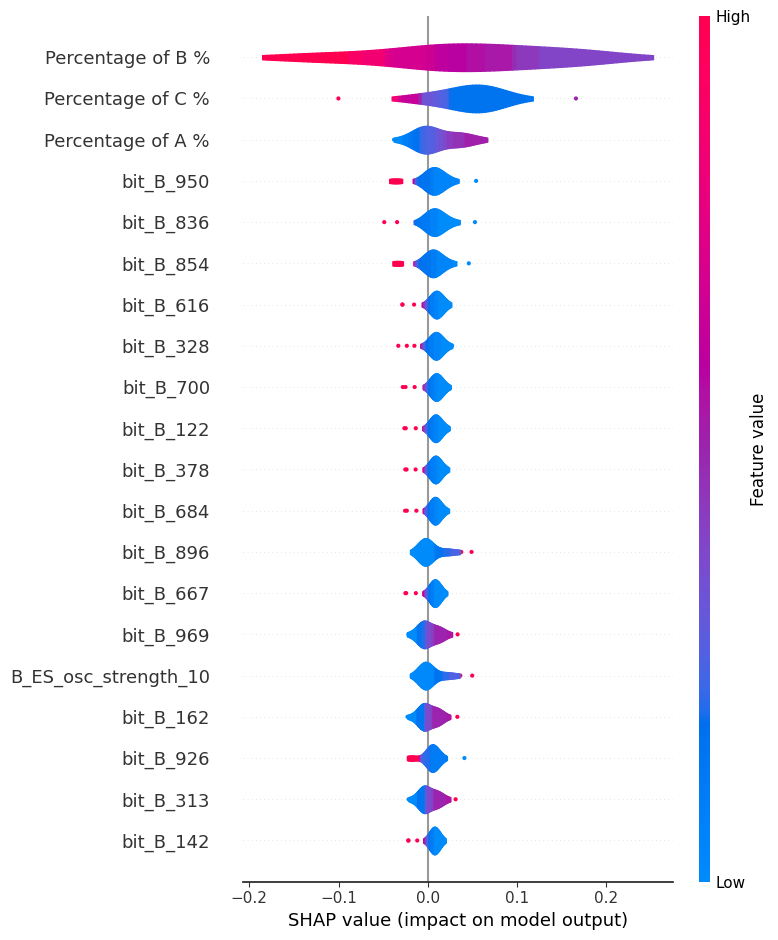

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['red']]+ shap_values[2][divided_colors['red']], dataset.loc[divided_colors['red']].values, feature_names = dataset.columns, max_display=20, plot_type='violin')


In [ ]:
selected_indices

[2080,
 2081,
 2082,
 2083,
 2084,
 2085,
 2086,
 2087,
 2088,
 2089,
 2090,
 2091,
 2092,
 2093,
 2094,
 2095,
 2096,
 2097,
 2098,
 2099,
 2100,
 2101,
 2102,
 2103,
 2104,
 2105,
 2106,
 2107,
 2108,
 2109,
 2110]

In [ ]:
dataset.iloc[divided_colors['green'],  selected_indices]

,B_dipole,B_molar_mass,B_molar_volume,B_electronic_spatial_extent,B_homo_energy,B_lumo_energy,B_electronegativity,B_hardness,B_ES_root_dipole,B_ES_root_molar_volume,...,B_ES_osc_strength_1,B_ES_osc_strength_2,B_ES_osc_strength_3,B_ES_osc_strength_4,B_ES_osc_strength_5,B_ES_osc_strength_6,B_ES_osc_strength_7,B_ES_osc_strength_8,B_ES_osc_strength_9,B_ES_osc_strength_10
27,0.228211,0.112564,0.079146,0.016848,0.487466,0.936796,0.151573,0.837011,0.572174,0.109040,...,0.041506,0.000556,0.792381,0.261816,0.028060,0.007842,0.052997,0.167902,0.010136,0.025119
28,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000
29,0.614986,0.617665,0.525954,0.483694,0.756763,0.991360,0.013659,0.797574,0.835903,0.822258,...,0.009331,0.000556,0.859683,0.539565,0.005612,0.001758,0.014428,0.008552,0.007086,0.005246
72,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000
93,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000
94,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000
95,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000
96,0.473627,0.098906,0.072080,0.014873,0.000000,0.211213,0.953725,0.386150,0.595102,0.138092,...,0.196911,1.000000,0.000000,0.001062,0.002455,0.000000,0.189234,1.000000,0.000000,0.000000


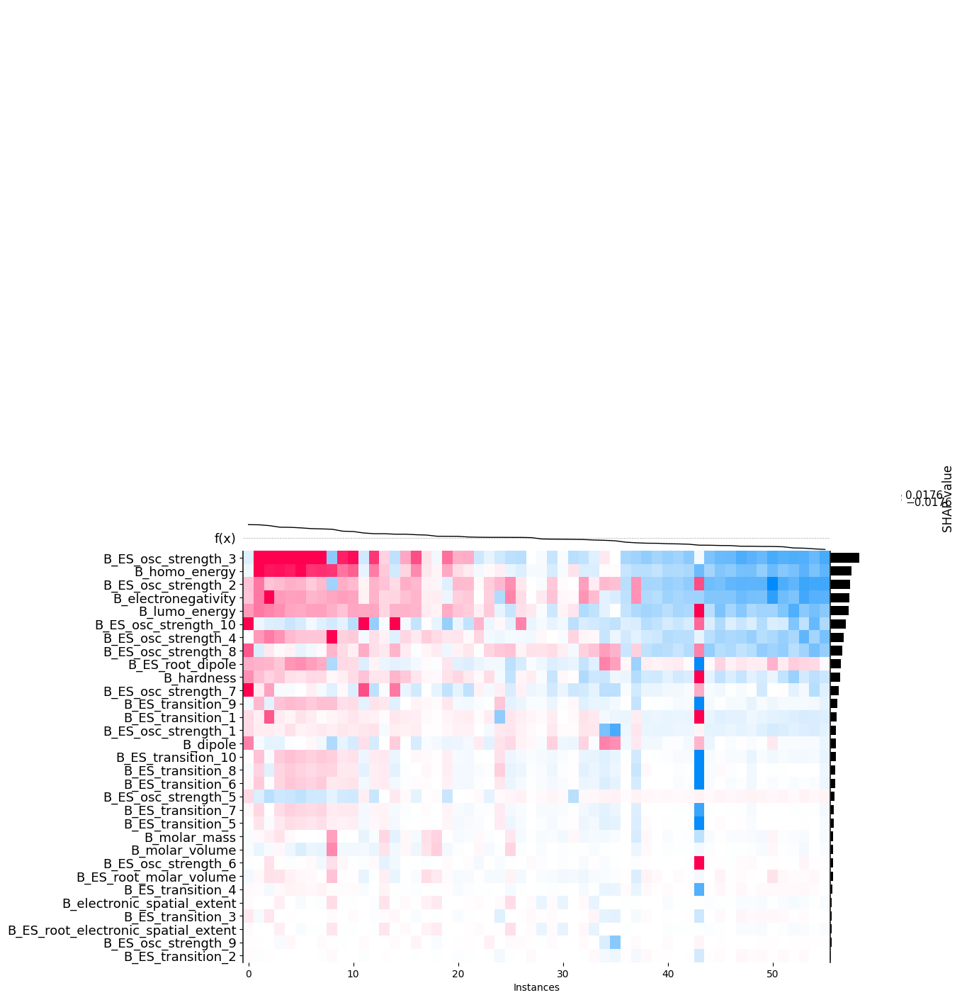

In [ ]:
# Define a list of feature names that you want to include in the plot
selected_features = df2_dft.columns.tolist()  # replace these with your actual feature names

# Find the indices of these features
selected_indices =  [list(dataset.columns).index(feature) for feature in selected_features]

# Slice shap_values and data to include only selected features
selected_shap_values = shap_values[1][df_a4[df_a4.smiles_C=='0'].index][:, selected_indices] + shap_values[2][df_a4[df_a4.smiles_C=='0'].index][:, selected_indices]
selected_data = dataset.iloc[df_a4[df_a4.smiles_C=='0'].index,  selected_indices]

# Create a new Explanation object with the selected features
shap_values_selected = shap.Explanation(values=selected_shap_values,
                                        data=selected_data,
                                        feature_names=selected_features)

# Plot the heatmap with the selected features
shap.plots.heatmap(shap_values_selected, max_display=32, plot_width=12 , instance_order=shap_values_selected.sum(1), show=False)#
plt.savefig("shap_heatmap.svg",dpi=700)

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


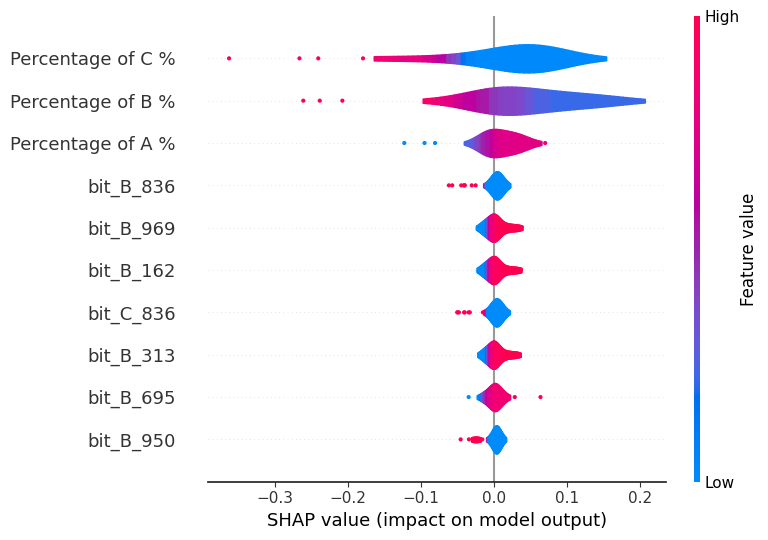

In [ ]:
shap.summary_plot(shap_values[1][divided_colors['magenta']]+ shap_values[2][divided_colors['magenta']], dataset.loc[divided_colors['magenta']].values, feature_names = dataset.columns, max_display=10, plot_type='violin', show=False)

plt.savefig("shap_summary_magenda.svg",dpi=700)

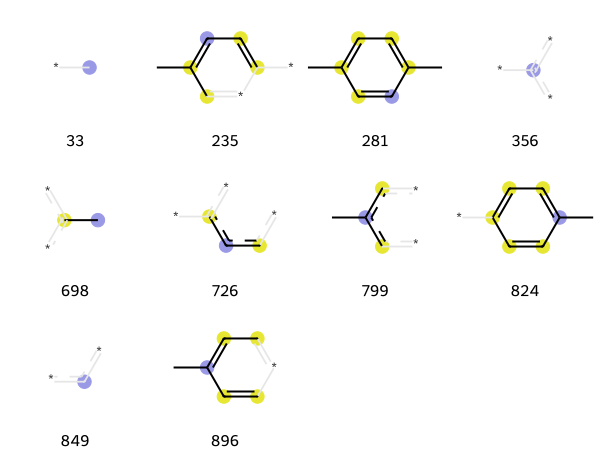

In [ ]:
epinephrine = Chem.MolFromSmiles('C1=CC(=CC=C1C)C')

bi = {}
fp = AllChem.GetMorganFingerprintAsBitVect(epinephrine, 3, nBits=1024, bitInfo=bi)
tpls = [(epinephrine,x,bi) for x in fp.GetOnBits()]
Draw.DrawMorganBits(tpls[:40],molsPerRow=4,legends=[str(x) for x in fp.GetOnBits()][:40])

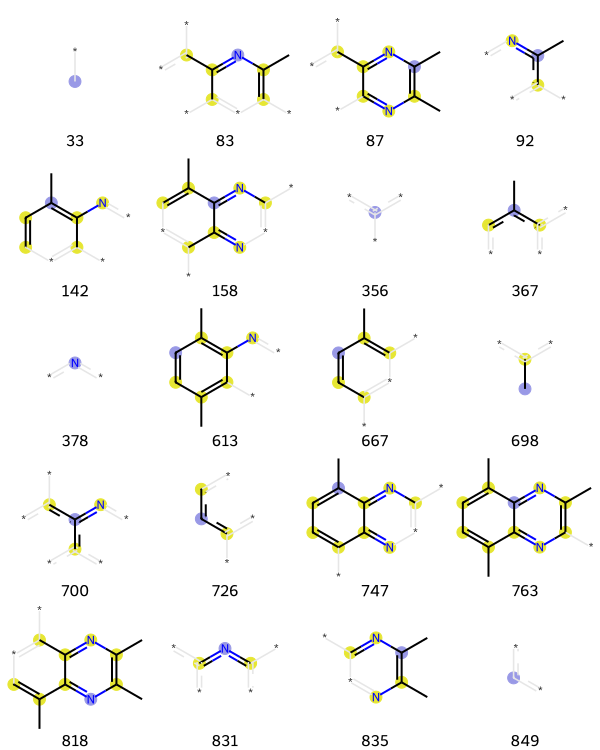

In [ ]:
epinephrine = Chem.MolFromSmiles('Cc1ccc(C)c2nc(C)c(C)nc12')

bi = {}
fp = AllChem.GetMorganFingerprintAsBitVect(epinephrine, 3, nBits=1024, bitInfo=bi)
tpls = [(epinephrine,x,bi) for x in fp.GetOnBits()]
Draw.DrawMorganBits(tpls[:40],molsPerRow=4,legends=[str(x) for x in fp.GetOnBits()][:40])

In [ ]:
df_y.shape

(165, 3)

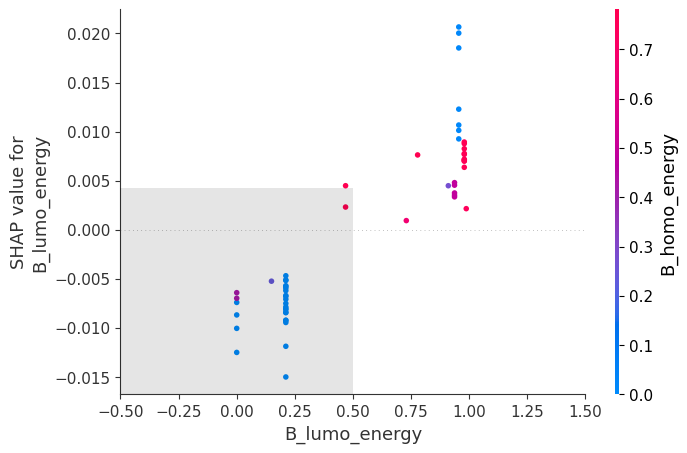

In [ ]:
shap.plots.scatter(shap_values_explained[:,"B_lumo_energy"], color=shap_values_explained[:,"B_homo_energy"])


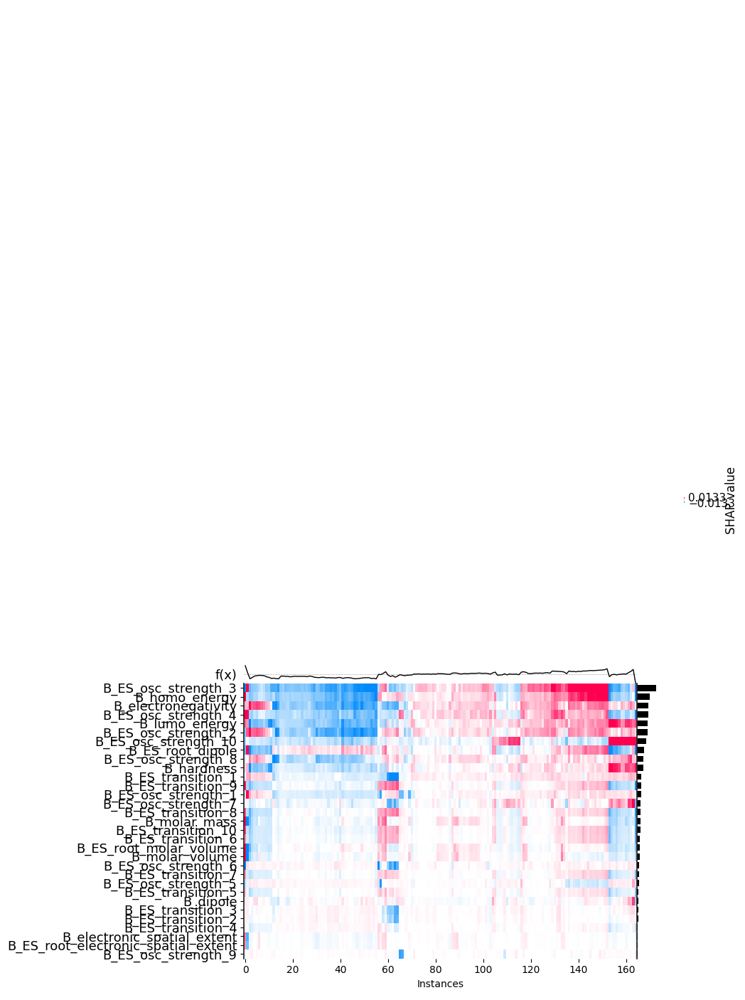

In [ ]:
# Define a list of feature names that you want to include in the plot
selected_features = df2_dft.columns.tolist()  # replace these with your actual feature names

# Find the indices of these features
selected_indices = [list(dataset.columns).index(feature) for feature in selected_features]

# Slice shap_values and data to include only selected features
selected_shap_values = shap_values[1][:, selected_indices]
selected_data = dataset.values[:, selected_indices]

# Create a new Explanation object with the selected features
shap_values_selected = shap.Explanation(values=selected_shap_values,
                                        data=selected_data,
                                        feature_names=selected_features)

# Plot the heatmap with the selected features
shap.plots.heatmap(shap_values_selected, max_display=32 )#, instance_order=shap_values_selected.sum(1))


In [ ]:
# Define a list of feature names in the order you want them to appear in the plot
feature_order = dataset.columns.tolist()

shap_values_explained = shap.Explanation(values=shap_values[1][:],
                                         data=dataset.values,
                                         feature_names=dataset.columns)

# Then you can call the heatmap plot function
shap.plots.heatmap(shap_values_explained, feature_order=dataset.columns.tolist())

IndexError: ignored

In [ ]:
shap_values_explained = shap.Explanation(values=shap_values[1][:], data=dataset.values, feature_names=dataset.columns)

# Then you can call the heatmap plot function
shap.plots.heatmap(shap_values_explained, instance_order=shap_values_explained.sum(1))#, max_display=30)

IndexError: ignored

In [ ]:
# find the index of the 'ES_osc_strength_3' feature in your dataset
feature_index = list(X_train.columns).index('ES_osc_strength_3')

# use this index to select the 'ES_osc_strength_3' feature from your shap values
feature_shap_values = shap_values[0][0].values[feature_index]  # Assuming that shap_values is a numpy array

# reshape the numpy array
reshaped_feature_shap_values = feature_shap_values.reshape(-1, 1)

# create a Shapley explanation for the specific feature
feature_shap_explanation = shap.Explanation(values=reshaped_feature_shap_values,
                                            data=X_train[['ES_osc_strength_3']].values,
                                            feature_names=['ES_osc_strength_3'])

# plot the Shapley values
shap.plots.scatter(feature_shap_explanation)


In [ ]:
shap.summary_plot(shap_values[1], dataset.loc[divided_colors['red']].values, feature_names = dataset.columns)#, plot_type='bar')

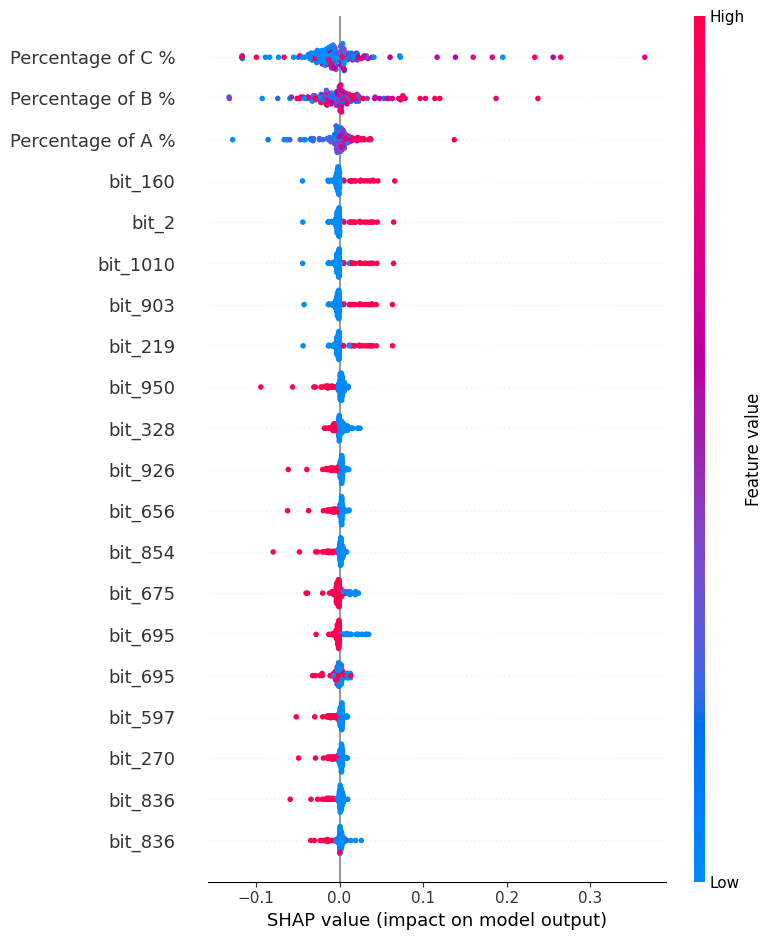

In [ ]:
shap.summary_plot(shap_values[2], dataset.values, feature_names = X_train.columns)

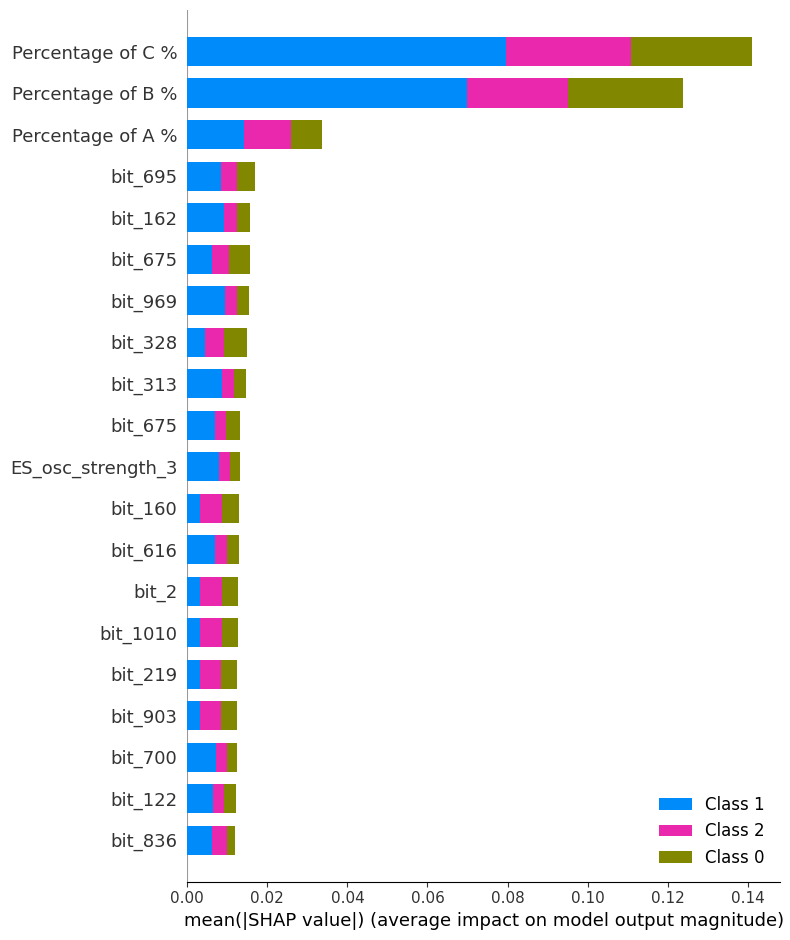

In [ ]:
# print the JS visualization code to the notebook
shap.initjs()

#print(f'Current Label Shown: {list_of_labels[current_label.value]}\n')

shap.summary_plot(shap_values, X_train
                 # features = cols_X, max_display=30,
                  # pd.DataFrame(np_test_data.reshape((20, -1)), columns=dataset.columns.values),
                  #np_test_data.reshape((20, -1)),
                  )


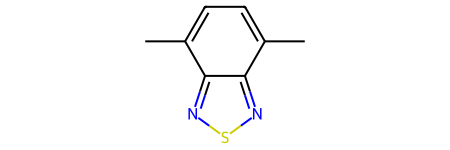

In [ ]:
epinephrine = Chem.MolFromSmiles('Cc1ccc(C)c2nsnc12') #('*c1sc(*)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12')
epinephrine

In [ ]:

from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem import Draw
bi = {}
fp = rdMolDescriptors.GetMorganFingerprintAsBitVect(epinephrine, radius=3,nBits=1024, bitInfo=bi)
#fp = rdFingerprintGenerator.GetMorganGenerator(epinephrine,radius=3,fpSize=1024,countSimulation=True, bitInfo=bi)
# show 10 of the set bits:
list(fp.GetOnBits())[:]

[33,
 122,
 142,
 210,
 328,
 346,
 356,
 367,
 378,
 475,
 613,
 616,
 661,
 667,
 675,
 684,
 698,
 700,
 726,
 849,
 1005]

In [ ]:
fpgen1 = rdFingerprintGenerator.GetMorganGenerator(radius=3,fpSize=1024,countSimulation=True)
fp = fpgen1.GetCountFingerprintAsNumPy(epinephrine, bitInfo=bi)

ArgumentError: ignored

In [ ]:
from IPython.display import SVG

def LoveYouNakiusMou(mol, bits, bit_info):
  atomsToUse = set()
  for bit in bits:
    for (atom_id, _) in bit_info[bit]:
      atomsToUse.add(atom_id)
  atomsToUse = list(atomsToUse)
  print(atomsToUse)
  d = Draw.rdMolDraw2D.MolDraw2DSVG(600, 600)
  Draw.rdMolDraw2D.PrepareAndDrawMolecule(d, mol, highlightAtoms=atomsToUse)
  return d

[0, 1, 4, 5, 7, 9]


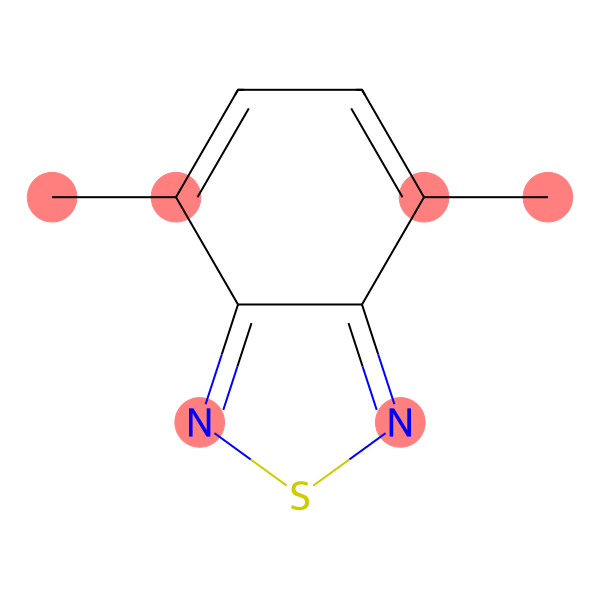

In [ ]:
mol = Chem.MolFromSmiles('Cc1ccc(C)c2nsnc12')
bi = {}
fp = AllChem.GetMorganFingerprintAsBitVect(mol, 3, nBits=1024, useChirality=True,bitInfo=bi)
d =LoveYouNakiusMou(mol, [ 210, 328, 33, 122], bi) #656, 981,
d.FinishDrawing()
SVG(d.GetDrawingText().replace('svg:', ''))

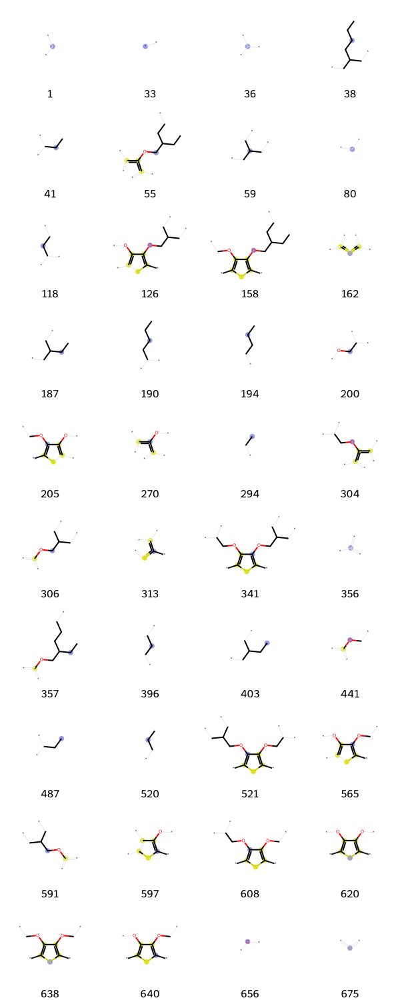

In [ ]:
epinephrine = Chem.MolFromSmiles('*c1sc(*)c(OCC(CC)CCCC)c1OCC(CC)CCCC')

bi = {}
fp = AllChem.GetMorganFingerprintAsBitVect(mol, 3, nBits=1024, bitInfo=bi)
tpls = [(epinephrine,x,bi) for x in fp.GetOnBits()]
Draw.DrawMorganBits(tpls[:40],molsPerRow=4,legends=[str(x) for x in fp.GetOnBits()][:40])

#Eval

In [ ]:
len(y_test[:,0])

17

In [ ]:
len(y_pred_train[:,0])

17

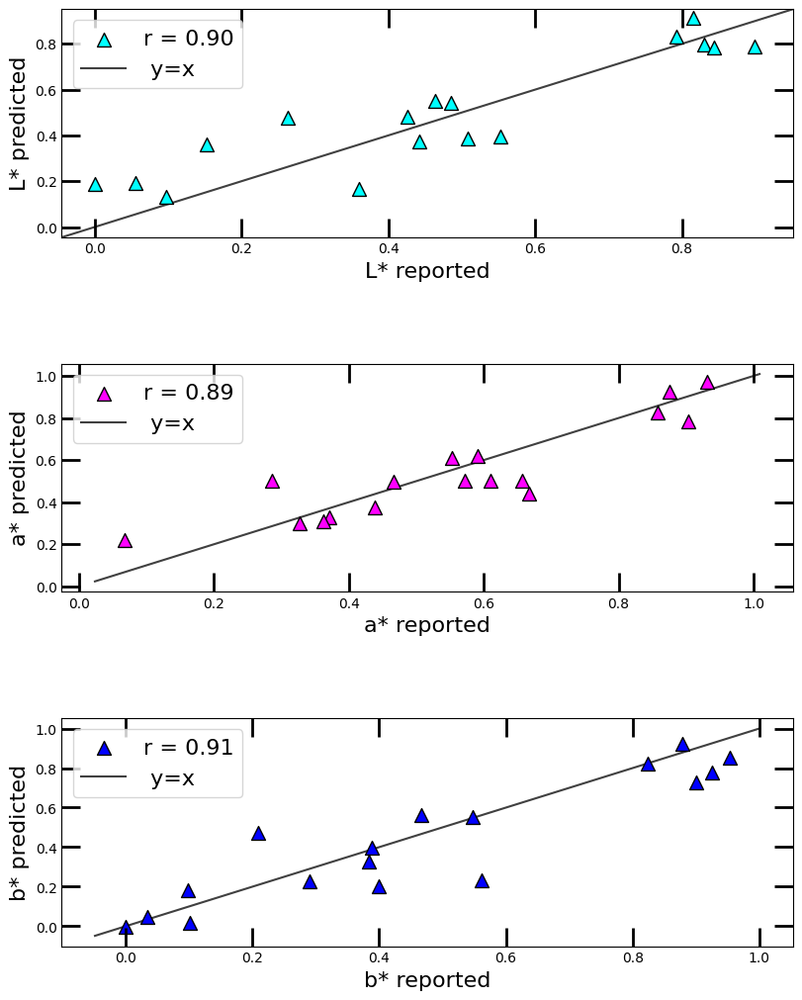

In [ ]:
# Construct histograms showing the scores distribution of the labeled/unlabeled data for each algorithm used
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
plt.rcParams["font.weight"] = "normal"
plt.rcParams["axes.labelweight"] = "normal"
fig, axes = plt.subplots(figsize=(8,10),nrows=3, ncols=1,constrained_layout=True, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

ax0, ax1, ax2= axes.flatten()

# Polymer Chemistry, 11, 2173 – 2181, 2020 journal
slope, intercept, r_value, p_value, std_err = stats.linregress(y_test[:,0],y_pred_train[:,0])
ax0.scatter(y_test[:,0],y_pred_train[:,0],color="cyan", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))


line = slope*np.array(y_test[:,0])+intercept
#ax0.plot(y_true[:,0], line, '-', linewidth=2.0, alpha=0.6,color='cyan', label='y={:.2f}x+{:.2f}'.format(slope,intercept))


lims = [
    np.min([ax0.get_xlim(), ax0.get_ylim()]),  # min of both axes
    np.max([ax0.get_xlim(), ax0.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax0.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
#ax0.set_aspect('equal')
ax0.set_xlim(lims)
ax0.set_ylim(lims)
ax0.spines['bottom'].set_color('black')
ax0.spines['top'].set_color('black')
ax0.spines['right'].set_color('black')
ax0.spines['left'].set_color('black')
ax0.tick_params(axis = 'both', which='both', width=2)
ax0.tick_params(axis='x', colors='black')
ax0.tick_params(axis = 'both', which='major', length=14)
ax0.tick_params(axis = 'both', which='minor', length=8, color='black')
ax0.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax0.set_xlabel('L* reported', fontsize=16)
ax0.set_ylabel('L* predicted', fontsize=16)
ax0.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_test[:,1],y_pred[:,1])
ax1.scatter(y_test[:,1],y_pred_train[:,1], color="magenta", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))
line = slope*np.array(y_test[:,1])+intercept
#ax1.plot(y_true[:,1], line, '-', linewidth=2.0, alpha=0.6, color='magenta' ,label='y={:.2f}x+{:.2f}'.format(slope,intercept))
lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black')
ax1.spines['right'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.tick_params(axis = 'both', which='both', width=2)
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis = 'both', which='major', length=14)
ax1.tick_params(axis = 'both', which='minor', length=8, color='black')
ax1.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax1.set_xlabel('a* reported', fontsize=16)
ax1.set_ylabel('a* predicted', fontsize=16)
ax1.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_test[:,2],y_pred[:,2])
ax2.scatter(y_test[:,2],y_pred_train[:,2], color="blue", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))
line = slope*np.array(y_test[:,2])+intercept
#ax2.plot(y_true[:,2], line, '-', linewidth=2.0, alpha=0.6, label='y={:.2f}x+{:.2f}'.format(slope,intercept))

lims = [
    np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
    np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax2.spines['bottom'].set_color('black')
ax2.spines['top'].set_color('black')
ax2.spines['right'].set_color('black')
ax2.spines['left'].set_color('black')
ax2.tick_params(axis = 'both', which='both', width=2)
ax2.tick_params(axis='x', colors='black')
ax2.tick_params(axis = 'both', which='major', length=14)
ax2.tick_params(axis = 'both', which='minor', length=8, color='black')
ax2.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax2.set_xlabel('b* reported', fontsize=16)
ax2.set_ylabel('b* predicted', fontsize=16)
ax2.legend(prop={'size': 16})


#plt.savefig('/content/set_transformer_test.png', rasterized=True,  bbox_inches="tight", dpi=600)

In [ ]:
dataset_test

,bit_0,bit_1,bit_2,bit_3,bit_4,bit_5,bit_6,bit_7,bit_8,bit_9,...,ES_osc_strength_2,ES_osc_strength_3,ES_osc_strength_4,ES_osc_strength_5,ES_osc_strength_6,ES_osc_strength_7,ES_osc_strength_8,ES_osc_strength_9,ES_osc_strength_10,Percentage of C %
0,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
2,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [ ]:
validation_data_1, validation_data_2, validation_data_3, y_valid = np.array(dataset_test.iloc[:,:Ndims].values, dtype=float), np.array(dataset_test.iloc[:,Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled, dtype=np.float16)

# y_pred, y_std= model.test_model(validation_data_1, validation_data_2, validation_data_3 ,y_valid) #, y_std
y_pred, y_std= test(_model, validation_data_1, validation_data_2, validation_data_3 ,y_valid) #, y_std

y_pred = y_pred#.cpu().detach().numpy()
#y_pred=[item for sublist in y_pred for item in sublist]
y_true= y_valid # experimental_y_scaled

y_true= scalery.inverse_transform(y_true)
y_pred= scalery.inverse_transform(y_pred)#.detach().numpy())

u= ((y_true - y_pred)** 2).sum()
v = ((y_true - y_true.mean()) ** 2).sum()
R= 1-(u/v)
print(R)
r2_score(y_true, y_pred)#, multioutput='variance_weighted')

-1.4095463752746582


-74.63314395319162

In [ ]:
r2_score(y_true[:,0],y_pred[:,0])

-20.36961431239813

In [ ]:
r2_score(y_true[:,1],y_pred[:,1])

-200.58770760778003

In [ ]:
r2_score(y_true[:,2],y_pred[:,2])

-2.942109939396685

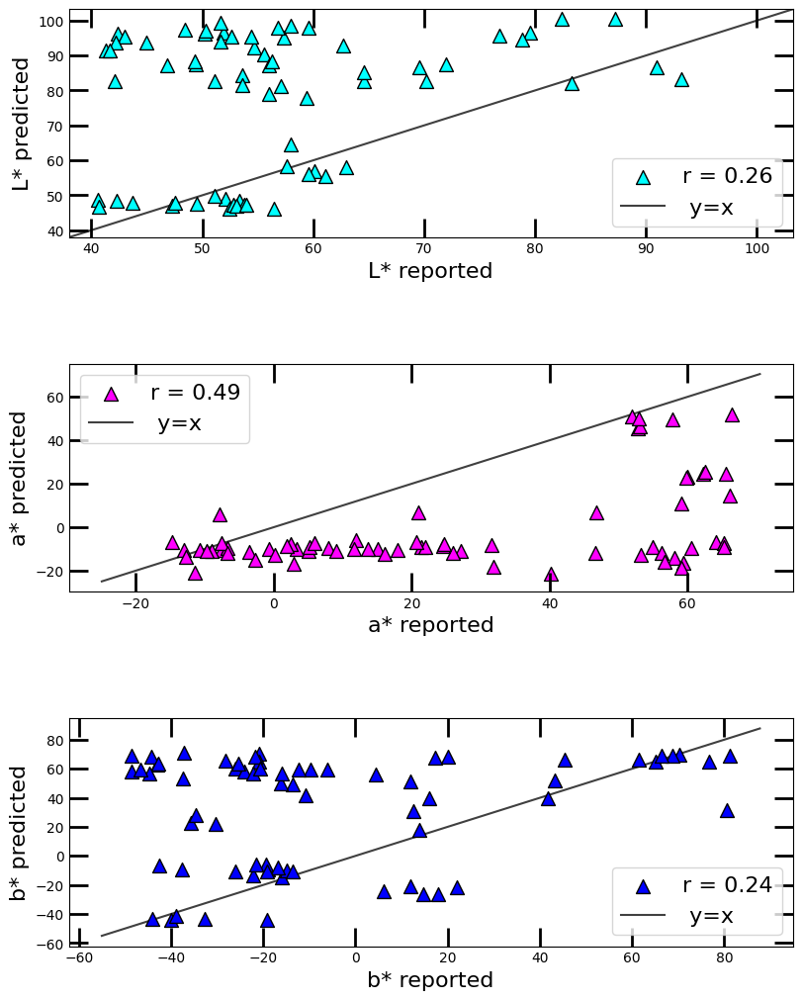

In [ ]:
# Construct histograms showing the scores distribution of the labeled/unlabeled data for each algorithm used
from matplotlib import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
plt.rcParams["font.weight"] = "normal"
plt.rcParams["axes.labelweight"] = "normal"
fig, axes = plt.subplots(figsize=(8,10),nrows=3, ncols=1,constrained_layout=True, gridspec_kw = {'wspace':0.25, 'hspace':0.25})

ax0, ax1, ax2= axes.flatten()

# Polymer Chemistry, 11, 2173 – 2181, 2020 journal

slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,0],y_pred[:,0])
ax0.scatter(y_true[:,0],y_pred[:,0],color="cyan", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))

lims = [
    np.min([ax0.get_xlim(), ax0.get_ylim()]),  # min of both axes
    np.max([ax0.get_xlim(), ax0.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax0.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
#ax0.set_aspect('equal')
ax0.set_xlim(lims)
ax0.set_ylim(lims)
ax0.spines['bottom'].set_color('black')
ax0.spines['top'].set_color('black')
ax0.spines['right'].set_color('black')
ax0.spines['left'].set_color('black')
ax0.tick_params(axis = 'both', which='both', width=2)
ax0.tick_params(axis='x', colors='black')
ax0.tick_params(axis = 'both', which='major', length=14)
ax0.tick_params(axis = 'both', which='minor', length=8, color='black')
ax0.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax0.set_xlabel('L* reported', fontsize=16)
ax0.set_ylabel('L* predicted', fontsize=16)
ax0.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,1],y_pred[:,1])
ax1.scatter(y_true[:,1],y_pred[:,1], color="magenta", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))
line = slope*np.array(y_true[:,1])+intercept
#ax1.plot(y_true[:,1], line, '-', linewidth=2.0, alpha=0.6, color='magenta' ,label='y={:.2f}x+{:.2f}'.format(slope,intercept))
lims = [
    np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
    np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax1.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black')
ax1.spines['right'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.tick_params(axis = 'both', which='both', width=2)
ax1.tick_params(axis='x', colors='black')
ax1.tick_params(axis = 'both', which='major', length=14)
ax1.tick_params(axis = 'both', which='minor', length=8, color='black')
ax1.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax1.set_xlabel('a* reported', fontsize=16)
ax1.set_ylabel('a* predicted', fontsize=16)
ax1.legend(prop={'size': 16})


slope, intercept, r_value, p_value, std_err = stats.linregress(y_true[:,2],y_pred[:,2])
ax2.scatter(y_true[:,2],y_pred[:,2], color="blue", s=100, edgecolor='black', marker='^', label='r = {:.2f}'.format(r_value))
line = slope*np.array(y_true[:,2])+intercept
#ax2.plot(y_true[:,2], line, '-', linewidth=2.0, alpha=0.6, label='y={:.2f}x+{:.2f}'.format(slope,intercept))

lims = [
    np.min([ax2.get_xlim(), ax2.get_ylim()]),  # min of both axes
    np.max([ax2.get_xlim(), ax2.get_ylim()]),  # max of both axes
]

# now plot both limits against eachother
ax2.plot(lims, lims, 'k-', alpha=0.75, zorder=0, label =' y=x' )
ax2.spines['bottom'].set_color('black')
ax2.spines['top'].set_color('black')
ax2.spines['right'].set_color('black')
ax2.spines['left'].set_color('black')
ax2.tick_params(axis = 'both', which='both', width=2)
ax2.tick_params(axis='x', colors='black')

#major_ticks_x = np.arange(-30, 80, 20)
#minor_ticks_x = np.arange(-30, 80, 50)
#major_ticks_y = np.arange(-30, 80, 20)
#minor_ticks_y = np.arange(-30, 80, 5)
#ax2.set_xticks(major_ticks_x)
#ax2.set_xticks(minor_ticks_x, minor=True)
#ax2.set_yticks(major_ticks_y)
#ax2.set_yticks(minor_ticks_y, minor=True)

ax2.tick_params(axis = 'both', which='major', length=14)
ax2.tick_params(axis = 'both', which='minor', length=8, color='black')
ax2.tick_params(axis = 'both', which='both' , bottom=True, top=True, left=True, right=True, direction='in')
ax2.set_xlabel('b* reported', fontsize=16)
ax2.set_ylabel('b* predicted', fontsize=16)
ax2.legend(prop={'size': 16})

#plt.savefig('/content/set_transformer_valid.png', rasterized=True,  bbox_inches="tight", dpi=600)

In [ ]:
!pip install colormath

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
smiles1 = "Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12" #"CC3SC(C2SC(C)C1OCCOC12)C4OCCOC34"
smiles2 = "Cc1ccc(C)c2nc(C)c(C)nc12" # "Cc6nc5c(C1SC(C)C2OCCOC12)ccc(C3SC(C)C4OCCOC34)c5nc6C"#

#"CC7SC(c5ccc(C1SC(C)C2OCCOC12)c6nc(c3ccccc3)c(c4ccccc4)nc56)C8OCCOC78"

#"CC5SC(c3ccc(C1SC(C)C2OCCOC12)c4nsnc34)C6OCCOC56"
# "*C7SC(c5ccc(C1SC(*)C2OCCOC12)c6nc(c3ccccc3)c(c4ccccc4)nc56)C8OCCOC78"

#"*C5SC(c3ccc(C1SC(*)C2OCCOC12)c4nc(C)c(C)nc34)C6OCCOC56" #"Cc1ccc(C)c2nc(C)c(C)nc12"



percentage_1 = np.array([50,55, 60, 65, 70, 75, 80, 85, 90, 95, 100])/100
percentage_2 = (1 - percentage_1)
percentage_3 = (np.zeros(len(percentage_1)))
validation = pd.concat([pd.DataFrame(np.repeat(smiles1, len(percentage_1),axis=0), columns=['smiles1']),pd.DataFrame(np.repeat(smiles2, len(percentage_1),axis=0), columns=['smiles2']),
pd.DataFrame(percentage_3, columns=['smiles3']) ,pd.DataFrame(percentage_1, columns=['percentage_1']), pd.DataFrame(percentage_2, columns=['percentage_2']),
pd.DataFrame(percentage_3, columns=['percentage_3'])], axis=1)


validation_1 =  kat_paws_from_df(validation.smiles1, 'bit_1')
validation_2 =  kat_paws_from_df(validation.smiles2, 'bit_2')
validation_3 =  kat_paws_from_df(validation.smiles3, 'bit_3')
validation_1_dft =  dft_descr_from_df(validation.smiles1)
validation_2_dft =  dft_descr_from_df(validation.smiles2)
validation_3_dft =  dft_descr_from_df(validation.smiles3)
#validation_dataset = pd.concat([validation_1_dft ,validation[['percentage_1']], validation_2_dft ,validation[['percentage_2']], validation_3_dft ,validation[['percentage_3']]], axis=1)

validation_dataset = pd.concat([validation_1,validation_1_dft ,validation[['percentage_1']], validation_2,validation_2_dft ,validation[['percentage_2']], validation_3,validation_3_dft ,validation[['percentage_3']]], axis=1)
#validation_dataset = pd.concat([validation_1,validation[['percentage_1']], validation_2,validation[['percentage_2']], validation_3,validation[['percentage_3']]], axis=1)
validation_dataset

,bit_1_0,bit_1_1,bit_1_2,bit_1_3,bit_1_4,bit_1_5,bit_1_6,bit_1_7,bit_1_8,bit_1_9,...,ES_osc_strength_2,ES_osc_strength_3,ES_osc_strength_4,ES_osc_strength_5,ES_osc_strength_6,ES_osc_strength_7,ES_osc_strength_8,ES_osc_strength_9,ES_osc_strength_10,percentage_3
0,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,0,2,0,0,0,0,0,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
validation_data_1, validation_data_2, validation_data_3, y_valid = validation_dataset.iloc[:, :Ndims].values, validation_dataset.iloc[:, Ndims:2*Ndims].values, validation_dataset.iloc[:, 2*Ndims:].values, np.zeros(validation_dataset.shape[0])
#validation_data_1, validation_data_2, validation_data_3, y_valid = validation_dataset.iloc[:, :30].values, validation_dataset.iloc[:, 30:60].values, validation_dataset.iloc[:, 60:].values, np.zeros(validation_dataset.shape[0])
#validation_data_1, validation_data_2, validation_data_3, y_valid = validation_dataset.iloc[:, :1352].values, validation_dataset.iloc[:, 1352:4056].values, validation_dataset.iloc[:, 4056:].values, np.zeros(validation_dataset.shape[0])
#validation_data_1, validation_data_2, validation_data_3, y_valid = np.array(dataset_test.iloc[:,:Ndims].values, dtype=float), np.array(dataset_test.iloc[:,Ndims:2*Ndims].values, dtype=float), np.array(dataset_test.iloc[:, 2*Ndims:].values, dtype=float), np.array(experimental_y_scaled, dtype=np.float16)

y_pred, y_std= test(_model, validation_data_1, validation_data_2, validation_data_3 ,y_valid) #

y_true= y_valid # experimental_y_scaled

#y_true= scalery.inverse_transform(y_true.reshape(-1, 1))
y_pred= scalery.inverse_transform(y_pred)
y_pred

array([[ 58.819214 ,  46.01241  ,  18.380066 ],
       [ 57.0184   ,  48.468575 ,  16.048882 ],
       [ 56.824368 ,  45.853813 ,  17.596655 ],
       [ 56.360245 ,  48.67437  ,  15.862881 ],
       [ 55.417603 ,  47.271126 ,  11.097125 ],
       [ 55.161655 ,  49.792126 ,  11.391736 ],
       [ 54.95379  ,  49.669075 ,   4.7011404],
       [ 52.574368 ,  49.298336 ,  -3.9099457],
       [ 54.07648  ,  55.882286 , -12.7648535],
       [ 58.56473  ,  57.40597  , -14.671384 ],
       [ 61.087708 ,  57.553303 , -13.097578 ]], dtype=float32)

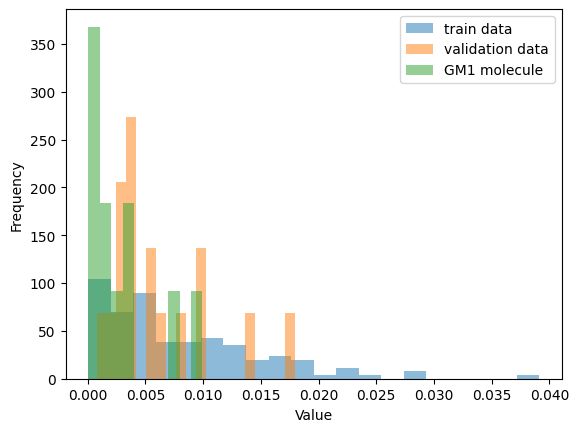

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some random data
data1 = train_std
data2 = valid_std
data3 = y_std

# Create a figure and axes object
fig, ax = plt.subplots()

# Plot the histograms and normalize
ax.hist(data1, bins=20, alpha=0.5, label='train data', density=True)
ax.hist(data2, bins=20, alpha=0.5, label='validation data', density=True)
ax.hist(data3, bins=10, alpha=0.5, label='GM1 molecule', density=True)

# Add labels and legend
ax.set_xlabel('Value')
ax.set_ylabel('Frequency')
ax.legend()

# Show the plot
plt.show()

In [ ]:
from colormath.color_objects import LabColor, XYZColor, sRGBColor
from colormath.color_conversions import convert_color

color_list = []
lab_lists = []
for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)
  c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
  color_list.append(str(c))
  lab_lists.append(lab)

In [ ]:
#validation = experimental.iloc[:, :-10]

In [ ]:
validation['color'] = color_list

In [ ]:
def color_survived(val):
    color = val #else 'red'
    return f'background-color: {color}'

In [ ]:
#validation = pd.read_csv('/content/set_transformer/lab.csv')
validation["L"] = y_pred[:, 0]
validation["a"] = y_pred[:, 1]
validation["b"] = y_pred[:, 2]
styled_df = validation.style.applymap(color_survived, subset=['color'])#.to_excel('styled.xlsx', engine='openpyxl')
styled_df

,smiles1,smiles2,smiles3,percentage_1,percentage_2,percentage_3,color,L,a,b
0,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.500000,0.500000,0.000000,#de6970,58.819214,46.012409,18.380066
1,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.550000,0.450000,0.000000,#db626f,57.018398,48.468575,16.048882
2,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.600000,0.400000,0.000000,#d7646c,56.824368,45.853813,17.596655
3,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.650000,0.350000,0.000000,#d9606e,56.360245,48.674370,15.862881
4,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.700000,0.300000,0.000000,#d36074,55.417603,47.271126,11.097125
5,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.750000,0.250000,0.000000,#d55c73,55.161655,49.792126,11.391736
6,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.800000,0.200000,0.000000,#d25c7d,54.953789,49.669075,4.701140
7,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.850000,0.150000,0.000000,#c75786,52.574368,49.298336,-3.909946
8,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.900000,0.100000,0.000000,#d05499,54.076481,55.882286,-12.764853
9,Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12,Cc1ccc(C)c2nc(C)c(C)nc12,0.000000,0.950000,0.050000,0.000000,#de5fa8,58.564732,57.405972,-14.671384


In [ ]:
database_smiles = ['C1=CC(=CC=C1C)C',
 'C1COc2cscc2OC1',
 'CC5SC(c3ccc(C1SC(C)C2OCCOC12)c4nsnc34)C6OCCOC56',
 'COc1cc([C])c(OC)cc1[C]',
 'Cc1[se]c(C)c2OCCOc12',
 'Cc1cc2ccc3cc(C)cc4ccc(c1)c2c34',
 'Cc1ccc(C)c2nc(C)c(C)nc12',
 'Cc1ccc(C)c2nsnc12',
 'Cc1ccc(C)s1',
 'Cc1sc(C)c(CCCCCCCC)c1CCCCCCCC',
 'Cc1sc(C)c(OC)c1OC',
 'Cc1sc(C)c(OCC(CC)CCCC)c1OCC(CC)CCCC',
 'Cc1sc(C)c(OCC(CC)CCCCCC)c1OCC(CC)CCCCCC',
 'Cc1sc(C)c(OCCCCCCCC)c1OCCCCCCCC',
 'Cc1sc(C)c2OC(C)CC(C)Oc12',
 'Cc1sc(C)c2OCC(C)(C)COc12',
 'Cc1sc(C)c2OCC(CC(C)C)(CC(C)C)COc12',
 'Cc1sc(C)c2OCC(CC)(CC)COc12',
 'Cc1sc(C)c2OCC(CCC(=O)OCCCCCCC)(CCC(=O)OCCCCCCC)COc12',
 'Cc1sc(C)c2OCC(CCOCC(CC)CCCC)(CCOCC(CC)CCCCC)COc12',
 'Cc1sc(C)c2OCC(CCOCCCCCCCC)(CCOCCCCCCCC)COc12',
 'Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12',
 'Cc1sc(C)c2OCC(COCC(CCCC)CCCCCCCCC)(COCC(CCCCCC)CCCCCCCCC)COc12',
 'Cc1sc(C)c2OCC(COCCCCCCCC)(COCCCCCCCC)COc12',
 'Cc1sc(C)c2OCCCOc12',
 'Cc1sc(C)c2OCCOc12',
 'Cc1sc(C)c2O[C@H](C)CC(C)Oc12',
 'Cc3ccc2c1ccc(C)cc1C(CCCCCCCC)(CCCCCCCC)c2c3',
 'Cc3ccc2c1ccc(C)cc1n(CCCCCCCC)c2c3',
 'Cc4ccc(c2ccc(c1ccc(C)s1)c3nsnc23)s4',
 'Cc5sc(c3ccc(c2sc(C)c1OCCOc12)c4nsnc34)c6OCCOc56']

In [ ]:
smiles1 = "Cc1sc(C)c2OCC(COCC(CC)CCCC)(COCC(CC)CCCC)COc12" #"CC3SC(C2SC(C)C1OCCOC12)C4OCCOC34"
#smiles1 = "Cc1ccc(C)c2nc(C)c(C)nc12" #"Cc6nc5c(C1SC(C)C2OCCOC12)ccc(C3SC(C)C4OCCOC34)c5nc6C"#

def create_predictions_dataset(smiles2):
    percentage_1 = np.array([50,55, 60, 65, 70, 75, 80, 85, 90, 95, 100])/100
    percentage_2 = (1 - percentage_1)
    percentage_3 = (np.zeros(len(percentage_1)))
    validation = pd.concat([pd.DataFrame(np.repeat(smiles1, len(percentage_1),axis=0), columns=['smiles1']),pd.DataFrame(np.repeat(smiles2, len(percentage_1),axis=0), columns=['smiles2']),
    pd.DataFrame(percentage_3, columns=['smiles3']) ,pd.DataFrame(percentage_1, columns=['percentage_1']), pd.DataFrame(percentage_2, columns=['percentage_2']),
    pd.DataFrame(percentage_3, columns=['percentage_3'])], axis=1)


    validation_1 =  kat_paws_from_df(validation.smiles1, 'bit_1')
    validation_2 =  kat_paws_from_df(validation.smiles2, 'bit_2')
    validation_3 =  kat_paws_from_df(validation.smiles3, 'bit_3')
    validation_1_dft =  dft_descr_from_df(validation.smiles1)
    validation_2_dft =  dft_descr_from_df(validation.smiles2)
    validation_3_dft =  dft_descr_from_df(validation.smiles3)
    #validation_dataset = pd.concat([validation_1_dft ,validation[['percentage_1']],validation_2_dft ,validation[['percentage_2']], validation_3_dft ,validation[['percentage_3']]], axis=1)
    #validation_dataset = pd.concat([validation.smiles2, validation_1,validation[['percentage_1']], validation_2,validation[['percentage_2']], validation_3,validation[['percentage_3']]], axis=1)
    validation_dataset = pd.concat([validation.smiles2,validation_1,validation_1_dft ,validation[['percentage_1']], validation_2,validation_2_dft ,validation[['percentage_2']], validation_3,validation_3_dft ,validation[['percentage_3']]], axis=1)

    return validation_dataset


In [ ]:
data_all=[]
smiles2=[]
for smiles in database_smiles[:10]:

  data_all.append(create_predictions_dataset(smiles))

TypeError: No registered converter was able to produce a C++ rvalue of type std::basic_string<wchar_t, std::char_traits<wchar_t>, std::allocator<wchar_t> > from this Python object of type float

In [ ]:
combined_df = pd.concat(data_all, axis=0)
combined_df#.to_csv('')

ValueError: No objects to concatenate

In [ ]:
validation_data_1, validation_data_2, validation_data_3, y_valid = combined_df.iloc[:, 1:Ndims+1].values, combined_df.iloc[:, Ndims+1:2*Ndims+1].values, combined_df.iloc[:, 2*Ndims+1:].values, np.zeros(combined_df.shape[0])

y_pred= test(_model, validation_data_1, validation_data_2, validation_data_3 ,y_valid) #, y_std
y_pred= net.test_model(validation_data_1, validation_data_2, validation_data_3 ,y_valid) #, y_std

y_pred = y_pred#.cpu().detach().numpy()
#y_pred=[item for sublist in y_pred for item in sublist]
#y_true= y_valid # experimental_y_scaled

#y_true= scalery.inverse_transform(y_true)
y_pred= scalery.inverse_transform(y_pred[0])#.detach().numpy())
y_pred

NameError: name 'combined_df' is not defined

In [ ]:
from colormath.color_objects import LabColor, XYZColor, sRGBColor
from colormath.color_conversions import convert_color

color_list = []
for i in range(len(y_pred)):
  lab_list = (list(y_pred[i]))
  a = ', '.join(str(item) for item in list(y_pred[i]))
  lab = LabColor(lab_l = lab_list[0], lab_a = lab_list[1], lab_b = lab_list[2], observer='2', illuminant='d65')
  xyz = convert_color(lab, sRGBColor)
  c=Color(rgb=(xyz.clamped_rgb_r, xyz.clamped_rgb_g, xyz.clamped_rgb_b))
  color_list.append(str(c))

In [ ]:
combined_df['color'] = color_list
combined_df["L"] = y_pred[:, 0]
combined_df["a"] = y_pred[:, 1]
combined_df["b"] = y_pred[:, 2]

In [ ]:
df = combined_df.iloc[:,3172:3173]#.style.applymap(color_survived, subset=['color'])#.to_excel('styled.xlsx', engine='openpyxl')
df

,b
0,78.065941
1,74.865005
2,62.742020
3,53.724342
4,37.729553
...,...
6,-1.349743
7,-0.442854
8,-0.613250
9,-0.918147


In [ ]:
styled_df =df.style.applymap(color_survived, subset=['color'])#.to_excel('styled.xlsx', engine='openpyxl')
styled_df

KeyError: ignored

In [ ]:
combined_df.to_csv('dft+fingerprint.csv') #['smiles1'] = zinc20_smiles

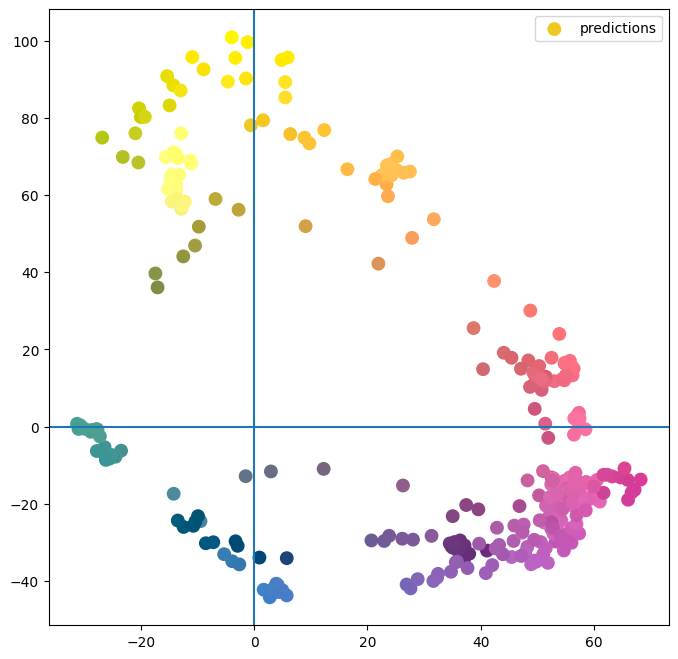

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
ax.axvline(x=0)
ax.axhline(y=0)
ax.scatter(combined_df.a , combined_df.b , c=combined_df.color, s=80, label='predictions')
#ax.scatter(exp_batches['a'],exp_batches['b'], c=color_list_exp, marker='^', edgecolors='black', s=80, label='experimental batches')
#ax.scatter(gen_data['a'], gen_data['b'], c=color_list_gen, marker='s', edgecolors='black', s=80, label='generative model')
plt.legend()

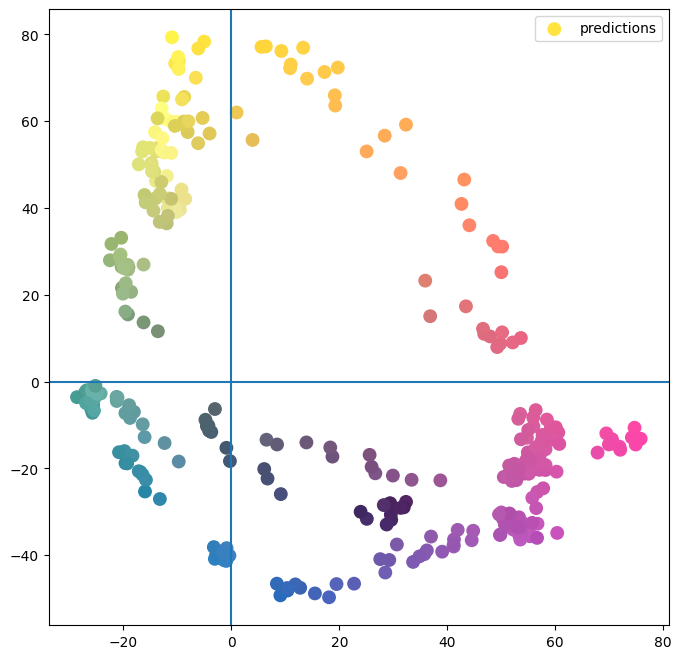

In [ ]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
ax.axvline(x=0)
ax.axhline(y=0)
ax.scatter(combined_df.a , combined_df.b , c=combined_df.color, s=80, label='predictions')
#ax.scatter(exp_batches['a'],exp_batches['b'], c=color_list_exp, marker='^', edgecolors='black', s=80, label='experimental batches')
#ax.scatter(gen_data['a'], gen_data['b'], c=color_list_gen, marker='s', edgecolors='black', s=80, label='generative model')
plt.legend()

In [ ]:
zinc=pd.read_csv('/content/zinc20_suggestions.csv')
zinc.smiles_B.values
zinc_smiles = zinc.smiles_B.str.replace('*', 'C').values
zinc_smiles

In [ ]:
zinc20_smiles = zinc.smiles_B.values

In [ ]:
!pip install molplotly

In [ ]:
import pandas as pd
import plotly.express as px

import molplotly

# load a DataFrame with smiles

# generate a scatter plot
fig = px.scatter(combined_df, x="a", y="b")

# add molecules to the plotly graph - returns a Dash app
app = molplotly.add_molecules(fig=fig,
                            df=combined_df,
                            smiles_col='smiles1',
                            #title_col='Compound ID',
                           # hover_data=['smiles1']#, 'percentage_1', 'percentage_2']
                            )

# run Dash app inline in notebook (or in an external server)
app.run_server(mode='inline', port=8700, height=1000)

Dash is running on http://127.0.0.1:8700/



INFO:dash.dash:Dash is running on http://127.0.0.1:8700/



<IPython.core.display.Javascript object>